# Homework Assignment #1

In this homework, we will implement a few core CNN blocks and practice training neural networks by following the guidance step by step. The model to implement is similar to the [LeNet](http://yann.lecun.com/exdb/publis/pdf/lecun-01a.pdf). To do this some implementation sketch will be provided on which you can fill in your implementation.

![LeNet.png](attachment:LeNet.png)
Image Source: https://github.com/dsgiitr/d2l-pytorch/blob/master/img/lenet.png

In the following, we first import the basic packages. Feel free to add other packages if necessary.
**Note**: The only allowed deep learning framework is PyTorch. Please use Python 3.6 or newer verions and PyTorch 1.3 or newer verions for this homework.

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import matplotlib.pyplot as plt
import torchvision.utils as vutils
import numpy as np
import time
import math
from torch.nn import init

The following is a sketch of the LeNet class which you will be filling in step-by-step. For now, you don't need to do anything with the following code.

In [2]:
# LeNet sketch code
class LeNet(nn.Module):
  def __init__(self):
    super(LeNet, self).__init__()
    """
    self.c1 = Conv2D()
    self.p2 = nn.AvgPool(2, stride=2)
    self.c3 = Conv2D()
    self.p4 = nn.AvgPool(2, stride=2)
    self.c5 = Linear()
    self.f6 = Linear()
    """
    
    
  def forward(self, imgs, labels):
    """
    scores = self.net(imgs)
    o = softmax(scores)
    loss = objective(o, labels)
    """
    return loss

## Task 1: Implement Convolutional Layer

The first task is to implement a convolutional layer by completing the following Conv2D class. The class takes the number of input channels, the number of output channels, stride size, and padding values as inputs. 

**To-do**:
    - (10 points)Implement code in-between (### start your code here ### and ### End of the code ###)

In [3]:
class Conv2D(nn.Module):
  def __init__(self, dim_in, dim_out, kernel_size, stride, padding, device):
    super(Conv2D, self).__init__()
    """
    inputs:
      dim_in: integer, number of channels in the input
      dim_out: integer, number of channels produced by the convolution
      kernel_size: integer list of length 2, spatial size of the convolving kernel
      stride: integer list of length 2, stride of the convolution along the the height dimension and width dimension
      padding: integers list of length 4, zero-padding added to both sides of the height dimension and width dimension
      
    """
    # initialize kernel and bias
    self.kernel = nn.Parameter(torch.randn([dim_out, dim_in]+kernel_size, dtype=torch.float32, device=device)*0.1, requires_grad=True)
    # self.kernel = (nn.Parameter(torch.randn([dim_out, dim_in]+kernel_size, dtype=torch.float32, device='cpu')*0.1, requires_grad=True)).cuda()
    self.bias = nn.Parameter(torch.zeros([dim_out], dtype=torch.float32, device=device), requires_grad=True)
    #print(self.bias)
    self.dim_in = dim_in
    self.dim_out = dim_out
    
    self.kernel_size = kernel_size
    self.stride = stride
    self.padding = padding
    self.device = device
    
  # converting image to column(matrix) and flattening the kernel so that the convolution operation becomes
  # becomes matrix multiplication which makes the whole process much faster
  def conv2d_forward(self, X):
    
#     print('conv forward')
    
    start=time.time()
    """
    inputs:
      X: input images
    outputs:
      Y: output produced by the convolution
    """
    device=self.device
    ###  Star your code here ###
    
    # Finding the width and height of the output of Conv2D layer
    H_padded_in = X.shape[2]+self.padding[0]+self.padding[1]
    W_padded_in = X.shape[3]+self.padding[2]+self.padding[3]    
    H_out = int((H_padded_in-self.kernel_size[0])/self.stride[0]) + 1
    W_out = int((W_padded_in-self.kernel_size[1])/self.stride[1]) + 1
    
    # converting image to column
    im2col=torch.nn.Unfold(kernel_size=self.kernel_size,padding=self.padding[0],stride=self.stride)
    im2col=im2col(X)
    
    # flattening the kernel
    kernel=self.kernel.reshape([self.dim_out,1,-1])
    #print(self.kernel)
    answer=torch.tensor([],device=device)
    
    # getting the output for each image and appending it to the output
    for i in range(im2col.shape[0]):
        temp=torch.matmul(kernel,im2col[i])
        temp=temp+self.bias.reshape([self.dim_out,1,1])
#         print(temp.shape)
#         print(temp[0])
#         print(temp[1])
        answer=torch.cat([answer,temp])
    
    
    #print(answer.reshape([X.shape[0],self.dim_out,H_out,W_out]))
    
    # reshaping the answer to the output form
    answer=answer.reshape([X.shape[0],self.dim_out,H_out,W_out])

    return answer

        
  def forward(self, x):
    return self.conv2d_forward(x)

## Conv2D Correctness Check

Run the correctness checking code. If your implementation is correct, you should be able to see the output as follows:
```python
tensor([[[[ 1.0519,  1.3811],
          [ 2.5701,  2.0508]],

         [[ 1.3159,  2.4203],
          [ 8.4296, 10.1662]]],


        [[[ 4.4640,  5.9235],
          [ 4.5179,  2.3144]],

         [[13.1246, 15.5932],
          [20.2635, 22.9700]]]], grad_fn=<AddBackward0>)
```

In [4]:
# correctness checking
torch.random.manual_seed(0)
#torch.backends.cudnn.benchmark=True
#torch.cuda.random.manual_seed(0)
x = torch.arange(50,device='cpu').view(2,1,5,5).float()
my_conv = Conv2D(1,2,[3,3],[3,3],[1,1,1,1], torch.device('cpu'))
y = my_conv(x)
print(y)

tensor([[[[ 1.0519,  1.3811],
          [ 2.5701,  2.0508]],

         [[ 1.3159,  2.4203],
          [ 8.4296, 10.1662]]],


        [[[ 4.4640,  5.9235],
          [ 4.5179,  2.3144]],

         [[13.1246, 15.5932],
          [20.2635, 22.9700]]]], grad_fn=<AsStridedBackward>)


## Guide: Pooling Layer

We will not implement the pooling layer. Instead, we will use the Pytorch API (torch.nn.AvgPool2d). Feel free to implement it by yourself (if you want). For the detail information about the pooling API, check the [documents](https://pytorch.org/docs/1.3.1/nn.html#avgpool2d).

## Task 2: Implementing Linear Layer

Complete the following linear layer module. To specify a linear layer, input dimension and output dimension are provided. The linear layer performs the following computation: $y = xW^T+ b$.

**To-do**:
    - (5 points)Implement code in-between (### start your code here ### and ### End of the code ###)

In [5]:
class Linear(nn.Module):
  def __init__(self, dim_in, dim_out, device):
    super(Linear, self).__init__()
    
    self.weights = nn.Parameter(torch.randn([dim_out, dim_in], dtype=torch.float32, device=device)*0.1, requires_grad=True)
    # self.weights = (nn.Parameter(torch.randn([dim_out, dim_in], dtype=torch.float32, device='cpu')*0.1, requires_grad=True)).cuda()
    
    self.bias = nn.Parameter(torch.zeros([dim_out], dtype=torch.float32, device=device), requires_grad=True)
    self.dim_out = dim_out
    self.device = device
    
  def linear_forward(self, X):
    """
    inputs:
     X: tensor of shape (batch_size, *, dim_in)
    outputs:
     Y: tensor of shape (batch_size, *, dim_out)
    """
    
    ###  Star your code here ### 
    
    Y = torch.matmul(X,self.weights.T)+self.bias  
    #print('linear forward')
    ###  End of the code ###
    return Y
  
  def forward(self, X):
    #print(X.cuda())
    return self.linear_forward(X)

## Linear Correctness Check

Run the following correctness checking code. If your implementation is correct, you should be able to see the output as follows:
```python
tensor([[ -2.1595,  -0.2037,   1.8567],
        [ -6.9537,   0.7306,   2.5298],
        [-11.7479,   1.6648,   3.2028],
        [-16.5422,   2.5991,   3.8759],
        [-21.3364,   3.5334,   4.5489]], grad_fn=<AddBackward0>)
```

In [6]:
# correctness checking
torch.random.manual_seed(0)
x = torch.arange(50).view(5, 10).float()
my_linear = Linear(10, 3, torch.device('cpu'))
y = my_linear(x)
print(y)

tensor([[ -2.1595,  -0.2037,   1.8567],
        [ -6.9537,   0.7306,   2.5298],
        [-11.7479,   1.6648,   3.2028],
        [-16.5422,   2.5991,   3.8759],
        [-21.3364,   3.5334,   4.5489]], grad_fn=<AddBackward0>)


## Task 3: Loss Functions and SGD

The loss function for classification task is the Cross-Entropy Loss. For this, we need to implement the softmax output layer first and then the cross-entropy loss.

Softmax function normalizes the output so that its sum becomes 1 and each output is nonnegative:

$$
\hat{\mathbf{y}} = \text{softmax}(\mathbf{o}),\text{ where } \hat{y}_i = \frac{\text{exp}(o_i)}{\sum_j \text{exp}(o_j)}
$$

Cross-Entropy Loss is as the objective function for this classification task. When the loss is minimized, the likelihood function will be maximized:

$$
l = -\log{P(y \mid x)} = -\sum_j y_j\log{\hat{y}_j}
$$

**To-do**:
    - (10 points)Complete the function **softmax1d()**.
    - (10 points)Complete the function **cross_entropy_loss()**.

Note that you should implement the function using primative PyTorch APIs such as exp() and matmul(), instead of simply using pythor API for softmax and cross_entropy_loss.

In [7]:
def softmax1d(scores):
  """
  inputs:
    scores: (N, C), predicted scores for each input, where N is the number of samples and C is the number of
            classes.
  outputs:
    p: (N, C), probability distribution over classes. Converted from input (scores) with a softmax operation.
    
  Note: Do be careful of the numerial error!
  """
  ###  Star your code here ###
  # print(scores.shape)
  mx = torch.max(scores,axis=1,keepdim=True).values
  # print(mx)
  scores = scores - mx
  # print(scores)
  Exp = torch.exp(scores)
  # print(Exp)
  Sum = Exp.sum(axis=1, keepdim=True)
  # print(Sum)
  p = torch.div(Exp,Sum)
  ###  End of the code ###
  
  return p

def cross_entropy_loss(pred_score, labels):
  """
  inputs:
    pred_score: (N, C), probaility distribution or pred_scores over classes, where N is the number of samples and C is the number of
      classes.
  outputs:
    loss: (N,), cross entropy loss for each sample.

  Note: Do be careful of the numerial error!
  """
  ###  Star your code here ### 
  log_pred_score = torch.log(pred_score+(1e-5))
  # print(log_pred_score.shape)
  # print(labels.shape)
  labels = torch.reshape(labels,(-1,1))
  loss = -torch.sum(log_pred_score.gather(1,labels),axis=1)
  ###  End of the code ###

#   m=labels.shape[0]
#   p=pred_score

#   log_likelihood=-torch.log(pred_score[range(m),labels]+(1e-5))
#   loss=torch.sum(log_likelihood)/m
  
  return loss.mean()

In [8]:
a = torch.arange(9).view(3,3).float()
a = a-torch.max(a,axis=1,keepdim=True).values
# torch.max(a,axis=1).values
# print(b)
# print(torch.exp(a)/b)
pred_score = softmax1d(a)
labels = torch.tensor([0,1,2])
print("My cross entropy loss function's loss")
print(cross_entropy_loss(pred_score,labels))
print()
print("Inbuilt cross entropy loss function's loss")
print(torch.nn.CrossEntropyLoss()(a,labels))

My cross entropy loss function's loss
tensor(1.4076)

Inbuilt cross entropy loss function's loss
tensor(1.4076)


**To-do**:
    - (10 points)Next task is to implement the update rule of stochastic gradient descent. Complete the following function.

In [9]:
from joblib import Parallel, delayed

def step(weights, grad, lr):
  """
  inputs:
    weights: list of learnable parameters
    grad: list of gradient of the loss w.r.t the learnable parameters
    lr: learning rate for gradient descent
  outputs:
    None. Make sure updating the weights with in-place operation, e.g. tensor.add_(). No output need be returned.
  """
  ###  Star your code here ### 
  #print(grad)
  # print('Weights')
  # print(type(weights))
  # print('LR')
  # print(type(lr))
  # print('Grad')
  # print(type(grad))

  # updating the weights parallelly
#   def step_parallel(i):
#     weights[i].data.sub_(grad[i].data*lr)

#   Parallel(n_jobs=4)(delayed(step_parallel)(i) for i in range(len(grad)))
  
#   for i,p in enumerate(net.parameters()):
#     print('before')
#     print(p)
#     print('grad')
#     print(grad[i])
#     p.data.sub_(grad[i].data*lr)
#     print('after')
#     print(p)
  
  for i in range(0,len(grad)):
    #print(grad[i])
    #weights[i].data-=grad[i].data*lr
    weights[i].data.sub_(grad[i].data*lr)
# #   return weights
  ###  End of the code ###

## Task 4: LeNet Forward Pass

Using the above components required to implement the LeNet, we can complete the LeNet class as follows. 

**To-do**:
    - (20 points)Complete the function **forward()** which takes the input images and labels and outputs the cross-entropy loss (for the batch) and predicted distribution. For more details, refer to the comments below.

In [10]:
# LeNet sketch code
class LeNet(nn.Module):
  def __init__(self, img_c, device):
    super(LeNet, self).__init__()
    self.c1 = Conv2D(img_c, 6, [5,5], [1,1], [2,2,2,2], device)
    #self.c1 = torch.nn.Conv2d(in_channels=img_c, out_channels=6, kernel_size=[5,5], stride=[1,1], padding=2)
    self.p2 = nn.MaxPool2d(2, stride=2)
    self.c3 = Conv2D(6, 16, [5,5], [1,1], [0,0,0,0], device)
    #self.c3 = torch.nn.Conv2d(in_channels=6, out_channels=16, kernel_size=[5,5], stride=[1,1], padding=0)
    self.p4 = nn.MaxPool2d(2, stride=2)
    self.f5 = Linear(400, 120, device)
    self.f6 = Linear(120, 84, device)
    self.f7 = Linear(84, 10, device)
    self.device = device
    
    
  def forward(self, imgs, labels):
    """
    inputs:
      imgs: (N, C, H, W), training samples from the MNIST training set, where N is the number of samples (batch_size),
          C is the image color channle number, H and W are the spatial size of the input images.
      labels: (N, L), ground truth for the input images, where N is the number of samples (batch_size) and L is the 
          number of classes.
    outputs:
      loss: (1,), mean loss value over this batch of inputs.
    
    """
    N = imgs.shape[0]
    
    o_c1 = F.relu(self.c1(imgs))
    #o_c1 = F.relu(self.c1(imgs.cpu()))
    o_p2 = self.p2(o_c1)
    o_c3 = F.relu(self.c3(o_p2))
    #o_c3 = F.relu(self.c3(o_p2.cpu()))
    o_p4 = self.p4(o_c3)
    o_p4 = torch.reshape(o_p4,(o_p4.shape[0],-1)).to(self.device)
    #o_p4 = torch.tensor(o_p4,device='cuda')

    
    
    ### Start the code here  ###
    # 1. Please complete the rest of LeNet to get the scores predicted by LeNet for each input images #
    
    o_f5 = self.f5(o_p4)
    o_f6  = self.f6(o_f5)
    o_f7 = self.f7(o_f6)

    
    # 2. Please use the implemented objective function to obtain the losses of each input. #
    
    
    p = softmax1d(o_f7)
    loss = cross_entropy_loss(p,labels)

    # print(loss)

  
    # 3. We will return the mean value of the losses. #
    
  
    ###  End of the code ###
    return loss.mean(), p

## Guide:  Dataset Preparation

We use MNIST dataset to train the LeNet. Run the following cell to get the dataset ready for the training. Change the data_path to a proper one.

In [11]:
import os
import urllib.request

data_path = './CS536_MNIST/'
if not os.path.exists(data_path):
  os.mkdir(data_path)
  print("Starting downloading MNIST to {}".format(data_path))
  
  import urllib
  dataset_dict = {
        'train_images': "http://yann.lecun.com/exdb/mnist/train-images-idx3-ubyte.gz",
        'train_labels': "http://yann.lecun.com/exdb/mnist/train-labels-idx1-ubyte.gz",
        'test_images': "http://yann.lecun.com/exdb/mnist/t10k-images-idx3-ubyte.gz",
        'test_labels': "http://yann.lecun.com/exdb/mnist/t10k-labels-idx1-ubyte.gz",}

  for f, url in dataset_dict.items():
    urllib.request.urlretrieve(url, data_path + f)

The class dataset has been provided below. More about PyTorch Dataset can be found [here](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html#dataset-class). Please run the following Jupyter cell to make sure the dataset is ready for training.

In [12]:
train_img_file = data_path + 'train_images'
train_lb_file = data_path + 'train_labels'
test_img_file = data_path + 'test_images'
test_lb_file = data_path + 'test_labels'

class MNISTDataset(Dataset):
  def __init__(self, ds_size=10000, split='training'):
    self.split = split
    if self.split == 'training':
      img_file = train_img_file
      lb_file = train_lb_file
      n_samples = 60000
    else:
      img_file = test_img_file
      lb_file = test_lb_file
      n_samples = 10000
    self.ds_size = ds_size
      
    import gzip
    with gzip.open(img_file, 'rb') as f:
      imgs = f.read()
    imgs = np.frombuffer(imgs[16:], dtype=np.uint8).astype(np.float32)
    with gzip.open(lb_file, 'rb') as f:
      lb = f.read()
    lbs = np.frombuffer(lb[8:], dtype=np.uint8).astype(np.float32)
    
    imgs = torch.tensor(imgs).view(n_samples, 1, 28, 28) - 125.
    lbs = torch.tensor(lbs).long()
    
    self.imgs = imgs[:ds_size]
    self.lbs= lbs[:ds_size]
    
  def __len__(self):
    return self.ds_size
  
  def __getitem__(self, idx):
    return self.imgs[idx], self.lbs[idx]
  

## Guide: Training for Overfitting

First, we will make our model overfit. It is a good practice to check if a model can overfit well (It should do it well in a proper setting. If not, your model may have some bug, the model complexity is too simple, or some training parameters like learning rate are not good.)

For this, we will first use only 1000 data points instead of the full dataset (smaller datasets makes models overfit more easily if the model complexity is fixed.)

We also use the  20% -split as the validation set. The dataset loading script is provided below.

In [13]:
dataset_size = 1000
validation_size = int(0.2 * 1000)

ds = MNISTDataset(ds_size=dataset_size)

# split the dataset into training set and validation set
train_ds, val_ds = torch.utils.data.random_split(ds, [dataset_size - validation_size, validation_size])

# training batch size, hyper-parameter
batch_size = 24

# dataset loader
train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True, drop_last=True)
val_dl = DataLoader(val_ds, batch_size=batch_size, shuffle=True, drop_last=True)
img_channel = 1

The training script is provided as follows. After $100$ epochs, you will see LeNet is overfitted as the validation error is a lot larger than the training error. Also, the classification accuracy is almost $100\%$ on the training set, while only around $70\%$ on the validation set.

The model didn't overfit after using the initial weights(i.e. kernel for Conv2D and weights for Linear) and bias set in this notebook, I then used the inbuilt torch.nn.Conv2d and torch.nn.Linear layers with the initial weights and bias used in this notebook and the model still didn't overfit after 100 epochs.

So I initialized the weights and bias through the methods used by the inbuilt PyTorch layers and as we can see the model is overfitted by 100 epochs. 


------------------
0
------------------
step 32, loss 6.089988708496094
Target:	 tensor([5, 8, 9, 7, 0, 2, 9, 1], device='cuda:0')
Pred:	 tensor([0, 7, 2, 6, 0, 6, 9, 2], device='cuda:0')


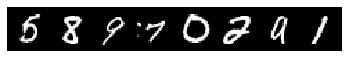

------------------
1
------------------
step 65, loss 4.532707214355469
Target:	 tensor([4, 7, 5, 1, 1, 9, 8, 7], device='cuda:0')
Pred:	 tensor([9, 9, 8, 4, 1, 2, 0, 3], device='cuda:0')


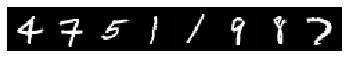

------------------
2
------------------
step 98, loss 3.173938274383545
Target:	 tensor([4, 4, 6, 7, 3, 9, 3, 0], device='cuda:0')
Pred:	 tensor([8, 9, 2, 3, 3, 8, 3, 0], device='cuda:0')


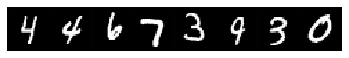

------------------
3
------------------
step 131, loss 2.3992552757263184
Target:	 tensor([9, 4, 1, 4, 4, 7, 0, 5], device='cuda:0')
Pred:	 tensor([5, 7, 5, 6, 6, 7, 1, 6], device='cuda:0')


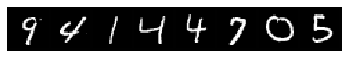

------------------
4
------------------
step 164, loss 1.6967767477035522
Target:	 tensor([7, 2, 2, 9, 9, 7, 5, 4], device='cuda:0')
Pred:	 tensor([7, 5, 1, 9, 5, 7, 7, 4], device='cuda:0')


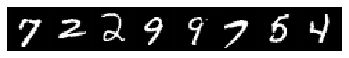

------------------
5
------------------
step 197, loss 1.997086524963379
Target:	 tensor([6, 4, 1, 8, 0, 9, 7, 7], device='cuda:0')
Pred:	 tensor([0, 5, 1, 9, 0, 9, 7, 7], device='cuda:0')


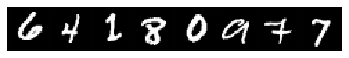

------------------
6
------------------
step 230, loss 1.6763172149658203
Target:	 tensor([0, 0, 1, 0, 9, 7, 1, 7], device='cuda:0')
Pred:	 tensor([0, 0, 1, 0, 8, 2, 1, 3], device='cuda:0')


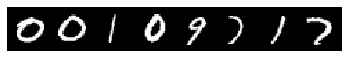

------------------
7
------------------
step 263, loss 0.8647700548171997
Target:	 tensor([3, 3, 6, 0, 7, 9, 7, 5], device='cuda:0')
Pred:	 tensor([3, 3, 6, 0, 7, 9, 7, 8], device='cuda:0')


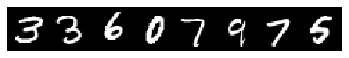

------------------
8
------------------
step 296, loss 1.1432397365570068
Target:	 tensor([6, 4, 1, 6, 5, 1, 6, 1], device='cuda:0')
Pred:	 tensor([5, 4, 3, 6, 5, 1, 2, 1], device='cuda:0')


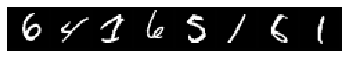

------------------
9
------------------
step 329, loss 1.0675811767578125
Target:	 tensor([3, 4, 7, 0, 3, 5, 1, 6], device='cuda:0')
Pred:	 tensor([3, 9, 7, 5, 3, 5, 1, 6], device='cuda:0')


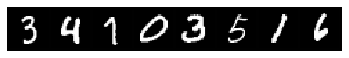

------------------
10
------------------
step 362, loss 0.8405507802963257
Target:	 tensor([7, 5, 0, 4, 7, 9, 5, 0], device='cuda:0')
Pred:	 tensor([7, 2, 0, 9, 7, 9, 5, 0], device='cuda:0')


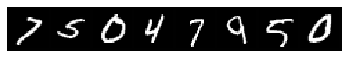

------------------
11
------------------
step 395, loss 0.5491944551467896
Target:	 tensor([4, 7, 3, 2, 8, 7, 5, 5], device='cuda:0')
Pred:	 tensor([9, 7, 3, 2, 8, 7, 5, 5], device='cuda:0')


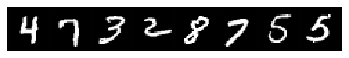

------------------
12
------------------
step 428, loss 0.67634117603302
Target:	 tensor([6, 3, 4, 0, 1, 4, 6, 5], device='cuda:0')
Pred:	 tensor([6, 3, 4, 2, 1, 4, 6, 5], device='cuda:0')


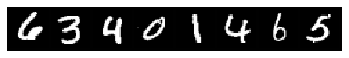

------------------
13
------------------
step 461, loss 0.45265454053878784
Target:	 tensor([7, 3, 8, 4, 8, 3, 0, 8], device='cuda:0')
Pred:	 tensor([7, 5, 8, 9, 8, 3, 0, 8], device='cuda:0')


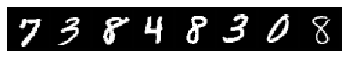

------------------
14
------------------
step 494, loss 0.5048018097877502
Target:	 tensor([2, 8, 3, 7, 5, 4, 1, 2], device='cuda:0')
Pred:	 tensor([1, 8, 3, 7, 5, 5, 1, 2], device='cuda:0')


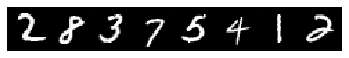

------------------
15
------------------
step 527, loss 0.3614586293697357
Target:	 tensor([4, 1, 6, 2, 7, 8, 5, 2], device='cuda:0')
Pred:	 tensor([4, 1, 6, 1, 7, 8, 5, 2], device='cuda:0')


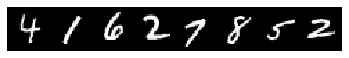

------------------
16
------------------
step 560, loss 0.6274003386497498
Target:	 tensor([9, 0, 9, 9, 7, 8, 2, 9], device='cuda:0')
Pred:	 tensor([9, 7, 9, 9, 7, 8, 2, 4], device='cuda:0')


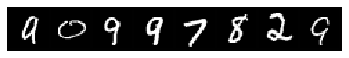

------------------
17
------------------
step 593, loss 0.6031616926193237
Target:	 tensor([0, 5, 3, 5, 7, 5, 2, 7], device='cuda:0')
Pred:	 tensor([0, 5, 7, 8, 9, 5, 2, 7], device='cuda:0')


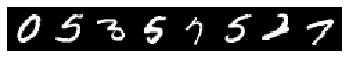

------------------
18
------------------
step 626, loss 0.14683371782302856
Target:	 tensor([9, 1, 6, 0, 5, 1, 9, 8], device='cuda:0')
Pred:	 tensor([9, 1, 6, 0, 5, 1, 9, 8], device='cuda:0')


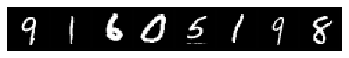

------------------
19
------------------
step 659, loss 0.46971702575683594
Target:	 tensor([9, 4, 0, 5, 6, 1, 7, 1], device='cuda:0')
Pred:	 tensor([9, 4, 0, 5, 6, 1, 7, 1], device='cuda:0')


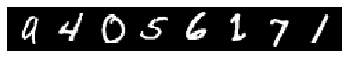

------------------
20
------------------
step 692, loss 0.14249247312545776
Target:	 tensor([5, 4, 6, 1, 4, 9, 2, 7], device='cuda:0')
Pred:	 tensor([5, 4, 6, 1, 4, 9, 2, 7], device='cuda:0')


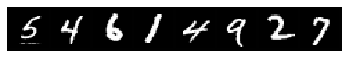

------------------
21
------------------
step 725, loss 0.6085927486419678
Target:	 tensor([6, 4, 5, 1, 2, 1, 0, 8], device='cuda:0')
Pred:	 tensor([6, 4, 5, 1, 1, 1, 0, 5], device='cuda:0')


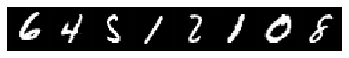

------------------
22
------------------
step 758, loss 0.3395320177078247
Target:	 tensor([0, 4, 3, 6, 4, 4, 5, 1], device='cuda:0')
Pred:	 tensor([0, 4, 3, 0, 4, 4, 5, 1], device='cuda:0')


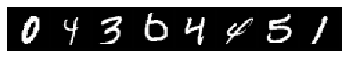

------------------
23
------------------
step 791, loss 0.22302109003067017
Target:	 tensor([8, 8, 5, 6, 2, 0, 1, 5], device='cuda:0')
Pred:	 tensor([8, 8, 5, 6, 2, 0, 1, 5], device='cuda:0')


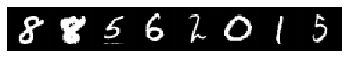

------------------
24
------------------
step 824, loss 0.5790759921073914
Target:	 tensor([1, 7, 6, 4, 8, 4, 1, 3], device='cuda:0')
Pred:	 tensor([1, 7, 6, 4, 8, 4, 1, 7], device='cuda:0')


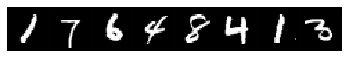

------------------
25
------------------
step 857, loss 0.18827605247497559
Target:	 tensor([2, 3, 8, 0, 3, 2, 7, 7], device='cuda:0')
Pred:	 tensor([2, 3, 8, 0, 3, 2, 7, 7], device='cuda:0')


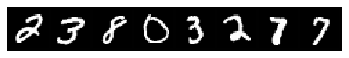

------------------
26
------------------
step 890, loss 0.3509955406188965
Target:	 tensor([7, 1, 7, 1, 0, 6, 9, 0], device='cuda:0')
Pred:	 tensor([7, 1, 7, 1, 0, 6, 9, 0], device='cuda:0')


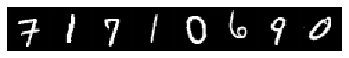

------------------
27
------------------
step 923, loss 0.11462807655334473
Target:	 tensor([7, 1, 4, 0, 4, 3, 6, 5], device='cuda:0')
Pred:	 tensor([7, 1, 4, 0, 4, 3, 6, 5], device='cuda:0')


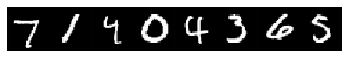

------------------
28
------------------
step 956, loss 0.28659722208976746
Target:	 tensor([4, 7, 5, 4, 9, 3, 8, 7], device='cuda:0')
Pred:	 tensor([4, 7, 5, 4, 9, 3, 8, 7], device='cuda:0')


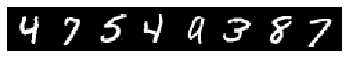

------------------
29
------------------
step 989, loss 0.29452085494995117
Target:	 tensor([9, 4, 8, 4, 8, 2, 4, 7], device='cuda:0')
Pred:	 tensor([9, 9, 8, 4, 8, 2, 4, 7], device='cuda:0')


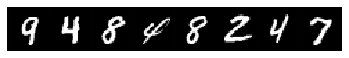

------------------
30
------------------
step 1022, loss 0.4561334550380707
Target:	 tensor([3, 1, 9, 9, 9, 5, 9, 8], device='cuda:0')
Pred:	 tensor([3, 1, 9, 9, 7, 5, 9, 8], device='cuda:0')


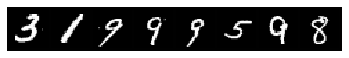

------------------
31
------------------
step 1055, loss 0.3547621965408325
Target:	 tensor([2, 4, 3, 8, 1, 7, 2, 6], device='cuda:0')
Pred:	 tensor([7, 4, 3, 8, 1, 4, 5, 6], device='cuda:0')


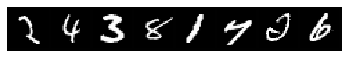

------------------
32
------------------
step 1088, loss 0.14994850754737854
Target:	 tensor([7, 3, 6, 0, 2, 4, 6, 0], device='cuda:0')
Pred:	 tensor([7, 3, 6, 0, 2, 4, 6, 0], device='cuda:0')


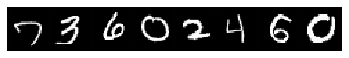

------------------
33
------------------
step 1121, loss 0.4109073579311371
Target:	 tensor([5, 8, 2, 2, 8, 8, 4, 0], device='cuda:0')
Pred:	 tensor([5, 8, 2, 2, 8, 8, 4, 0], device='cuda:0')


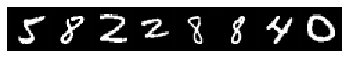

------------------
34
------------------
step 1154, loss 0.05241292715072632
Target:	 tensor([6, 0, 2, 0, 9, 9, 6, 4], device='cuda:0')
Pred:	 tensor([6, 0, 2, 0, 9, 9, 6, 4], device='cuda:0')


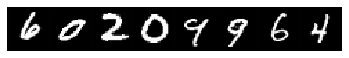

------------------
35
------------------
step 1187, loss 0.07913663983345032
Target:	 tensor([5, 7, 5, 7, 1, 0, 0, 4], device='cuda:0')
Pred:	 tensor([5, 7, 5, 7, 1, 0, 0, 4], device='cuda:0')


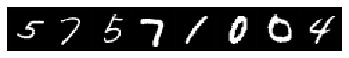

------------------
36
------------------
step 1220, loss 0.03975709527730942
Target:	 tensor([5, 2, 1, 2, 8, 5, 6, 6], device='cuda:0')
Pred:	 tensor([5, 2, 1, 2, 8, 5, 6, 6], device='cuda:0')


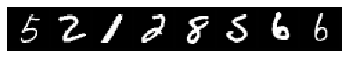

------------------
37
------------------
step 1253, loss 0.15036261081695557
Target:	 tensor([3, 2, 5, 8, 4, 9, 1, 6], device='cuda:0')
Pred:	 tensor([3, 2, 3, 8, 4, 9, 1, 6], device='cuda:0')


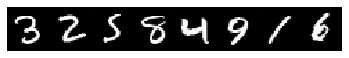

------------------
38
------------------
step 1286, loss 0.16529744863510132
Target:	 tensor([7, 9, 1, 7, 8, 0, 0, 7], device='cuda:0')
Pred:	 tensor([7, 9, 1, 7, 8, 0, 0, 7], device='cuda:0')


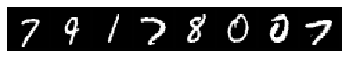

------------------
39
------------------
step 1319, loss 0.5925637483596802
Target:	 tensor([4, 8, 5, 4, 4, 0, 4, 9], device='cuda:0')
Pred:	 tensor([4, 8, 5, 6, 4, 0, 4, 9], device='cuda:0')


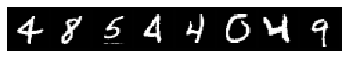

------------------
40
------------------
step 1352, loss 0.2073160856962204
Target:	 tensor([2, 4, 1, 4, 8, 3, 6, 5], device='cuda:0')
Pred:	 tensor([2, 4, 1, 4, 8, 3, 6, 5], device='cuda:0')


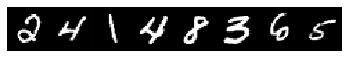

------------------
41
------------------
step 1385, loss 0.06514748185873032
Target:	 tensor([3, 9, 9, 2, 0, 5, 2, 5], device='cuda:0')
Pred:	 tensor([3, 9, 9, 2, 0, 5, 2, 5], device='cuda:0')


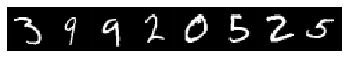

------------------
42
------------------
step 1418, loss 0.14025892317295074
Target:	 tensor([6, 7, 8, 3, 9, 7, 2, 7], device='cuda:0')
Pred:	 tensor([6, 7, 8, 3, 9, 7, 2, 7], device='cuda:0')


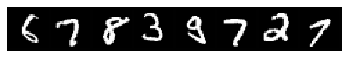

------------------
43
------------------
step 1451, loss 0.47608524560928345
Target:	 tensor([4, 8, 1, 0, 9, 1, 8, 1], device='cuda:0')
Pred:	 tensor([4, 8, 3, 0, 9, 1, 8, 1], device='cuda:0')


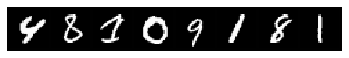

------------------
44
------------------
step 1484, loss 0.1378403902053833
Target:	 tensor([6, 0, 0, 6, 4, 3, 1, 6], device='cuda:0')
Pred:	 tensor([6, 0, 0, 6, 4, 3, 1, 6], device='cuda:0')


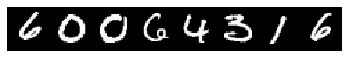

------------------
45
------------------
step 1517, loss 0.08115354180335999
Target:	 tensor([1, 6, 7, 7, 0, 1, 7, 8], device='cuda:0')
Pred:	 tensor([1, 6, 7, 7, 0, 1, 7, 8], device='cuda:0')


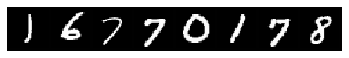

------------------
46
------------------
step 1550, loss 0.1076403483748436
Target:	 tensor([2, 8, 7, 2, 9, 7, 4, 5], device='cuda:0')
Pred:	 tensor([2, 8, 7, 2, 9, 8, 4, 5], device='cuda:0')


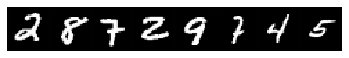

------------------
47
------------------
step 1583, loss 0.23334276676177979
Target:	 tensor([7, 3, 2, 1, 0, 9, 7, 0], device='cuda:0')
Pred:	 tensor([7, 3, 2, 1, 0, 9, 7, 0], device='cuda:0')


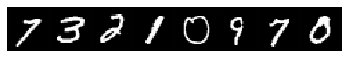

------------------
48
------------------
step 1616, loss 0.24629545211791992
Target:	 tensor([1, 0, 6, 7, 8, 5, 6, 0], device='cuda:0')
Pred:	 tensor([1, 0, 6, 7, 4, 5, 6, 0], device='cuda:0')


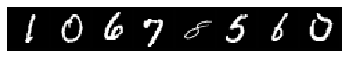

------------------
49
------------------
step 1649, loss 0.13458387553691864
Target:	 tensor([8, 9, 2, 9, 1, 7, 1, 6], device='cuda:0')
Pred:	 tensor([8, 9, 3, 9, 1, 7, 1, 6], device='cuda:0')


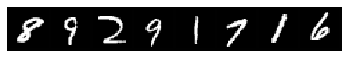

------------------
50
------------------
step 1682, loss 0.23898766934871674
Target:	 tensor([0, 7, 1, 7, 4, 5, 0, 5], device='cuda:0')
Pred:	 tensor([0, 7, 1, 7, 4, 5, 0, 5], device='cuda:0')


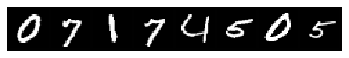

------------------
51
------------------
step 1715, loss 0.07790635526180267
Target:	 tensor([2, 1, 3, 1, 3, 4, 3, 1], device='cuda:0')
Pred:	 tensor([2, 1, 3, 1, 3, 4, 3, 1], device='cuda:0')


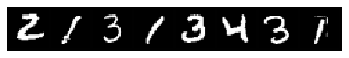

------------------
52
------------------
step 1748, loss 0.1972476691007614
Target:	 tensor([7, 2, 5, 0, 2, 3, 1, 3], device='cuda:0')
Pred:	 tensor([7, 2, 5, 0, 2, 3, 1, 3], device='cuda:0')


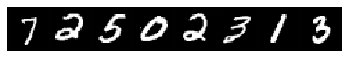

------------------
53
------------------
step 1781, loss 0.11539575457572937
Target:	 tensor([1, 7, 8, 9, 7, 7, 9, 0], device='cuda:0')
Pred:	 tensor([1, 7, 8, 9, 7, 7, 9, 0], device='cuda:0')


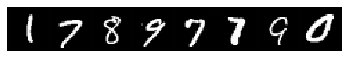

------------------
54
------------------
step 1814, loss 0.3092018961906433
Target:	 tensor([4, 3, 2, 9, 7, 3, 0, 3], device='cuda:0')
Pred:	 tensor([4, 3, 2, 9, 7, 3, 0, 2], device='cuda:0')


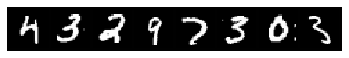

------------------
55
------------------
step 1847, loss 0.17655488848686218
Target:	 tensor([8, 2, 5, 9, 3, 8, 4, 3], device='cuda:0')
Pred:	 tensor([8, 2, 5, 9, 3, 8, 4, 3], device='cuda:0')


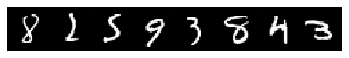

------------------
56
------------------
step 1880, loss 0.04018193110823631
Target:	 tensor([3, 9, 4, 9, 3, 1, 7, 3], device='cuda:0')
Pred:	 tensor([3, 9, 4, 9, 3, 1, 7, 3], device='cuda:0')


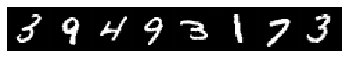

------------------
57
------------------
step 1913, loss 0.09177472442388535
Target:	 tensor([9, 0, 7, 2, 8, 1, 5, 6], device='cuda:0')
Pred:	 tensor([9, 0, 7, 2, 8, 1, 5, 6], device='cuda:0')


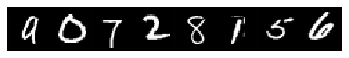

------------------
58
------------------
step 1946, loss 0.033695951104164124
Target:	 tensor([6, 4, 0, 1, 7, 6, 7, 0], device='cuda:0')
Pred:	 tensor([6, 4, 0, 1, 7, 6, 7, 0], device='cuda:0')


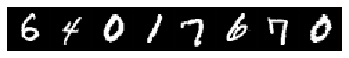

------------------
59
------------------
step 1979, loss 0.04959125071763992
Target:	 tensor([1, 4, 1, 1, 4, 7, 6, 5], device='cuda:0')
Pred:	 tensor([1, 4, 1, 1, 4, 7, 6, 5], device='cuda:0')


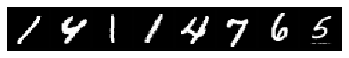

------------------
60
------------------
step 2012, loss 0.04915817081928253
Target:	 tensor([0, 3, 7, 7, 2, 6, 1, 9], device='cuda:0')
Pred:	 tensor([0, 3, 7, 7, 2, 6, 1, 9], device='cuda:0')


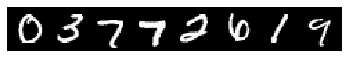

------------------
61
------------------
step 2045, loss 0.037062980234622955
Target:	 tensor([9, 3, 6, 8, 8, 2, 2, 9], device='cuda:0')
Pred:	 tensor([9, 3, 6, 8, 8, 2, 2, 9], device='cuda:0')


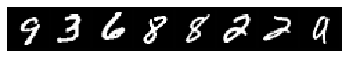

------------------
62
------------------
step 2078, loss 0.08444678038358688
Target:	 tensor([7, 8, 2, 2, 1, 5, 3, 3], device='cuda:0')
Pred:	 tensor([7, 8, 2, 2, 1, 5, 3, 3], device='cuda:0')


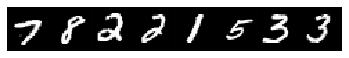

------------------
63
------------------
step 2111, loss 0.08302696794271469
Target:	 tensor([8, 1, 4, 1, 0, 9, 3, 8], device='cuda:0')
Pred:	 tensor([8, 1, 4, 1, 0, 9, 3, 8], device='cuda:0')


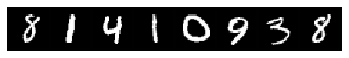

------------------
64
------------------
step 2144, loss 0.023305613547563553
Target:	 tensor([9, 5, 9, 4, 9, 3, 0, 2], device='cuda:0')
Pred:	 tensor([9, 5, 9, 4, 9, 3, 0, 2], device='cuda:0')


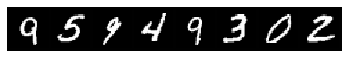

------------------
65
------------------
step 2177, loss 0.02673071250319481
Target:	 tensor([7, 3, 0, 4, 6, 4, 1, 2], device='cuda:0')
Pred:	 tensor([7, 3, 0, 4, 6, 4, 1, 2], device='cuda:0')


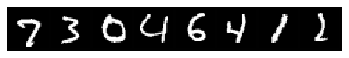

------------------
66
------------------
step 2210, loss 0.12271224707365036
Target:	 tensor([8, 5, 7, 1, 7, 0, 8, 3], device='cuda:0')
Pred:	 tensor([8, 5, 7, 1, 7, 0, 8, 3], device='cuda:0')


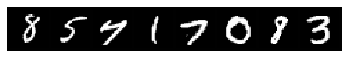

------------------
67
------------------
step 2243, loss 0.056853096932172775
Target:	 tensor([9, 2, 9, 9, 0, 2, 8, 0], device='cuda:0')
Pred:	 tensor([9, 2, 9, 9, 0, 2, 8, 0], device='cuda:0')


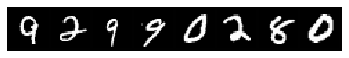

------------------
68
------------------
step 2276, loss 0.12231545895338058
Target:	 tensor([1, 6, 9, 8, 5, 4, 1, 7], device='cuda:0')
Pred:	 tensor([7, 6, 9, 8, 5, 4, 1, 7], device='cuda:0')


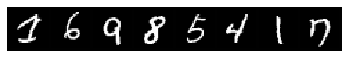

------------------
69
------------------
step 2309, loss 0.055123329162597656
Target:	 tensor([8, 1, 7, 9, 1, 7, 6, 6], device='cuda:0')
Pred:	 tensor([8, 1, 7, 9, 1, 7, 6, 6], device='cuda:0')


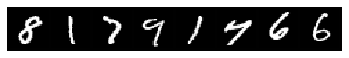

------------------
70
------------------
step 2342, loss 0.025531750172376633
Target:	 tensor([0, 7, 7, 7, 3, 5, 6, 6], device='cuda:0')
Pred:	 tensor([0, 7, 7, 7, 3, 5, 6, 6], device='cuda:0')


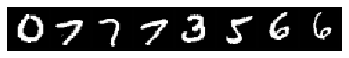

------------------
71
------------------
step 2375, loss 0.03302238881587982
Target:	 tensor([2, 6, 8, 2, 1, 6, 9, 8], device='cuda:0')
Pred:	 tensor([2, 6, 8, 2, 1, 6, 9, 8], device='cuda:0')


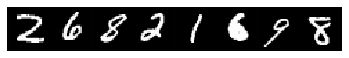

------------------
72
------------------
step 2408, loss 0.04537060111761093
Target:	 tensor([0, 7, 0, 7, 5, 2, 5, 4], device='cuda:0')
Pred:	 tensor([0, 7, 0, 7, 5, 2, 5, 4], device='cuda:0')


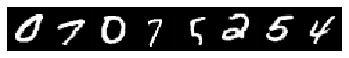

------------------
73
------------------
step 2441, loss 0.03894644230604172
Target:	 tensor([2, 1, 2, 6, 0, 7, 3, 2], device='cuda:0')
Pred:	 tensor([2, 1, 2, 6, 0, 7, 3, 2], device='cuda:0')


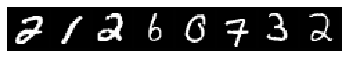

------------------
74
------------------
step 2474, loss 0.030482914298772812
Target:	 tensor([3, 5, 8, 9, 6, 7, 8, 7], device='cuda:0')
Pred:	 tensor([3, 5, 8, 9, 6, 7, 8, 7], device='cuda:0')


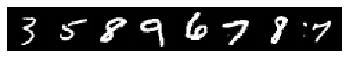

------------------
75
------------------
step 2507, loss 0.10372321307659149
Target:	 tensor([7, 4, 3, 0, 0, 3, 7, 2], device='cuda:0')
Pred:	 tensor([7, 4, 3, 0, 0, 3, 7, 2], device='cuda:0')


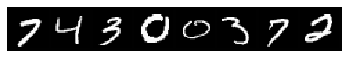

------------------
76
------------------
step 2540, loss 0.05420538783073425
Target:	 tensor([4, 3, 4, 6, 2, 7, 8, 8], device='cuda:0')
Pred:	 tensor([4, 3, 4, 6, 2, 7, 8, 8], device='cuda:0')


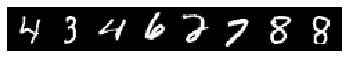

------------------
77
------------------
step 2573, loss 0.1639837622642517
Target:	 tensor([7, 4, 4, 8, 2, 1, 5, 8], device='cuda:0')
Pred:	 tensor([7, 4, 6, 8, 2, 1, 5, 8], device='cuda:0')


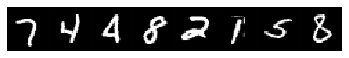

------------------
78
------------------
step 2606, loss 0.03142565116286278
Target:	 tensor([8, 1, 0, 5, 9, 5, 3, 6], device='cuda:0')
Pred:	 tensor([8, 1, 0, 5, 9, 5, 3, 6], device='cuda:0')


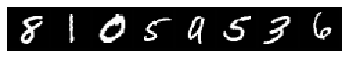

------------------
79
------------------
step 2639, loss 0.021607335656881332
Target:	 tensor([7, 3, 3, 7, 1, 7, 8, 1], device='cuda:0')
Pred:	 tensor([7, 3, 3, 7, 1, 7, 8, 1], device='cuda:0')


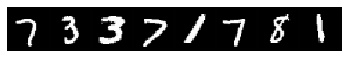

------------------
80
------------------
step 2672, loss 0.1311277151107788
Target:	 tensor([3, 7, 1, 7, 7, 3, 5, 4], device='cuda:0')
Pred:	 tensor([3, 7, 1, 7, 7, 3, 5, 4], device='cuda:0')


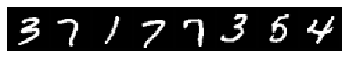

------------------
81
------------------
step 2705, loss 0.07624965906143188
Target:	 tensor([1, 2, 1, 5, 9, 4, 6, 0], device='cuda:0')
Pred:	 tensor([1, 2, 1, 5, 9, 4, 6, 0], device='cuda:0')


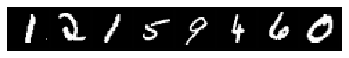

------------------
82
------------------
step 2738, loss 0.052093878388404846
Target:	 tensor([0, 8, 1, 2, 1, 4, 7, 4], device='cuda:0')
Pred:	 tensor([0, 8, 1, 2, 1, 4, 7, 4], device='cuda:0')


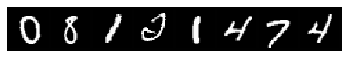

------------------
83
------------------
step 2771, loss 0.04437670111656189
Target:	 tensor([8, 2, 4, 7, 4, 4, 4, 2], device='cuda:0')
Pred:	 tensor([8, 2, 4, 7, 4, 4, 4, 2], device='cuda:0')


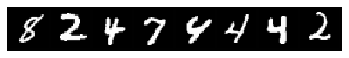

------------------
84
------------------
step 2804, loss 0.09183113276958466
Target:	 tensor([2, 0, 6, 7, 1, 1, 9, 3], device='cuda:0')
Pred:	 tensor([2, 0, 6, 7, 1, 1, 9, 3], device='cuda:0')


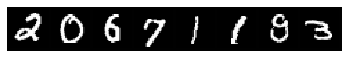

------------------
85
------------------
step 2837, loss 0.038068488240242004
Target:	 tensor([6, 0, 4, 7, 8, 0, 3, 0], device='cuda:0')
Pred:	 tensor([6, 0, 4, 7, 8, 0, 3, 0], device='cuda:0')


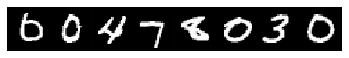

------------------
86
------------------
step 2870, loss 0.10101740062236786
Target:	 tensor([3, 1, 6, 3, 7, 2, 0, 0], device='cuda:0')
Pred:	 tensor([3, 1, 6, 3, 7, 2, 0, 0], device='cuda:0')


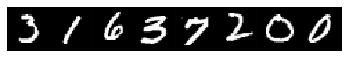

------------------
87
------------------
step 2903, loss 0.07488571107387543
Target:	 tensor([1, 7, 4, 2, 2, 5, 2, 4], device='cuda:0')
Pred:	 tensor([1, 7, 4, 2, 2, 5, 2, 4], device='cuda:0')


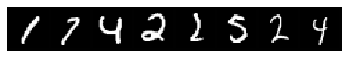

------------------
88
------------------
step 2936, loss 0.07552482932806015
Target:	 tensor([0, 4, 8, 2, 3, 7, 2, 5], device='cuda:0')
Pred:	 tensor([0, 4, 8, 2, 3, 7, 2, 5], device='cuda:0')


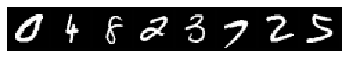

------------------
89
------------------
step 2969, loss 0.0213991217315197
Target:	 tensor([5, 1, 3, 6, 1, 3, 2, 4], device='cuda:0')
Pred:	 tensor([5, 1, 3, 6, 1, 3, 2, 4], device='cuda:0')


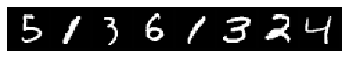

------------------
90
------------------
step 3002, loss 0.017604928463697433
Target:	 tensor([2, 9, 1, 4, 5, 6, 7, 8], device='cuda:0')
Pred:	 tensor([2, 9, 1, 4, 5, 6, 7, 8], device='cuda:0')


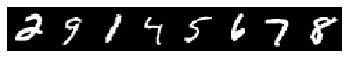

------------------
91
------------------
step 3035, loss 0.03161726891994476
Target:	 tensor([8, 4, 7, 0, 3, 1, 1, 6], device='cuda:0')
Pred:	 tensor([8, 4, 7, 0, 3, 1, 1, 6], device='cuda:0')


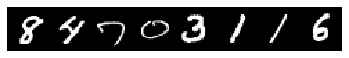

------------------
92
------------------
step 3068, loss 0.0276529248803854
Target:	 tensor([3, 4, 9, 8, 9, 1, 4, 4], device='cuda:0')
Pred:	 tensor([3, 4, 9, 8, 9, 1, 4, 4], device='cuda:0')


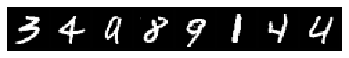

------------------
93
------------------
step 3101, loss 0.02331240102648735
Target:	 tensor([8, 1, 7, 8, 4, 0, 2, 0], device='cuda:0')
Pred:	 tensor([8, 1, 7, 8, 4, 0, 2, 0], device='cuda:0')


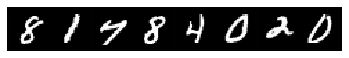

------------------
94
------------------
step 3134, loss 0.03576924651861191
Target:	 tensor([1, 5, 3, 6, 8, 1, 4, 7], device='cuda:0')
Pred:	 tensor([1, 5, 3, 6, 8, 1, 4, 7], device='cuda:0')


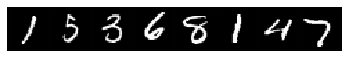

------------------
95
------------------
step 3167, loss 0.02080211602151394
Target:	 tensor([3, 3, 7, 1, 8, 5, 4, 4], device='cuda:0')
Pred:	 tensor([3, 3, 7, 1, 8, 5, 4, 4], device='cuda:0')


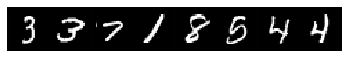

------------------
96
------------------
step 3200, loss 0.016221506521105766
Target:	 tensor([1, 2, 4, 0, 6, 0, 2, 4], device='cuda:0')
Pred:	 tensor([1, 2, 4, 0, 6, 0, 2, 4], device='cuda:0')


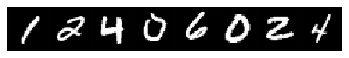

------------------
97
------------------
step 3233, loss 0.03100985288619995
Target:	 tensor([2, 7, 3, 1, 3, 6, 8, 1], device='cuda:0')
Pred:	 tensor([2, 7, 3, 1, 3, 6, 8, 1], device='cuda:0')


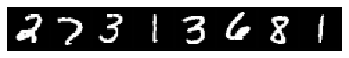

------------------
98
------------------
step 3266, loss 0.04252522438764572
Target:	 tensor([8, 7, 0, 6, 1, 7, 3, 5], device='cuda:0')
Pred:	 tensor([8, 7, 0, 6, 1, 7, 3, 5], device='cuda:0')


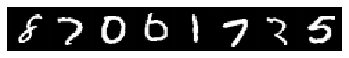

------------------
99
------------------
step 3299, loss 0.02955460175871849
Target:	 tensor([5, 6, 6, 7, 7, 7, 7, 9], device='cuda:0')
Pred:	 tensor([5, 6, 6, 7, 7, 7, 7, 9], device='cuda:0')


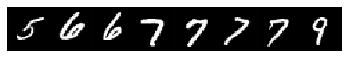

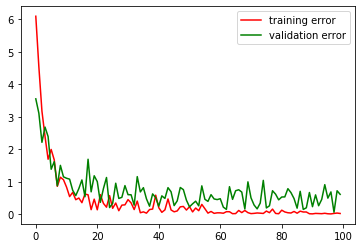

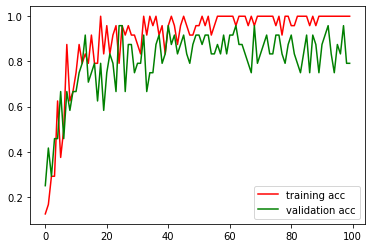

In [14]:
# learning rate, hyper-parameter
lr = 1e-4

# using GPU if it's availble
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


net = LeNet(img_channel, device)
# keep a list of moel parameters

params=[p for p in net.parameters()]

# initializing the weights and bias through the methods used by the inbuilt PyTorch layers
for i,(n,p) in enumerate(net.named_parameters()):
    #print(n)
    if n=='c1.bias' or n=='c3.bias':
        fan_in, _ = init._calculate_fan_in_and_fan_out(params[i-1].data)
        bound = 1 / math.sqrt(fan_in)
        init.uniform_(p.data, -bound, bound)
    if 'weights' in n:
        stdv = 1. / math.sqrt(p.size(1))
        p.data.uniform_(-stdv, stdv)
    if 'f' in n and 'bias' in n:
        stdv = 1. / math.sqrt(params[i-1].size(1))
        p.data.uniform_(-stdv, stdv)
#print(net.c1.kernel)
# training epochs, hyper-parameter


epochs = 100

# keep tracking of the changing of loss and accuracy of predictions
train_loss_list = []
val_loss_list = []
train_acc_list = []
val_acc_list = []

# the printing frequency, feel free to change this
print_interval = 50
for e in range(epochs):
  net.train()
  print('------------------')
  print(e)
  print('------------------')
        
  for i, (imgs, lbs) in enumerate(train_dl):
    imgs = imgs.to(device)
    lbs = lbs.to(device)
    # print('labels')
    # print(lbs)
    loss, prob = net.forward(imgs, lbs)

    # print('loss')
    # print(loss)
    # print('prob')
    # print(prob)

    net.zero_grad()
    grad = torch.autograd.grad(loss, [p for p in net.parameters()])
    
    
    # update weights
    step([p for p in net.parameters()], grad, lr)
    
    # obtain the predictions
    pred = prob.argmax(dim=-1).view(batch_size)
    acc = (pred == lbs).float().mean()
    
    
    
    
      
  train_loss_list.append(loss.detach().mean())
  train_acc_list.append(acc.detach().mean())
  
  print("step {}, loss {}".format(i + e*len(train_dl), loss))
  print("Target:\t {}\nPred:\t {}".format(lbs[:8], pred[:8]))
  # visualize some samples
  imgs_to_vis = vutils.make_grid(imgs[:8].cpu()+125., nrow=8, pad_value=1)
  plt.imshow(imgs_to_vis.permute(1,2,0).numpy().astype(np.uint8))
  plt.axis("off")
  plt.show()

  net.eval()
  for i, (imgs, lbs) in enumerate(val_dl):
    imgs = imgs.to(device)
    lbs = lbs.to(device)
    loss, prob = net(imgs, lbs)
    
    pred = prob.argmax(dim=-1).view(batch_size)
    acc = (pred == lbs).float().mean()
    
  val_loss_list.append(loss.detach().mean())
  val_acc_list.append(acc.detach().mean())
  

# ploting logs
plt.plot(np.arange(epochs), train_loss_list, '-r',
         np.arange(epochs), val_loss_list, '-g')
plt.legend(('training error', 'validation error'))
plt.show()
plt.plot(np.arange(epochs), train_acc_list, '-r',
         np.arange(epochs), val_acc_list, '-g')
plt.legend(('training acc', 'validation acc'))
plt.show()

## Guide: Model Saving and Loading

Once the training is completed, we can save the model on disk for evaluation or future use. It is also helpful to save the model regularly in case of unexcepted situations. Below is the snippet of how to save and load a model. More information can be found [here](https://pytorch.org/tutorials/beginner/saving_loading_models.html). You will be asked to evaluate your LeNet in the end.
```python
```

In [ ]:
# Saving a model on disk:
torch.save(net.state_dict(), 'LeNet_MNIST.pth')

# Loading a model from disk:
net = LeNet(1,'cuda')
net.load_state_dict(torch.load('LeNet_MNIST.pth'))

## Task 5: Weight Decay

As we can see, LeNet now is overfitted on this 1k dataset. Instead of providing more data, we can use Weight Decay to improve its generalization ability.

**To-dos**: 
    - (5 points)Write the dataset loading script, training script
    - (5 points)Add **weights penalty** into the loss function.
    - (10 points)Train LeNet from scratch.
    - (10 points)Plot out the training loss curve, validation loss curve, training accuracy curve, and validation accuracy curve as those plots in the above section.

I have used L2 regularization for weight decay and chosen the best parameter using the validation set. The range of values tried for the validation set are [0.0001,0.0005,0.001,0.01,0.1,1,10,50,100,200] and the best value found out was 0.0005

step 0, loss 8.499252319335938
Target:	 tensor([4, 9, 8, 6, 9, 9, 2, 7], device='cuda:0')
Pred:	 tensor([2, 6, 8, 2, 8, 8, 1, 8], device='cuda:0')


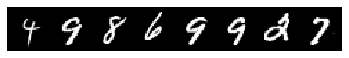

step 33, loss 3.8242034912109375
Target:	 tensor([2, 0, 1, 7, 3, 2, 7, 6], device='cuda:0')
Pred:	 tensor([7, 6, 1, 7, 1, 6, 9, 9], device='cuda:0')


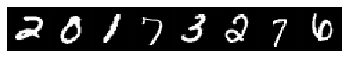

step 66, loss 2.8252112865448
Target:	 tensor([7, 5, 3, 6, 7, 0, 1, 3], device='cuda:0')
Pred:	 tensor([7, 0, 1, 5, 7, 0, 5, 3], device='cuda:0')


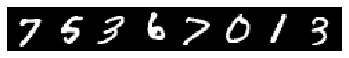

step 99, loss 2.307401657104492
Target:	 tensor([9, 4, 0, 0, 5, 9, 2, 2], device='cuda:0')
Pred:	 tensor([9, 5, 4, 0, 4, 9, 6, 1], device='cuda:0')


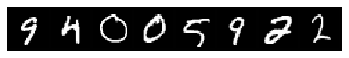

step 132, loss 1.489558219909668
Target:	 tensor([2, 3, 3, 8, 1, 5, 4, 8], device='cuda:0')
Pred:	 tensor([4, 3, 1, 8, 1, 5, 4, 8], device='cuda:0')


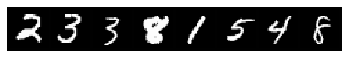

step 165, loss 0.7224959135055542
Target:	 tensor([7, 1, 7, 5, 1, 7, 7, 2], device='cuda:0')
Pred:	 tensor([7, 1, 2, 0, 1, 7, 7, 7], device='cuda:0')


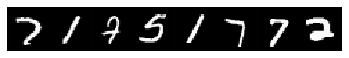

step 198, loss 1.264012098312378
Target:	 tensor([6, 4, 1, 6, 8, 4, 2, 2], device='cuda:0')
Pred:	 tensor([6, 4, 1, 6, 8, 4, 7, 8], device='cuda:0')


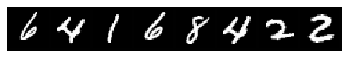

step 231, loss 1.0386245250701904
Target:	 tensor([5, 7, 0, 7, 8, 4, 9, 2], device='cuda:0')
Pred:	 tensor([6, 7, 2, 9, 1, 4, 9, 2], device='cuda:0')


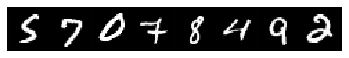

step 264, loss 0.6571869850158691
Target:	 tensor([5, 4, 4, 5, 6, 6, 1, 4], device='cuda:0')
Pred:	 tensor([3, 4, 4, 5, 5, 6, 1, 4], device='cuda:0')


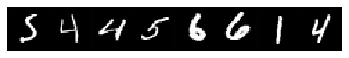

step 297, loss 1.0658410787582397
Target:	 tensor([6, 4, 1, 0, 0, 2, 1, 3], device='cuda:0')
Pred:	 tensor([2, 5, 1, 0, 0, 2, 9, 3], device='cuda:0')


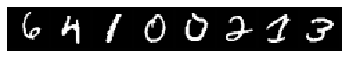

step 330, loss 0.7052355408668518
Target:	 tensor([0, 7, 9, 3, 3, 1, 7, 1], device='cuda:0')
Pred:	 tensor([0, 7, 7, 3, 3, 1, 7, 1], device='cuda:0')


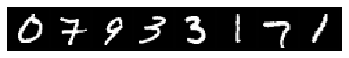

step 363, loss 0.48030850291252136
Target:	 tensor([0, 5, 1, 8, 0, 3, 4, 8], device='cuda:0')
Pred:	 tensor([0, 5, 1, 8, 0, 3, 9, 1], device='cuda:0')


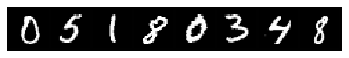

step 396, loss 0.61127108335495
Target:	 tensor([1, 9, 8, 9, 1, 2, 9, 8], device='cuda:0')
Pred:	 tensor([1, 9, 8, 9, 1, 2, 9, 8], device='cuda:0')


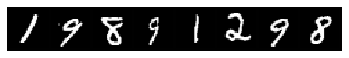

step 429, loss 0.2561826705932617
Target:	 tensor([4, 9, 5, 1, 5, 0, 3, 5], device='cuda:0')
Pred:	 tensor([4, 9, 5, 1, 5, 0, 3, 9], device='cuda:0')


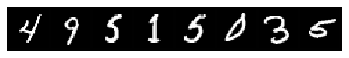

step 462, loss 0.38610169291496277
Target:	 tensor([3, 1, 6, 6, 6, 5, 9, 9], device='cuda:0')
Pred:	 tensor([3, 1, 6, 6, 6, 5, 9, 9], device='cuda:0')


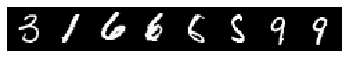

step 495, loss 0.11784163117408752
Target:	 tensor([8, 7, 1, 3, 7, 0, 1, 4], device='cuda:0')
Pred:	 tensor([8, 7, 1, 3, 7, 0, 1, 4], device='cuda:0')


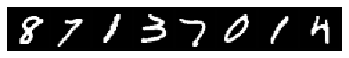

step 528, loss 0.2990405559539795
Target:	 tensor([6, 3, 4, 4, 1, 2, 5, 5], device='cuda:0')
Pred:	 tensor([6, 3, 4, 4, 1, 2, 5, 5], device='cuda:0')


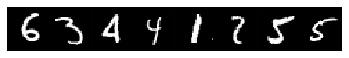

step 561, loss 0.4184037446975708
Target:	 tensor([9, 6, 1, 0, 5, 9, 2, 1], device='cuda:0')
Pred:	 tensor([9, 6, 1, 0, 5, 9, 5, 8], device='cuda:0')


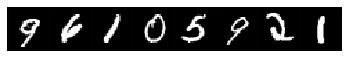

step 594, loss 0.4037306308746338
Target:	 tensor([0, 3, 2, 9, 5, 0, 2, 8], device='cuda:0')
Pred:	 tensor([0, 5, 7, 9, 5, 0, 2, 8], device='cuda:0')


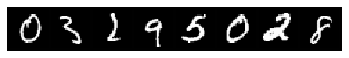

step 627, loss 0.19297176599502563
Target:	 tensor([1, 1, 5, 8, 9, 8, 9, 4], device='cuda:0')
Pred:	 tensor([1, 1, 5, 8, 9, 8, 8, 4], device='cuda:0')


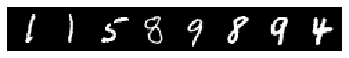

step 660, loss 0.625824511051178
Target:	 tensor([9, 4, 4, 1, 1, 9, 3, 2], device='cuda:0')
Pred:	 tensor([4, 4, 4, 1, 1, 5, 7, 2], device='cuda:0')


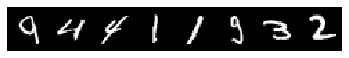

step 693, loss 0.32126790285110474
Target:	 tensor([3, 7, 5, 5, 4, 9, 5, 3], device='cuda:0')
Pred:	 tensor([3, 7, 5, 5, 4, 7, 5, 3], device='cuda:0')


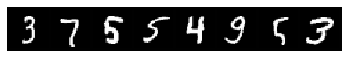

step 726, loss 0.3652065396308899
Target:	 tensor([1, 3, 4, 7, 4, 1, 2, 1], device='cuda:0')
Pred:	 tensor([1, 3, 4, 7, 4, 1, 2, 7], device='cuda:0')


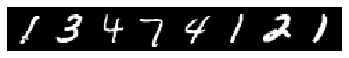

step 759, loss 0.2995212972164154
Target:	 tensor([6, 8, 8, 4, 2, 8, 4, 5], device='cuda:0')
Pred:	 tensor([6, 8, 8, 4, 2, 8, 4, 5], device='cuda:0')


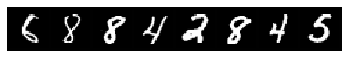

step 792, loss 0.3462226986885071
Target:	 tensor([5, 4, 4, 6, 8, 0, 8, 3], device='cuda:0')
Pred:	 tensor([5, 4, 4, 6, 8, 0, 8, 3], device='cuda:0')


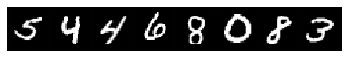

step 825, loss 0.30725592374801636
Target:	 tensor([4, 9, 0, 9, 3, 1, 6, 4], device='cuda:0')
Pred:	 tensor([4, 9, 0, 9, 3, 1, 6, 4], device='cuda:0')


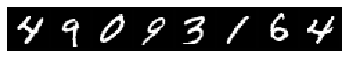

step 858, loss 0.14594198763370514
Target:	 tensor([8, 9, 9, 9, 3, 7, 6, 2], device='cuda:0')
Pred:	 tensor([8, 9, 9, 9, 3, 7, 6, 2], device='cuda:0')


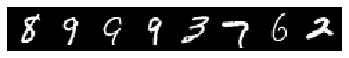

step 891, loss 0.6708555817604065
Target:	 tensor([5, 4, 8, 2, 3, 6, 4, 9], device='cuda:0')
Pred:	 tensor([5, 4, 8, 2, 3, 1, 9, 9], device='cuda:0')


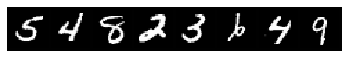

step 924, loss 0.6535011529922485
Target:	 tensor([7, 1, 2, 3, 5, 7, 0, 4], device='cuda:0')
Pred:	 tensor([7, 1, 2, 3, 5, 7, 0, 4], device='cuda:0')


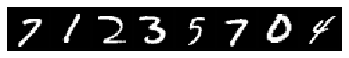

step 957, loss 0.12667034566402435
Target:	 tensor([7, 3, 1, 7, 4, 9, 2, 5], device='cuda:0')
Pred:	 tensor([2, 3, 1, 7, 4, 9, 2, 5], device='cuda:0')


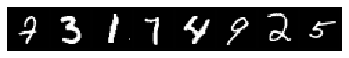

step 990, loss 0.5904126167297363
Target:	 tensor([6, 2, 6, 3, 7, 3, 7, 9], device='cuda:0')
Pred:	 tensor([6, 2, 6, 3, 7, 3, 7, 9], device='cuda:0')


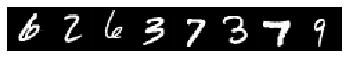

step 1023, loss 0.35865235328674316
Target:	 tensor([2, 0, 9, 9, 2, 6, 9, 2], device='cuda:0')
Pred:	 tensor([8, 0, 7, 9, 2, 6, 9, 2], device='cuda:0')


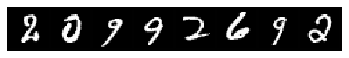

step 1056, loss 0.26131752133369446
Target:	 tensor([6, 9, 3, 2, 4, 3, 3, 2], device='cuda:0')
Pred:	 tensor([6, 9, 3, 2, 4, 3, 3, 2], device='cuda:0')


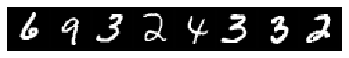

step 1089, loss 0.269225537776947
Target:	 tensor([3, 0, 1, 6, 8, 4, 8, 7], device='cuda:0')
Pred:	 tensor([3, 6, 1, 6, 8, 4, 8, 7], device='cuda:0')


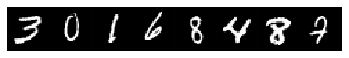

step 1122, loss 0.17356596887111664
Target:	 tensor([9, 2, 1, 3, 9, 9, 6, 0], device='cuda:0')
Pred:	 tensor([9, 2, 1, 3, 7, 9, 6, 0], device='cuda:0')


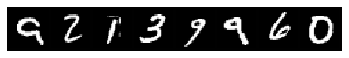

step 1155, loss 0.15149955451488495
Target:	 tensor([9, 7, 3, 7, 2, 7, 5, 1], device='cuda:0')
Pred:	 tensor([9, 7, 3, 7, 2, 7, 5, 1], device='cuda:0')


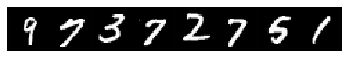

step 1188, loss 0.2633585035800934
Target:	 tensor([8, 7, 4, 3, 9, 2, 9, 8], device='cuda:0')
Pred:	 tensor([8, 7, 4, 3, 9, 7, 9, 8], device='cuda:0')


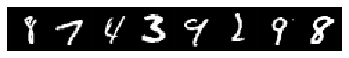

step 1221, loss 0.24181252717971802
Target:	 tensor([2, 8, 3, 1, 2, 9, 4, 4], device='cuda:0')
Pred:	 tensor([2, 8, 3, 1, 2, 9, 4, 4], device='cuda:0')


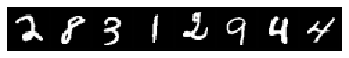

step 1254, loss 0.08075663447380066
Target:	 tensor([3, 9, 1, 7, 3, 1, 8, 7], device='cuda:0')
Pred:	 tensor([3, 9, 1, 7, 3, 1, 8, 7], device='cuda:0')


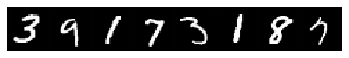

step 1287, loss 0.10654321312904358
Target:	 tensor([3, 6, 1, 6, 4, 7, 0, 4], device='cuda:0')
Pred:	 tensor([3, 6, 1, 6, 4, 7, 0, 4], device='cuda:0')


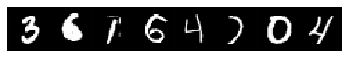

step 1320, loss 0.041792597621679306
Target:	 tensor([4, 6, 1, 0, 4, 5, 3, 3], device='cuda:0')
Pred:	 tensor([4, 6, 1, 0, 4, 5, 3, 3], device='cuda:0')


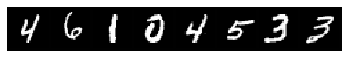

step 1353, loss 0.11369313299655914
Target:	 tensor([1, 7, 6, 7, 7, 2, 3, 3], device='cuda:0')
Pred:	 tensor([1, 7, 6, 7, 7, 2, 3, 3], device='cuda:0')


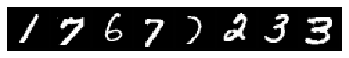

step 1386, loss 0.04402383416891098
Target:	 tensor([5, 8, 7, 7, 0, 7, 6, 3], device='cuda:0')
Pred:	 tensor([5, 8, 7, 7, 0, 7, 6, 3], device='cuda:0')


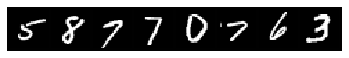

step 1419, loss 0.20579740405082703
Target:	 tensor([4, 2, 0, 1, 1, 9, 1, 8], device='cuda:0')
Pred:	 tensor([4, 2, 0, 1, 1, 9, 1, 8], device='cuda:0')


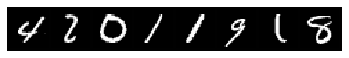

step 1452, loss 0.11994128674268723
Target:	 tensor([6, 0, 6, 2, 3, 0, 3, 2], device='cuda:0')
Pred:	 tensor([6, 0, 6, 2, 3, 0, 3, 2], device='cuda:0')


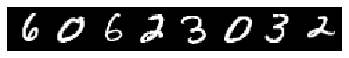

step 1485, loss 0.17193180322647095
Target:	 tensor([6, 4, 1, 8, 0, 2, 7, 2], device='cuda:0')
Pred:	 tensor([6, 4, 1, 8, 0, 2, 2, 2], device='cuda:0')


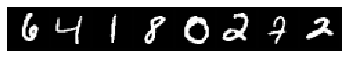

step 1518, loss 0.18300877511501312
Target:	 tensor([7, 5, 7, 3, 5, 0, 2, 3], device='cuda:0')
Pred:	 tensor([7, 5, 7, 3, 5, 0, 2, 3], device='cuda:0')


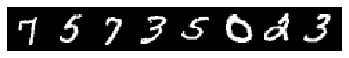

step 1551, loss 0.09013783931732178
Target:	 tensor([1, 6, 5, 1, 0, 9, 8, 1], device='cuda:0')
Pred:	 tensor([1, 6, 5, 1, 0, 9, 8, 1], device='cuda:0')


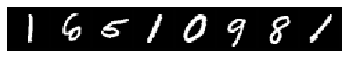

step 1584, loss 0.2125459909439087
Target:	 tensor([3, 7, 1, 9, 3, 2, 9, 4], device='cuda:0')
Pred:	 tensor([3, 7, 1, 9, 3, 2, 9, 4], device='cuda:0')


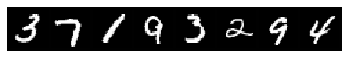

step 1617, loss 0.4176376760005951
Target:	 tensor([4, 0, 1, 8, 1, 9, 7, 3], device='cuda:0')
Pred:	 tensor([4, 0, 1, 8, 1, 9, 7, 3], device='cuda:0')


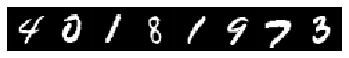

step 1650, loss 0.1246330663561821
Target:	 tensor([3, 1, 2, 3, 5, 3, 9, 1], device='cuda:0')
Pred:	 tensor([3, 1, 2, 3, 5, 3, 9, 1], device='cuda:0')


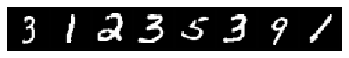

step 1683, loss 0.18515126407146454
Target:	 tensor([4, 5, 8, 7, 9, 4, 6, 3], device='cuda:0')
Pred:	 tensor([4, 5, 8, 7, 9, 4, 6, 3], device='cuda:0')


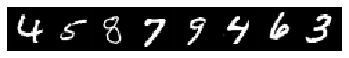

step 1716, loss 0.07601524889469147
Target:	 tensor([7, 6, 9, 4, 8, 3, 2, 9], device='cuda:0')
Pred:	 tensor([7, 6, 9, 4, 8, 3, 2, 9], device='cuda:0')


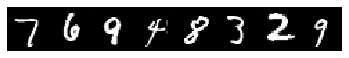

step 1749, loss 0.15055452287197113
Target:	 tensor([4, 5, 0, 4, 6, 9, 6, 4], device='cuda:0')
Pred:	 tensor([4, 5, 0, 4, 6, 9, 6, 4], device='cuda:0')


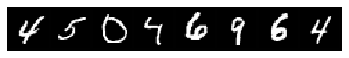

step 1782, loss 0.05381791293621063
Target:	 tensor([1, 9, 4, 7, 3, 7, 3, 7], device='cuda:0')
Pred:	 tensor([1, 9, 4, 7, 3, 7, 3, 7], device='cuda:0')


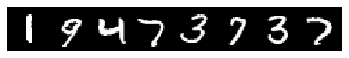

step 1815, loss 0.1203935444355011
Target:	 tensor([7, 0, 7, 1, 3, 3, 7, 1], device='cuda:0')
Pred:	 tensor([2, 0, 7, 1, 3, 3, 7, 1], device='cuda:0')


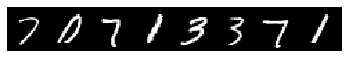

step 1848, loss 0.17808808386325836
Target:	 tensor([8, 5, 1, 4, 7, 4, 3, 1], device='cuda:0')
Pred:	 tensor([8, 5, 1, 4, 7, 4, 3, 1], device='cuda:0')


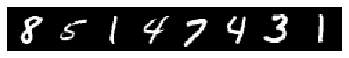

step 1881, loss 0.09654384851455688
Target:	 tensor([5, 0, 4, 1, 7, 5, 0, 1], device='cuda:0')
Pred:	 tensor([5, 0, 4, 1, 7, 5, 0, 1], device='cuda:0')


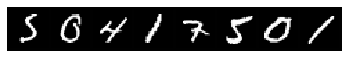

step 1914, loss 0.21340709924697876
Target:	 tensor([2, 1, 7, 2, 8, 5, 4, 4], device='cuda:0')
Pred:	 tensor([2, 1, 7, 2, 8, 5, 4, 4], device='cuda:0')


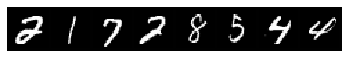

step 1947, loss 0.18368154764175415
Target:	 tensor([5, 7, 0, 9, 0, 9, 2, 9], device='cuda:0')
Pred:	 tensor([5, 7, 0, 9, 0, 9, 2, 9], device='cuda:0')


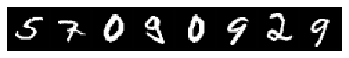

step 1980, loss 0.16718420386314392
Target:	 tensor([3, 0, 9, 9, 9, 8, 7, 2], device='cuda:0')
Pred:	 tensor([3, 0, 9, 9, 9, 8, 7, 2], device='cuda:0')


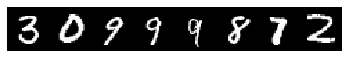

step 2013, loss 0.29670950770378113
Target:	 tensor([6, 5, 3, 5, 7, 7, 8, 7], device='cuda:0')
Pred:	 tensor([6, 5, 3, 5, 7, 7, 5, 7], device='cuda:0')


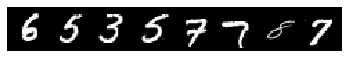

step 2046, loss 0.13179495930671692
Target:	 tensor([2, 6, 7, 6, 1, 6, 0, 1], device='cuda:0')
Pred:	 tensor([2, 6, 7, 6, 1, 6, 0, 1], device='cuda:0')


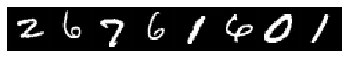

step 2079, loss 0.05963215231895447
Target:	 tensor([5, 2, 2, 1, 6, 8, 4, 7], device='cuda:0')
Pred:	 tensor([5, 2, 2, 1, 6, 8, 4, 7], device='cuda:0')


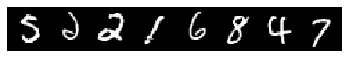

step 2112, loss 0.08420535922050476
Target:	 tensor([1, 5, 2, 9, 3, 3, 3, 8], device='cuda:0')
Pred:	 tensor([1, 5, 2, 9, 3, 3, 3, 8], device='cuda:0')


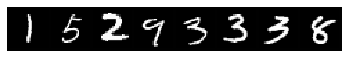

step 2145, loss 0.12736019492149353
Target:	 tensor([7, 8, 7, 1, 1, 8, 1, 7], device='cuda:0')
Pred:	 tensor([7, 8, 7, 1, 1, 8, 1, 7], device='cuda:0')


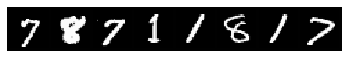

step 2178, loss 0.14439570903778076
Target:	 tensor([9, 3, 7, 5, 1, 1, 7, 2], device='cuda:0')
Pred:	 tensor([9, 3, 7, 5, 1, 1, 7, 2], device='cuda:0')


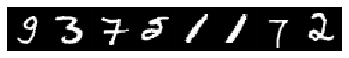

step 2211, loss 0.08556468784809113
Target:	 tensor([6, 5, 6, 2, 8, 0, 2, 3], device='cuda:0')
Pred:	 tensor([6, 5, 6, 2, 8, 0, 2, 3], device='cuda:0')


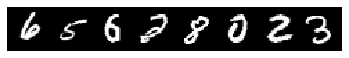

step 2244, loss 0.055098582059144974
Target:	 tensor([1, 7, 7, 5, 4, 9, 7, 5], device='cuda:0')
Pred:	 tensor([1, 7, 7, 5, 4, 9, 7, 5], device='cuda:0')


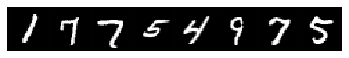

step 2277, loss 0.06851561367511749
Target:	 tensor([6, 9, 3, 5, 3, 2, 7, 9], device='cuda:0')
Pred:	 tensor([6, 9, 3, 5, 3, 2, 7, 9], device='cuda:0')


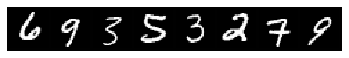

step 2310, loss 0.06380948424339294
Target:	 tensor([4, 7, 9, 8, 3, 8, 3, 1], device='cuda:0')
Pred:	 tensor([4, 7, 9, 8, 3, 8, 3, 1], device='cuda:0')


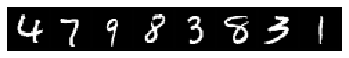

step 2343, loss 0.10966092348098755
Target:	 tensor([9, 1, 3, 9, 2, 3, 3, 5], device='cuda:0')
Pred:	 tensor([9, 1, 3, 9, 2, 3, 3, 5], device='cuda:0')


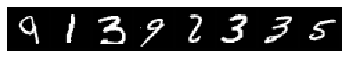

step 2376, loss 0.11706097424030304
Target:	 tensor([4, 3, 9, 1, 7, 6, 2, 4], device='cuda:0')
Pred:	 tensor([4, 3, 9, 1, 7, 6, 2, 4], device='cuda:0')


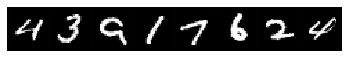

step 2409, loss 0.13288652896881104
Target:	 tensor([3, 6, 0, 7, 0, 4, 9, 7], device='cuda:0')
Pred:	 tensor([3, 6, 0, 7, 0, 4, 9, 7], device='cuda:0')


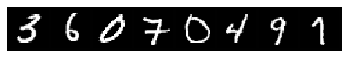

step 2442, loss 0.5781179070472717
Target:	 tensor([9, 0, 5, 3, 8, 5, 7, 0], device='cuda:0')
Pred:	 tensor([9, 0, 5, 3, 8, 5, 7, 0], device='cuda:0')


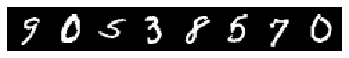

step 2475, loss 0.5101132988929749
Target:	 tensor([4, 4, 8, 4, 1, 7, 1, 1], device='cuda:0')
Pred:	 tensor([4, 4, 8, 4, 1, 7, 1, 1], device='cuda:0')


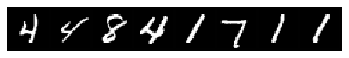

step 2508, loss 0.05983516573905945
Target:	 tensor([1, 8, 1, 5, 8, 9, 1, 1], device='cuda:0')
Pred:	 tensor([1, 8, 1, 5, 8, 9, 1, 1], device='cuda:0')


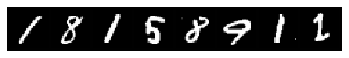

step 2541, loss 0.23027367889881134
Target:	 tensor([1, 3, 2, 9, 4, 2, 5, 6], device='cuda:0')
Pred:	 tensor([1, 3, 2, 4, 4, 2, 5, 6], device='cuda:0')


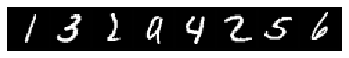

step 2574, loss 0.048178039491176605
Target:	 tensor([2, 4, 1, 4, 9, 0, 1, 8], device='cuda:0')
Pred:	 tensor([2, 4, 1, 4, 9, 0, 1, 8], device='cuda:0')


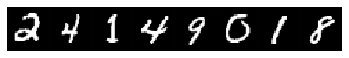

step 2607, loss 0.055615656077861786
Target:	 tensor([7, 4, 1, 7, 4, 4, 1, 2], device='cuda:0')
Pred:	 tensor([7, 4, 1, 7, 4, 4, 1, 2], device='cuda:0')


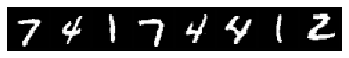

step 2640, loss 0.23814690113067627
Target:	 tensor([7, 1, 6, 5, 0, 6, 0, 3], device='cuda:0')
Pred:	 tensor([7, 1, 6, 5, 0, 6, 0, 3], device='cuda:0')


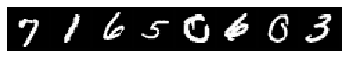

step 2673, loss 0.04696434736251831
Target:	 tensor([3, 5, 5, 8, 4, 9, 3, 0], device='cuda:0')
Pred:	 tensor([3, 5, 5, 8, 4, 9, 3, 0], device='cuda:0')


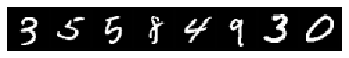

step 2706, loss 0.028766099363565445
Target:	 tensor([6, 3, 4, 8, 9, 7, 3, 4], device='cuda:0')
Pred:	 tensor([6, 3, 4, 8, 9, 7, 3, 4], device='cuda:0')


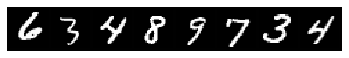

step 2739, loss 0.11093457043170929
Target:	 tensor([7, 4, 7, 2, 7, 1, 2, 9], device='cuda:0')
Pred:	 tensor([7, 4, 7, 2, 7, 1, 2, 9], device='cuda:0')


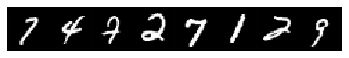

step 2772, loss 0.1070777177810669
Target:	 tensor([2, 3, 0, 5, 2, 1, 4, 8], device='cuda:0')
Pred:	 tensor([2, 3, 0, 5, 2, 1, 4, 8], device='cuda:0')


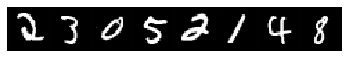

step 2805, loss 0.035956013947725296
Target:	 tensor([3, 3, 5, 1, 3, 2, 5, 2], device='cuda:0')
Pred:	 tensor([3, 3, 5, 1, 3, 2, 5, 2], device='cuda:0')


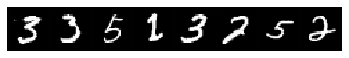

step 2838, loss 0.1399330496788025
Target:	 tensor([9, 2, 0, 2, 3, 6, 7, 0], device='cuda:0')
Pred:	 tensor([9, 2, 0, 2, 3, 6, 7, 0], device='cuda:0')


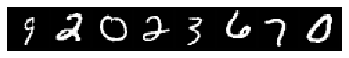

step 2871, loss 0.5620437264442444
Target:	 tensor([5, 2, 0, 4, 2, 7, 8, 3], device='cuda:0')
Pred:	 tensor([5, 2, 0, 4, 2, 7, 8, 3], device='cuda:0')


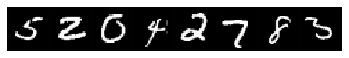

step 2904, loss 0.06267451494932175
Target:	 tensor([9, 9, 8, 7, 7, 2, 3, 1], device='cuda:0')
Pred:	 tensor([9, 9, 8, 7, 7, 2, 3, 1], device='cuda:0')


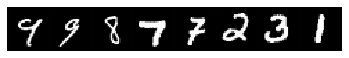

step 2937, loss 0.029562965035438538
Target:	 tensor([5, 8, 2, 9, 4, 0, 8, 0], device='cuda:0')
Pred:	 tensor([5, 8, 2, 9, 4, 0, 8, 0], device='cuda:0')


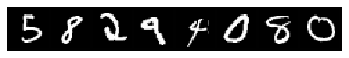

step 2970, loss 0.04385726898908615
Target:	 tensor([8, 7, 4, 1, 9, 4, 4, 1], device='cuda:0')
Pred:	 tensor([8, 7, 4, 1, 9, 4, 4, 1], device='cuda:0')


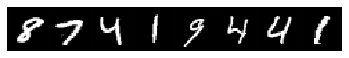

step 3003, loss 0.06304769963026047
Target:	 tensor([7, 5, 7, 0, 4, 1, 1, 1], device='cuda:0')
Pred:	 tensor([7, 5, 7, 0, 4, 1, 3, 1], device='cuda:0')


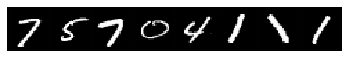

step 3036, loss 0.040718480944633484
Target:	 tensor([6, 8, 5, 0, 1, 3, 3, 9], device='cuda:0')
Pred:	 tensor([6, 8, 5, 0, 1, 3, 3, 9], device='cuda:0')


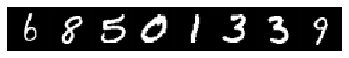

step 3069, loss 0.060833610594272614
Target:	 tensor([7, 7, 5, 1, 4, 3, 9, 2], device='cuda:0')
Pred:	 tensor([7, 7, 5, 1, 4, 3, 9, 2], device='cuda:0')


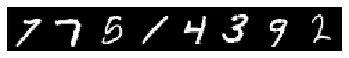

step 3102, loss 0.08128631114959717
Target:	 tensor([7, 9, 3, 7, 6, 9, 0, 5], device='cuda:0')
Pred:	 tensor([7, 9, 3, 7, 6, 9, 0, 5], device='cuda:0')


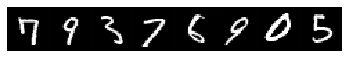

step 3135, loss 0.03846437484025955
Target:	 tensor([4, 2, 0, 8, 7, 0, 0, 7], device='cuda:0')
Pred:	 tensor([4, 2, 0, 8, 7, 0, 0, 7], device='cuda:0')


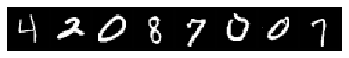

step 3168, loss 0.032442763447761536
Target:	 tensor([1, 3, 7, 2, 6, 9, 2, 0], device='cuda:0')
Pred:	 tensor([1, 3, 7, 2, 6, 9, 2, 0], device='cuda:0')


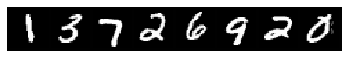

step 3201, loss 0.027510568499565125
Target:	 tensor([6, 6, 4, 1, 1, 3, 9, 5], device='cuda:0')
Pred:	 tensor([6, 6, 4, 1, 1, 3, 9, 5], device='cuda:0')


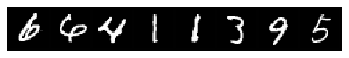

step 3234, loss 0.04312865808606148
Target:	 tensor([3, 6, 4, 7, 3, 8, 4, 3], device='cuda:0')
Pred:	 tensor([3, 6, 4, 7, 3, 8, 4, 3], device='cuda:0')


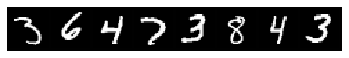

step 3267, loss 0.04637345299124718
Target:	 tensor([2, 3, 2, 4, 7, 6, 0, 7], device='cuda:0')
Pred:	 tensor([2, 3, 2, 4, 7, 6, 0, 7], device='cuda:0')


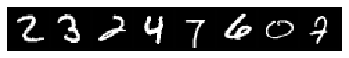

step 0, loss 7.729071617126465
Target:	 tensor([5, 9, 9, 9, 7, 3, 3, 6], device='cuda:0')
Pred:	 tensor([8, 9, 8, 9, 8, 9, 9, 8], device='cuda:0')


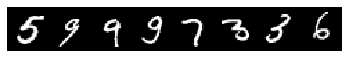

step 33, loss 4.480671405792236
Target:	 tensor([8, 5, 6, 9, 9, 2, 1, 3], device='cuda:0')
Pred:	 tensor([8, 8, 2, 2, 7, 0, 1, 9], device='cuda:0')


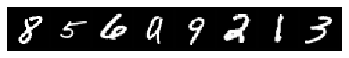

step 66, loss 2.239227771759033
Target:	 tensor([1, 3, 2, 9, 9, 9, 1, 9], device='cuda:0')
Pred:	 tensor([1, 3, 2, 7, 8, 4, 1, 7], device='cuda:0')


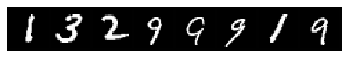

step 99, loss 1.890723705291748
Target:	 tensor([7, 7, 7, 5, 8, 4, 2, 1], device='cuda:0')
Pred:	 tensor([8, 7, 7, 5, 1, 4, 2, 1], device='cuda:0')


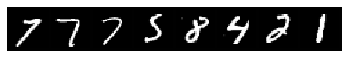

step 132, loss 1.2221227884292603
Target:	 tensor([7, 4, 0, 0, 8, 9, 9, 0], device='cuda:0')
Pred:	 tensor([7, 4, 0, 4, 4, 4, 4, 0], device='cuda:0')


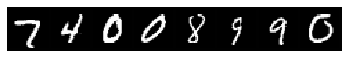

step 165, loss 1.0586689710617065
Target:	 tensor([5, 1, 1, 6, 0, 2, 6, 6], device='cuda:0')
Pred:	 tensor([5, 8, 8, 6, 6, 2, 6, 5], device='cuda:0')


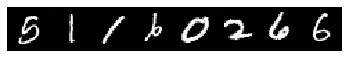

step 198, loss 2.04471492767334
Target:	 tensor([7, 2, 9, 0, 9, 2, 6, 7], device='cuda:0')
Pred:	 tensor([7, 3, 8, 0, 9, 6, 6, 7], device='cuda:0')


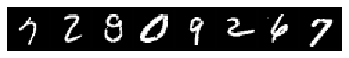

step 231, loss 0.773208737373352
Target:	 tensor([5, 1, 0, 2, 5, 3, 9, 5], device='cuda:0')
Pred:	 tensor([5, 1, 0, 6, 5, 3, 9, 5], device='cuda:0')


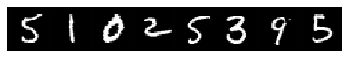

step 264, loss 0.5666652917861938
Target:	 tensor([6, 8, 3, 1, 3, 7, 5, 4], device='cuda:0')
Pred:	 tensor([6, 8, 5, 1, 3, 7, 3, 4], device='cuda:0')


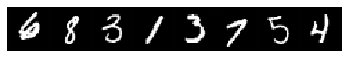

step 297, loss 0.2683468759059906
Target:	 tensor([7, 6, 3, 3, 6, 4, 6, 1], device='cuda:0')
Pred:	 tensor([7, 2, 3, 3, 6, 4, 6, 1], device='cuda:0')


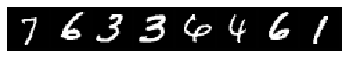

step 330, loss 0.20439594984054565
Target:	 tensor([0, 1, 6, 0, 8, 3, 8, 0], device='cuda:0')
Pred:	 tensor([0, 1, 6, 0, 8, 3, 8, 0], device='cuda:0')


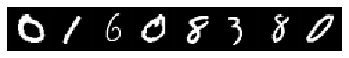

step 363, loss 0.32358109951019287
Target:	 tensor([1, 5, 8, 9, 4, 2, 8, 8], device='cuda:0')
Pred:	 tensor([1, 5, 8, 9, 4, 2, 8, 8], device='cuda:0')


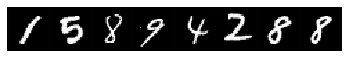

step 396, loss 0.5748341679573059
Target:	 tensor([6, 7, 6, 9, 7, 5, 1, 0], device='cuda:0')
Pred:	 tensor([6, 7, 6, 9, 0, 5, 1, 0], device='cuda:0')


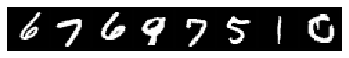

step 429, loss 0.47687435150146484
Target:	 tensor([0, 0, 3, 1, 4, 6, 2, 0], device='cuda:0')
Pred:	 tensor([0, 0, 5, 1, 4, 6, 2, 0], device='cuda:0')


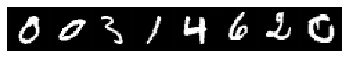

step 462, loss 0.3592754006385803
Target:	 tensor([0, 4, 1, 6, 2, 7, 2, 3], device='cuda:0')
Pred:	 tensor([0, 4, 1, 6, 2, 3, 2, 3], device='cuda:0')


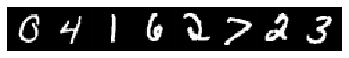

step 495, loss 0.13502486050128937
Target:	 tensor([4, 0, 4, 4, 8, 0, 6, 1], device='cuda:0')
Pred:	 tensor([4, 0, 4, 4, 8, 0, 6, 1], device='cuda:0')


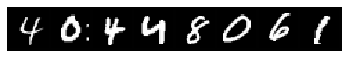

step 528, loss 0.27632197737693787
Target:	 tensor([0, 5, 3, 3, 4, 9, 7, 5], device='cuda:0')
Pred:	 tensor([0, 5, 3, 3, 4, 9, 7, 5], device='cuda:0')


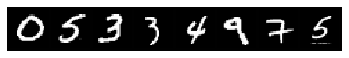

step 561, loss 0.14293760061264038
Target:	 tensor([4, 2, 6, 4, 7, 1, 7, 9], device='cuda:0')
Pred:	 tensor([4, 2, 6, 4, 7, 1, 7, 9], device='cuda:0')


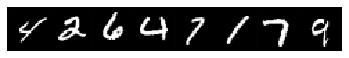

step 594, loss 0.5121737122535706
Target:	 tensor([0, 2, 6, 1, 7, 3, 5, 3], device='cuda:0')
Pred:	 tensor([0, 2, 6, 1, 4, 3, 5, 4], device='cuda:0')


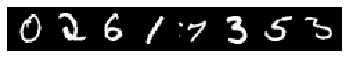

step 627, loss 0.6304238438606262
Target:	 tensor([8, 1, 4, 1, 5, 2, 0, 2], device='cuda:0')
Pred:	 tensor([8, 1, 4, 2, 5, 2, 0, 2], device='cuda:0')


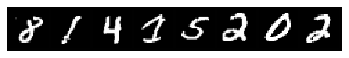

step 660, loss 0.2203582525253296
Target:	 tensor([9, 1, 8, 2, 5, 0, 2, 3], device='cuda:0')
Pred:	 tensor([2, 1, 8, 2, 5, 0, 2, 3], device='cuda:0')


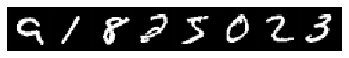

step 693, loss 0.374390184879303
Target:	 tensor([7, 9, 3, 7, 7, 3, 1, 0], device='cuda:0')
Pred:	 tensor([7, 9, 3, 7, 9, 3, 1, 0], device='cuda:0')


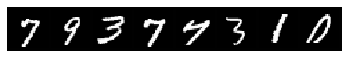

step 726, loss 0.3257180154323578
Target:	 tensor([9, 1, 9, 7, 1, 0, 0, 3], device='cuda:0')
Pred:	 tensor([9, 1, 9, 7, 1, 0, 0, 3], device='cuda:0')


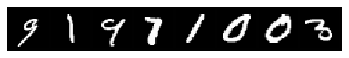

step 759, loss 0.37996014952659607
Target:	 tensor([4, 4, 7, 1, 1, 6, 4, 9], device='cuda:0')
Pred:	 tensor([4, 4, 7, 1, 9, 6, 4, 3], device='cuda:0')


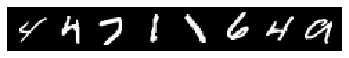

step 792, loss 0.6278938055038452
Target:	 tensor([0, 3, 8, 7, 9, 4, 9, 3], device='cuda:0')
Pred:	 tensor([0, 3, 8, 7, 9, 4, 9, 7], device='cuda:0')


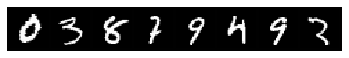

step 825, loss 0.17768549919128418
Target:	 tensor([6, 7, 8, 0, 4, 2, 4, 1], device='cuda:0')
Pred:	 tensor([6, 7, 8, 0, 4, 2, 4, 9], device='cuda:0')


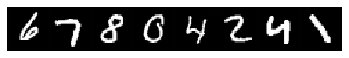

step 858, loss 0.19361209869384766
Target:	 tensor([3, 3, 5, 1, 8, 5, 6, 4], device='cuda:0')
Pred:	 tensor([3, 3, 5, 1, 8, 5, 6, 4], device='cuda:0')


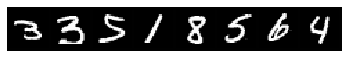

step 891, loss 0.30050045251846313
Target:	 tensor([5, 2, 2, 3, 8, 1, 8, 8], device='cuda:0')
Pred:	 tensor([9, 2, 2, 3, 8, 1, 8, 8], device='cuda:0')


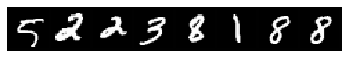

step 924, loss 0.06108775734901428
Target:	 tensor([9, 4, 8, 3, 8, 8, 1, 7], device='cuda:0')
Pred:	 tensor([9, 4, 8, 3, 8, 8, 1, 7], device='cuda:0')


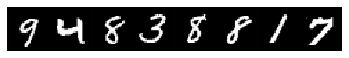

step 957, loss 0.23591837286949158
Target:	 tensor([3, 3, 5, 5, 5, 6, 2, 7], device='cuda:0')
Pred:	 tensor([3, 3, 5, 9, 5, 6, 2, 7], device='cuda:0')


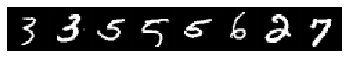

step 990, loss 0.25218284130096436
Target:	 tensor([2, 1, 8, 6, 7, 1, 1, 6], device='cuda:0')
Pred:	 tensor([2, 1, 8, 6, 7, 1, 1, 6], device='cuda:0')


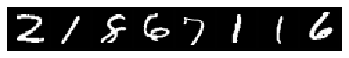

step 1023, loss 0.11110138893127441
Target:	 tensor([6, 0, 5, 6, 4, 1, 9, 4], device='cuda:0')
Pred:	 tensor([6, 0, 5, 6, 4, 1, 9, 4], device='cuda:0')


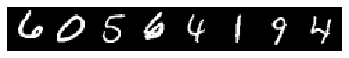

step 1056, loss 0.19190017879009247
Target:	 tensor([1, 1, 0, 0, 5, 7, 2, 1], device='cuda:0')
Pred:	 tensor([1, 1, 0, 0, 9, 7, 2, 1], device='cuda:0')


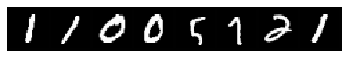

step 1089, loss 0.11751479655504227
Target:	 tensor([2, 1, 6, 2, 9, 6, 9, 7], device='cuda:0')
Pred:	 tensor([2, 1, 6, 2, 9, 6, 9, 7], device='cuda:0')


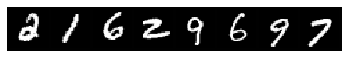

step 1122, loss 0.13313248753547668
Target:	 tensor([7, 6, 3, 4, 5, 9, 8, 0], device='cuda:0')
Pred:	 tensor([7, 6, 3, 4, 5, 9, 8, 0], device='cuda:0')


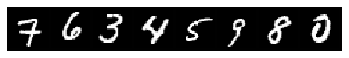

step 1155, loss 0.15740911662578583
Target:	 tensor([6, 4, 4, 0, 7, 0, 0, 7], device='cuda:0')
Pred:	 tensor([6, 4, 4, 0, 7, 0, 0, 7], device='cuda:0')


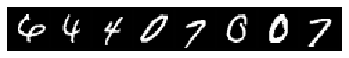

step 1188, loss 0.24186646938323975
Target:	 tensor([7, 6, 3, 8, 2, 1, 5, 1], device='cuda:0')
Pred:	 tensor([7, 6, 3, 8, 2, 1, 5, 1], device='cuda:0')


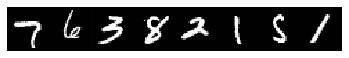

step 1221, loss 0.5683584213256836
Target:	 tensor([9, 6, 5, 6, 4, 9, 5, 6], device='cuda:0')
Pred:	 tensor([9, 6, 5, 6, 4, 9, 5, 6], device='cuda:0')


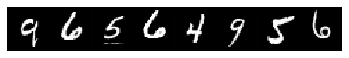

step 1254, loss 0.1886765956878662
Target:	 tensor([0, 7, 9, 6, 7, 0, 5, 1], device='cuda:0')
Pred:	 tensor([0, 7, 7, 6, 7, 2, 5, 1], device='cuda:0')


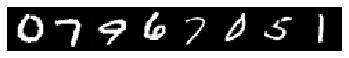

step 1287, loss 0.4200441241264343
Target:	 tensor([2, 9, 3, 6, 5, 3, 7, 9], device='cuda:0')
Pred:	 tensor([2, 9, 3, 6, 5, 3, 7, 9], device='cuda:0')


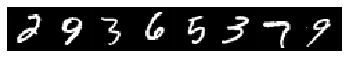

step 1320, loss 0.12424451112747192
Target:	 tensor([8, 2, 9, 3, 8, 6, 9, 5], device='cuda:0')
Pred:	 tensor([8, 2, 9, 3, 8, 6, 9, 5], device='cuda:0')


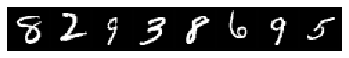

step 1353, loss 0.17259836196899414
Target:	 tensor([7, 5, 7, 5, 6, 3, 9, 0], device='cuda:0')
Pred:	 tensor([7, 5, 7, 2, 6, 3, 9, 0], device='cuda:0')


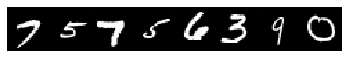

step 1386, loss 0.1322411298751831
Target:	 tensor([0, 0, 2, 8, 1, 6, 7, 9], device='cuda:0')
Pred:	 tensor([0, 0, 2, 8, 1, 6, 7, 9], device='cuda:0')


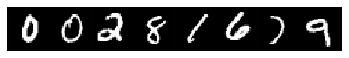

step 1419, loss 0.21967825293540955
Target:	 tensor([2, 4, 0, 0, 8, 1, 8, 9], device='cuda:0')
Pred:	 tensor([2, 4, 0, 0, 8, 1, 8, 9], device='cuda:0')


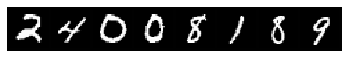

step 1452, loss 0.11733391880989075
Target:	 tensor([5, 7, 5, 8, 9, 9, 1, 5], device='cuda:0')
Pred:	 tensor([5, 7, 5, 8, 9, 9, 1, 5], device='cuda:0')


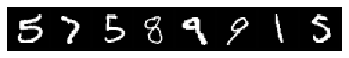

step 1485, loss 0.30242806673049927
Target:	 tensor([3, 8, 0, 3, 4, 9, 1, 1], device='cuda:0')
Pred:	 tensor([3, 8, 0, 3, 4, 9, 1, 1], device='cuda:0')


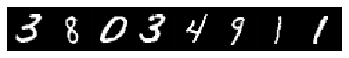

step 1518, loss 0.25828537344932556
Target:	 tensor([4, 7, 3, 1, 7, 2, 5, 9], device='cuda:0')
Pred:	 tensor([4, 7, 3, 1, 7, 0, 5, 9], device='cuda:0')


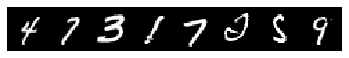

step 1551, loss 0.12058480083942413
Target:	 tensor([1, 4, 9, 3, 6, 4, 4, 7], device='cuda:0')
Pred:	 tensor([1, 4, 9, 3, 6, 4, 4, 7], device='cuda:0')


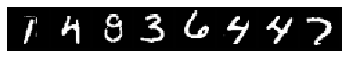

step 1584, loss 0.07339697331190109
Target:	 tensor([6, 4, 9, 2, 2, 8, 9, 8], device='cuda:0')
Pred:	 tensor([6, 4, 9, 2, 2, 8, 9, 8], device='cuda:0')


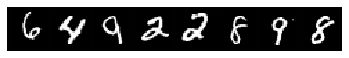

step 1617, loss 0.18139517307281494
Target:	 tensor([1, 5, 1, 5, 4, 1, 4, 6], device='cuda:0')
Pred:	 tensor([1, 5, 1, 9, 4, 1, 4, 6], device='cuda:0')


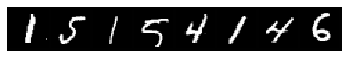

step 1650, loss 0.09298451989889145
Target:	 tensor([4, 5, 2, 9, 7, 7, 3, 9], device='cuda:0')
Pred:	 tensor([4, 5, 2, 9, 7, 7, 3, 9], device='cuda:0')


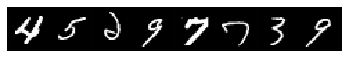

step 1683, loss 0.14537885785102844
Target:	 tensor([2, 7, 7, 1, 7, 7, 1, 7], device='cuda:0')
Pred:	 tensor([2, 7, 7, 1, 7, 7, 1, 7], device='cuda:0')


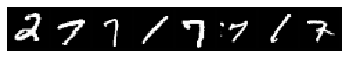

step 1716, loss 0.09776882827281952
Target:	 tensor([1, 6, 9, 0, 6, 0, 4, 2], device='cuda:0')
Pred:	 tensor([1, 6, 9, 0, 6, 0, 4, 2], device='cuda:0')


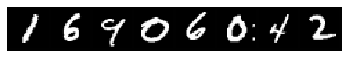

step 1749, loss 0.10300252586603165
Target:	 tensor([7, 1, 5, 7, 8, 3, 3, 2], device='cuda:0')
Pred:	 tensor([7, 1, 5, 7, 8, 3, 3, 2], device='cuda:0')


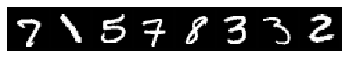

step 1782, loss 0.1791990101337433
Target:	 tensor([3, 8, 4, 4, 3, 1, 3, 7], device='cuda:0')
Pred:	 tensor([3, 8, 4, 7, 3, 1, 3, 7], device='cuda:0')


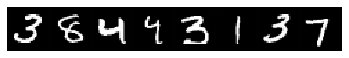

step 1815, loss 0.16123150289058685
Target:	 tensor([7, 1, 7, 1, 0, 5, 6, 7], device='cuda:0')
Pred:	 tensor([7, 1, 7, 1, 0, 5, 6, 7], device='cuda:0')


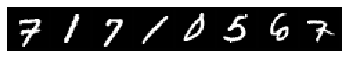

step 1848, loss 0.07631931453943253
Target:	 tensor([9, 1, 6, 7, 0, 2, 4, 7], device='cuda:0')
Pred:	 tensor([9, 1, 6, 7, 0, 2, 4, 7], device='cuda:0')


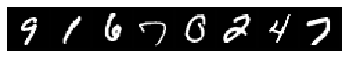

step 1881, loss 0.11439844220876694
Target:	 tensor([9, 4, 9, 7, 7, 8, 8, 2], device='cuda:0')
Pred:	 tensor([9, 4, 9, 7, 7, 8, 8, 2], device='cuda:0')


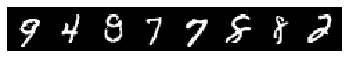

step 1914, loss 0.16751039028167725
Target:	 tensor([4, 7, 6, 5, 7, 5, 7, 1], device='cuda:0')
Pred:	 tensor([4, 7, 6, 5, 7, 5, 7, 1], device='cuda:0')


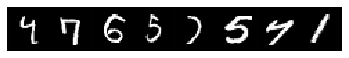

step 1947, loss 0.10831242799758911
Target:	 tensor([4, 0, 5, 9, 4, 5, 1, 9], device='cuda:0')
Pred:	 tensor([4, 0, 5, 9, 4, 5, 1, 9], device='cuda:0')


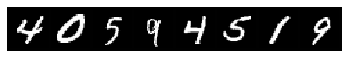

step 1980, loss 0.31177377700805664
Target:	 tensor([6, 3, 9, 4, 1, 4, 2, 1], device='cuda:0')
Pred:	 tensor([6, 3, 9, 4, 1, 4, 0, 1], device='cuda:0')


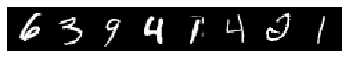

step 2013, loss 0.11632177233695984
Target:	 tensor([8, 1, 1, 3, 8, 3, 5, 7], device='cuda:0')
Pred:	 tensor([8, 1, 1, 3, 8, 3, 5, 7], device='cuda:0')


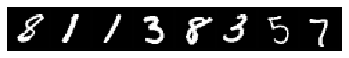

step 2046, loss 0.12632350623607635
Target:	 tensor([2, 4, 9, 2, 2, 0, 9, 5], device='cuda:0')
Pred:	 tensor([2, 4, 9, 2, 2, 0, 9, 5], device='cuda:0')


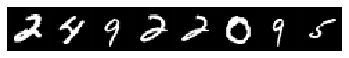

step 2079, loss 0.06096900999546051
Target:	 tensor([8, 2, 4, 5, 7, 2, 5, 6], device='cuda:0')
Pred:	 tensor([8, 2, 4, 5, 7, 2, 5, 6], device='cuda:0')


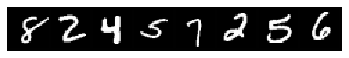

step 2112, loss 0.14944738149642944
Target:	 tensor([9, 7, 2, 0, 0, 9, 1, 0], device='cuda:0')
Pred:	 tensor([7, 7, 2, 0, 0, 9, 1, 0], device='cuda:0')


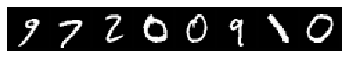

step 2145, loss 0.18931202590465546
Target:	 tensor([9, 7, 6, 8, 3, 4, 8, 0], device='cuda:0')
Pred:	 tensor([9, 7, 6, 8, 3, 4, 8, 0], device='cuda:0')


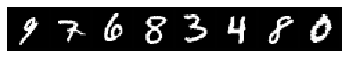

step 2178, loss 0.5591567754745483
Target:	 tensor([9, 5, 1, 7, 0, 5, 1, 7], device='cuda:0')
Pred:	 tensor([9, 5, 1, 7, 0, 5, 2, 7], device='cuda:0')


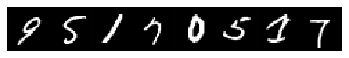

step 2211, loss 0.11150690913200378
Target:	 tensor([5, 1, 1, 7, 1, 3, 4, 0], device='cuda:0')
Pred:	 tensor([5, 1, 1, 7, 1, 3, 4, 0], device='cuda:0')


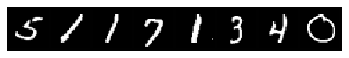

step 2244, loss 0.0687524676322937
Target:	 tensor([1, 8, 0, 7, 2, 7, 1, 5], device='cuda:0')
Pred:	 tensor([1, 8, 0, 7, 2, 7, 1, 5], device='cuda:0')


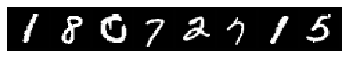

step 2277, loss 0.09141197800636292
Target:	 tensor([2, 8, 6, 3, 5, 6, 6, 9], device='cuda:0')
Pred:	 tensor([2, 8, 6, 3, 5, 6, 6, 9], device='cuda:0')


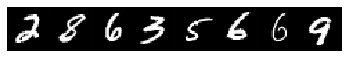

step 2310, loss 0.0801318809390068
Target:	 tensor([9, 5, 1, 1, 7, 0, 4, 9], device='cuda:0')
Pred:	 tensor([9, 5, 1, 1, 7, 0, 4, 9], device='cuda:0')


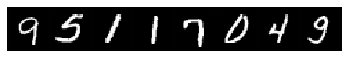

step 2343, loss 0.5798044204711914
Target:	 tensor([6, 1, 7, 8, 7, 1, 9, 7], device='cuda:0')
Pred:	 tensor([6, 1, 7, 8, 7, 1, 9, 7], device='cuda:0')


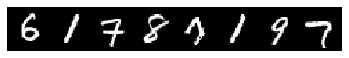

step 2376, loss 0.06219904124736786
Target:	 tensor([5, 0, 3, 2, 6, 3, 8, 5], device='cuda:0')
Pred:	 tensor([5, 0, 3, 2, 6, 3, 8, 5], device='cuda:0')


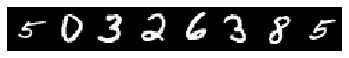

step 2409, loss 0.09923753142356873
Target:	 tensor([5, 4, 4, 1, 0, 0, 5, 0], device='cuda:0')
Pred:	 tensor([5, 4, 4, 1, 0, 0, 5, 0], device='cuda:0')


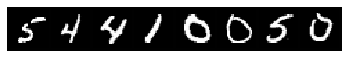

step 2442, loss 0.08344860374927521
Target:	 tensor([2, 3, 2, 5, 4, 2, 4, 0], device='cuda:0')
Pred:	 tensor([2, 3, 2, 5, 4, 2, 4, 0], device='cuda:0')


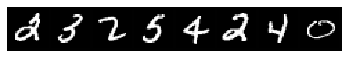

step 2475, loss 0.5427700877189636
Target:	 tensor([7, 7, 4, 5, 3, 4, 3, 0], device='cuda:0')
Pred:	 tensor([7, 7, 4, 5, 3, 4, 3, 0], device='cuda:0')


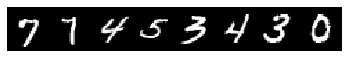

step 2508, loss 0.5793783664703369
Target:	 tensor([6, 4, 9, 2, 6, 1, 7, 5], device='cuda:0')
Pred:	 tensor([6, 4, 9, 2, 6, 1, 7, 5], device='cuda:0')


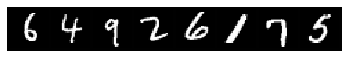

step 2541, loss 0.07922016829252243
Target:	 tensor([6, 3, 9, 4, 2, 6, 0, 2], device='cuda:0')
Pred:	 tensor([6, 3, 9, 4, 2, 6, 0, 2], device='cuda:0')


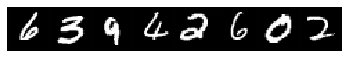

step 2574, loss 0.5600966811180115
Target:	 tensor([7, 0, 2, 2, 2, 3, 0, 1], device='cuda:0')
Pred:	 tensor([7, 0, 2, 2, 2, 3, 0, 1], device='cuda:0')


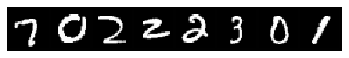

step 2607, loss 0.07249067723751068
Target:	 tensor([0, 5, 0, 5, 2, 6, 7, 7], device='cuda:0')
Pred:	 tensor([0, 5, 0, 5, 2, 6, 7, 7], device='cuda:0')


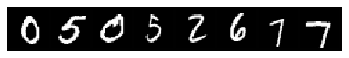

step 2640, loss 0.08770543336868286
Target:	 tensor([5, 5, 6, 2, 5, 8, 0, 3], device='cuda:0')
Pred:	 tensor([5, 5, 6, 2, 5, 8, 0, 3], device='cuda:0')


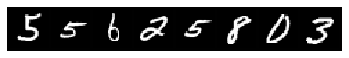

step 2673, loss 0.08365637063980103
Target:	 tensor([6, 5, 6, 7, 3, 7, 2, 1], device='cuda:0')
Pred:	 tensor([6, 5, 6, 7, 3, 7, 2, 1], device='cuda:0')


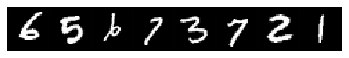

step 2706, loss 0.10206864774227142
Target:	 tensor([7, 3, 5, 8, 4, 4, 4, 7], device='cuda:0')
Pred:	 tensor([7, 3, 5, 8, 4, 4, 4, 7], device='cuda:0')


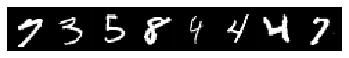

step 2739, loss 0.07987985759973526
Target:	 tensor([7, 0, 3, 0, 7, 2, 5, 5], device='cuda:0')
Pred:	 tensor([7, 0, 3, 0, 7, 2, 5, 5], device='cuda:0')


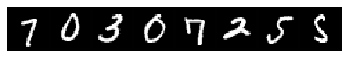

step 2772, loss 0.08722849190235138
Target:	 tensor([9, 9, 1, 0, 9, 9, 5, 5], device='cuda:0')
Pred:	 tensor([9, 9, 1, 0, 9, 9, 5, 5], device='cuda:0')


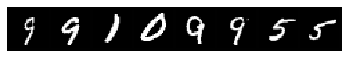

step 2805, loss 0.09485024213790894
Target:	 tensor([6, 1, 8, 1, 5, 5, 8, 2], device='cuda:0')
Pred:	 tensor([6, 1, 8, 1, 5, 5, 8, 2], device='cuda:0')


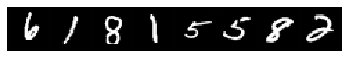

step 2838, loss 0.07968504726886749
Target:	 tensor([5, 5, 1, 5, 1, 1, 8, 4], device='cuda:0')
Pred:	 tensor([5, 5, 1, 5, 1, 1, 8, 4], device='cuda:0')


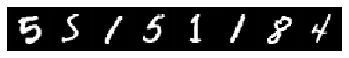

step 2871, loss 0.06388252973556519
Target:	 tensor([4, 4, 1, 0, 9, 8, 7, 6], device='cuda:0')
Pred:	 tensor([4, 4, 1, 0, 9, 8, 7, 6], device='cuda:0')


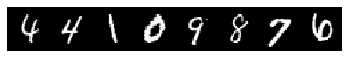

step 2904, loss 0.08177073299884796
Target:	 tensor([3, 9, 3, 3, 4, 5, 3, 8], device='cuda:0')
Pred:	 tensor([3, 9, 3, 3, 4, 5, 3, 8], device='cuda:0')


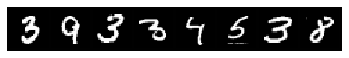

step 2937, loss 0.07777216285467148
Target:	 tensor([8, 0, 9, 6, 6, 2, 1, 8], device='cuda:0')
Pred:	 tensor([8, 0, 9, 6, 6, 2, 1, 8], device='cuda:0')


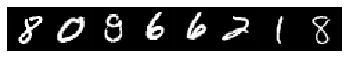

step 2970, loss 0.10954953730106354
Target:	 tensor([9, 3, 2, 8, 7, 0, 6, 9], device='cuda:0')
Pred:	 tensor([9, 3, 2, 8, 7, 0, 6, 9], device='cuda:0')


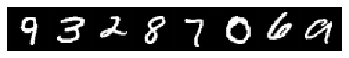

step 3003, loss 0.09407937526702881
Target:	 tensor([1, 7, 0, 7, 1, 4, 8, 8], device='cuda:0')
Pred:	 tensor([1, 7, 0, 7, 1, 4, 8, 8], device='cuda:0')


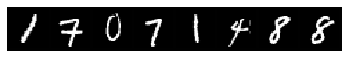

step 3036, loss 0.5464590787887573
Target:	 tensor([8, 7, 0, 3, 0, 0, 2, 5], device='cuda:0')
Pred:	 tensor([8, 7, 0, 3, 0, 0, 2, 5], device='cuda:0')


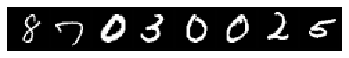

step 3069, loss 0.12292797863483429
Target:	 tensor([5, 8, 3, 9, 3, 9, 0, 8], device='cuda:0')
Pred:	 tensor([5, 8, 3, 9, 3, 9, 0, 8], device='cuda:0')


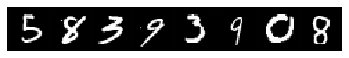

step 3102, loss 0.08859291672706604
Target:	 tensor([4, 6, 1, 2, 1, 7, 6, 7], device='cuda:0')
Pred:	 tensor([4, 6, 1, 2, 1, 7, 6, 7], device='cuda:0')


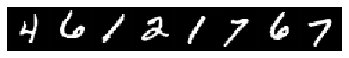

step 3135, loss 0.5462930798530579
Target:	 tensor([0, 5, 3, 3, 4, 9, 7, 0], device='cuda:0')
Pred:	 tensor([0, 5, 3, 7, 4, 9, 7, 0], device='cuda:0')


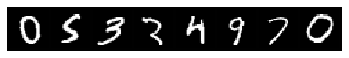

step 3168, loss 0.08051537722349167
Target:	 tensor([3, 4, 9, 6, 5, 8, 7, 4], device='cuda:0')
Pred:	 tensor([3, 4, 9, 6, 5, 8, 7, 4], device='cuda:0')


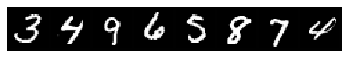

step 3201, loss 0.06531121581792831
Target:	 tensor([1, 8, 9, 9, 1, 7, 7, 7], device='cuda:0')
Pred:	 tensor([1, 8, 9, 9, 1, 7, 7, 7], device='cuda:0')


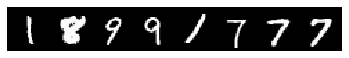

step 3234, loss 0.0710766613483429
Target:	 tensor([1, 6, 9, 1, 9, 6, 7, 4], device='cuda:0')
Pred:	 tensor([1, 6, 9, 1, 9, 6, 7, 4], device='cuda:0')


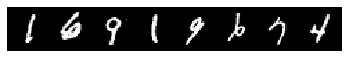

step 3267, loss 0.08320780098438263
Target:	 tensor([9, 3, 5, 0, 3, 3, 8, 5], device='cuda:0')
Pred:	 tensor([9, 3, 5, 0, 3, 3, 8, 5], device='cuda:0')


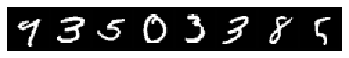

step 0, loss 7.978237628936768
Target:	 tensor([4, 7, 3, 9, 7, 9, 4, 9], device='cuda:0')
Pred:	 tensor([3, 3, 3, 9, 3, 3, 4, 3], device='cuda:0')


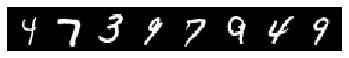

step 33, loss 5.657451152801514
Target:	 tensor([3, 2, 0, 0, 7, 1, 0, 4], device='cuda:0')
Pred:	 tensor([1, 5, 2, 5, 2, 4, 5, 1], device='cuda:0')


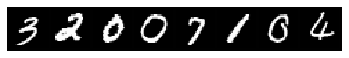

step 66, loss 3.7054660320281982
Target:	 tensor([5, 6, 2, 4, 9, 6, 7, 2], device='cuda:0')
Pred:	 tensor([4, 2, 1, 6, 4, 2, 9, 3], device='cuda:0')


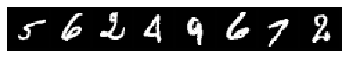

step 99, loss 2.7646098136901855
Target:	 tensor([7, 2, 2, 5, 0, 9, 0, 6], device='cuda:0')
Pred:	 tensor([7, 2, 3, 5, 2, 9, 2, 2], device='cuda:0')


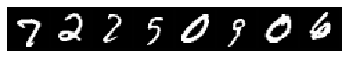

step 132, loss 2.42362904548645
Target:	 tensor([6, 9, 7, 5, 7, 7, 6, 0], device='cuda:0')
Pred:	 tensor([6, 9, 7, 5, 7, 7, 4, 2], device='cuda:0')


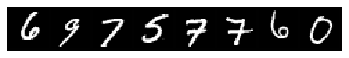

step 165, loss 2.9429101943969727
Target:	 tensor([7, 5, 5, 0, 7, 6, 2, 0], device='cuda:0')
Pred:	 tensor([7, 5, 5, 8, 7, 4, 2, 2], device='cuda:0')


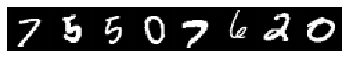

step 198, loss 1.2685316801071167
Target:	 tensor([8, 2, 4, 7, 1, 7, 2, 6], device='cuda:0')
Pred:	 tensor([9, 2, 9, 7, 1, 7, 2, 6], device='cuda:0')


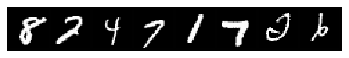

step 231, loss 2.1709024906158447
Target:	 tensor([7, 2, 6, 7, 4, 4, 6, 4], device='cuda:0')
Pred:	 tensor([1, 3, 6, 2, 4, 4, 6, 4], device='cuda:0')


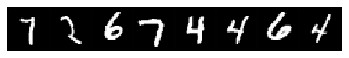

step 264, loss 2.1546225547790527
Target:	 tensor([3, 4, 5, 1, 0, 9, 2, 3], device='cuda:0')
Pred:	 tensor([7, 2, 5, 1, 2, 9, 2, 3], device='cuda:0')


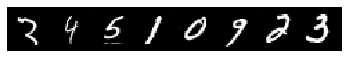

step 297, loss 1.519384503364563
Target:	 tensor([4, 6, 0, 8, 7, 5, 8, 2], device='cuda:0')
Pred:	 tensor([4, 6, 2, 8, 7, 5, 5, 2], device='cuda:0')


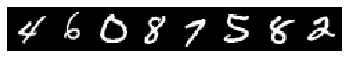

step 330, loss 1.8589481115341187
Target:	 tensor([2, 1, 3, 4, 3, 2, 3, 3], device='cuda:0')
Pred:	 tensor([2, 8, 3, 4, 3, 3, 5, 3], device='cuda:0')


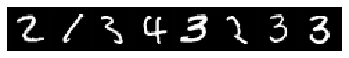

step 363, loss 2.530014753341675
Target:	 tensor([6, 5, 0, 6, 5, 1, 7, 9], device='cuda:0')
Pred:	 tensor([6, 5, 2, 2, 4, 1, 7, 9], device='cuda:0')


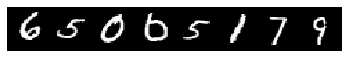

step 396, loss 2.239088296890259
Target:	 tensor([0, 3, 3, 5, 1, 9, 5, 6], device='cuda:0')
Pred:	 tensor([5, 3, 8, 5, 1, 3, 5, 6], device='cuda:0')


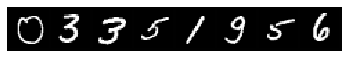

step 429, loss 0.42363440990448
Target:	 tensor([4, 4, 5, 2, 3, 2, 4, 8], device='cuda:0')
Pred:	 tensor([4, 4, 5, 2, 3, 2, 4, 8], device='cuda:0')


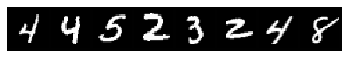

step 462, loss 0.40370678901672363
Target:	 tensor([2, 2, 8, 8, 4, 9, 2, 8], device='cuda:0')
Pred:	 tensor([2, 2, 8, 1, 4, 9, 2, 8], device='cuda:0')


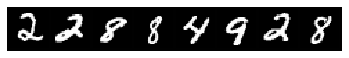

step 495, loss 2.1411566734313965
Target:	 tensor([7, 6, 5, 2, 2, 0, 3, 9], device='cuda:0')
Pred:	 tensor([7, 6, 5, 1, 2, 2, 3, 2], device='cuda:0')


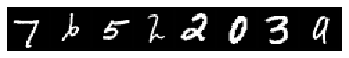

step 528, loss 2.0779693126678467
Target:	 tensor([1, 3, 7, 8, 8, 4, 2, 4], device='cuda:0')
Pred:	 tensor([1, 3, 7, 8, 8, 4, 2, 4], device='cuda:0')


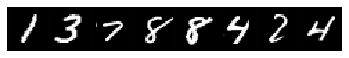

step 561, loss 1.152087926864624
Target:	 tensor([2, 8, 2, 7, 2, 1, 8, 4], device='cuda:0')
Pred:	 tensor([2, 8, 2, 7, 2, 1, 1, 4], device='cuda:0')


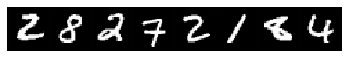

step 594, loss 0.7678912281990051
Target:	 tensor([3, 1, 1, 1, 9, 6, 5, 8], device='cuda:0')
Pred:	 tensor([3, 1, 1, 1, 9, 6, 5, 8], device='cuda:0')


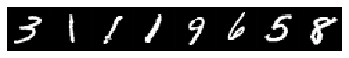

step 627, loss 1.3611799478530884
Target:	 tensor([1, 9, 2, 2, 4, 0, 8, 7], device='cuda:0')
Pred:	 tensor([1, 9, 1, 2, 4, 2, 8, 7], device='cuda:0')


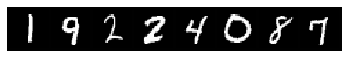

step 660, loss 1.1417678594589233
Target:	 tensor([7, 5, 1, 0, 5, 4, 5, 0], device='cuda:0')
Pred:	 tensor([7, 5, 1, 2, 5, 4, 5, 2], device='cuda:0')


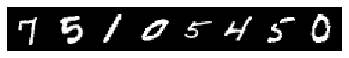

step 693, loss 1.1380059719085693
Target:	 tensor([9, 7, 9, 1, 1, 7, 9, 6], device='cuda:0')
Pred:	 tensor([9, 7, 9, 1, 1, 7, 9, 6], device='cuda:0')


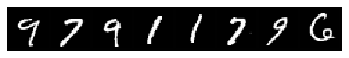

step 726, loss 1.476348876953125
Target:	 tensor([7, 0, 5, 0, 7, 5, 3, 4], device='cuda:0')
Pred:	 tensor([7, 9, 5, 2, 7, 5, 3, 4], device='cuda:0')


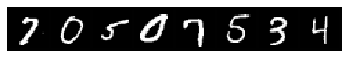

step 759, loss 2.0952401161193848
Target:	 tensor([2, 2, 4, 0, 7, 9, 7, 6], device='cuda:0')
Pred:	 tensor([2, 7, 4, 1, 7, 9, 7, 6], device='cuda:0')


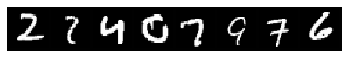

step 792, loss 0.8210562467575073
Target:	 tensor([1, 9, 8, 0, 3, 2, 8, 7], device='cuda:0')
Pred:	 tensor([1, 9, 8, 8, 3, 4, 8, 7], device='cuda:0')


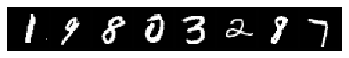

step 825, loss 0.5641516447067261
Target:	 tensor([5, 2, 4, 9, 6, 7, 2, 4], device='cuda:0')
Pred:	 tensor([5, 2, 9, 9, 6, 7, 3, 9], device='cuda:0')


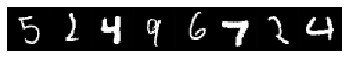

step 858, loss 0.4622265100479126
Target:	 tensor([4, 5, 1, 1, 5, 7, 5, 3], device='cuda:0')
Pred:	 tensor([4, 5, 1, 1, 9, 7, 5, 9], device='cuda:0')


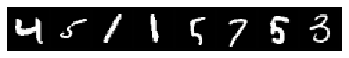

step 891, loss 0.3639041483402252
Target:	 tensor([7, 0, 7, 4, 2, 0, 6, 3], device='cuda:0')
Pred:	 tensor([7, 0, 7, 4, 2, 0, 6, 3], device='cuda:0')


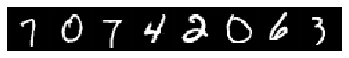

step 924, loss 0.23258918523788452
Target:	 tensor([7, 3, 5, 8, 2, 6, 1, 2], device='cuda:0')
Pred:	 tensor([7, 3, 5, 8, 2, 6, 1, 2], device='cuda:0')


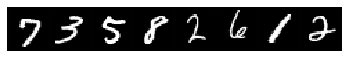

step 957, loss 0.2995598316192627
Target:	 tensor([9, 0, 5, 9, 7, 2, 1, 0], device='cuda:0')
Pred:	 tensor([9, 0, 5, 9, 7, 2, 1, 6], device='cuda:0')


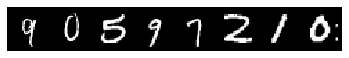

step 990, loss 0.445997416973114
Target:	 tensor([8, 1, 7, 3, 3, 0, 5, 9], device='cuda:0')
Pred:	 tensor([8, 1, 7, 3, 3, 0, 5, 9], device='cuda:0')


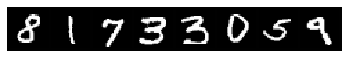

step 1023, loss 0.2089678943157196
Target:	 tensor([0, 4, 1, 9, 7, 5, 2, 8], device='cuda:0')
Pred:	 tensor([0, 4, 1, 9, 7, 5, 2, 8], device='cuda:0')


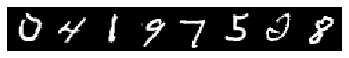

step 1056, loss 0.31453990936279297
Target:	 tensor([7, 1, 0, 0, 4, 7, 4, 5], device='cuda:0')
Pred:	 tensor([7, 1, 0, 5, 4, 7, 4, 5], device='cuda:0')


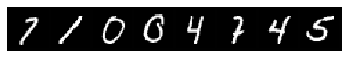

step 1089, loss 0.22565050423145294
Target:	 tensor([2, 4, 1, 3, 9, 5, 3, 7], device='cuda:0')
Pred:	 tensor([2, 4, 1, 3, 9, 5, 3, 7], device='cuda:0')


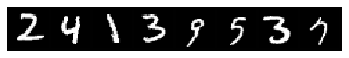

step 1122, loss 0.26280292868614197
Target:	 tensor([7, 9, 8, 2, 0, 0, 7, 2], device='cuda:0')
Pred:	 tensor([7, 9, 8, 2, 0, 0, 7, 2], device='cuda:0')


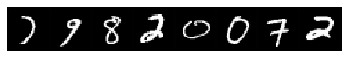

step 1155, loss 0.2405632734298706
Target:	 tensor([1, 1, 6, 9, 7, 7, 0, 9], device='cuda:0')
Pred:	 tensor([1, 1, 6, 9, 0, 7, 0, 9], device='cuda:0')


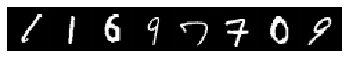

step 1188, loss 0.27096816897392273
Target:	 tensor([4, 9, 3, 4, 7, 8, 5, 6], device='cuda:0')
Pred:	 tensor([4, 9, 3, 4, 7, 8, 5, 6], device='cuda:0')


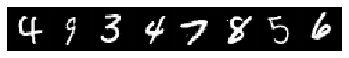

step 1221, loss 0.18485215306282043
Target:	 tensor([3, 3, 6, 1, 9, 2, 7, 8], device='cuda:0')
Pred:	 tensor([3, 3, 6, 1, 9, 2, 7, 8], device='cuda:0')


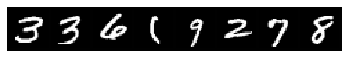

step 1254, loss 0.18750472366809845
Target:	 tensor([3, 7, 1, 7, 0, 0, 7, 9], device='cuda:0')
Pred:	 tensor([3, 7, 1, 7, 0, 0, 7, 9], device='cuda:0')


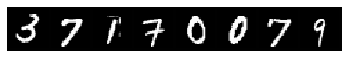

step 1287, loss 0.20307931303977966
Target:	 tensor([2, 0, 9, 3, 1, 4, 4, 1], device='cuda:0')
Pred:	 tensor([2, 0, 9, 3, 1, 4, 4, 1], device='cuda:0')


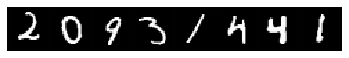

step 1320, loss 0.4449990391731262
Target:	 tensor([5, 9, 1, 4, 0, 9, 6, 5], device='cuda:0')
Pred:	 tensor([5, 9, 1, 4, 0, 9, 6, 5], device='cuda:0')


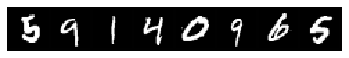

step 1353, loss 0.20578250288963318
Target:	 tensor([9, 5, 5, 5, 7, 7, 3, 7], device='cuda:0')
Pred:	 tensor([4, 5, 5, 5, 7, 7, 3, 7], device='cuda:0')


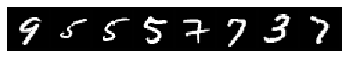

step 1386, loss 0.13368099927902222
Target:	 tensor([3, 7, 0, 3, 9, 4, 7, 9], device='cuda:0')
Pred:	 tensor([3, 7, 0, 3, 9, 4, 7, 9], device='cuda:0')


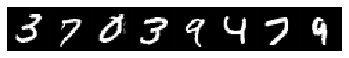

step 1419, loss 0.179551362991333
Target:	 tensor([8, 1, 2, 7, 5, 4, 4, 8], device='cuda:0')
Pred:	 tensor([8, 1, 2, 7, 5, 4, 4, 8], device='cuda:0')


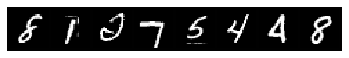

step 1452, loss 0.1926003247499466
Target:	 tensor([7, 3, 8, 3, 4, 9, 4, 2], device='cuda:0')
Pred:	 tensor([7, 3, 8, 3, 4, 9, 4, 2], device='cuda:0')


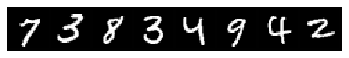

step 1485, loss 0.24872034788131714
Target:	 tensor([0, 2, 0, 1, 7, 5, 4, 4], device='cuda:0')
Pred:	 tensor([0, 2, 0, 1, 7, 5, 4, 4], device='cuda:0')


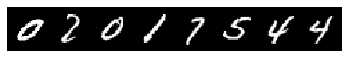

step 1518, loss 0.17631016671657562
Target:	 tensor([0, 0, 7, 3, 6, 8, 5, 1], device='cuda:0')
Pred:	 tensor([0, 0, 7, 3, 6, 8, 5, 1], device='cuda:0')


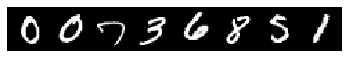

step 1551, loss 0.29719990491867065
Target:	 tensor([4, 0, 5, 9, 1, 7, 1, 7], device='cuda:0')
Pred:	 tensor([4, 0, 5, 3, 1, 7, 1, 7], device='cuda:0')


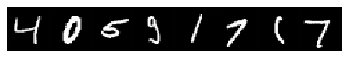

step 1584, loss 0.23903940618038177
Target:	 tensor([4, 1, 1, 9, 3, 4, 7, 7], device='cuda:0')
Pred:	 tensor([4, 1, 1, 9, 3, 4, 7, 7], device='cuda:0')


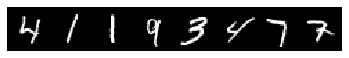

step 1617, loss 0.1534987986087799
Target:	 tensor([1, 1, 0, 8, 0, 2, 2, 8], device='cuda:0')
Pred:	 tensor([1, 1, 0, 8, 0, 2, 2, 8], device='cuda:0')


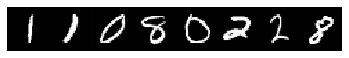

step 1650, loss 0.1159997433423996
Target:	 tensor([7, 4, 1, 8, 6, 3, 8, 0], device='cuda:0')
Pred:	 tensor([7, 4, 1, 8, 6, 3, 8, 0], device='cuda:0')


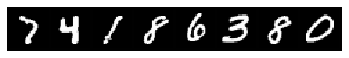

step 1683, loss 0.22581633925437927
Target:	 tensor([6, 9, 7, 2, 4, 8, 7, 8], device='cuda:0')
Pred:	 tensor([6, 9, 7, 2, 4, 8, 7, 8], device='cuda:0')


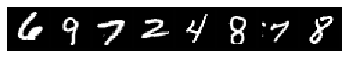

step 1716, loss 0.18225537240505219
Target:	 tensor([5, 0, 3, 7, 8, 7, 4, 7], device='cuda:0')
Pred:	 tensor([5, 0, 3, 7, 8, 7, 4, 7], device='cuda:0')


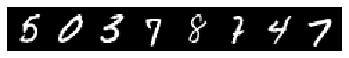

step 1749, loss 0.2085081934928894
Target:	 tensor([6, 6, 0, 1, 4, 4, 0, 1], device='cuda:0')
Pred:	 tensor([0, 6, 0, 1, 4, 4, 0, 1], device='cuda:0')


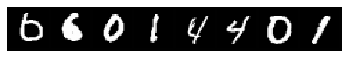

step 1782, loss 0.21488215029239655
Target:	 tensor([8, 4, 9, 3, 1, 6, 9, 1], device='cuda:0')
Pred:	 tensor([8, 4, 9, 3, 1, 6, 9, 1], device='cuda:0')


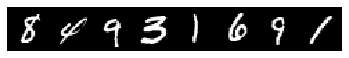

step 1815, loss 0.3157449960708618
Target:	 tensor([8, 4, 6, 5, 5, 4, 7, 3], device='cuda:0')
Pred:	 tensor([8, 4, 6, 5, 5, 4, 7, 3], device='cuda:0')


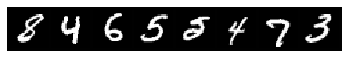

step 1848, loss 0.21811732649803162
Target:	 tensor([0, 0, 0, 7, 1, 7, 1, 8], device='cuda:0')
Pred:	 tensor([0, 0, 0, 7, 1, 7, 1, 8], device='cuda:0')


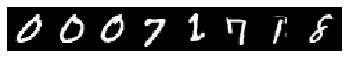

step 1881, loss 0.20773443579673767
Target:	 tensor([4, 3, 7, 5, 9, 7, 6, 3], device='cuda:0')
Pred:	 tensor([4, 3, 7, 5, 9, 7, 6, 3], device='cuda:0')


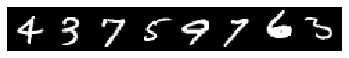

step 1914, loss 0.3640299141407013
Target:	 tensor([0, 4, 8, 7, 4, 7, 2, 6], device='cuda:0')
Pred:	 tensor([0, 4, 5, 7, 4, 7, 2, 6], device='cuda:0')


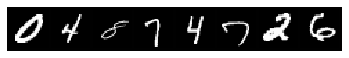

step 1947, loss 0.23276066780090332
Target:	 tensor([0, 4, 2, 4, 1, 5, 3, 0], device='cuda:0')
Pred:	 tensor([9, 4, 2, 4, 1, 5, 2, 0], device='cuda:0')


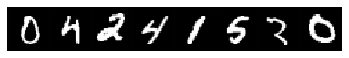

step 1980, loss 0.18887245655059814
Target:	 tensor([2, 8, 1, 3, 6, 3, 2, 3], device='cuda:0')
Pred:	 tensor([2, 8, 1, 3, 6, 3, 2, 3], device='cuda:0')


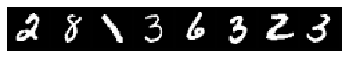

step 2013, loss 0.16697509586811066
Target:	 tensor([5, 8, 4, 9, 9, 9, 9, 4], device='cuda:0')
Pred:	 tensor([5, 8, 4, 9, 9, 9, 9, 4], device='cuda:0')


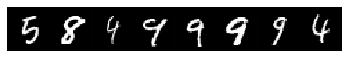

step 2046, loss 0.16943302750587463
Target:	 tensor([9, 2, 0, 4, 9, 7, 7, 2], device='cuda:0')
Pred:	 tensor([9, 2, 0, 4, 9, 7, 7, 2], device='cuda:0')


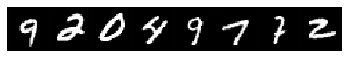

step 2079, loss 0.20150792598724365
Target:	 tensor([7, 3, 3, 2, 9, 7, 1, 2], device='cuda:0')
Pred:	 tensor([7, 3, 3, 2, 9, 7, 1, 2], device='cuda:0')


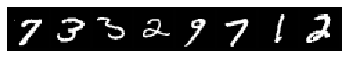

step 2112, loss 0.13447201251983643
Target:	 tensor([5, 6, 3, 6, 2, 7, 7, 8], device='cuda:0')
Pred:	 tensor([5, 6, 3, 6, 2, 7, 7, 8], device='cuda:0')


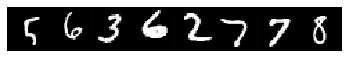

step 2145, loss 0.17173081636428833
Target:	 tensor([4, 8, 9, 7, 0, 4, 5, 7], device='cuda:0')
Pred:	 tensor([4, 8, 9, 7, 0, 4, 5, 7], device='cuda:0')


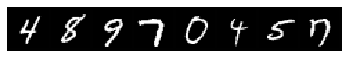

step 2178, loss 0.13943608105182648
Target:	 tensor([7, 6, 4, 9, 4, 8, 7, 7], device='cuda:0')
Pred:	 tensor([7, 6, 4, 9, 4, 8, 7, 7], device='cuda:0')


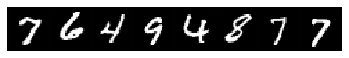

step 2211, loss 0.1943856179714203
Target:	 tensor([1, 2, 1, 4, 9, 9, 3, 0], device='cuda:0')
Pred:	 tensor([1, 2, 1, 4, 9, 9, 3, 0], device='cuda:0')


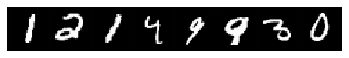

step 2244, loss 0.17998306453227997
Target:	 tensor([8, 7, 1, 7, 9, 2, 2, 4], device='cuda:0')
Pred:	 tensor([8, 7, 1, 7, 9, 2, 2, 4], device='cuda:0')


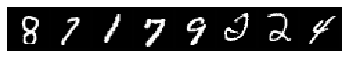

step 2277, loss 0.12716659903526306
Target:	 tensor([7, 0, 2, 9, 0, 0, 7, 7], device='cuda:0')
Pred:	 tensor([7, 0, 2, 9, 0, 0, 7, 7], device='cuda:0')


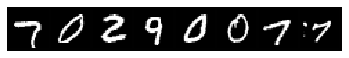

step 2310, loss 0.18999889492988586
Target:	 tensor([9, 2, 1, 2, 5, 7, 8, 2], device='cuda:0')
Pred:	 tensor([9, 2, 1, 2, 5, 7, 8, 2], device='cuda:0')


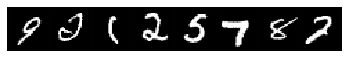

step 2343, loss 0.1885027289390564
Target:	 tensor([7, 0, 2, 7, 1, 9, 7, 9], device='cuda:0')
Pred:	 tensor([7, 0, 2, 7, 1, 3, 7, 9], device='cuda:0')


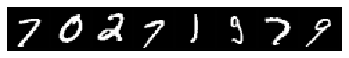

step 2376, loss 0.16102007031440735
Target:	 tensor([3, 0, 5, 5, 5, 3, 9, 4], device='cuda:0')
Pred:	 tensor([3, 0, 5, 5, 5, 3, 9, 4], device='cuda:0')


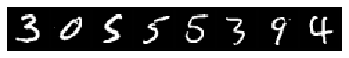

step 2409, loss 0.14922897517681122
Target:	 tensor([6, 2, 4, 3, 1, 8, 2, 0], device='cuda:0')
Pred:	 tensor([6, 2, 4, 3, 1, 8, 2, 0], device='cuda:0')


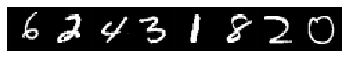

step 2442, loss 0.14606952667236328
Target:	 tensor([5, 5, 0, 2, 1, 4, 5, 1], device='cuda:0')
Pred:	 tensor([5, 5, 0, 2, 1, 4, 5, 1], device='cuda:0')


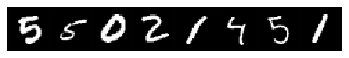

step 2475, loss 0.13046012818813324
Target:	 tensor([5, 3, 0, 1, 5, 6, 0, 9], device='cuda:0')
Pred:	 tensor([5, 3, 0, 1, 5, 6, 0, 9], device='cuda:0')


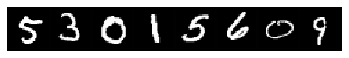

step 2508, loss 0.15456534922122955
Target:	 tensor([4, 9, 2, 5, 3, 2, 0, 9], device='cuda:0')
Pred:	 tensor([4, 9, 2, 5, 3, 2, 0, 9], device='cuda:0')


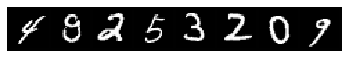

step 2541, loss 0.1648741066455841
Target:	 tensor([1, 0, 3, 4, 7, 4, 2, 6], device='cuda:0')
Pred:	 tensor([1, 0, 3, 4, 7, 4, 2, 6], device='cuda:0')


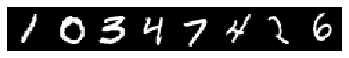

step 2574, loss 0.11933623999357224
Target:	 tensor([0, 9, 6, 9, 0, 3, 6, 9], device='cuda:0')
Pred:	 tensor([0, 9, 6, 9, 0, 3, 6, 9], device='cuda:0')


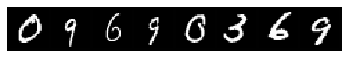

step 2607, loss 0.1268753707408905
Target:	 tensor([5, 4, 7, 7, 6, 8, 3, 2], device='cuda:0')
Pred:	 tensor([5, 4, 7, 7, 6, 8, 3, 2], device='cuda:0')


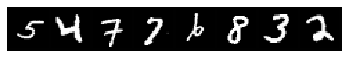

step 2640, loss 0.18339648842811584
Target:	 tensor([8, 4, 9, 6, 2, 0, 3, 6], device='cuda:0')
Pred:	 tensor([8, 4, 9, 6, 2, 0, 3, 6], device='cuda:0')


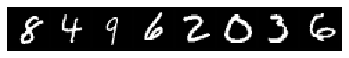

step 2673, loss 0.2050599455833435
Target:	 tensor([7, 4, 4, 6, 5, 1, 3, 9], device='cuda:0')
Pred:	 tensor([7, 4, 4, 6, 5, 1, 3, 9], device='cuda:0')


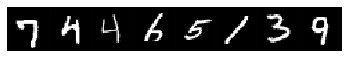

step 2706, loss 0.11698620021343231
Target:	 tensor([7, 0, 3, 1, 7, 9, 4, 4], device='cuda:0')
Pred:	 tensor([7, 0, 3, 1, 7, 9, 4, 4], device='cuda:0')


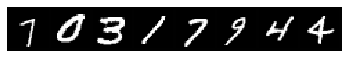

step 2739, loss 0.15453602373600006
Target:	 tensor([7, 1, 3, 7, 3, 8, 6, 7], device='cuda:0')
Pred:	 tensor([7, 1, 3, 7, 3, 8, 6, 7], device='cuda:0')


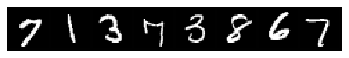

step 2772, loss 0.13352647423744202
Target:	 tensor([3, 4, 7, 1, 6, 9, 0, 0], device='cuda:0')
Pred:	 tensor([3, 4, 7, 1, 6, 9, 0, 0], device='cuda:0')


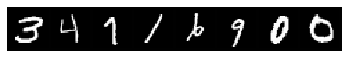

step 2805, loss 0.13998451828956604
Target:	 tensor([0, 5, 0, 2, 3, 3, 7, 4], device='cuda:0')
Pred:	 tensor([0, 5, 0, 2, 3, 3, 7, 4], device='cuda:0')


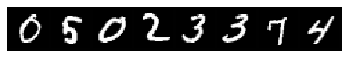

step 2838, loss 0.15612298250198364
Target:	 tensor([0, 9, 0, 9, 3, 4, 0, 6], device='cuda:0')
Pred:	 tensor([0, 9, 0, 9, 3, 4, 0, 6], device='cuda:0')


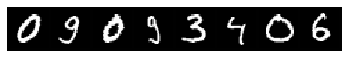

step 2871, loss 0.12622220814228058
Target:	 tensor([0, 2, 6, 1, 1, 7, 4, 1], device='cuda:0')
Pred:	 tensor([0, 2, 6, 1, 1, 7, 4, 1], device='cuda:0')


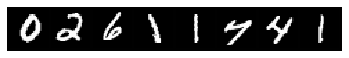

step 2904, loss 0.1143878772854805
Target:	 tensor([7, 2, 2, 3, 1, 4, 3, 5], device='cuda:0')
Pred:	 tensor([7, 2, 2, 3, 1, 4, 3, 5], device='cuda:0')


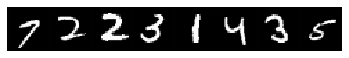

step 2937, loss 0.13669335842132568
Target:	 tensor([5, 7, 0, 7, 5, 0, 6, 7], device='cuda:0')
Pred:	 tensor([5, 7, 0, 7, 5, 0, 6, 7], device='cuda:0')


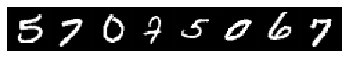

step 2970, loss 0.1160423755645752
Target:	 tensor([3, 9, 5, 9, 4, 0, 9, 4], device='cuda:0')
Pred:	 tensor([3, 9, 5, 9, 4, 0, 9, 4], device='cuda:0')


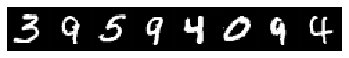

step 3003, loss 0.1266573965549469
Target:	 tensor([9, 5, 9, 6, 8, 8, 4, 3], device='cuda:0')
Pred:	 tensor([9, 5, 9, 6, 8, 8, 4, 3], device='cuda:0')


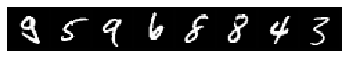

step 3036, loss 0.14993911981582642
Target:	 tensor([2, 3, 8, 4, 1, 9, 8, 4], device='cuda:0')
Pred:	 tensor([2, 3, 8, 4, 1, 9, 8, 4], device='cuda:0')


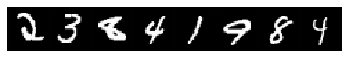

step 3069, loss 0.12349838018417358
Target:	 tensor([8, 1, 9, 7, 7, 2, 9, 2], device='cuda:0')
Pred:	 tensor([8, 1, 9, 7, 7, 2, 9, 2], device='cuda:0')


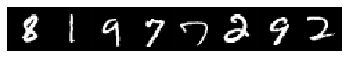

step 3102, loss 0.13425466418266296
Target:	 tensor([2, 1, 1, 0, 4, 3, 1, 0], device='cuda:0')
Pred:	 tensor([2, 1, 1, 0, 4, 3, 1, 0], device='cuda:0')


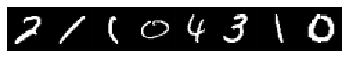

step 3135, loss 0.12879948318004608
Target:	 tensor([2, 9, 2, 8, 8, 0, 5, 2], device='cuda:0')
Pred:	 tensor([2, 9, 2, 8, 8, 0, 5, 2], device='cuda:0')


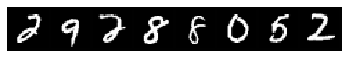

step 3168, loss 0.1420716643333435
Target:	 tensor([3, 6, 6, 7, 2, 3, 7, 1], device='cuda:0')
Pred:	 tensor([3, 6, 6, 7, 2, 3, 7, 1], device='cuda:0')


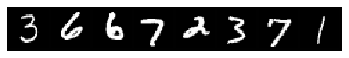

step 3201, loss 0.14161908626556396
Target:	 tensor([4, 3, 5, 2, 9, 4, 8, 9], device='cuda:0')
Pred:	 tensor([4, 3, 5, 2, 9, 4, 8, 9], device='cuda:0')


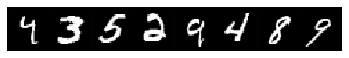

step 3234, loss 0.10794977843761444
Target:	 tensor([3, 9, 4, 3, 7, 1, 0, 4], device='cuda:0')
Pred:	 tensor([3, 9, 4, 3, 7, 1, 0, 4], device='cuda:0')


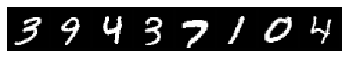

step 3267, loss 0.11944453418254852
Target:	 tensor([2, 5, 0, 3, 4, 9, 4, 0], device='cuda:0')
Pred:	 tensor([2, 5, 0, 3, 4, 9, 4, 0], device='cuda:0')


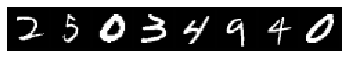

step 0, loss 8.882466316223145
Target:	 tensor([1, 7, 9, 0, 2, 1, 3, 8], device='cuda:0')
Pred:	 tensor([2, 8, 8, 2, 8, 2, 9, 8], device='cuda:0')


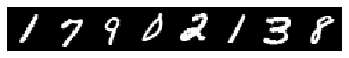

step 33, loss 5.7191243171691895
Target:	 tensor([8, 1, 9, 1, 1, 4, 9, 4], device='cuda:0')
Pred:	 tensor([8, 2, 2, 2, 2, 7, 2, 3], device='cuda:0')


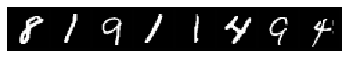

step 66, loss 3.6496660709381104
Target:	 tensor([5, 0, 5, 9, 7, 9, 1, 7], device='cuda:0')
Pred:	 tensor([4, 0, 0, 4, 7, 7, 3, 6], device='cuda:0')


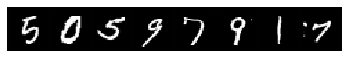

step 99, loss 3.2352542877197266
Target:	 tensor([1, 0, 7, 7, 2, 0, 9, 8], device='cuda:0')
Pred:	 tensor([1, 6, 3, 7, 2, 0, 4, 4], device='cuda:0')


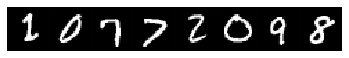

step 132, loss 1.7739750146865845
Target:	 tensor([7, 6, 4, 5, 4, 3, 7, 2], device='cuda:0')
Pred:	 tensor([1, 6, 9, 6, 4, 3, 7, 2], device='cuda:0')


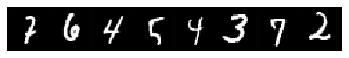

step 165, loss 2.9886245727539062
Target:	 tensor([3, 7, 4, 4, 5, 5, 4, 4], device='cuda:0')
Pred:	 tensor([2, 9, 4, 5, 5, 5, 9, 8], device='cuda:0')


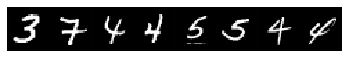

step 198, loss 1.800046682357788
Target:	 tensor([7, 9, 1, 7, 3, 3, 2, 9], device='cuda:0')
Pred:	 tensor([7, 9, 1, 7, 9, 3, 2, 7], device='cuda:0')


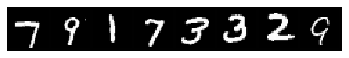

step 231, loss 2.0542962551116943
Target:	 tensor([7, 4, 9, 1, 9, 3, 3, 1], device='cuda:0')
Pred:	 tensor([7, 4, 9, 1, 9, 0, 6, 1], device='cuda:0')


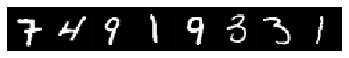

step 264, loss 1.8656039237976074
Target:	 tensor([1, 5, 2, 7, 7, 5, 7, 0], device='cuda:0')
Pred:	 tensor([1, 5, 2, 6, 7, 5, 5, 6], device='cuda:0')


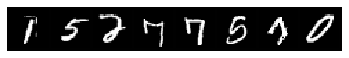

step 297, loss 1.5501272678375244
Target:	 tensor([8, 2, 3, 6, 4, 1, 0, 8], device='cuda:0')
Pred:	 tensor([8, 2, 3, 5, 4, 1, 0, 8], device='cuda:0')


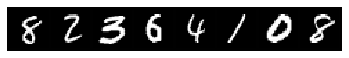

step 330, loss 1.472135305404663
Target:	 tensor([3, 9, 7, 7, 1, 9, 1, 3], device='cuda:0')
Pred:	 tensor([3, 2, 7, 7, 1, 9, 1, 3], device='cuda:0')


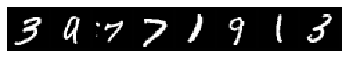

step 363, loss 1.8271608352661133
Target:	 tensor([4, 2, 4, 3, 3, 1, 3, 9], device='cuda:0')
Pred:	 tensor([4, 2, 4, 3, 0, 1, 3, 9], device='cuda:0')


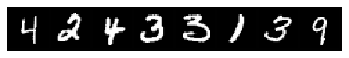

step 396, loss 1.9167194366455078
Target:	 tensor([0, 2, 5, 5, 6, 4, 7, 9], device='cuda:0')
Pred:	 tensor([2, 2, 5, 5, 6, 2, 2, 9], device='cuda:0')


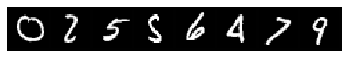

step 429, loss 1.8156906366348267
Target:	 tensor([2, 2, 4, 3, 4, 7, 2, 1], device='cuda:0')
Pred:	 tensor([3, 2, 6, 9, 4, 9, 2, 2], device='cuda:0')


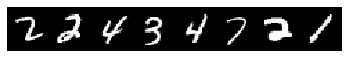

step 462, loss 2.1356379985809326
Target:	 tensor([3, 2, 4, 8, 1, 3, 7, 0], device='cuda:0')
Pred:	 tensor([9, 2, 9, 3, 1, 0, 7, 0], device='cuda:0')


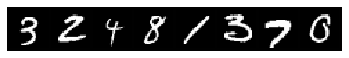

step 495, loss 1.554735541343689
Target:	 tensor([2, 7, 3, 7, 6, 5, 6, 7], device='cuda:0')
Pred:	 tensor([2, 7, 3, 7, 6, 5, 6, 7], device='cuda:0')


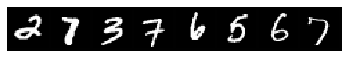

step 528, loss 1.8938348293304443
Target:	 tensor([3, 6, 6, 1, 4, 9, 8, 1], device='cuda:0')
Pred:	 tensor([3, 6, 4, 1, 4, 4, 8, 1], device='cuda:0')


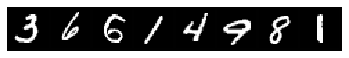

step 561, loss 1.619394063949585
Target:	 tensor([7, 0, 7, 8, 0, 8, 7, 1], device='cuda:0')
Pred:	 tensor([7, 0, 7, 8, 0, 8, 7, 1], device='cuda:0')


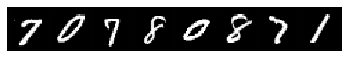

step 594, loss 1.159708857536316
Target:	 tensor([5, 4, 2, 2, 3, 6, 7, 1], device='cuda:0')
Pred:	 tensor([5, 4, 2, 2, 3, 6, 7, 1], device='cuda:0')


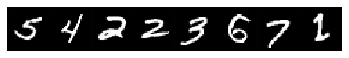

step 627, loss 1.1534173488616943
Target:	 tensor([8, 1, 7, 5, 1, 1, 7, 8], device='cuda:0')
Pred:	 tensor([8, 1, 7, 3, 1, 1, 7, 8], device='cuda:0')


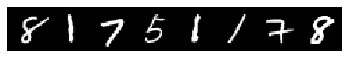

step 660, loss 1.398939609527588
Target:	 tensor([9, 8, 5, 9, 2, 6, 4, 3], device='cuda:0')
Pred:	 tensor([9, 8, 5, 9, 2, 6, 4, 3], device='cuda:0')


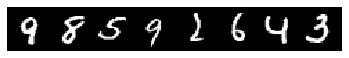

step 693, loss 1.0465666055679321
Target:	 tensor([7, 4, 4, 0, 7, 6, 2, 0], device='cuda:0')
Pred:	 tensor([7, 4, 4, 0, 7, 6, 2, 0], device='cuda:0')


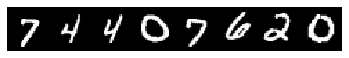

step 726, loss 1.1899142265319824
Target:	 tensor([9, 7, 4, 0, 4, 2, 9, 3], device='cuda:0')
Pred:	 tensor([9, 7, 4, 0, 4, 2, 9, 5], device='cuda:0')


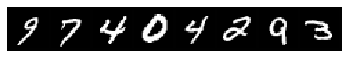

step 759, loss 1.1897649765014648
Target:	 tensor([0, 3, 2, 5, 7, 5, 7, 4], device='cuda:0')
Pred:	 tensor([0, 3, 2, 5, 7, 5, 7, 4], device='cuda:0')


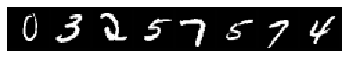

step 792, loss 1.2985363006591797
Target:	 tensor([0, 3, 0, 3, 5, 8, 6, 1], device='cuda:0')
Pred:	 tensor([0, 3, 0, 3, 5, 8, 6, 1], device='cuda:0')


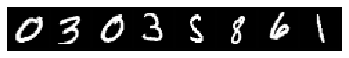

step 825, loss 1.1180459260940552
Target:	 tensor([0, 5, 6, 2, 9, 7, 4, 2], device='cuda:0')
Pred:	 tensor([0, 5, 6, 2, 9, 7, 4, 2], device='cuda:0')


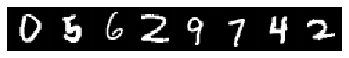

step 858, loss 1.3139078617095947
Target:	 tensor([1, 6, 7, 5, 0, 5, 8, 7], device='cuda:0')
Pred:	 tensor([1, 6, 7, 5, 0, 5, 8, 7], device='cuda:0')


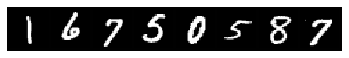

step 891, loss 1.7680542469024658
Target:	 tensor([4, 9, 1, 1, 8, 7, 2, 6], device='cuda:0')
Pred:	 tensor([4, 3, 1, 1, 3, 7, 2, 6], device='cuda:0')


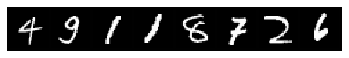

step 924, loss 1.6183234453201294
Target:	 tensor([5, 9, 1, 1, 0, 3, 0, 3], device='cuda:0')
Pred:	 tensor([5, 9, 1, 1, 0, 3, 0, 0], device='cuda:0')


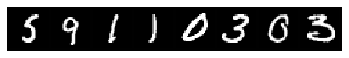

step 957, loss 1.2148361206054688
Target:	 tensor([3, 8, 5, 5, 4, 1, 6, 6], device='cuda:0')
Pred:	 tensor([3, 8, 5, 5, 4, 1, 6, 6], device='cuda:0')


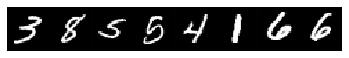

step 990, loss 1.1712439060211182
Target:	 tensor([4, 7, 4, 8, 0, 0, 6, 7], device='cuda:0')
Pred:	 tensor([9, 7, 4, 8, 0, 0, 6, 7], device='cuda:0')


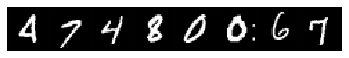

step 1023, loss 1.3900835514068604
Target:	 tensor([2, 0, 8, 5, 8, 4, 1, 6], device='cuda:0')
Pred:	 tensor([2, 0, 8, 9, 8, 4, 1, 6], device='cuda:0')


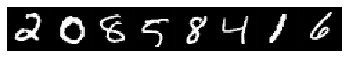

step 1056, loss 1.1355204582214355
Target:	 tensor([3, 6, 6, 6, 5, 2, 8, 5], device='cuda:0')
Pred:	 tensor([3, 6, 6, 6, 5, 2, 8, 7], device='cuda:0')


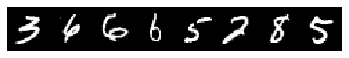

step 1089, loss 1.3958163261413574
Target:	 tensor([2, 5, 5, 3, 6, 3, 6, 0], device='cuda:0')
Pred:	 tensor([2, 5, 5, 3, 6, 3, 6, 0], device='cuda:0')


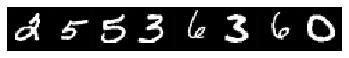

step 1122, loss 1.0696505308151245
Target:	 tensor([1, 0, 6, 4, 7, 0, 6, 3], device='cuda:0')
Pred:	 tensor([1, 0, 6, 4, 7, 0, 6, 3], device='cuda:0')


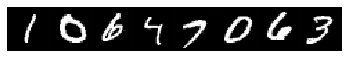

step 1155, loss 1.4650052785873413
Target:	 tensor([4, 0, 2, 9, 0, 7, 7, 1], device='cuda:0')
Pred:	 tensor([4, 0, 9, 9, 0, 7, 7, 7], device='cuda:0')


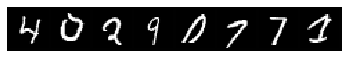

step 1188, loss 1.169783592224121
Target:	 tensor([4, 1, 7, 5, 3, 1, 7, 5], device='cuda:0')
Pred:	 tensor([4, 1, 7, 5, 3, 1, 7, 5], device='cuda:0')


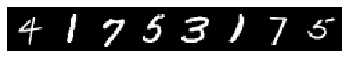

step 1221, loss 1.0660637617111206
Target:	 tensor([4, 7, 6, 8, 8, 1, 4, 1], device='cuda:0')
Pred:	 tensor([4, 7, 6, 8, 8, 1, 4, 1], device='cuda:0')


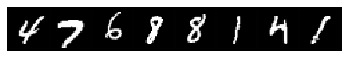

step 1254, loss 1.5932440757751465
Target:	 tensor([6, 2, 5, 8, 8, 5, 1, 1], device='cuda:0')
Pred:	 tensor([6, 2, 5, 8, 8, 5, 1, 1], device='cuda:0')


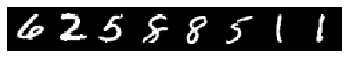

step 1287, loss 1.2227916717529297
Target:	 tensor([7, 0, 4, 4, 0, 9, 9, 4], device='cuda:0')
Pred:	 tensor([7, 0, 4, 4, 0, 9, 9, 4], device='cuda:0')


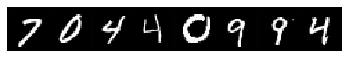

step 1320, loss 1.2025223970413208
Target:	 tensor([3, 1, 2, 7, 4, 7, 9, 9], device='cuda:0')
Pred:	 tensor([3, 1, 2, 9, 4, 2, 9, 9], device='cuda:0')


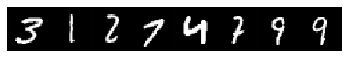

step 1353, loss 1.0733985900878906
Target:	 tensor([1, 4, 1, 2, 9, 2, 0, 4], device='cuda:0')
Pred:	 tensor([1, 4, 1, 2, 9, 2, 0, 4], device='cuda:0')


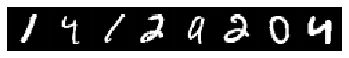

step 1386, loss 1.1413209438323975
Target:	 tensor([1, 5, 0, 1, 6, 6, 7, 4], device='cuda:0')
Pred:	 tensor([1, 5, 0, 1, 6, 6, 7, 4], device='cuda:0')


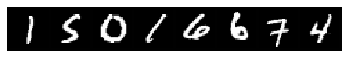

step 1419, loss 1.04468834400177
Target:	 tensor([2, 2, 2, 4, 5, 3, 1, 6], device='cuda:0')
Pred:	 tensor([2, 2, 6, 4, 5, 3, 1, 6], device='cuda:0')


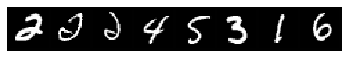

step 1452, loss 1.0240458250045776
Target:	 tensor([9, 7, 4, 4, 4, 1, 5, 0], device='cuda:0')
Pred:	 tensor([9, 7, 4, 4, 4, 1, 5, 0], device='cuda:0')


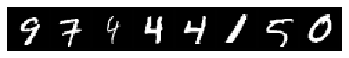

step 1485, loss 1.4903297424316406
Target:	 tensor([4, 2, 5, 5, 3, 7, 0, 4], device='cuda:0')
Pred:	 tensor([4, 2, 5, 5, 0, 7, 0, 2], device='cuda:0')


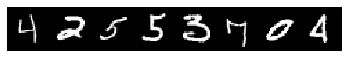

step 1518, loss 0.9909253716468811
Target:	 tensor([1, 3, 8, 1, 8, 5, 8, 2], device='cuda:0')
Pred:	 tensor([1, 3, 8, 1, 8, 5, 8, 2], device='cuda:0')


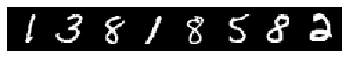

step 1551, loss 1.0652936697006226
Target:	 tensor([1, 0, 2, 7, 0, 1, 9, 8], device='cuda:0')
Pred:	 tensor([1, 0, 2, 7, 0, 1, 9, 8], device='cuda:0')


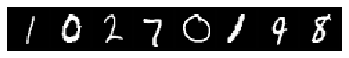

step 1584, loss 1.040855050086975
Target:	 tensor([4, 9, 0, 8, 4, 6, 8, 9], device='cuda:0')
Pred:	 tensor([4, 9, 0, 8, 4, 6, 8, 7], device='cuda:0')


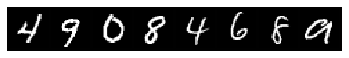

step 1617, loss 1.181144118309021
Target:	 tensor([2, 7, 4, 4, 9, 9, 3, 3], device='cuda:0')
Pred:	 tensor([2, 7, 4, 4, 9, 9, 3, 3], device='cuda:0')


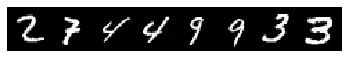

step 1650, loss 1.1387594938278198
Target:	 tensor([6, 6, 0, 5, 8, 2, 2, 6], device='cuda:0')
Pred:	 tensor([6, 6, 0, 5, 1, 2, 2, 6], device='cuda:0')


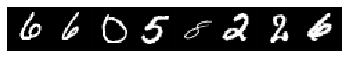

step 1683, loss 1.1430985927581787
Target:	 tensor([4, 6, 1, 7, 7, 3, 6, 5], device='cuda:0')
Pred:	 tensor([4, 6, 1, 7, 7, 3, 6, 5], device='cuda:0')


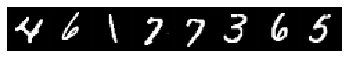

step 1716, loss 1.0090467929840088
Target:	 tensor([7, 7, 2, 6, 0, 6, 7, 7], device='cuda:0')
Pred:	 tensor([7, 7, 2, 6, 0, 6, 7, 7], device='cuda:0')


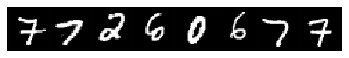

step 1749, loss 1.35276460647583
Target:	 tensor([3, 1, 5, 4, 6, 8, 9, 2], device='cuda:0')
Pred:	 tensor([3, 1, 5, 4, 6, 8, 9, 2], device='cuda:0')


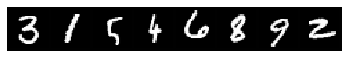

step 1782, loss 1.228845238685608
Target:	 tensor([5, 1, 5, 9, 5, 1, 4, 8], device='cuda:0')
Pred:	 tensor([5, 1, 2, 9, 5, 1, 9, 8], device='cuda:0')


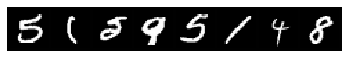

step 1815, loss 1.0380380153656006
Target:	 tensor([9, 8, 6, 9, 8, 6, 5, 5], device='cuda:0')
Pred:	 tensor([9, 8, 6, 9, 8, 6, 5, 5], device='cuda:0')


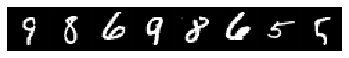

step 1848, loss 1.0061720609664917
Target:	 tensor([8, 2, 9, 3, 0, 4, 8, 5], device='cuda:0')
Pred:	 tensor([8, 2, 9, 3, 0, 4, 8, 5], device='cuda:0')


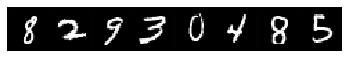

step 1881, loss 1.0021271705627441
Target:	 tensor([1, 2, 2, 3, 0, 5, 7, 7], device='cuda:0')
Pred:	 tensor([1, 2, 2, 3, 0, 5, 7, 7], device='cuda:0')


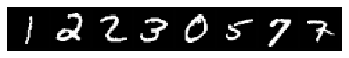

step 1914, loss 1.2907536029815674
Target:	 tensor([7, 0, 7, 8, 8, 6, 2, 0], device='cuda:0')
Pred:	 tensor([7, 0, 7, 8, 8, 6, 2, 0], device='cuda:0')


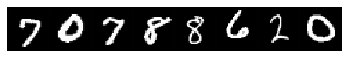

step 1947, loss 1.2990245819091797
Target:	 tensor([0, 9, 0, 5, 5, 9, 1, 1], device='cuda:0')
Pred:	 tensor([0, 9, 0, 5, 5, 9, 7, 1], device='cuda:0')


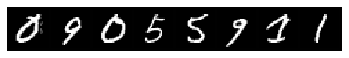

step 1980, loss 1.242326021194458
Target:	 tensor([5, 7, 0, 7, 0, 4, 2, 9], device='cuda:0')
Pred:	 tensor([5, 2, 0, 9, 0, 4, 2, 9], device='cuda:0')


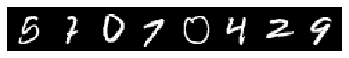

step 2013, loss 1.07469642162323
Target:	 tensor([0, 9, 5, 4, 2, 8, 3, 7], device='cuda:0')
Pred:	 tensor([0, 9, 5, 4, 2, 8, 3, 7], device='cuda:0')


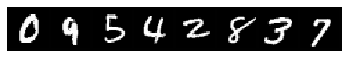

step 2046, loss 1.0199413299560547
Target:	 tensor([9, 0, 3, 8, 9, 4, 3, 2], device='cuda:0')
Pred:	 tensor([9, 0, 3, 8, 9, 4, 3, 2], device='cuda:0')


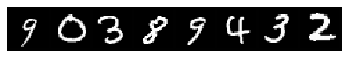

step 2079, loss 1.1074445247650146
Target:	 tensor([3, 8, 6, 2, 9, 6, 0, 4], device='cuda:0')
Pred:	 tensor([3, 8, 6, 2, 9, 6, 0, 4], device='cuda:0')


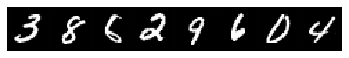

step 2112, loss 1.0296772718429565
Target:	 tensor([0, 9, 3, 6, 4, 6, 1, 4], device='cuda:0')
Pred:	 tensor([0, 9, 3, 6, 4, 6, 1, 4], device='cuda:0')


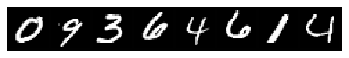

step 2145, loss 0.9793448448181152
Target:	 tensor([6, 0, 3, 6, 5, 2, 4, 5], device='cuda:0')
Pred:	 tensor([6, 0, 3, 6, 5, 2, 4, 5], device='cuda:0')


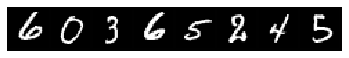

step 2178, loss 0.9815237522125244
Target:	 tensor([1, 0, 7, 3, 4, 3, 4, 4], device='cuda:0')
Pred:	 tensor([1, 0, 7, 3, 4, 3, 4, 4], device='cuda:0')


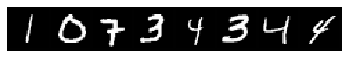

step 2211, loss 1.0898209810256958
Target:	 tensor([8, 0, 1, 9, 1, 5, 8, 9], device='cuda:0')
Pred:	 tensor([8, 0, 1, 9, 1, 5, 8, 9], device='cuda:0')


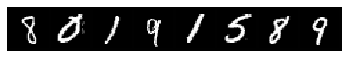

step 2244, loss 1.0205620527267456
Target:	 tensor([9, 1, 7, 2, 4, 3, 7, 2], device='cuda:0')
Pred:	 tensor([9, 1, 7, 2, 4, 3, 7, 2], device='cuda:0')


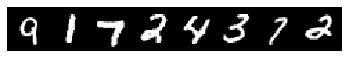

step 2277, loss 1.1678097248077393
Target:	 tensor([4, 2, 3, 5, 8, 5, 0, 6], device='cuda:0')
Pred:	 tensor([4, 2, 3, 5, 8, 5, 0, 6], device='cuda:0')


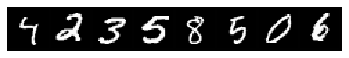

step 2310, loss 1.024356722831726
Target:	 tensor([5, 0, 3, 8, 8, 6, 1, 3], device='cuda:0')
Pred:	 tensor([5, 0, 3, 8, 8, 6, 1, 3], device='cuda:0')


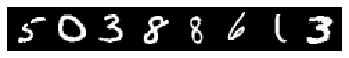

step 2343, loss 0.9992669820785522
Target:	 tensor([1, 0, 0, 0, 0, 7, 1, 9], device='cuda:0')
Pred:	 tensor([1, 0, 0, 0, 0, 7, 1, 9], device='cuda:0')


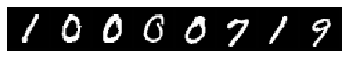

step 2376, loss 1.0099695920944214
Target:	 tensor([1, 3, 4, 8, 1, 4, 3, 3], device='cuda:0')
Pred:	 tensor([1, 3, 4, 8, 1, 4, 3, 3], device='cuda:0')


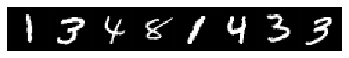

step 2409, loss 1.060925006866455
Target:	 tensor([3, 2, 1, 9, 7, 0, 8, 1], device='cuda:0')
Pred:	 tensor([3, 2, 1, 9, 7, 0, 8, 1], device='cuda:0')


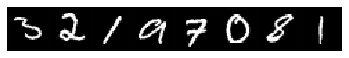

step 2442, loss 1.096907138824463
Target:	 tensor([7, 4, 4, 3, 3, 3, 2, 1], device='cuda:0')
Pred:	 tensor([7, 4, 4, 3, 3, 3, 2, 1], device='cuda:0')


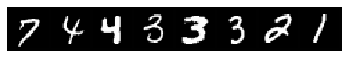

step 2475, loss 1.095862627029419
Target:	 tensor([2, 8, 9, 2, 5, 9, 3, 5], device='cuda:0')
Pred:	 tensor([2, 8, 9, 2, 5, 9, 3, 5], device='cuda:0')


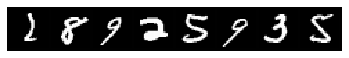

step 2508, loss 1.1680545806884766
Target:	 tensor([3, 5, 3, 7, 4, 8, 0, 6], device='cuda:0')
Pred:	 tensor([3, 5, 3, 7, 4, 8, 0, 6], device='cuda:0')


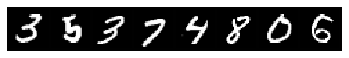

step 2541, loss 1.009386420249939
Target:	 tensor([9, 6, 4, 3, 9, 1, 1, 9], device='cuda:0')
Pred:	 tensor([9, 6, 4, 3, 9, 1, 1, 9], device='cuda:0')


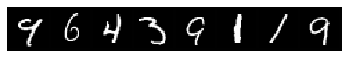

step 2574, loss 1.1860153675079346
Target:	 tensor([3, 7, 5, 0, 3, 2, 0, 4], device='cuda:0')
Pred:	 tensor([3, 7, 5, 0, 3, 2, 0, 4], device='cuda:0')


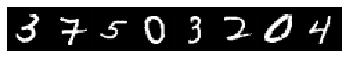

step 2607, loss 1.0106860399246216
Target:	 tensor([2, 7, 5, 1, 3, 9, 9, 9], device='cuda:0')
Pred:	 tensor([2, 7, 5, 1, 3, 9, 9, 9], device='cuda:0')


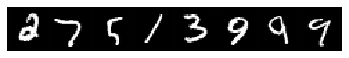

step 2640, loss 1.0149056911468506
Target:	 tensor([3, 2, 0, 3, 0, 3, 2, 9], device='cuda:0')
Pred:	 tensor([3, 2, 0, 3, 0, 3, 2, 9], device='cuda:0')


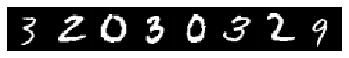

step 2673, loss 1.0100452899932861
Target:	 tensor([9, 9, 7, 7, 5, 3, 5, 1], device='cuda:0')
Pred:	 tensor([9, 9, 7, 7, 5, 3, 5, 1], device='cuda:0')


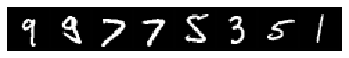

step 2706, loss 0.9857094883918762
Target:	 tensor([6, 7, 7, 1, 2, 4, 9, 5], device='cuda:0')
Pred:	 tensor([6, 7, 7, 1, 2, 4, 9, 5], device='cuda:0')


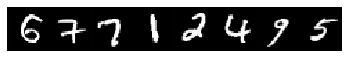

step 2739, loss 1.0105712413787842
Target:	 tensor([5, 0, 8, 2, 5, 4, 2, 7], device='cuda:0')
Pred:	 tensor([5, 0, 8, 2, 5, 4, 2, 7], device='cuda:0')


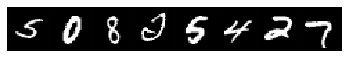

step 2772, loss 1.0226891040802002
Target:	 tensor([3, 2, 0, 8, 2, 9, 1, 9], device='cuda:0')
Pred:	 tensor([3, 2, 0, 8, 2, 9, 1, 9], device='cuda:0')


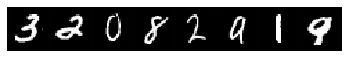

step 2805, loss 1.0034533739089966
Target:	 tensor([7, 7, 7, 6, 2, 8, 5, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 6, 2, 8, 5, 2], device='cuda:0')


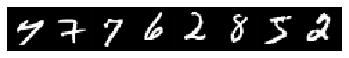

step 2838, loss 1.0409414768218994
Target:	 tensor([7, 7, 3, 1, 3, 3, 8, 8], device='cuda:0')
Pred:	 tensor([7, 7, 3, 1, 3, 3, 8, 8], device='cuda:0')


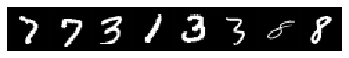

step 2871, loss 1.0192519426345825
Target:	 tensor([7, 3, 0, 7, 4, 3, 8, 9], device='cuda:0')
Pred:	 tensor([7, 3, 0, 7, 4, 3, 8, 9], device='cuda:0')


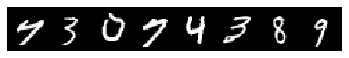

step 2904, loss 1.009941816329956
Target:	 tensor([6, 2, 8, 3, 9, 2, 8, 7], device='cuda:0')
Pred:	 tensor([6, 2, 8, 3, 9, 2, 8, 7], device='cuda:0')


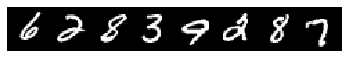

step 2937, loss 1.0206905603408813
Target:	 tensor([1, 3, 2, 8, 7, 7, 8, 0], device='cuda:0')
Pred:	 tensor([1, 3, 2, 8, 7, 7, 8, 0], device='cuda:0')


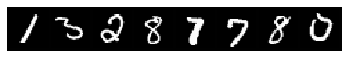

step 2970, loss 1.035875916481018
Target:	 tensor([7, 9, 3, 4, 2, 2, 6, 6], device='cuda:0')
Pred:	 tensor([7, 9, 3, 4, 2, 2, 6, 6], device='cuda:0')


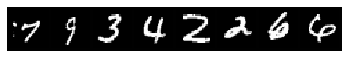

step 3003, loss 1.0270496606826782
Target:	 tensor([1, 1, 6, 9, 8, 5, 5, 0], device='cuda:0')
Pred:	 tensor([1, 1, 6, 9, 8, 5, 5, 0], device='cuda:0')


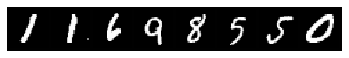

step 3036, loss 0.9574316740036011
Target:	 tensor([6, 3, 1, 4, 6, 7, 7, 4], device='cuda:0')
Pred:	 tensor([6, 3, 1, 4, 6, 7, 7, 4], device='cuda:0')


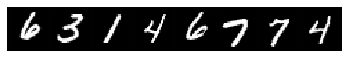

step 3069, loss 1.0905721187591553
Target:	 tensor([4, 6, 1, 0, 1, 4, 2, 5], device='cuda:0')
Pred:	 tensor([4, 0, 1, 0, 1, 4, 2, 5], device='cuda:0')


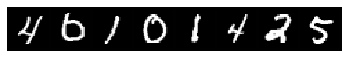

step 3102, loss 0.9939440488815308
Target:	 tensor([0, 0, 8, 5, 1, 1, 4, 1], device='cuda:0')
Pred:	 tensor([0, 0, 8, 5, 1, 1, 4, 1], device='cuda:0')


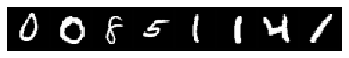

step 3135, loss 1.071161150932312
Target:	 tensor([4, 6, 1, 5, 4, 3, 2, 0], device='cuda:0')
Pred:	 tensor([4, 6, 1, 5, 4, 3, 2, 0], device='cuda:0')


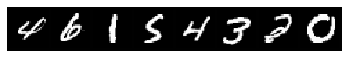

step 3168, loss 0.986573338508606
Target:	 tensor([9, 7, 8, 5, 8, 6, 2, 2], device='cuda:0')
Pred:	 tensor([9, 7, 8, 5, 8, 6, 2, 2], device='cuda:0')


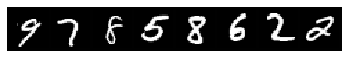

step 3201, loss 0.9788428544998169
Target:	 tensor([0, 3, 9, 1, 3, 2, 2, 4], device='cuda:0')
Pred:	 tensor([0, 3, 9, 1, 3, 2, 2, 4], device='cuda:0')


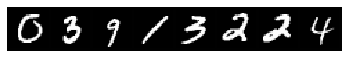

step 3234, loss 0.9909178614616394
Target:	 tensor([0, 8, 1, 6, 1, 1, 2, 2], device='cuda:0')
Pred:	 tensor([0, 8, 1, 6, 1, 1, 2, 2], device='cuda:0')


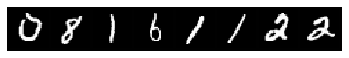

step 3267, loss 0.9859246611595154
Target:	 tensor([0, 4, 4, 5, 3, 7, 9, 0], device='cuda:0')
Pred:	 tensor([0, 4, 4, 5, 3, 7, 9, 0], device='cuda:0')


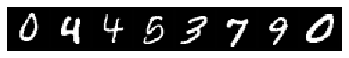

step 0, loss 19.067096710205078
Target:	 tensor([2, 0, 8, 7, 3, 2, 7, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 1, 7, 7], device='cuda:0')


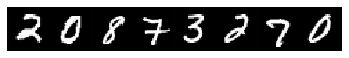

step 33, loss 15.59284782409668
Target:	 tensor([6, 9, 4, 1, 6, 3, 3, 4], device='cuda:0')
Pred:	 tensor([1, 2, 2, 9, 4, 2, 0, 7], device='cuda:0')


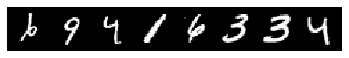

step 66, loss 13.48254108428955
Target:	 tensor([2, 6, 9, 7, 1, 6, 7, 2], device='cuda:0')
Pred:	 tensor([2, 7, 4, 7, 1, 5, 7, 2], device='cuda:0')


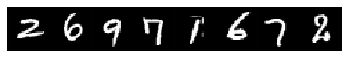

step 99, loss 13.8494291305542
Target:	 tensor([4, 1, 0, 3, 3, 9, 5, 5], device='cuda:0')
Pred:	 tensor([9, 2, 0, 5, 2, 5, 8, 2], device='cuda:0')


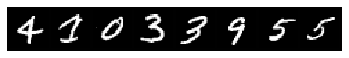

step 132, loss 14.649827003479004
Target:	 tensor([9, 4, 3, 4, 6, 6, 9, 1], device='cuda:0')
Pred:	 tensor([9, 4, 2, 8, 0, 9, 5, 7], device='cuda:0')


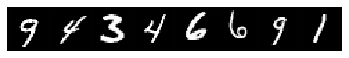

step 165, loss 12.947551727294922
Target:	 tensor([6, 4, 2, 7, 4, 5, 3, 4], device='cuda:0')
Pred:	 tensor([5, 4, 2, 7, 5, 5, 5, 4], device='cuda:0')


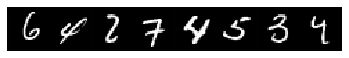

step 198, loss 12.97387409210205
Target:	 tensor([4, 4, 2, 1, 8, 6, 4, 7], device='cuda:0')
Pred:	 tensor([4, 4, 2, 1, 2, 4, 8, 7], device='cuda:0')


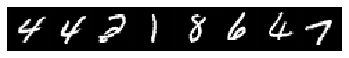

step 231, loss 13.325986862182617
Target:	 tensor([8, 6, 5, 0, 7, 0, 0, 8], device='cuda:0')
Pred:	 tensor([5, 8, 7, 0, 4, 5, 0, 0], device='cuda:0')


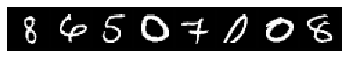

step 264, loss 13.460376739501953
Target:	 tensor([3, 3, 0, 3, 7, 5, 5, 6], device='cuda:0')
Pred:	 tensor([5, 2, 0, 5, 7, 5, 5, 5], device='cuda:0')


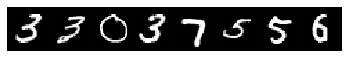

step 297, loss 13.637313842773438
Target:	 tensor([0, 2, 5, 2, 6, 4, 7, 9], device='cuda:0')
Pred:	 tensor([0, 2, 4, 2, 0, 4, 2, 4], device='cuda:0')


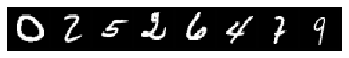

step 330, loss 12.555082321166992
Target:	 tensor([6, 4, 2, 0, 3, 6, 1, 5], device='cuda:0')
Pred:	 tensor([4, 4, 2, 0, 4, 4, 4, 0], device='cuda:0')


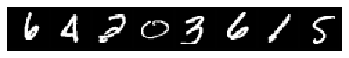

step 363, loss 10.868426322937012
Target:	 tensor([7, 1, 7, 5, 7, 8, 9, 7], device='cuda:0')
Pred:	 tensor([7, 1, 7, 5, 7, 8, 9, 7], device='cuda:0')


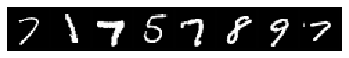

step 396, loss 12.631220817565918
Target:	 tensor([6, 0, 0, 9, 6, 7, 0, 9], device='cuda:0')
Pred:	 tensor([4, 0, 0, 4, 5, 7, 0, 2], device='cuda:0')


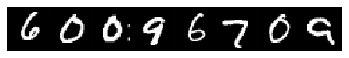

step 429, loss 13.49174690246582
Target:	 tensor([6, 9, 7, 4, 2, 3, 9, 2], device='cuda:0')
Pred:	 tensor([4, 4, 7, 4, 0, 5, 4, 2], device='cuda:0')


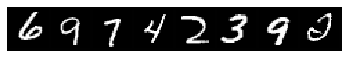

step 462, loss 12.250450134277344
Target:	 tensor([9, 5, 6, 9, 8, 9, 4, 8], device='cuda:0')
Pred:	 tensor([9, 7, 2, 9, 8, 9, 4, 8], device='cuda:0')


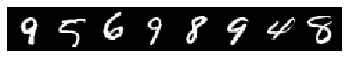

step 495, loss 12.234752655029297
Target:	 tensor([8, 4, 2, 2, 1, 4, 9, 6], device='cuda:0')
Pred:	 tensor([7, 4, 5, 2, 1, 4, 9, 4], device='cuda:0')


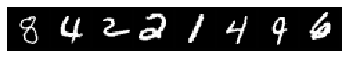

step 528, loss 10.858673095703125
Target:	 tensor([8, 8, 1, 9, 4, 9, 4, 0], device='cuda:0')
Pred:	 tensor([8, 8, 1, 9, 2, 9, 2, 0], device='cuda:0')


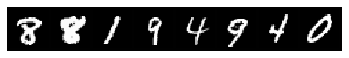

step 561, loss 12.631319046020508
Target:	 tensor([4, 3, 2, 3, 7, 7, 0, 0], device='cuda:0')
Pred:	 tensor([4, 5, 2, 5, 2, 7, 0, 0], device='cuda:0')


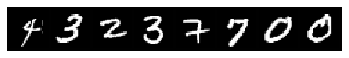

step 594, loss 11.32695198059082
Target:	 tensor([9, 4, 5, 3, 4, 5, 6, 0], device='cuda:0')
Pred:	 tensor([9, 4, 5, 5, 4, 5, 0, 0], device='cuda:0')


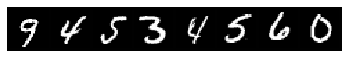

step 627, loss 13.666385650634766
Target:	 tensor([4, 7, 1, 3, 3, 6, 3, 9], device='cuda:0')
Pred:	 tensor([4, 7, 1, 5, 2, 5, 8, 9], device='cuda:0')


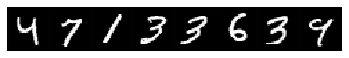

step 660, loss 14.171676635742188
Target:	 tensor([7, 9, 6, 3, 2, 3, 0, 9], device='cuda:0')
Pred:	 tensor([7, 9, 4, 2, 5, 5, 0, 9], device='cuda:0')


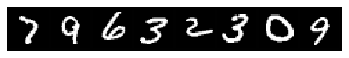

step 693, loss 12.496455192565918
Target:	 tensor([0, 4, 0, 2, 6, 6, 6, 5], device='cuda:0')
Pred:	 tensor([0, 4, 0, 2, 5, 5, 1, 5], device='cuda:0')


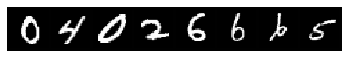

step 726, loss 10.21730899810791
Target:	 tensor([6, 1, 0, 4, 5, 0, 8, 7], device='cuda:0')
Pred:	 tensor([5, 1, 0, 4, 5, 0, 8, 7], device='cuda:0')


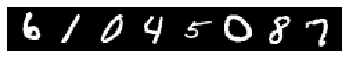

step 759, loss 10.873461723327637
Target:	 tensor([4, 7, 2, 1, 0, 8, 4, 4], device='cuda:0')
Pred:	 tensor([4, 9, 4, 1, 0, 6, 4, 4], device='cuda:0')


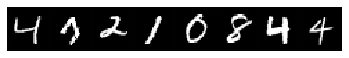

step 792, loss 12.094318389892578
Target:	 tensor([9, 6, 5, 3, 9, 4, 2, 9], device='cuda:0')
Pred:	 tensor([9, 5, 9, 5, 9, 4, 6, 4], device='cuda:0')


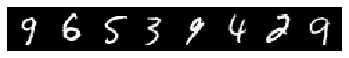

step 825, loss 11.116942405700684
Target:	 tensor([7, 0, 6, 1, 2, 4, 7, 9], device='cuda:0')
Pred:	 tensor([7, 4, 6, 1, 2, 4, 7, 9], device='cuda:0')


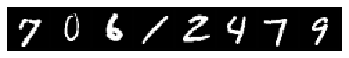

step 858, loss 10.90038013458252
Target:	 tensor([8, 7, 0, 4, 5, 3, 5, 4], device='cuda:0')
Pred:	 tensor([8, 7, 6, 4, 6, 8, 5, 9], device='cuda:0')


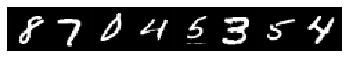

step 891, loss 12.031210899353027
Target:	 tensor([4, 3, 8, 7, 1, 5, 9, 0], device='cuda:0')
Pred:	 tensor([4, 8, 8, 7, 1, 5, 9, 0], device='cuda:0')


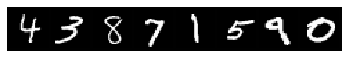

step 924, loss 12.245771408081055
Target:	 tensor([9, 9, 4, 6, 7, 3, 3, 7], device='cuda:0')
Pred:	 tensor([9, 9, 4, 6, 7, 5, 5, 7], device='cuda:0')


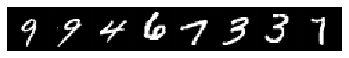

step 957, loss 11.486150741577148
Target:	 tensor([3, 9, 0, 4, 6, 3, 9, 1], device='cuda:0')
Pred:	 tensor([5, 9, 0, 4, 6, 5, 9, 1], device='cuda:0')


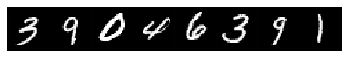

step 990, loss 10.089561462402344
Target:	 tensor([6, 3, 6, 7, 5, 8, 9, 4], device='cuda:0')
Pred:	 tensor([6, 5, 6, 7, 5, 8, 9, 4], device='cuda:0')


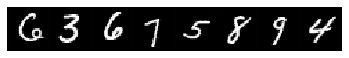

step 1023, loss 9.611448287963867
Target:	 tensor([7, 7, 5, 7, 1, 1, 5, 9], device='cuda:0')
Pred:	 tensor([7, 7, 5, 7, 1, 1, 5, 9], device='cuda:0')


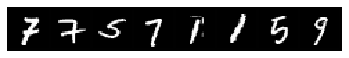

step 1056, loss 10.435318946838379
Target:	 tensor([6, 4, 9, 0, 7, 1, 8, 9], device='cuda:0')
Pred:	 tensor([6, 4, 9, 0, 7, 1, 8, 9], device='cuda:0')


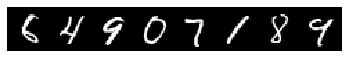

step 1089, loss 10.668680191040039
Target:	 tensor([7, 7, 2, 9, 6, 6, 1, 3], device='cuda:0')
Pred:	 tensor([7, 7, 6, 9, 6, 1, 1, 7], device='cuda:0')


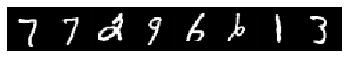

step 1122, loss 11.493535995483398
Target:	 tensor([7, 4, 5, 5, 1, 4, 9, 1], device='cuda:0')
Pred:	 tensor([7, 4, 5, 5, 6, 4, 9, 1], device='cuda:0')


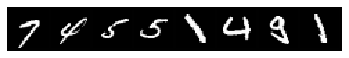

step 1155, loss 10.029169082641602
Target:	 tensor([8, 8, 5, 4, 8, 2, 9, 7], device='cuda:0')
Pred:	 tensor([8, 8, 5, 4, 8, 2, 9, 7], device='cuda:0')


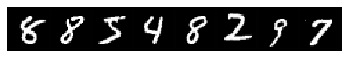

step 1188, loss 10.62685489654541
Target:	 tensor([9, 9, 0, 4, 7, 4, 2, 8], device='cuda:0')
Pred:	 tensor([9, 9, 0, 4, 7, 4, 2, 8], device='cuda:0')


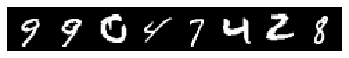

step 1221, loss 11.756589889526367
Target:	 tensor([8, 7, 3, 9, 2, 6, 1, 3], device='cuda:0')
Pred:	 tensor([8, 7, 5, 9, 1, 6, 1, 5], device='cuda:0')


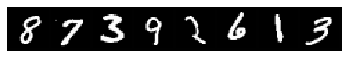

step 1254, loss 10.946892738342285
Target:	 tensor([1, 3, 5, 7, 1, 5, 6, 0], device='cuda:0')
Pred:	 tensor([1, 7, 5, 9, 1, 5, 6, 0], device='cuda:0')


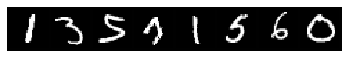

step 1287, loss 10.149456977844238
Target:	 tensor([9, 5, 7, 0, 5, 6, 4, 0], device='cuda:0')
Pred:	 tensor([9, 5, 7, 0, 6, 6, 4, 0], device='cuda:0')


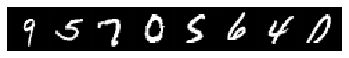

step 1320, loss 12.288919448852539
Target:	 tensor([3, 3, 4, 0, 5, 5, 3, 3], device='cuda:0')
Pred:	 tensor([5, 1, 4, 0, 5, 5, 5, 2], device='cuda:0')


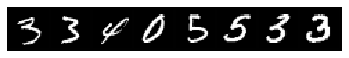

step 1353, loss 10.516500473022461
Target:	 tensor([7, 9, 6, 3, 6, 0, 9, 6], device='cuda:0')
Pred:	 tensor([7, 7, 6, 7, 6, 0, 9, 6], device='cuda:0')


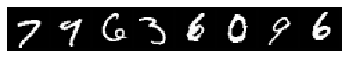

step 1386, loss 11.487096786499023
Target:	 tensor([9, 3, 5, 3, 2, 0, 6, 7], device='cuda:0')
Pred:	 tensor([9, 5, 5, 5, 2, 0, 6, 7], device='cuda:0')


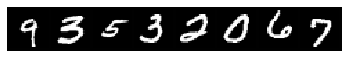

step 1419, loss 10.447356224060059
Target:	 tensor([8, 3, 7, 5, 9, 4, 4, 1], device='cuda:0')
Pred:	 tensor([8, 0, 7, 5, 9, 4, 4, 1], device='cuda:0')


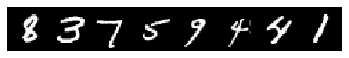

step 1452, loss 10.931130409240723
Target:	 tensor([2, 9, 9, 5, 2, 8, 2, 3], device='cuda:0')
Pred:	 tensor([2, 9, 9, 5, 2, 8, 2, 9], device='cuda:0')


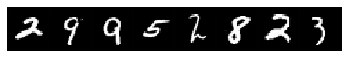

step 1485, loss 10.008260726928711
Target:	 tensor([1, 6, 0, 6, 0, 3, 2, 5], device='cuda:0')
Pred:	 tensor([1, 5, 0, 6, 0, 8, 2, 5], device='cuda:0')


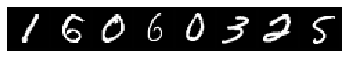

step 1518, loss 10.442435264587402
Target:	 tensor([9, 2, 7, 0, 3, 5, 4, 8], device='cuda:0')
Pred:	 tensor([4, 2, 7, 0, 5, 5, 4, 8], device='cuda:0')


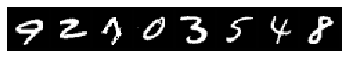

step 1551, loss 9.464136123657227
Target:	 tensor([8, 2, 9, 5, 8, 7, 1, 7], device='cuda:0')
Pred:	 tensor([6, 2, 9, 5, 8, 7, 1, 7], device='cuda:0')


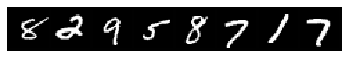

step 1584, loss 10.532709121704102
Target:	 tensor([4, 1, 4, 1, 2, 4, 9, 9], device='cuda:0')
Pred:	 tensor([4, 1, 4, 1, 2, 4, 9, 7], device='cuda:0')


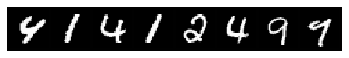

step 1617, loss 9.862783432006836
Target:	 tensor([2, 7, 4, 7, 2, 4, 0, 1], device='cuda:0')
Pred:	 tensor([2, 7, 4, 7, 2, 4, 0, 1], device='cuda:0')


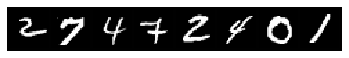

step 1650, loss 10.306877136230469
Target:	 tensor([9, 8, 4, 4, 6, 8, 1, 3], device='cuda:0')
Pred:	 tensor([9, 8, 4, 4, 6, 8, 1, 7], device='cuda:0')


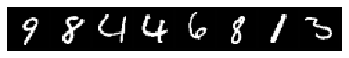

step 1683, loss 10.384739875793457
Target:	 tensor([1, 7, 0, 9, 0, 3, 7, 6], device='cuda:0')
Pred:	 tensor([1, 7, 0, 9, 0, 5, 7, 6], device='cuda:0')


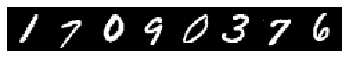

step 1716, loss 11.302521705627441
Target:	 tensor([6, 7, 2, 3, 1, 5, 9, 3], device='cuda:0')
Pred:	 tensor([6, 7, 2, 7, 1, 5, 9, 5], device='cuda:0')


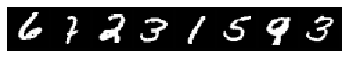

step 1749, loss 10.305191040039062
Target:	 tensor([1, 3, 7, 2, 4, 7, 6, 1], device='cuda:0')
Pred:	 tensor([1, 8, 7, 2, 4, 7, 6, 1], device='cuda:0')


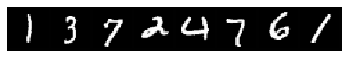

step 1782, loss 9.48503303527832
Target:	 tensor([0, 9, 2, 7, 7, 1, 5, 2], device='cuda:0')
Pred:	 tensor([0, 9, 2, 7, 7, 1, 4, 2], device='cuda:0')


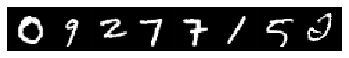

step 1815, loss 9.731825828552246
Target:	 tensor([4, 0, 2, 4, 6, 3, 5, 5], device='cuda:0')
Pred:	 tensor([4, 0, 2, 4, 6, 5, 5, 3], device='cuda:0')


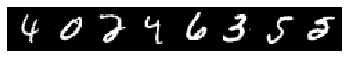

step 1848, loss 9.261324882507324
Target:	 tensor([6, 2, 1, 4, 7, 0, 1, 0], device='cuda:0')
Pred:	 tensor([6, 2, 1, 4, 7, 0, 1, 0], device='cuda:0')


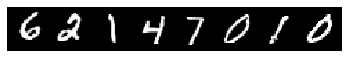

step 1881, loss 9.566895484924316
Target:	 tensor([1, 8, 2, 8, 9, 9, 6, 1], device='cuda:0')
Pred:	 tensor([1, 8, 2, 8, 9, 9, 6, 1], device='cuda:0')


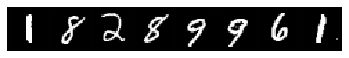

step 1914, loss 9.592241287231445
Target:	 tensor([8, 1, 8, 4, 3, 2, 5, 2], device='cuda:0')
Pred:	 tensor([8, 1, 8, 4, 5, 2, 5, 2], device='cuda:0')


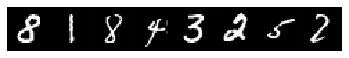

step 1947, loss 9.352561950683594
Target:	 tensor([7, 3, 9, 6, 8, 8, 3, 0], device='cuda:0')
Pred:	 tensor([7, 3, 9, 6, 8, 8, 3, 3], device='cuda:0')


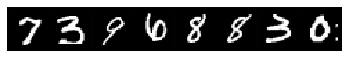

step 1980, loss 9.460123062133789
Target:	 tensor([0, 3, 4, 2, 1, 6, 3, 2], device='cuda:0')
Pred:	 tensor([0, 3, 4, 2, 1, 6, 2, 2], device='cuda:0')


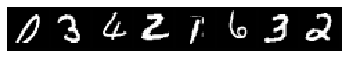

step 2013, loss 9.593969345092773
Target:	 tensor([9, 3, 8, 0, 3, 3, 7, 4], device='cuda:0')
Pred:	 tensor([9, 0, 8, 0, 1, 3, 7, 4], device='cuda:0')


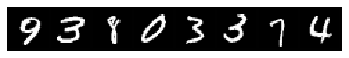

step 2046, loss 9.26395320892334
Target:	 tensor([7, 8, 3, 9, 3, 4, 1, 5], device='cuda:0')
Pred:	 tensor([7, 8, 3, 9, 3, 4, 1, 5], device='cuda:0')


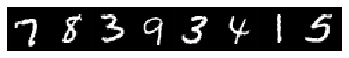

step 2079, loss 9.326818466186523
Target:	 tensor([3, 9, 1, 4, 1, 2, 3, 5], device='cuda:0')
Pred:	 tensor([3, 9, 1, 4, 1, 2, 3, 5], device='cuda:0')


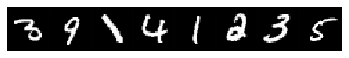

step 2112, loss 9.21074104309082
Target:	 tensor([4, 7, 5, 4, 7, 3, 7, 9], device='cuda:0')
Pred:	 tensor([4, 7, 5, 4, 7, 3, 7, 9], device='cuda:0')


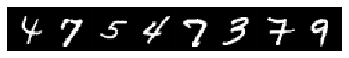

step 2145, loss 9.283519744873047
Target:	 tensor([0, 4, 5, 1, 7, 9, 2, 3], device='cuda:0')
Pred:	 tensor([0, 4, 5, 1, 7, 9, 2, 2], device='cuda:0')


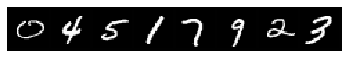

step 2178, loss 9.19786548614502
Target:	 tensor([8, 6, 7, 5, 4, 5, 2, 5], device='cuda:0')
Pred:	 tensor([8, 6, 7, 5, 4, 5, 2, 5], device='cuda:0')


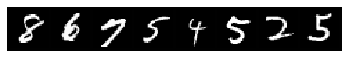

step 2211, loss 9.504091262817383
Target:	 tensor([8, 3, 3, 2, 8, 0, 8, 9], device='cuda:0')
Pred:	 tensor([8, 3, 8, 2, 8, 0, 8, 9], device='cuda:0')


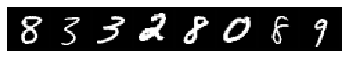

step 2244, loss 9.229382514953613
Target:	 tensor([1, 5, 8, 0, 4, 1, 7, 0], device='cuda:0')
Pred:	 tensor([1, 5, 8, 0, 4, 1, 7, 0], device='cuda:0')


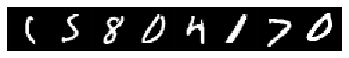

step 2277, loss 9.10904312133789
Target:	 tensor([6, 3, 5, 2, 2, 7, 3, 5], device='cuda:0')
Pred:	 tensor([6, 3, 5, 2, 2, 7, 3, 5], device='cuda:0')


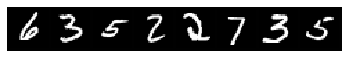

step 2310, loss 9.09304428100586
Target:	 tensor([5, 2, 0, 6, 0, 2, 6, 9], device='cuda:0')
Pred:	 tensor([5, 2, 0, 6, 0, 2, 6, 9], device='cuda:0')


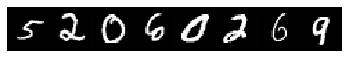

step 2343, loss 9.111618995666504
Target:	 tensor([9, 5, 4, 6, 0, 3, 0, 8], device='cuda:0')
Pred:	 tensor([9, 5, 4, 6, 0, 3, 0, 8], device='cuda:0')


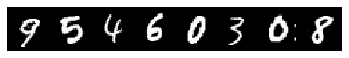

step 2376, loss 9.167367935180664
Target:	 tensor([0, 4, 7, 9, 4, 9, 8, 1], device='cuda:0')
Pred:	 tensor([0, 4, 7, 9, 4, 9, 8, 1], device='cuda:0')


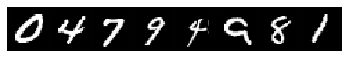

step 2409, loss 9.03819751739502
Target:	 tensor([9, 8, 6, 0, 3, 1, 2, 6], device='cuda:0')
Pred:	 tensor([9, 8, 6, 0, 3, 1, 2, 6], device='cuda:0')


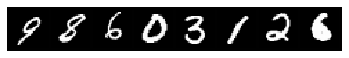

step 2442, loss 9.051177978515625
Target:	 tensor([7, 9, 7, 5, 5, 6, 9, 7], device='cuda:0')
Pred:	 tensor([7, 9, 7, 5, 5, 6, 9, 7], device='cuda:0')


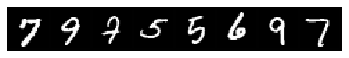

step 2475, loss 9.082557678222656
Target:	 tensor([1, 6, 6, 3, 9, 3, 0, 1], device='cuda:0')
Pred:	 tensor([1, 6, 6, 3, 9, 3, 0, 1], device='cuda:0')


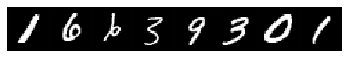

step 2508, loss 8.986671447753906
Target:	 tensor([0, 9, 7, 1, 7, 2, 7, 6], device='cuda:0')
Pred:	 tensor([0, 9, 7, 1, 7, 2, 7, 6], device='cuda:0')


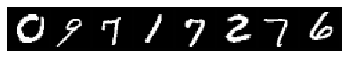

step 2541, loss 9.059518814086914
Target:	 tensor([2, 9, 6, 4, 9, 7, 4, 2], device='cuda:0')
Pred:	 tensor([2, 9, 6, 4, 9, 7, 4, 2], device='cuda:0')


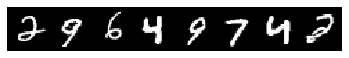

step 2574, loss 9.009942054748535
Target:	 tensor([0, 3, 6, 3, 9, 3, 4, 6], device='cuda:0')
Pred:	 tensor([0, 3, 6, 9, 9, 3, 4, 6], device='cuda:0')


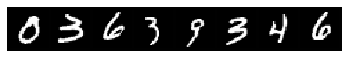

step 2607, loss 9.017033576965332
Target:	 tensor([5, 7, 4, 6, 3, 1, 3, 8], device='cuda:0')
Pred:	 tensor([5, 7, 4, 6, 3, 1, 3, 8], device='cuda:0')


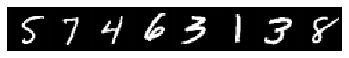

step 2640, loss 9.008038520812988
Target:	 tensor([6, 2, 9, 7, 1, 9, 2, 7], device='cuda:0')
Pred:	 tensor([6, 2, 9, 7, 1, 9, 2, 7], device='cuda:0')


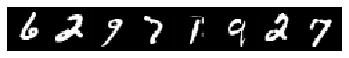

step 2673, loss 8.972078323364258
Target:	 tensor([0, 5, 7, 7, 0, 5, 1, 8], device='cuda:0')
Pred:	 tensor([0, 5, 7, 7, 0, 5, 1, 8], device='cuda:0')


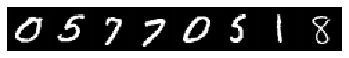

step 2706, loss 9.008774757385254
Target:	 tensor([4, 2, 1, 8, 5, 2, 1, 7], device='cuda:0')
Pred:	 tensor([4, 2, 1, 8, 5, 2, 1, 7], device='cuda:0')


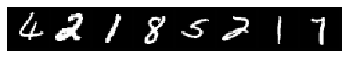

step 2739, loss 8.921689987182617
Target:	 tensor([4, 2, 5, 7, 6, 3, 4, 5], device='cuda:0')
Pred:	 tensor([4, 2, 5, 7, 6, 3, 4, 5], device='cuda:0')


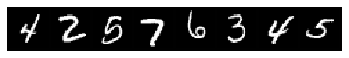

step 2772, loss 8.956062316894531
Target:	 tensor([4, 0, 0, 3, 0, 3, 9, 6], device='cuda:0')
Pred:	 tensor([4, 0, 0, 2, 0, 3, 9, 6], device='cuda:0')


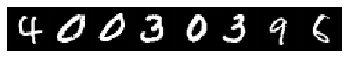

step 2805, loss 8.861367225646973
Target:	 tensor([7, 4, 6, 5, 5, 8, 9, 6], device='cuda:0')
Pred:	 tensor([7, 4, 6, 5, 5, 8, 9, 6], device='cuda:0')


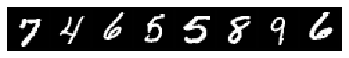

step 2838, loss 8.879591941833496
Target:	 tensor([6, 4, 5, 7, 7, 8, 9, 4], device='cuda:0')
Pred:	 tensor([6, 4, 5, 7, 7, 8, 9, 4], device='cuda:0')


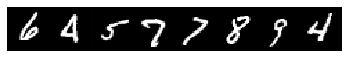

step 2871, loss 8.972599983215332
Target:	 tensor([8, 6, 1, 4, 1, 8, 3, 1], device='cuda:0')
Pred:	 tensor([8, 6, 1, 4, 1, 8, 3, 1], device='cuda:0')


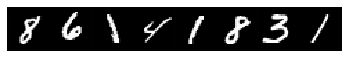

step 2904, loss 8.870644569396973
Target:	 tensor([8, 1, 1, 8, 8, 7, 2, 4], device='cuda:0')
Pred:	 tensor([8, 1, 1, 8, 8, 7, 2, 4], device='cuda:0')


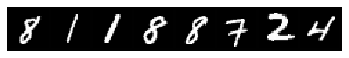

step 2937, loss 8.935650825500488
Target:	 tensor([9, 3, 3, 6, 8, 6, 0, 6], device='cuda:0')
Pred:	 tensor([9, 3, 3, 6, 8, 6, 0, 6], device='cuda:0')


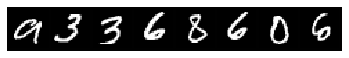

step 2970, loss 8.889750480651855
Target:	 tensor([1, 4, 1, 7, 1, 4, 7, 7], device='cuda:0')
Pred:	 tensor([1, 4, 1, 7, 1, 4, 7, 7], device='cuda:0')


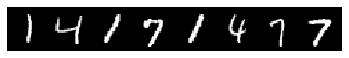

step 3003, loss 8.822714805603027
Target:	 tensor([1, 6, 6, 5, 8, 2, 5, 7], device='cuda:0')
Pred:	 tensor([1, 6, 6, 5, 8, 2, 5, 7], device='cuda:0')


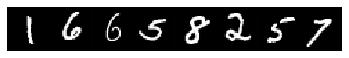

step 3036, loss 8.844911575317383
Target:	 tensor([5, 7, 0, 0, 2, 9, 7, 6], device='cuda:0')
Pred:	 tensor([5, 7, 0, 0, 2, 9, 7, 6], device='cuda:0')


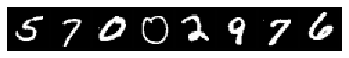

step 3069, loss 8.971663475036621
Target:	 tensor([8, 6, 5, 3, 7, 3, 8, 8], device='cuda:0')
Pred:	 tensor([8, 6, 5, 3, 7, 3, 8, 8], device='cuda:0')


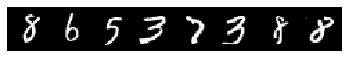

step 3102, loss 8.99994945526123
Target:	 tensor([3, 3, 9, 7, 4, 8, 9, 5], device='cuda:0')
Pred:	 tensor([7, 3, 9, 7, 4, 8, 9, 5], device='cuda:0')


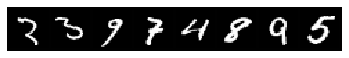

step 3135, loss 8.7607421875
Target:	 tensor([0, 1, 2, 7, 2, 2, 6, 1], device='cuda:0')
Pred:	 tensor([0, 1, 2, 7, 2, 2, 6, 1], device='cuda:0')


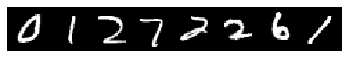

step 3168, loss 8.767425537109375
Target:	 tensor([6, 0, 2, 7, 2, 0, 7, 9], device='cuda:0')
Pred:	 tensor([6, 0, 2, 7, 2, 0, 7, 9], device='cuda:0')


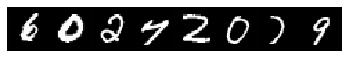

step 3201, loss 8.7822265625
Target:	 tensor([9, 0, 3, 2, 8, 2, 0, 4], device='cuda:0')
Pred:	 tensor([9, 0, 3, 2, 8, 2, 0, 4], device='cuda:0')


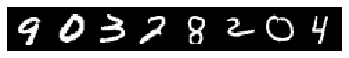

step 3234, loss 8.808594703674316
Target:	 tensor([5, 4, 5, 7, 6, 9, 1, 9], device='cuda:0')
Pred:	 tensor([5, 4, 5, 7, 6, 9, 1, 9], device='cuda:0')


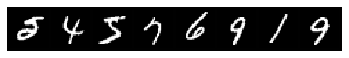

step 3267, loss 8.792282104492188
Target:	 tensor([7, 3, 7, 8, 1, 6, 3, 1], device='cuda:0')
Pred:	 tensor([7, 3, 7, 8, 1, 6, 3, 1], device='cuda:0')


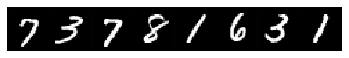

step 0, loss 108.06527709960938
Target:	 tensor([2, 6, 2, 2, 5, 2, 9, 7], device='cuda:0')
Pred:	 tensor([3, 8, 8, 8, 8, 6, 8, 8], device='cuda:0')


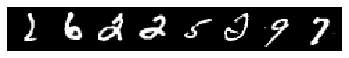

step 33, loss 101.79190063476562
Target:	 tensor([7, 4, 8, 8, 0, 9, 2, 5], device='cuda:0')
Pred:	 tensor([5, 9, 5, 2, 0, 8, 7, 1], device='cuda:0')


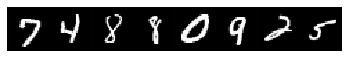

step 66, loss 98.31108856201172
Target:	 tensor([3, 1, 9, 7, 3, 6, 6, 5], device='cuda:0')
Pred:	 tensor([2, 2, 9, 1, 3, 2, 6, 3], device='cuda:0')


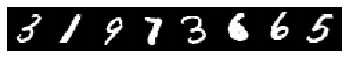

step 99, loss 96.97311401367188
Target:	 tensor([2, 1, 4, 9, 5, 3, 8, 4], device='cuda:0')
Pred:	 tensor([2, 1, 9, 9, 5, 3, 8, 9], device='cuda:0')


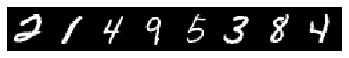

step 132, loss 95.14871215820312
Target:	 tensor([7, 7, 0, 1, 5, 1, 9, 4], device='cuda:0')
Pred:	 tensor([7, 5, 0, 3, 2, 1, 9, 2], device='cuda:0')


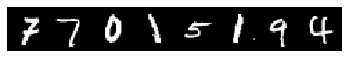

step 165, loss 93.64387512207031
Target:	 tensor([3, 1, 3, 2, 6, 6, 6, 9], device='cuda:0')
Pred:	 tensor([3, 8, 3, 2, 6, 6, 6, 4], device='cuda:0')


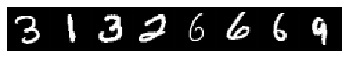

step 198, loss 91.3060302734375
Target:	 tensor([3, 3, 1, 3, 9, 2, 3, 0], device='cuda:0')
Pred:	 tensor([3, 5, 1, 3, 9, 2, 3, 2], device='cuda:0')


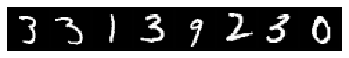

step 231, loss 90.10757446289062
Target:	 tensor([8, 3, 4, 1, 1, 1, 5, 9], device='cuda:0')
Pred:	 tensor([4, 3, 4, 1, 1, 1, 4, 9], device='cuda:0')


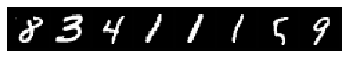

step 264, loss 89.18711853027344
Target:	 tensor([1, 1, 2, 5, 5, 9, 7, 3], device='cuda:0')
Pred:	 tensor([1, 1, 2, 5, 8, 7, 7, 4], device='cuda:0')


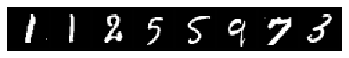

step 297, loss 87.28954315185547
Target:	 tensor([2, 5, 3, 0, 2, 8, 7, 8], device='cuda:0')
Pred:	 tensor([2, 8, 3, 0, 1, 8, 7, 8], device='cuda:0')


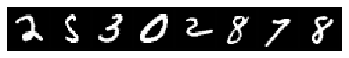

step 330, loss 86.62977600097656
Target:	 tensor([9, 2, 5, 2, 0, 2, 7, 1], device='cuda:0')
Pred:	 tensor([9, 2, 4, 8, 0, 0, 7, 1], device='cuda:0')


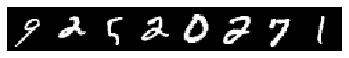

step 363, loss 85.16352081298828
Target:	 tensor([7, 3, 4, 7, 1, 1, 9, 5], device='cuda:0')
Pred:	 tensor([7, 5, 4, 7, 1, 1, 9, 5], device='cuda:0')


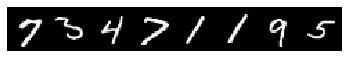

step 396, loss 84.57763671875
Target:	 tensor([2, 3, 9, 0, 8, 6, 7, 9], device='cuda:0')
Pred:	 tensor([2, 3, 9, 0, 8, 6, 1, 4], device='cuda:0')


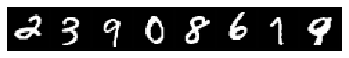

step 429, loss 82.6102523803711
Target:	 tensor([0, 4, 4, 1, 2, 0, 9, 2], device='cuda:0')
Pred:	 tensor([0, 4, 4, 1, 2, 0, 9, 2], device='cuda:0')


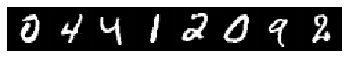

step 462, loss 81.96270751953125
Target:	 tensor([5, 3, 3, 8, 3, 9, 1, 3], device='cuda:0')
Pred:	 tensor([5, 3, 3, 8, 8, 4, 1, 3], device='cuda:0')


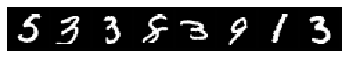

step 495, loss 80.74637603759766
Target:	 tensor([1, 0, 3, 1, 1, 8, 7, 3], device='cuda:0')
Pred:	 tensor([1, 6, 3, 1, 1, 8, 7, 3], device='cuda:0')


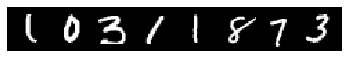

step 528, loss 79.7981185913086
Target:	 tensor([7, 2, 3, 4, 0, 4, 6, 8], device='cuda:0')
Pred:	 tensor([7, 7, 3, 4, 0, 5, 6, 4], device='cuda:0')


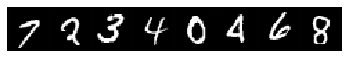

step 561, loss 78.9377212524414
Target:	 tensor([1, 6, 7, 0, 2, 9, 1, 2], device='cuda:0')
Pred:	 tensor([1, 6, 7, 0, 2, 9, 1, 1], device='cuda:0')


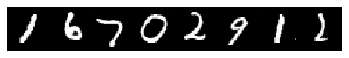

step 594, loss 77.39325714111328
Target:	 tensor([8, 1, 1, 8, 0, 2, 4, 5], device='cuda:0')
Pred:	 tensor([8, 1, 1, 8, 0, 2, 6, 5], device='cuda:0')


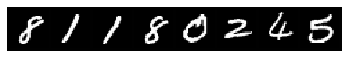

step 627, loss 76.63899993896484
Target:	 tensor([4, 2, 2, 2, 5, 2, 5, 4], device='cuda:0')
Pred:	 tensor([4, 2, 2, 2, 5, 2, 5, 4], device='cuda:0')


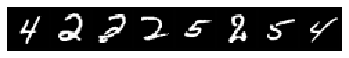

step 660, loss 75.44630432128906
Target:	 tensor([8, 4, 4, 1, 6, 9, 8, 2], device='cuda:0')
Pred:	 tensor([8, 4, 4, 1, 6, 9, 8, 2], device='cuda:0')


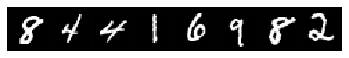

step 693, loss 74.41352844238281
Target:	 tensor([3, 5, 4, 9, 2, 8, 1, 1], device='cuda:0')
Pred:	 tensor([3, 5, 4, 9, 2, 8, 1, 1], device='cuda:0')


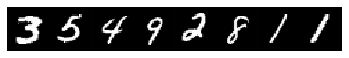

step 726, loss 73.43572998046875
Target:	 tensor([5, 2, 5, 3, 2, 2, 4, 4], device='cuda:0')
Pred:	 tensor([5, 2, 5, 3, 2, 2, 4, 4], device='cuda:0')


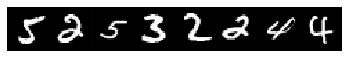

step 759, loss 72.90301513671875
Target:	 tensor([4, 1, 2, 8, 5, 1, 9, 4], device='cuda:0')
Pred:	 tensor([4, 5, 2, 8, 3, 1, 9, 4], device='cuda:0')


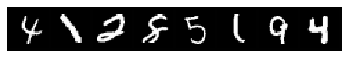

step 792, loss 71.62877655029297
Target:	 tensor([0, 6, 7, 8, 1, 9, 5, 6], device='cuda:0')
Pred:	 tensor([0, 6, 7, 8, 1, 9, 5, 6], device='cuda:0')


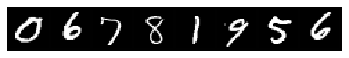

step 825, loss 70.8378677368164
Target:	 tensor([2, 9, 1, 0, 1, 1, 7, 0], device='cuda:0')
Pred:	 tensor([2, 9, 1, 0, 1, 1, 7, 0], device='cuda:0')


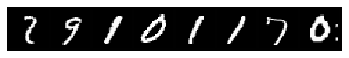

step 858, loss 69.9798583984375
Target:	 tensor([7, 4, 2, 0, 7, 9, 9, 8], device='cuda:0')
Pred:	 tensor([7, 9, 2, 0, 7, 9, 9, 5], device='cuda:0')


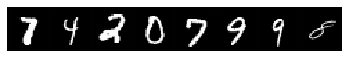

step 891, loss 68.82730865478516
Target:	 tensor([0, 1, 4, 0, 7, 7, 1, 2], device='cuda:0')
Pred:	 tensor([0, 1, 4, 0, 7, 7, 1, 2], device='cuda:0')


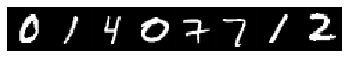

step 924, loss 68.12842559814453
Target:	 tensor([7, 3, 1, 4, 7, 2, 1, 2], device='cuda:0')
Pred:	 tensor([7, 3, 1, 4, 7, 2, 1, 2], device='cuda:0')


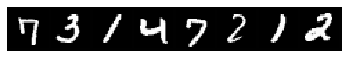

step 957, loss 67.09689331054688
Target:	 tensor([6, 7, 0, 9, 5, 3, 5, 8], device='cuda:0')
Pred:	 tensor([6, 7, 0, 9, 5, 3, 5, 8], device='cuda:0')


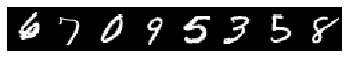

step 990, loss 66.31754302978516
Target:	 tensor([8, 2, 4, 5, 9, 8, 2, 7], device='cuda:0')
Pred:	 tensor([8, 2, 4, 5, 9, 8, 2, 7], device='cuda:0')


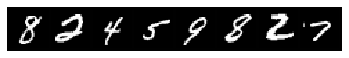

step 1023, loss 65.27908325195312
Target:	 tensor([7, 7, 2, 5, 3, 7, 0, 4], device='cuda:0')
Pred:	 tensor([7, 7, 2, 5, 3, 7, 0, 4], device='cuda:0')


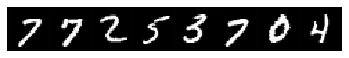

step 1056, loss 64.59394836425781
Target:	 tensor([1, 3, 1, 5, 3, 4, 4, 9], device='cuda:0')
Pred:	 tensor([1, 3, 1, 5, 3, 4, 4, 9], device='cuda:0')


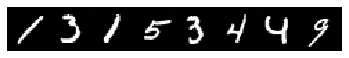

step 1089, loss 63.851951599121094
Target:	 tensor([4, 7, 1, 5, 1, 3, 4, 2], device='cuda:0')
Pred:	 tensor([4, 7, 1, 5, 1, 7, 4, 2], device='cuda:0')


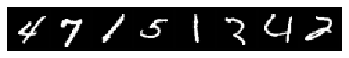

step 1122, loss 62.864036560058594
Target:	 tensor([0, 5, 2, 2, 1, 0, 5, 0], device='cuda:0')
Pred:	 tensor([0, 5, 2, 2, 1, 0, 5, 0], device='cuda:0')


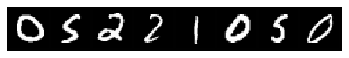

step 1155, loss 62.22307586669922
Target:	 tensor([2, 1, 6, 7, 1, 4, 2, 3], device='cuda:0')
Pred:	 tensor([2, 8, 6, 7, 1, 4, 2, 3], device='cuda:0')


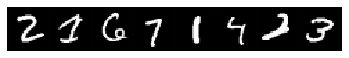

step 1188, loss 61.3868522644043
Target:	 tensor([4, 5, 7, 4, 9, 8, 1, 5], device='cuda:0')
Pred:	 tensor([4, 5, 7, 4, 9, 8, 1, 5], device='cuda:0')


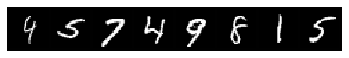

step 1221, loss 60.667179107666016
Target:	 tensor([7, 4, 8, 5, 9, 6, 5, 8], device='cuda:0')
Pred:	 tensor([7, 4, 8, 5, 9, 6, 5, 8], device='cuda:0')


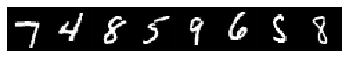

step 1254, loss 59.82338333129883
Target:	 tensor([5, 7, 5, 3, 4, 8, 7, 3], device='cuda:0')
Pred:	 tensor([5, 7, 5, 3, 6, 8, 7, 3], device='cuda:0')


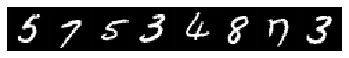

step 1287, loss 59.05058288574219
Target:	 tensor([0, 4, 7, 4, 0, 7, 8, 5], device='cuda:0')
Pred:	 tensor([2, 4, 7, 4, 0, 7, 8, 5], device='cuda:0')


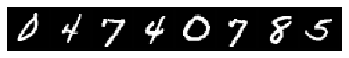

step 1320, loss 58.51472091674805
Target:	 tensor([1, 7, 6, 9, 5, 7, 4, 8], device='cuda:0')
Pred:	 tensor([1, 7, 6, 9, 5, 7, 4, 8], device='cuda:0')


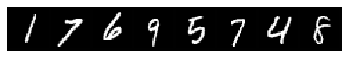

step 1353, loss 57.565521240234375
Target:	 tensor([9, 7, 6, 9, 5, 9, 1, 2], device='cuda:0')
Pred:	 tensor([9, 7, 6, 9, 5, 9, 1, 2], device='cuda:0')


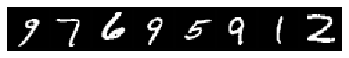

step 1386, loss 56.88182067871094
Target:	 tensor([2, 1, 0, 7, 1, 3, 0, 3], device='cuda:0')
Pred:	 tensor([2, 1, 0, 7, 1, 3, 0, 3], device='cuda:0')


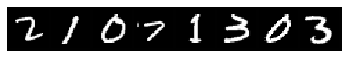

step 1419, loss 56.113502502441406
Target:	 tensor([7, 3, 2, 5, 8, 6, 1, 4], device='cuda:0')
Pred:	 tensor([7, 3, 2, 5, 8, 6, 5, 4], device='cuda:0')


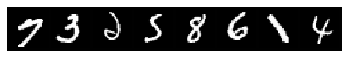

step 1452, loss 55.45469665527344
Target:	 tensor([8, 2, 4, 2, 4, 7, 1, 9], device='cuda:0')
Pred:	 tensor([8, 2, 4, 2, 4, 7, 1, 9], device='cuda:0')


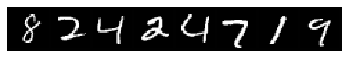

step 1485, loss 54.69879913330078
Target:	 tensor([3, 6, 9, 5, 4, 7, 7, 0], device='cuda:0')
Pred:	 tensor([3, 6, 9, 5, 4, 7, 7, 0], device='cuda:0')


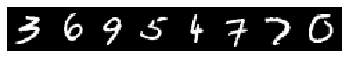

step 1518, loss 53.9652214050293
Target:	 tensor([0, 8, 1, 1, 0, 4, 4, 1], device='cuda:0')
Pred:	 tensor([0, 8, 1, 1, 0, 4, 4, 1], device='cuda:0')


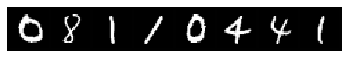

step 1551, loss 53.26255798339844
Target:	 tensor([2, 0, 1, 6, 5, 0, 9, 2], device='cuda:0')
Pred:	 tensor([2, 0, 1, 6, 5, 0, 9, 2], device='cuda:0')


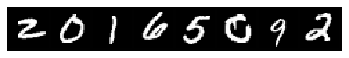

step 1584, loss 52.62761688232422
Target:	 tensor([8, 0, 3, 0, 4, 1, 1, 7], device='cuda:0')
Pred:	 tensor([8, 0, 3, 0, 4, 1, 1, 7], device='cuda:0')


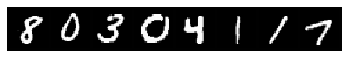

step 1617, loss 51.93441390991211
Target:	 tensor([4, 9, 8, 5, 9, 8, 1, 1], device='cuda:0')
Pred:	 tensor([4, 9, 5, 5, 9, 8, 1, 1], device='cuda:0')


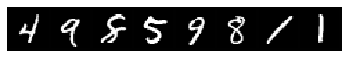

step 1650, loss 51.48794174194336
Target:	 tensor([5, 8, 0, 9, 9, 0, 0, 8], device='cuda:0')
Pred:	 tensor([6, 8, 0, 9, 9, 0, 0, 8], device='cuda:0')


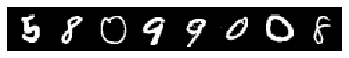

step 1683, loss 50.7171516418457
Target:	 tensor([5, 2, 2, 9, 1, 3, 1, 9], device='cuda:0')
Pred:	 tensor([8, 2, 2, 9, 1, 3, 1, 9], device='cuda:0')


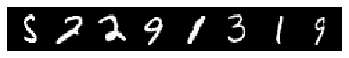

step 1716, loss 49.923667907714844
Target:	 tensor([8, 4, 2, 7, 3, 5, 9, 0], device='cuda:0')
Pred:	 tensor([8, 4, 2, 7, 3, 5, 9, 0], device='cuda:0')


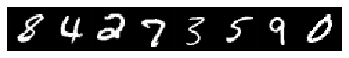

step 1749, loss 49.27998733520508
Target:	 tensor([7, 8, 3, 3, 0, 8, 3, 7], device='cuda:0')
Pred:	 tensor([7, 8, 3, 3, 0, 8, 3, 7], device='cuda:0')


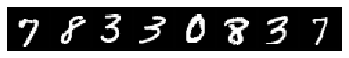

step 1782, loss 48.644100189208984
Target:	 tensor([1, 0, 5, 2, 7, 2, 5, 7], device='cuda:0')
Pred:	 tensor([1, 0, 5, 2, 7, 2, 5, 7], device='cuda:0')


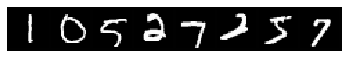

step 1815, loss 48.12152099609375
Target:	 tensor([9, 0, 9, 3, 4, 1, 5, 0], device='cuda:0')
Pred:	 tensor([7, 0, 9, 3, 4, 1, 5, 0], device='cuda:0')


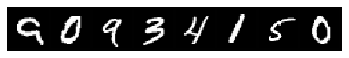

step 1848, loss 47.40443801879883
Target:	 tensor([0, 6, 6, 8, 0, 3, 9, 5], device='cuda:0')
Pred:	 tensor([0, 6, 6, 8, 0, 3, 9, 5], device='cuda:0')


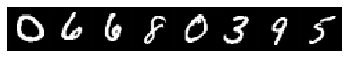

step 1881, loss 47.12213897705078
Target:	 tensor([7, 6, 0, 0, 2, 7, 0, 8], device='cuda:0')
Pred:	 tensor([7, 1, 0, 0, 1, 7, 0, 8], device='cuda:0')


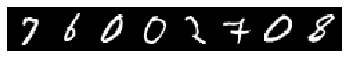

step 1914, loss 46.23844909667969
Target:	 tensor([0, 1, 8, 1, 0, 7, 5, 7], device='cuda:0')
Pred:	 tensor([0, 1, 8, 1, 0, 7, 5, 7], device='cuda:0')


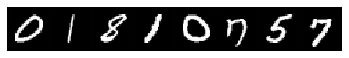

step 1947, loss 45.76675033569336
Target:	 tensor([8, 0, 0, 9, 4, 3, 6, 3], device='cuda:0')
Pred:	 tensor([8, 0, 0, 5, 4, 3, 6, 3], device='cuda:0')


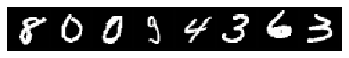

step 1980, loss 45.083282470703125
Target:	 tensor([8, 7, 0, 7, 5, 0, 5, 6], device='cuda:0')
Pred:	 tensor([8, 7, 0, 7, 5, 0, 5, 6], device='cuda:0')


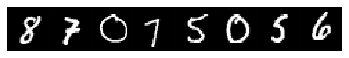

step 2013, loss 44.57344055175781
Target:	 tensor([2, 1, 4, 0, 3, 0, 1, 0], device='cuda:0')
Pred:	 tensor([2, 1, 4, 0, 3, 0, 1, 0], device='cuda:0')


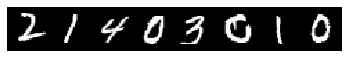

step 2046, loss 44.038700103759766
Target:	 tensor([3, 3, 6, 1, 7, 2, 3, 3], device='cuda:0')
Pred:	 tensor([3, 3, 6, 1, 7, 2, 3, 3], device='cuda:0')


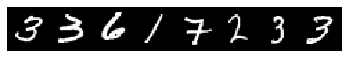

step 2079, loss 43.503658294677734
Target:	 tensor([6, 8, 7, 7, 5, 1, 1, 1], device='cuda:0')
Pred:	 tensor([6, 8, 7, 7, 6, 1, 1, 1], device='cuda:0')


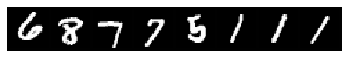

step 2112, loss 42.90683364868164
Target:	 tensor([7, 6, 5, 3, 5, 9, 2, 6], device='cuda:0')
Pred:	 tensor([7, 6, 5, 3, 5, 9, 2, 6], device='cuda:0')


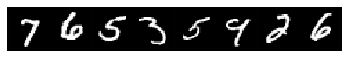

step 2145, loss 42.542545318603516
Target:	 tensor([7, 2, 1, 8, 9, 6, 6, 5], device='cuda:0')
Pred:	 tensor([7, 2, 1, 8, 9, 6, 6, 5], device='cuda:0')


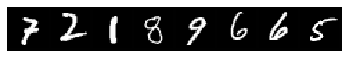

step 2178, loss 41.91520309448242
Target:	 tensor([5, 8, 6, 6, 7, 0, 3, 3], device='cuda:0')
Pred:	 tensor([8, 8, 6, 6, 7, 0, 3, 3], device='cuda:0')


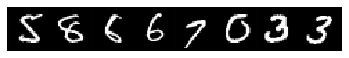

step 2211, loss 41.42593765258789
Target:	 tensor([1, 6, 6, 5, 6, 7, 3, 0], device='cuda:0')
Pred:	 tensor([1, 6, 6, 5, 6, 7, 3, 0], device='cuda:0')


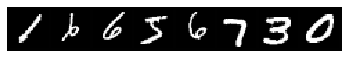

step 2244, loss 40.90866470336914
Target:	 tensor([4, 7, 0, 4, 1, 7, 4, 9], device='cuda:0')
Pred:	 tensor([4, 7, 0, 4, 1, 7, 4, 4], device='cuda:0')


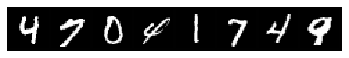

step 2277, loss 40.3642463684082
Target:	 tensor([8, 6, 9, 6, 8, 9, 1, 7], device='cuda:0')
Pred:	 tensor([8, 6, 9, 6, 8, 9, 1, 7], device='cuda:0')


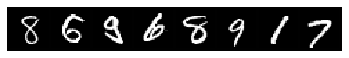

step 2310, loss 39.83242416381836
Target:	 tensor([8, 6, 7, 8, 4, 3, 7, 4], device='cuda:0')
Pred:	 tensor([8, 6, 7, 8, 4, 3, 7, 4], device='cuda:0')


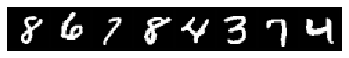

step 2343, loss 39.32999038696289
Target:	 tensor([0, 1, 1, 2, 2, 9, 5, 0], device='cuda:0')
Pred:	 tensor([0, 1, 1, 2, 2, 9, 5, 0], device='cuda:0')


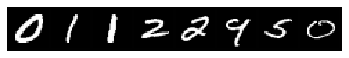

step 2376, loss 38.86715316772461
Target:	 tensor([2, 4, 1, 4, 4, 0, 7, 9], device='cuda:0')
Pred:	 tensor([2, 4, 1, 4, 4, 0, 7, 9], device='cuda:0')


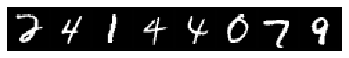

step 2409, loss 38.24530792236328
Target:	 tensor([8, 7, 0, 8, 0, 0, 2, 2], device='cuda:0')
Pred:	 tensor([8, 7, 0, 8, 0, 0, 2, 2], device='cuda:0')


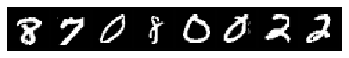

step 2442, loss 37.78569030761719
Target:	 tensor([9, 3, 2, 9, 9, 8, 0, 7], device='cuda:0')
Pred:	 tensor([9, 3, 2, 9, 9, 8, 0, 7], device='cuda:0')


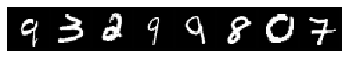

step 2475, loss 37.504600524902344
Target:	 tensor([6, 3, 9, 3, 6, 7, 0, 4], device='cuda:0')
Pred:	 tensor([6, 3, 9, 3, 6, 7, 0, 4], device='cuda:0')


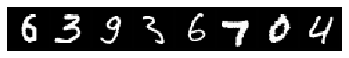

step 2508, loss 37.04922103881836
Target:	 tensor([6, 8, 6, 0, 6, 7, 3, 7], device='cuda:0')
Pred:	 tensor([6, 6, 6, 0, 6, 7, 3, 7], device='cuda:0')


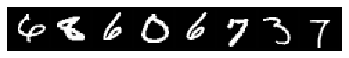

step 2541, loss 36.74955368041992
Target:	 tensor([9, 1, 8, 2, 6, 4, 3, 5], device='cuda:0')
Pred:	 tensor([9, 1, 6, 1, 6, 4, 3, 5], device='cuda:0')


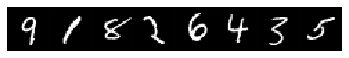

step 2574, loss 36.06052017211914
Target:	 tensor([0, 5, 9, 0, 2, 0, 9, 7], device='cuda:0')
Pred:	 tensor([0, 5, 9, 0, 2, 0, 9, 7], device='cuda:0')


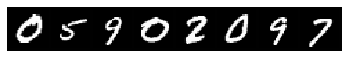

step 2607, loss 35.63746643066406
Target:	 tensor([7, 0, 1, 1, 9, 4, 6, 3], device='cuda:0')
Pred:	 tensor([7, 0, 1, 1, 9, 4, 1, 3], device='cuda:0')


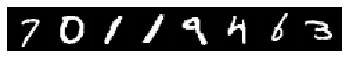

step 2640, loss 35.19879913330078
Target:	 tensor([1, 1, 3, 1, 7, 3, 2, 0], device='cuda:0')
Pred:	 tensor([1, 1, 3, 1, 7, 3, 2, 0], device='cuda:0')


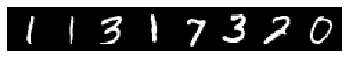

step 2673, loss 34.82367706298828
Target:	 tensor([1, 0, 9, 3, 4, 0, 3, 0], device='cuda:0')
Pred:	 tensor([1, 0, 7, 3, 4, 0, 3, 0], device='cuda:0')


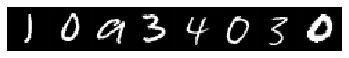

step 2706, loss 34.36959457397461
Target:	 tensor([1, 7, 5, 6, 1, 9, 0, 1], device='cuda:0')
Pred:	 tensor([1, 7, 5, 6, 1, 9, 0, 1], device='cuda:0')


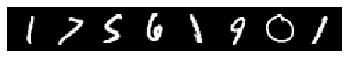

step 2739, loss 33.90657424926758
Target:	 tensor([1, 0, 6, 4, 8, 7, 5, 2], device='cuda:0')
Pred:	 tensor([1, 0, 6, 4, 8, 7, 5, 2], device='cuda:0')


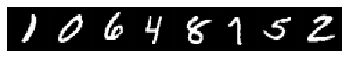

step 2772, loss 33.513484954833984
Target:	 tensor([7, 9, 9, 6, 7, 1, 8, 2], device='cuda:0')
Pred:	 tensor([7, 9, 9, 6, 7, 1, 8, 2], device='cuda:0')


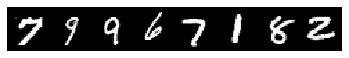

step 2805, loss 33.06996536254883
Target:	 tensor([5, 3, 7, 6, 9, 4, 7, 8], device='cuda:0')
Pred:	 tensor([5, 3, 7, 6, 9, 4, 7, 8], device='cuda:0')


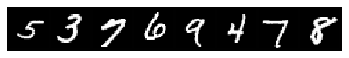

step 2838, loss 32.677833557128906
Target:	 tensor([7, 5, 4, 8, 0, 6, 5, 4], device='cuda:0')
Pred:	 tensor([7, 5, 4, 3, 0, 6, 5, 4], device='cuda:0')


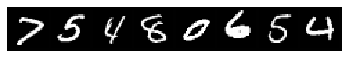

step 2871, loss 32.31627655029297
Target:	 tensor([0, 5, 9, 4, 8, 6, 9, 2], device='cuda:0')
Pred:	 tensor([0, 5, 9, 4, 8, 6, 9, 2], device='cuda:0')


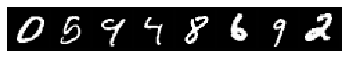

step 2904, loss 31.791667938232422
Target:	 tensor([1, 6, 0, 0, 6, 6, 7, 1], device='cuda:0')
Pred:	 tensor([1, 6, 0, 0, 6, 6, 7, 1], device='cuda:0')


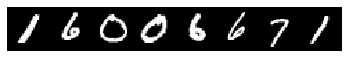

step 2937, loss 31.52473258972168
Target:	 tensor([6, 0, 8, 6, 9, 9, 8, 1], device='cuda:0')
Pred:	 tensor([6, 0, 8, 6, 9, 9, 8, 1], device='cuda:0')


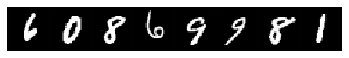

step 2970, loss 31.150846481323242
Target:	 tensor([1, 9, 2, 1, 1, 9, 4, 8], device='cuda:0')
Pred:	 tensor([1, 9, 2, 1, 1, 9, 4, 3], device='cuda:0')


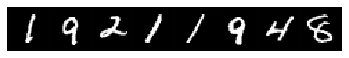

step 3003, loss 30.667741775512695
Target:	 tensor([1, 7, 5, 3, 7, 1, 3, 3], device='cuda:0')
Pred:	 tensor([1, 7, 5, 3, 7, 1, 3, 3], device='cuda:0')


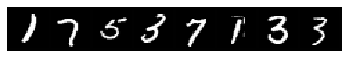

step 3036, loss 30.52838706970215
Target:	 tensor([4, 2, 5, 6, 4, 0, 8, 9], device='cuda:0')
Pred:	 tensor([4, 2, 5, 6, 4, 0, 8, 9], device='cuda:0')


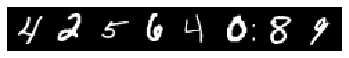

step 3069, loss 30.011871337890625
Target:	 tensor([6, 2, 9, 0, 3, 7, 5, 6], device='cuda:0')
Pred:	 tensor([6, 2, 9, 0, 3, 7, 5, 6], device='cuda:0')


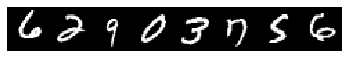

step 3102, loss 29.600969314575195
Target:	 tensor([4, 6, 0, 4, 3, 1, 0, 7], device='cuda:0')
Pred:	 tensor([4, 6, 0, 4, 3, 1, 0, 7], device='cuda:0')


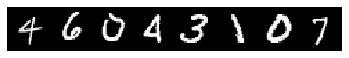

step 3135, loss 29.220596313476562
Target:	 tensor([3, 1, 5, 7, 7, 5, 0, 3], device='cuda:0')
Pred:	 tensor([3, 1, 5, 7, 7, 5, 0, 3], device='cuda:0')


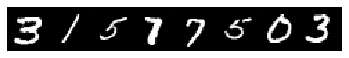

step 3168, loss 28.93556022644043
Target:	 tensor([0, 6, 8, 7, 9, 8, 5, 8], device='cuda:0')
Pred:	 tensor([0, 6, 8, 7, 7, 8, 5, 8], device='cuda:0')


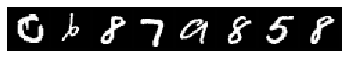

step 3201, loss 28.489547729492188
Target:	 tensor([9, 2, 0, 8, 1, 6, 2, 5], device='cuda:0')
Pred:	 tensor([9, 2, 0, 8, 1, 6, 2, 5], device='cuda:0')


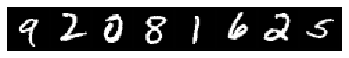

step 3234, loss 28.270767211914062
Target:	 tensor([4, 3, 9, 4, 1, 9, 2, 1], device='cuda:0')
Pred:	 tensor([4, 3, 9, 9, 1, 9, 2, 1], device='cuda:0')


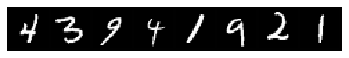

step 3267, loss 27.882904052734375
Target:	 tensor([7, 5, 4, 1, 8, 0, 5, 1], device='cuda:0')
Pred:	 tensor([7, 5, 4, 1, 5, 0, 5, 1], device='cuda:0')


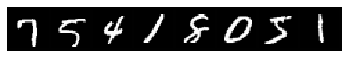

step 0, loss 990.2239379882812
Target:	 tensor([5, 9, 9, 9, 4, 0, 2, 2], device='cuda:0')
Pred:	 tensor([9, 9, 9, 9, 9, 9, 9, 9], device='cuda:0')


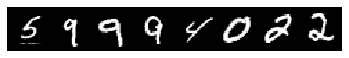

step 33, loss 864.734130859375
Target:	 tensor([9, 7, 9, 3, 9, 9, 4, 3], device='cuda:0')
Pred:	 tensor([7, 7, 8, 5, 8, 6, 5, 2], device='cuda:0')


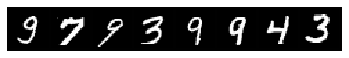

step 66, loss 755.08740234375
Target:	 tensor([6, 0, 1, 3, 2, 2, 1, 2], device='cuda:0')
Pred:	 tensor([1, 0, 9, 3, 7, 3, 1, 8], device='cuda:0')


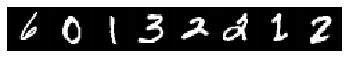

step 99, loss 661.3513793945312
Target:	 tensor([7, 5, 3, 1, 6, 5, 3, 3], device='cuda:0')
Pred:	 tensor([7, 5, 3, 1, 4, 0, 3, 8], device='cuda:0')


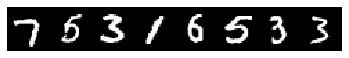

step 132, loss 580.0022583007812
Target:	 tensor([6, 1, 1, 8, 3, 6, 7, 5], device='cuda:0')
Pred:	 tensor([4, 2, 8, 3, 1, 5, 7, 5], device='cuda:0')


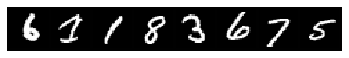

step 165, loss 508.2526550292969
Target:	 tensor([6, 3, 7, 9, 7, 1, 1, 1], device='cuda:0')
Pred:	 tensor([6, 3, 7, 9, 7, 1, 1, 1], device='cuda:0')


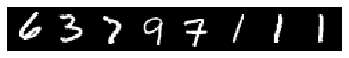

step 198, loss 446.0122375488281
Target:	 tensor([9, 9, 7, 9, 0, 9, 7, 6], device='cuda:0')
Pred:	 tensor([7, 0, 7, 9, 0, 9, 7, 6], device='cuda:0')


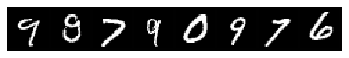

step 231, loss 391.0006408691406
Target:	 tensor([6, 5, 0, 9, 0, 5, 0, 1], device='cuda:0')
Pred:	 tensor([5, 7, 0, 9, 0, 5, 0, 1], device='cuda:0')


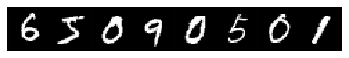

step 264, loss 343.24481201171875
Target:	 tensor([8, 7, 5, 6, 5, 2, 4, 3], device='cuda:0')
Pred:	 tensor([2, 7, 5, 5, 5, 2, 4, 7], device='cuda:0')


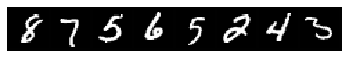

step 297, loss 301.2386474609375
Target:	 tensor([9, 6, 0, 2, 8, 9, 0, 6], device='cuda:0')
Pred:	 tensor([9, 6, 0, 2, 0, 0, 0, 6], device='cuda:0')


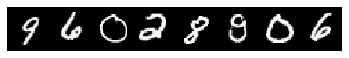

step 330, loss 264.2829895019531
Target:	 tensor([0, 8, 0, 1, 8, 1, 5, 0], device='cuda:0')
Pred:	 tensor([0, 9, 0, 1, 2, 1, 5, 0], device='cuda:0')


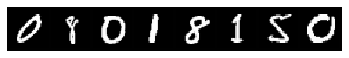

step 363, loss 232.10589599609375
Target:	 tensor([4, 1, 4, 3, 3, 5, 4, 4], device='cuda:0')
Pred:	 tensor([9, 1, 4, 7, 3, 5, 7, 4], device='cuda:0')


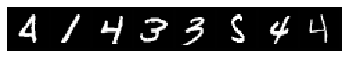

step 396, loss 203.7617645263672
Target:	 tensor([4, 5, 5, 4, 3, 1, 8, 7], device='cuda:0')
Pred:	 tensor([7, 1, 6, 9, 3, 1, 1, 7], device='cuda:0')


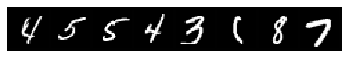

step 429, loss 178.89498901367188
Target:	 tensor([7, 3, 2, 5, 9, 3, 1, 9], device='cuda:0')
Pred:	 tensor([7, 3, 2, 5, 7, 3, 1, 7], device='cuda:0')


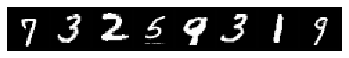

step 462, loss 157.10940551757812
Target:	 tensor([1, 8, 8, 3, 3, 1, 2, 6], device='cuda:0')
Pred:	 tensor([1, 7, 7, 3, 3, 1, 2, 6], device='cuda:0')


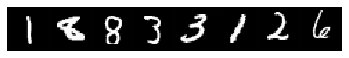

step 495, loss 138.0264129638672
Target:	 tensor([0, 8, 9, 5, 4, 2, 4, 9], device='cuda:0')
Pred:	 tensor([0, 7, 7, 3, 4, 0, 4, 7], device='cuda:0')


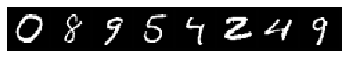

step 528, loss 121.2598876953125
Target:	 tensor([3, 1, 1, 3, 8, 8, 8, 0], device='cuda:0')
Pred:	 tensor([7, 1, 1, 0, 7, 7, 1, 0], device='cuda:0')


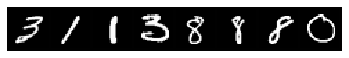

step 561, loss 106.57492065429688
Target:	 tensor([2, 1, 8, 4, 4, 9, 9, 5], device='cuda:0')
Pred:	 tensor([7, 1, 0, 4, 9, 7, 7, 3], device='cuda:0')


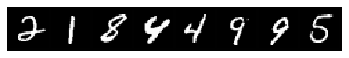

step 594, loss 93.67774963378906
Target:	 tensor([4, 3, 3, 3, 9, 7, 7, 0], device='cuda:0')
Pred:	 tensor([7, 3, 7, 3, 7, 7, 7, 0], device='cuda:0')


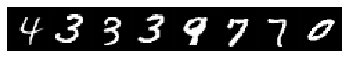

step 627, loss 82.3968734741211
Target:	 tensor([9, 6, 6, 1, 2, 6, 8, 3], device='cuda:0')
Pred:	 tensor([7, 0, 0, 1, 7, 6, 0, 3], device='cuda:0')


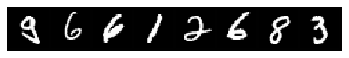

step 660, loss 72.50132751464844
Target:	 tensor([2, 5, 5, 6, 7, 1, 7, 6], device='cuda:0')
Pred:	 tensor([0, 7, 7, 0, 7, 1, 7, 0], device='cuda:0')


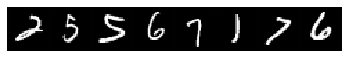

step 693, loss 63.822723388671875
Target:	 tensor([9, 2, 3, 5, 1, 2, 0, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 1, 7, 0, 7], device='cuda:0')


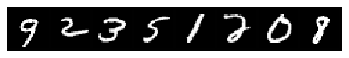

step 726, loss 56.209964752197266
Target:	 tensor([1, 7, 9, 9, 6, 5, 7, 9], device='cuda:0')
Pred:	 tensor([1, 7, 7, 7, 1, 7, 7, 7], device='cuda:0')


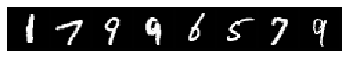

step 759, loss 49.545555114746094
Target:	 tensor([3, 2, 3, 5, 9, 7, 5, 9], device='cuda:0')
Pred:	 tensor([7, 0, 7, 7, 7, 7, 7, 7], device='cuda:0')


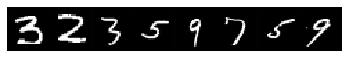

step 792, loss 43.70369338989258
Target:	 tensor([3, 1, 3, 9, 9, 4, 1, 2], device='cuda:0')
Pred:	 tensor([7, 1, 0, 7, 7, 7, 7, 7], device='cuda:0')


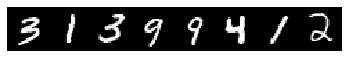

step 825, loss 38.576995849609375
Target:	 tensor([8, 9, 4, 9, 2, 7, 4, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


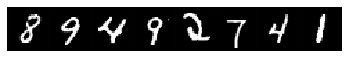

step 858, loss 34.093833923339844
Target:	 tensor([7, 6, 5, 2, 5, 7, 5, 2], device='cuda:0')
Pred:	 tensor([7, 0, 7, 7, 0, 7, 7, 7], device='cuda:0')


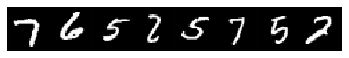

step 891, loss 30.15958595275879
Target:	 tensor([9, 9, 4, 6, 8, 2, 4, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 0, 7, 7, 7], device='cuda:0')


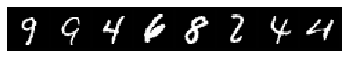

step 924, loss 26.713420867919922
Target:	 tensor([8, 2, 8, 7, 0, 9, 0, 2], device='cuda:0')
Pred:	 tensor([0, 7, 7, 7, 0, 7, 0, 7], device='cuda:0')


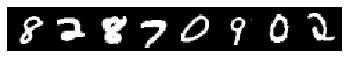

step 957, loss 23.69301414489746
Target:	 tensor([2, 2, 8, 7, 2, 5, 2, 5], device='cuda:0')
Pred:	 tensor([7, 0, 0, 7, 0, 7, 7, 0], device='cuda:0')


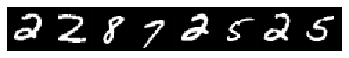

step 990, loss 21.046703338623047
Target:	 tensor([5, 6, 3, 7, 5, 4, 2, 3], device='cuda:0')
Pred:	 tensor([0, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


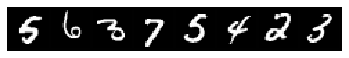

step 1023, loss 18.725793838500977
Target:	 tensor([0, 2, 1, 1, 9, 7, 3, 4], device='cuda:0')
Pred:	 tensor([0, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


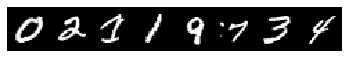

step 1056, loss 16.69196319580078
Target:	 tensor([3, 7, 7, 2, 7, 5, 5, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


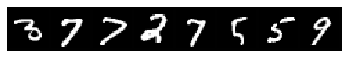

step 1089, loss 14.9104642868042
Target:	 tensor([9, 8, 3, 0, 9, 1, 4, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 0, 7, 7, 7, 7], device='cuda:0')


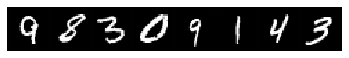

step 1122, loss 13.350107192993164
Target:	 tensor([1, 9, 0, 7, 1, 5, 6, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


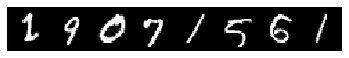

step 1155, loss 11.982396125793457
Target:	 tensor([3, 1, 9, 6, 1, 7, 1, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


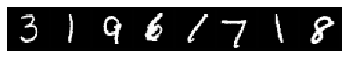

step 1188, loss 10.785957336425781
Target:	 tensor([8, 4, 9, 3, 4, 3, 7, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


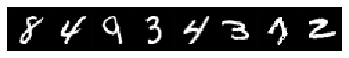

step 1221, loss 9.736052513122559
Target:	 tensor([8, 3, 8, 4, 7, 6, 0, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


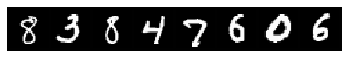

step 1254, loss 8.815559387207031
Target:	 tensor([5, 1, 6, 4, 3, 4, 1, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


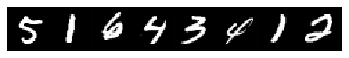

step 1287, loss 8.009096145629883
Target:	 tensor([7, 2, 7, 5, 4, 1, 6, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


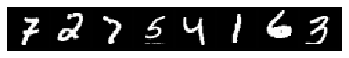

step 1320, loss 7.303006172180176
Target:	 tensor([5, 3, 7, 5, 4, 2, 1, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


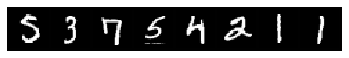

step 1353, loss 6.683684349060059
Target:	 tensor([6, 8, 8, 9, 3, 7, 7, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


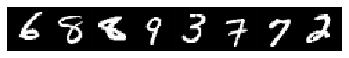

step 1386, loss 6.142279148101807
Target:	 tensor([9, 3, 7, 6, 9, 2, 4, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


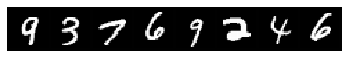

step 1419, loss 5.667166709899902
Target:	 tensor([1, 7, 0, 6, 9, 3, 2, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


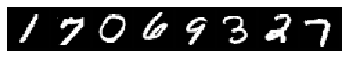

step 1452, loss 5.249646186828613
Target:	 tensor([1, 6, 3, 9, 9, 4, 3, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


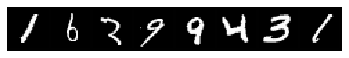

step 1485, loss 4.885345458984375
Target:	 tensor([7, 5, 1, 1, 5, 3, 5, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


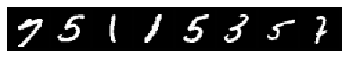

step 1518, loss 4.566676616668701
Target:	 tensor([8, 3, 8, 2, 1, 1, 9, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


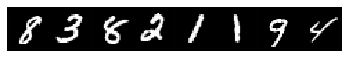

step 1551, loss 4.286017417907715
Target:	 tensor([2, 7, 8, 1, 4, 4, 4, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


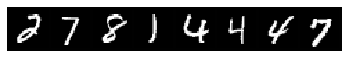

step 1584, loss 4.03964900970459
Target:	 tensor([6, 7, 8, 1, 2, 3, 3, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


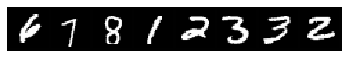

step 1617, loss 3.824660301208496
Target:	 tensor([1, 8, 6, 3, 0, 9, 1, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


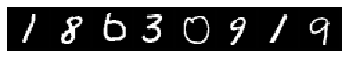

step 1650, loss 3.636658191680908
Target:	 tensor([5, 3, 5, 3, 1, 0, 1, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


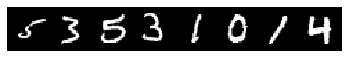

step 1683, loss 3.4712448120117188
Target:	 tensor([9, 8, 1, 7, 2, 0, 8, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


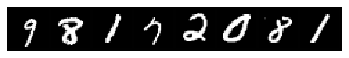

step 1716, loss 3.326801300048828
Target:	 tensor([9, 1, 1, 8, 1, 2, 1, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


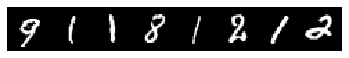

step 1749, loss 3.199739456176758
Target:	 tensor([1, 2, 4, 7, 8, 9, 4, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


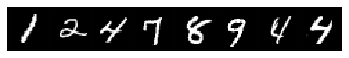

step 1782, loss 3.089263677597046
Target:	 tensor([0, 4, 3, 5, 0, 3, 6, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


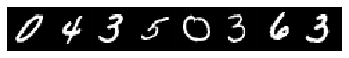

step 1815, loss 2.9914662837982178
Target:	 tensor([0, 7, 1, 1, 8, 5, 0, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


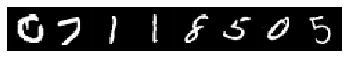

step 1848, loss 2.906416416168213
Target:	 tensor([9, 0, 3, 2, 2, 9, 0, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


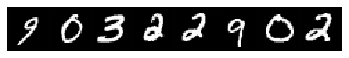

step 1881, loss 2.831051826477051
Target:	 tensor([0, 0, 5, 3, 1, 9, 3, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


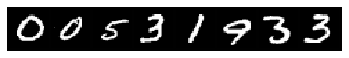

step 1914, loss 2.765841484069824
Target:	 tensor([2, 4, 3, 4, 2, 8, 9, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


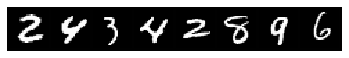

step 1947, loss 2.7088162899017334
Target:	 tensor([7, 4, 7, 3, 4, 3, 0, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


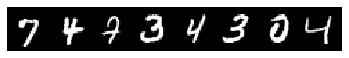

step 1980, loss 2.65842342376709
Target:	 tensor([7, 8, 5, 2, 7, 1, 4, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


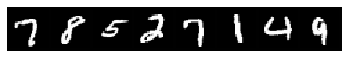

step 2013, loss 2.6136536598205566
Target:	 tensor([7, 4, 7, 7, 0, 7, 4, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


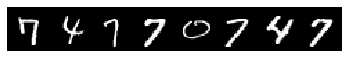

step 2046, loss 2.575582504272461
Target:	 tensor([1, 7, 4, 6, 6, 8, 3, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


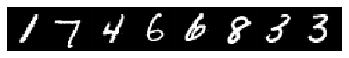

step 2079, loss 2.5421743392944336
Target:	 tensor([3, 3, 6, 6, 4, 1, 8, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


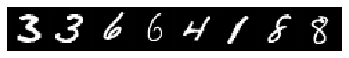

step 2112, loss 2.511998176574707
Target:	 tensor([4, 9, 0, 7, 3, 3, 4, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


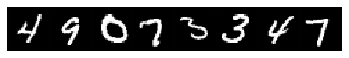

step 2145, loss 2.486588954925537
Target:	 tensor([7, 9, 2, 6, 0, 5, 8, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


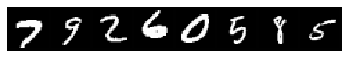

step 2178, loss 2.46364688873291
Target:	 tensor([2, 6, 8, 4, 4, 8, 4, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


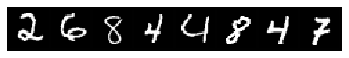

step 2211, loss 2.4437572956085205
Target:	 tensor([5, 6, 3, 1, 3, 6, 3, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


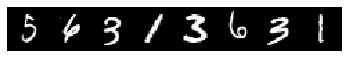

step 2244, loss 2.425935983657837
Target:	 tensor([1, 5, 5, 7, 1, 2, 1, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


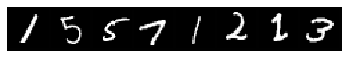

step 2277, loss 2.4106690883636475
Target:	 tensor([2, 6, 8, 2, 3, 4, 4, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


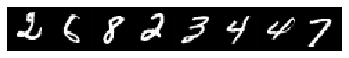

step 2310, loss 2.3974456787109375
Target:	 tensor([0, 0, 9, 7, 7, 7, 3, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


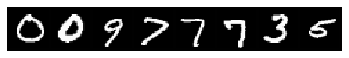

step 2343, loss 2.3856358528137207
Target:	 tensor([2, 5, 0, 6, 7, 4, 6, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


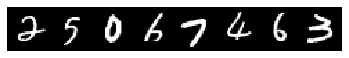

step 2376, loss 2.375291347503662
Target:	 tensor([7, 6, 5, 4, 9, 9, 1, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


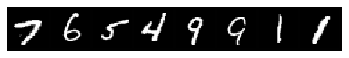

step 2409, loss 2.3662400245666504
Target:	 tensor([9, 3, 6, 8, 5, 2, 1, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


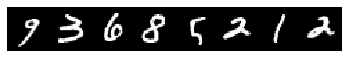

step 2442, loss 2.3584964275360107
Target:	 tensor([4, 7, 2, 7, 3, 8, 0, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


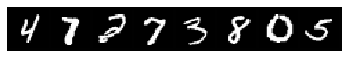

step 2475, loss 2.351519823074341
Target:	 tensor([1, 6, 5, 4, 7, 5, 7, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


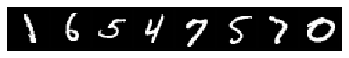

step 2508, loss 2.345554828643799
Target:	 tensor([6, 2, 0, 7, 1, 4, 5, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


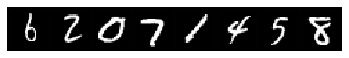

step 2541, loss 2.3401613235473633
Target:	 tensor([5, 6, 7, 1, 4, 8, 5, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


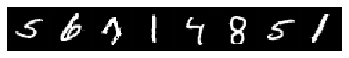

step 2574, loss 2.3355114459991455
Target:	 tensor([7, 5, 0, 6, 5, 2, 3, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


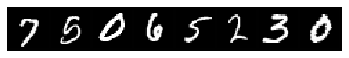

step 2607, loss 2.3312857151031494
Target:	 tensor([7, 4, 8, 7, 6, 9, 8, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


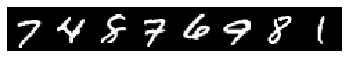

step 2640, loss 2.3276844024658203
Target:	 tensor([7, 1, 6, 4, 3, 1, 2, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


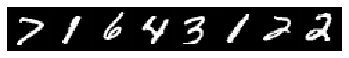

step 2673, loss 2.3247227668762207
Target:	 tensor([1, 1, 2, 8, 1, 2, 3, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


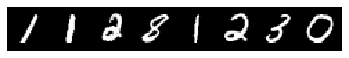

step 2706, loss 2.3219897747039795
Target:	 tensor([7, 9, 3, 2, 7, 2, 6, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


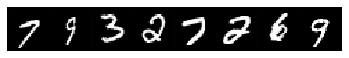

step 2739, loss 2.319423198699951
Target:	 tensor([6, 6, 6, 0, 8, 3, 7, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


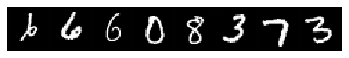

step 2772, loss 2.3173930644989014
Target:	 tensor([8, 4, 3, 0, 5, 5, 3, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


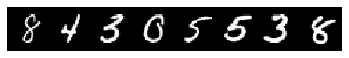

step 2805, loss 2.3155670166015625
Target:	 tensor([8, 9, 7, 5, 4, 8, 1, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


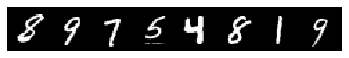

step 2838, loss 2.3137264251708984
Target:	 tensor([5, 1, 4, 6, 1, 4, 6, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


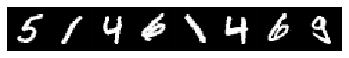

step 2871, loss 2.312588930130005
Target:	 tensor([2, 8, 5, 6, 0, 6, 7, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


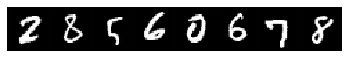

step 2904, loss 2.311311960220337
Target:	 tensor([2, 2, 9, 2, 2, 6, 1, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


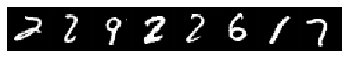

step 2937, loss 2.310518741607666
Target:	 tensor([0, 1, 0, 3, 2, 8, 8, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


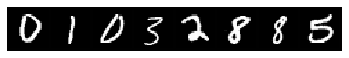

step 2970, loss 2.309041738510132
Target:	 tensor([1, 7, 9, 4, 2, 1, 3, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


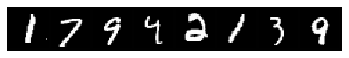

step 3003, loss 2.3085219860076904
Target:	 tensor([9, 1, 8, 0, 2, 8, 4, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


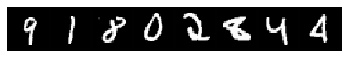

step 3036, loss 2.307427167892456
Target:	 tensor([5, 4, 7, 0, 7, 4, 2, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


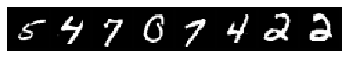

step 3069, loss 2.306973457336426
Target:	 tensor([6, 1, 9, 1, 3, 1, 5, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


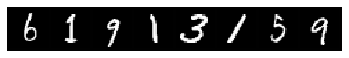

step 3102, loss 2.306360960006714
Target:	 tensor([0, 6, 7, 6, 7, 9, 0, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


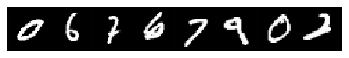

step 3135, loss 2.30586838722229
Target:	 tensor([2, 4, 1, 9, 6, 7, 7, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


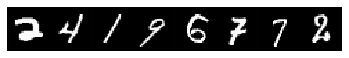

step 3168, loss 2.3054869174957275
Target:	 tensor([2, 1, 4, 2, 3, 8, 6, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


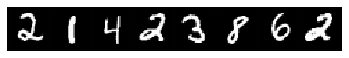

step 3201, loss 2.3050944805145264
Target:	 tensor([2, 7, 7, 3, 6, 9, 8, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


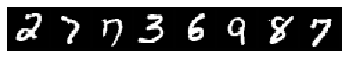

step 3234, loss 2.30500864982605
Target:	 tensor([4, 6, 4, 0, 2, 6, 5, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


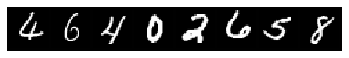

step 3267, loss 2.3043222427368164
Target:	 tensor([4, 1, 7, 5, 2, 1, 0, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


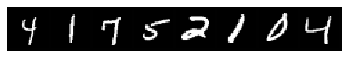

step 0, loss 4851.6279296875
Target:	 tensor([4, 2, 1, 1, 3, 7, 7, 7], device='cuda:0')
Pred:	 tensor([7, 3, 3, 9, 8, 8, 8, 8], device='cuda:0')


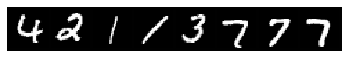

step 33, loss 2495.32421875
Target:	 tensor([5, 4, 8, 4, 8, 8, 2, 7], device='cuda:0')
Pred:	 tensor([6, 3, 3, 5, 7, 3, 9, 0], device='cuda:0')


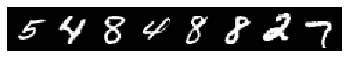

step 66, loss 1286.3548583984375
Target:	 tensor([3, 7, 3, 8, 1, 6, 2, 2], device='cuda:0')
Pred:	 tensor([5, 5, 8, 7, 7, 6, 5, 2], device='cuda:0')


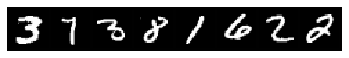

step 99, loss 663.8118896484375
Target:	 tensor([5, 1, 4, 7, 8, 7, 1, 7], device='cuda:0')
Pred:	 tensor([8, 0, 3, 8, 3, 0, 3, 0], device='cuda:0')


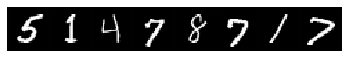

step 132, loss 343.0794677734375
Target:	 tensor([5, 6, 1, 7, 1, 7, 0, 3], device='cuda:0')
Pred:	 tensor([3, 3, 0, 0, 3, 3, 0, 5], device='cuda:0')


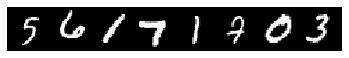

step 165, loss 177.8560333251953
Target:	 tensor([1, 9, 1, 7, 2, 2, 6, 5], device='cuda:0')
Pred:	 tensor([0, 0, 0, 0, 0, 8, 0, 0], device='cuda:0')


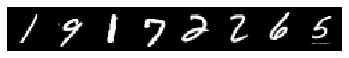

step 198, loss 92.73387145996094
Target:	 tensor([9, 4, 1, 4, 0, 5, 7, 2], device='cuda:0')
Pred:	 tensor([8, 0, 0, 0, 0, 8, 0, 0], device='cuda:0')


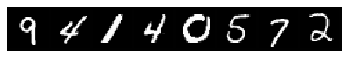

step 231, loss 48.889732360839844
Target:	 tensor([2, 5, 5, 6, 7, 8, 9, 1], device='cuda:0')
Pred:	 tensor([8, 8, 8, 8, 0, 8, 8, 8], device='cuda:0')


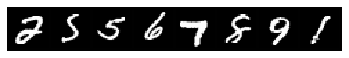

step 264, loss 26.299781799316406
Target:	 tensor([7, 3, 8, 0, 1, 9, 5, 9], device='cuda:0')
Pred:	 tensor([8, 8, 8, 8, 8, 8, 8, 8], device='cuda:0')


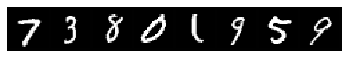

step 297, loss 14.665035247802734
Target:	 tensor([7, 5, 1, 3, 1, 5, 1, 7], device='cuda:0')
Pred:	 tensor([8, 8, 8, 8, 8, 8, 8, 8], device='cuda:0')


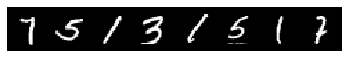

step 330, loss 8.670527458190918
Target:	 tensor([2, 8, 0, 1, 0, 0, 2, 7], device='cuda:0')
Pred:	 tensor([8, 8, 8, 8, 8, 8, 8, 8], device='cuda:0')


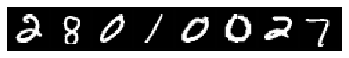

step 363, loss 5.583033084869385
Target:	 tensor([2, 7, 6, 4, 4, 3, 4, 1], device='cuda:0')
Pred:	 tensor([8, 8, 8, 8, 8, 8, 8, 8], device='cuda:0')


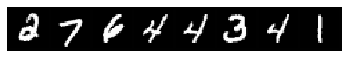

step 396, loss 3.992427349090576
Target:	 tensor([3, 3, 3, 4, 6, 7, 1, 7], device='cuda:0')
Pred:	 tensor([8, 8, 8, 8, 8, 8, 8, 8], device='cuda:0')


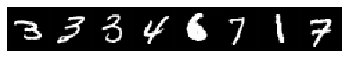

step 429, loss 3.172610282897949
Target:	 tensor([9, 8, 6, 5, 3, 3, 0, 9], device='cuda:0')
Pred:	 tensor([0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')


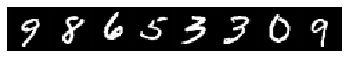

step 462, loss 2.751006841659546
Target:	 tensor([8, 9, 6, 1, 7, 4, 2, 9], device='cuda:0')
Pred:	 tensor([3, 3, 3, 3, 3, 3, 3, 3], device='cuda:0')


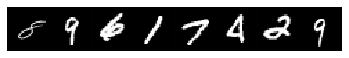

step 495, loss 2.533389091491699
Target:	 tensor([2, 9, 2, 3, 1, 3, 8, 8], device='cuda:0')
Pred:	 tensor([3, 3, 3, 3, 3, 3, 3, 3], device='cuda:0')


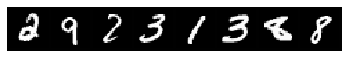

step 528, loss 2.4214775562286377
Target:	 tensor([9, 9, 8, 0, 7, 3, 2, 6], device='cuda:0')
Pred:	 tensor([3, 3, 3, 3, 3, 3, 3, 3], device='cuda:0')


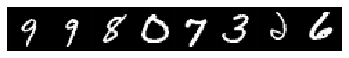

step 561, loss 2.3637642860412598
Target:	 tensor([0, 6, 6, 9, 4, 7, 0, 2], device='cuda:0')
Pred:	 tensor([3, 3, 3, 3, 3, 3, 3, 3], device='cuda:0')


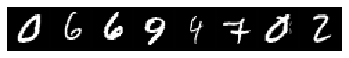

step 594, loss 2.3340606689453125
Target:	 tensor([7, 2, 5, 7, 9, 2, 2, 2], device='cuda:0')
Pred:	 tensor([3, 3, 3, 3, 3, 3, 3, 3], device='cuda:0')


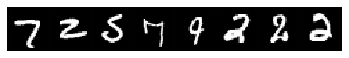

step 627, loss 2.3187255859375
Target:	 tensor([0, 4, 1, 0, 9, 7, 2, 1], device='cuda:0')
Pred:	 tensor([3, 3, 3, 3, 3, 3, 3, 3], device='cuda:0')


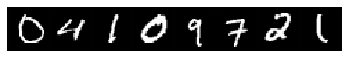

step 660, loss 2.3108696937561035
Target:	 tensor([2, 7, 0, 9, 6, 0, 4, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


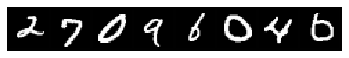

step 693, loss 2.3067638874053955
Target:	 tensor([9, 9, 1, 2, 1, 4, 3, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


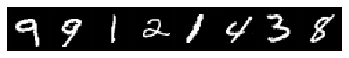

step 726, loss 2.304710865020752
Target:	 tensor([3, 6, 8, 6, 9, 9, 4, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


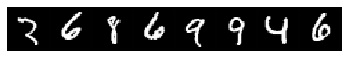

step 759, loss 2.303663492202759
Target:	 tensor([0, 6, 2, 6, 2, 5, 3, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


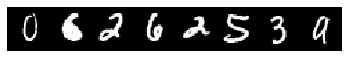

step 792, loss 2.303088426589966
Target:	 tensor([4, 7, 1, 6, 9, 1, 6, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


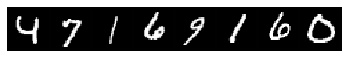

step 825, loss 2.302797794342041
Target:	 tensor([7, 1, 9, 0, 8, 6, 0, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


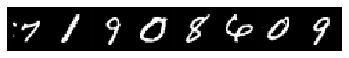

step 858, loss 2.3026528358459473
Target:	 tensor([0, 4, 0, 3, 0, 1, 9, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


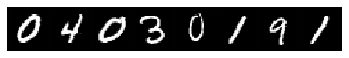

step 891, loss 2.302534818649292
Target:	 tensor([3, 0, 6, 0, 0, 7, 8, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


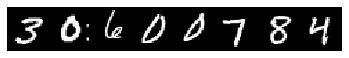

step 924, loss 2.302530288696289
Target:	 tensor([7, 7, 2, 3, 3, 2, 8, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


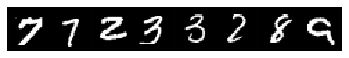

step 957, loss 2.302515983581543
Target:	 tensor([4, 3, 6, 7, 5, 0, 8, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


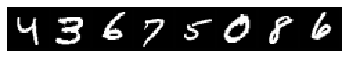

step 990, loss 2.302499771118164
Target:	 tensor([4, 0, 3, 0, 5, 0, 8, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


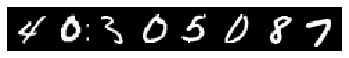

step 1023, loss 2.302473783493042
Target:	 tensor([1, 1, 6, 7, 9, 6, 2, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


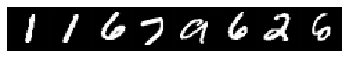

step 1056, loss 2.3024494647979736
Target:	 tensor([7, 1, 0, 0, 2, 4, 1, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


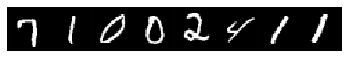

step 1089, loss 2.302422523498535
Target:	 tensor([1, 9, 7, 3, 7, 5, 2, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


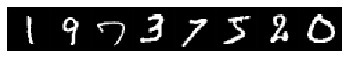

step 1122, loss 2.3025143146514893
Target:	 tensor([1, 3, 9, 0, 6, 1, 5, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


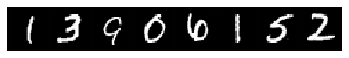

step 1155, loss 2.3024826049804688
Target:	 tensor([7, 4, 9, 6, 5, 6, 8, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


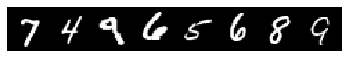

step 1188, loss 2.302522897720337
Target:	 tensor([0, 5, 3, 0, 4, 3, 8, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


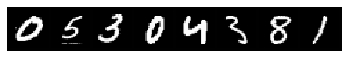

step 1221, loss 2.302450656890869
Target:	 tensor([4, 3, 4, 3, 7, 1, 7, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


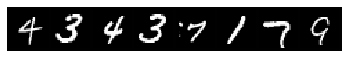

step 1254, loss 2.3024442195892334
Target:	 tensor([1, 1, 7, 0, 6, 5, 8, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


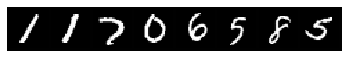

step 1287, loss 2.302520513534546
Target:	 tensor([8, 3, 9, 9, 4, 2, 7, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


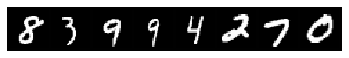

step 1320, loss 2.302532911300659
Target:	 tensor([8, 0, 3, 3, 8, 0, 9, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


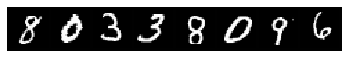

step 1353, loss 2.302452325820923
Target:	 tensor([4, 3, 7, 7, 7, 1, 0, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


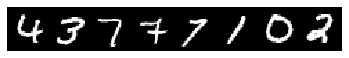

step 1386, loss 2.3024494647979736
Target:	 tensor([1, 1, 5, 9, 1, 3, 9, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


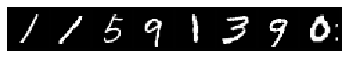

step 1419, loss 2.302473783493042
Target:	 tensor([1, 2, 7, 5, 4, 7, 6, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


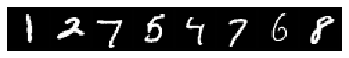

step 1452, loss 2.30244517326355
Target:	 tensor([9, 7, 4, 8, 3, 1, 3, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


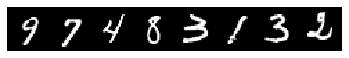

step 1485, loss 2.3025221824645996
Target:	 tensor([3, 0, 3, 9, 8, 8, 6, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


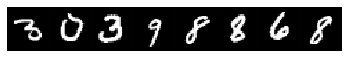

step 1518, loss 2.302490234375
Target:	 tensor([7, 5, 0, 4, 5, 7, 0, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


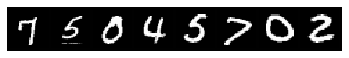

step 1551, loss 2.302495002746582
Target:	 tensor([3, 3, 7, 5, 0, 2, 9, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


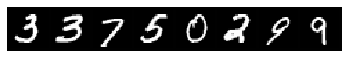

step 1584, loss 2.3024656772613525
Target:	 tensor([6, 6, 1, 9, 2, 4, 4, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


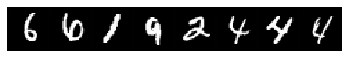

step 1617, loss 2.302460193634033
Target:	 tensor([0, 4, 5, 4, 1, 0, 3, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


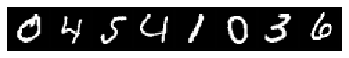

step 1650, loss 2.3024487495422363
Target:	 tensor([9, 8, 1, 3, 9, 9, 3, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


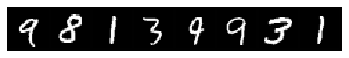

step 1683, loss 2.302483081817627
Target:	 tensor([2, 6, 6, 5, 4, 3, 9, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


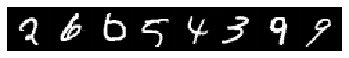

step 1716, loss 2.30244779586792
Target:	 tensor([0, 7, 0, 5, 4, 8, 7, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


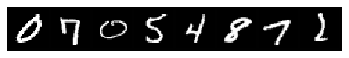

step 1749, loss 2.302506685256958
Target:	 tensor([2, 2, 7, 1, 4, 2, 1, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


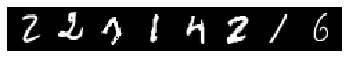

step 1782, loss 2.302516460418701
Target:	 tensor([6, 3, 8, 7, 8, 1, 6, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


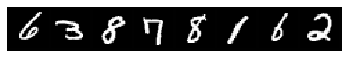

step 1815, loss 2.302469491958618
Target:	 tensor([7, 1, 1, 0, 9, 4, 9, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


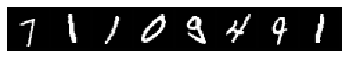

step 1848, loss 2.3025054931640625
Target:	 tensor([7, 2, 3, 4, 6, 5, 1, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


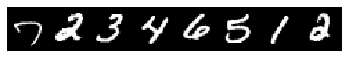

step 1881, loss 2.3024723529815674
Target:	 tensor([0, 7, 8, 8, 8, 5, 2, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


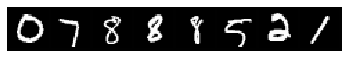

step 1914, loss 2.3024799823760986
Target:	 tensor([2, 5, 3, 7, 6, 6, 9, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


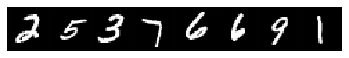

step 1947, loss 2.302483558654785
Target:	 tensor([9, 9, 2, 6, 0, 8, 1, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


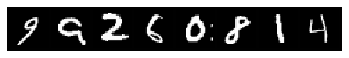

step 1980, loss 2.3025028705596924
Target:	 tensor([6, 5, 6, 5, 6, 0, 4, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


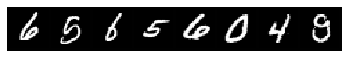

step 2013, loss 2.302485227584839
Target:	 tensor([8, 0, 6, 3, 7, 3, 0, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


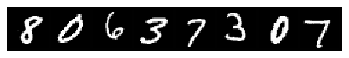

step 2046, loss 2.3024814128875732
Target:	 tensor([5, 7, 4, 9, 0, 8, 0, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


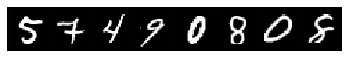

step 2079, loss 2.3024659156799316
Target:	 tensor([1, 8, 1, 7, 9, 1, 9, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


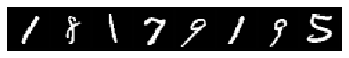

step 2112, loss 2.3024981021881104
Target:	 tensor([1, 4, 0, 3, 1, 6, 6, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


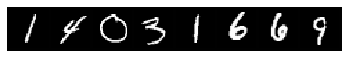

step 2145, loss 2.3024752140045166
Target:	 tensor([1, 5, 2, 3, 5, 2, 6, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


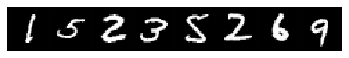

step 2178, loss 2.302476167678833
Target:	 tensor([1, 3, 1, 3, 5, 4, 6, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


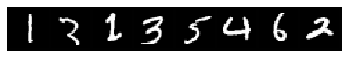

step 2211, loss 2.3025095462799072
Target:	 tensor([9, 6, 8, 8, 5, 4, 1, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


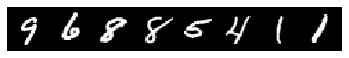

step 2244, loss 2.3025012016296387
Target:	 tensor([4, 1, 1, 6, 1, 5, 6, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


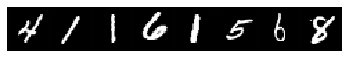

step 2277, loss 2.3025217056274414
Target:	 tensor([0, 0, 8, 2, 2, 0, 2, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


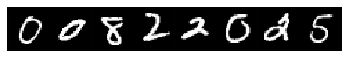

step 2310, loss 2.302457571029663
Target:	 tensor([7, 6, 7, 8, 7, 4, 8, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


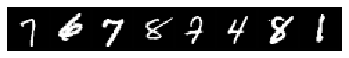

step 2343, loss 2.3024909496307373
Target:	 tensor([3, 0, 3, 4, 2, 3, 5, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


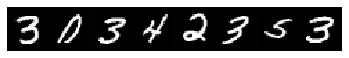

step 2376, loss 2.302499532699585
Target:	 tensor([3, 6, 6, 8, 6, 5, 9, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


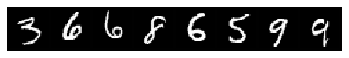

step 2409, loss 2.302440881729126
Target:	 tensor([2, 7, 1, 0, 0, 9, 1, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


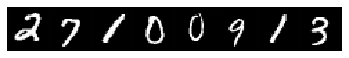

step 2442, loss 2.3024966716766357
Target:	 tensor([3, 3, 0, 2, 5, 4, 1, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


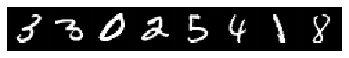

step 2475, loss 2.3024818897247314
Target:	 tensor([0, 6, 8, 1, 9, 7, 6, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


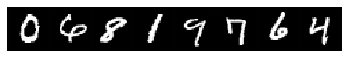

step 2508, loss 2.302492380142212
Target:	 tensor([5, 3, 0, 8, 6, 3, 2, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


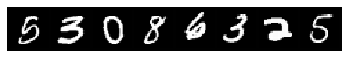

step 2541, loss 2.302441358566284
Target:	 tensor([7, 2, 2, 9, 3, 4, 5, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


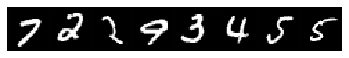

step 2574, loss 2.3024888038635254
Target:	 tensor([1, 8, 2, 4, 1, 3, 5, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


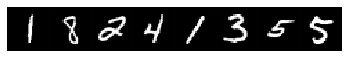

step 2607, loss 2.3024916648864746
Target:	 tensor([5, 5, 4, 6, 0, 4, 5, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


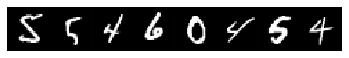

step 2640, loss 2.302500009536743
Target:	 tensor([5, 4, 8, 6, 7, 0, 3, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


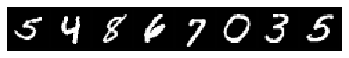

step 2673, loss 2.3024234771728516
Target:	 tensor([0, 6, 9, 7, 7, 2, 4, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


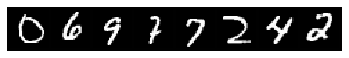

step 2706, loss 2.302483558654785
Target:	 tensor([8, 7, 2, 8, 0, 2, 1, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


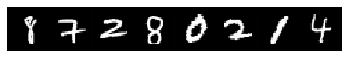

step 2739, loss 2.3024823665618896
Target:	 tensor([4, 2, 9, 0, 0, 1, 7, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


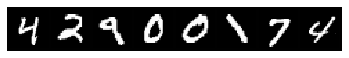

step 2772, loss 2.3025197982788086
Target:	 tensor([4, 4, 0, 9, 6, 8, 3, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


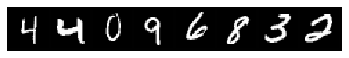

step 2805, loss 2.3024892807006836
Target:	 tensor([5, 2, 8, 5, 0, 4, 1, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


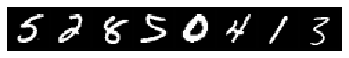

step 2838, loss 2.3024888038635254
Target:	 tensor([5, 2, 6, 4, 4, 4, 5, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


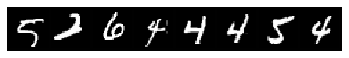

step 2871, loss 2.3025219440460205
Target:	 tensor([5, 1, 0, 8, 6, 7, 6, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


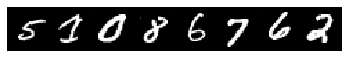

step 2904, loss 2.302490234375
Target:	 tensor([0, 2, 8, 0, 3, 2, 3, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


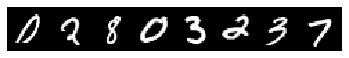

step 2937, loss 2.302450180053711
Target:	 tensor([7, 5, 1, 3, 7, 1, 1, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


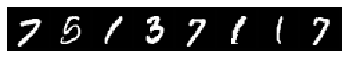

step 2970, loss 2.302471399307251
Target:	 tensor([7, 3, 1, 8, 7, 0, 2, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


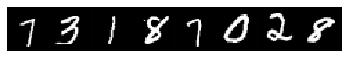

step 3003, loss 2.302475690841675
Target:	 tensor([0, 6, 9, 1, 6, 9, 2, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


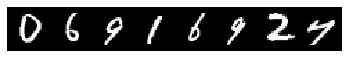

step 3036, loss 2.30246639251709
Target:	 tensor([1, 7, 4, 2, 7, 6, 0, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


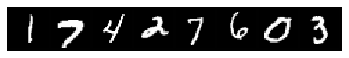

step 3069, loss 2.3024492263793945
Target:	 tensor([7, 1, 7, 9, 6, 6, 9, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


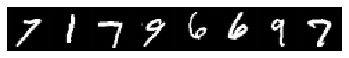

step 3102, loss 2.3024981021881104
Target:	 tensor([0, 4, 3, 8, 8, 6, 4, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


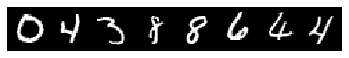

step 3135, loss 2.302518844604492
Target:	 tensor([4, 5, 5, 3, 4, 1, 6, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


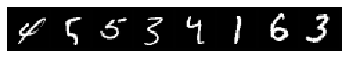

step 3168, loss 2.30246901512146
Target:	 tensor([8, 7, 9, 7, 7, 7, 8, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


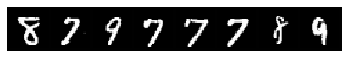

step 3201, loss 2.3024489879608154
Target:	 tensor([8, 3, 9, 7, 3, 3, 7, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


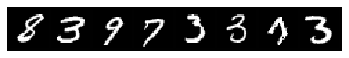

step 3234, loss 2.3025238513946533
Target:	 tensor([6, 5, 2, 0, 7, 6, 1, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


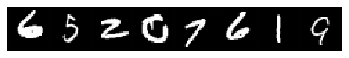

step 3267, loss 2.3025104999542236
Target:	 tensor([9, 6, 7, 8, 0, 0, 2, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


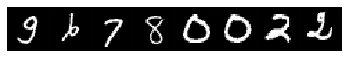

step 0, loss 9842.318359375
Target:	 tensor([0, 8, 5, 5, 1, 3, 6, 1], device='cuda:0')
Pred:	 tensor([8, 9, 8, 9, 9, 9, 9, 9], device='cuda:0')


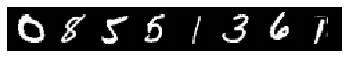

step 33, loss 2592.334716796875
Target:	 tensor([6, 5, 2, 7, 9, 8, 4, 0], device='cuda:0')
Pred:	 tensor([7, 9, 9, 1, 9, 8, 2, 9], device='cuda:0')


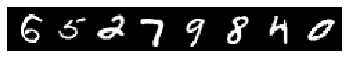

step 66, loss 685.0503540039062
Target:	 tensor([6, 8, 9, 0, 8, 6, 7, 2], device='cuda:0')
Pred:	 tensor([7, 4, 9, 4, 7, 7, 7, 7], device='cuda:0')


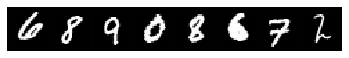

step 99, loss 182.26296997070312
Target:	 tensor([8, 5, 7, 1, 2, 9, 0, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


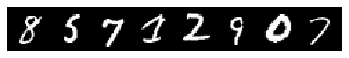

step 132, loss 49.73831558227539
Target:	 tensor([6, 9, 9, 6, 7, 8, 7, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


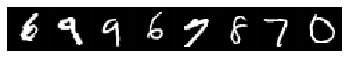

step 165, loss 14.806718826293945
Target:	 tensor([6, 0, 6, 9, 5, 9, 5, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


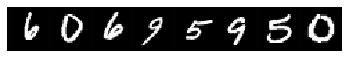

step 198, loss 5.597903251647949
Target:	 tensor([0, 3, 4, 1, 4, 8, 7, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


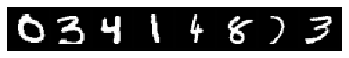

step 231, loss 3.1711795330047607
Target:	 tensor([7, 4, 5, 7, 0, 4, 7, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


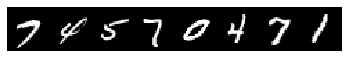

step 264, loss 2.5314033031463623
Target:	 tensor([3, 5, 7, 7, 1, 7, 7, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


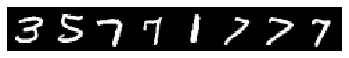

step 297, loss 2.362821102142334
Target:	 tensor([1, 8, 9, 2, 3, 2, 4, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


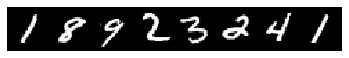

step 330, loss 2.318394899368286
Target:	 tensor([6, 1, 0, 9, 7, 7, 7, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


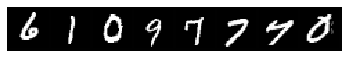

step 363, loss 2.30668306350708
Target:	 tensor([9, 0, 6, 5, 1, 4, 4, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


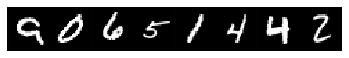

step 396, loss 2.303607940673828
Target:	 tensor([7, 5, 6, 6, 1, 5, 3, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


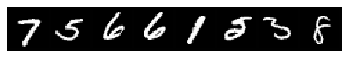

step 429, loss 2.3028008937835693
Target:	 tensor([0, 0, 8, 1, 2, 3, 8, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


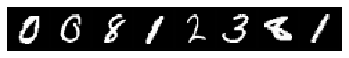

step 462, loss 2.3025641441345215
Target:	 tensor([6, 1, 4, 2, 0, 9, 7, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


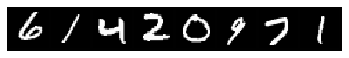

step 495, loss 2.302497148513794
Target:	 tensor([0, 8, 3, 7, 2, 8, 1, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


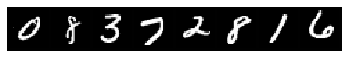

step 528, loss 2.3024845123291016
Target:	 tensor([1, 4, 1, 3, 4, 5, 6, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


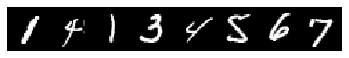

step 561, loss 2.3025035858154297
Target:	 tensor([0, 4, 9, 4, 5, 8, 1, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


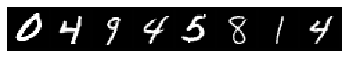

step 594, loss 2.302469253540039
Target:	 tensor([9, 7, 5, 9, 7, 2, 8, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


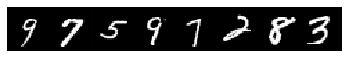

step 627, loss 2.302490711212158
Target:	 tensor([8, 8, 0, 2, 7, 4, 3, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


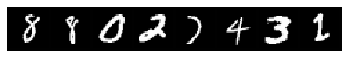

step 660, loss 2.3024744987487793
Target:	 tensor([4, 0, 2, 4, 1, 9, 9, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


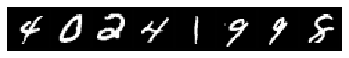

step 693, loss 2.3024744987487793
Target:	 tensor([8, 4, 7, 6, 9, 7, 1, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


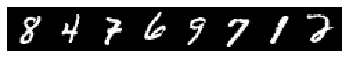

step 726, loss 2.3024821281433105
Target:	 tensor([1, 2, 9, 6, 0, 0, 0, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


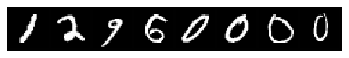

step 759, loss 2.3024792671203613
Target:	 tensor([5, 4, 1, 5, 1, 6, 9, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


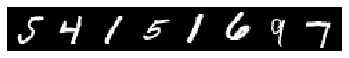

step 792, loss 2.3025014400482178
Target:	 tensor([8, 5, 9, 9, 8, 6, 4, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


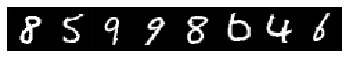

step 825, loss 2.3024818897247314
Target:	 tensor([3, 5, 6, 4, 1, 4, 8, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


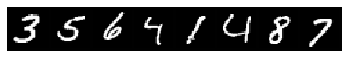

step 858, loss 2.302489757537842
Target:	 tensor([7, 7, 2, 5, 3, 3, 5, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


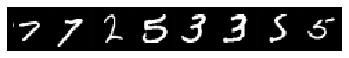

step 891, loss 2.3024911880493164
Target:	 tensor([8, 4, 0, 3, 0, 1, 3, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


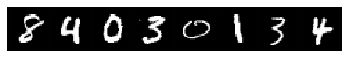

step 924, loss 2.3024845123291016
Target:	 tensor([9, 6, 4, 2, 8, 2, 4, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


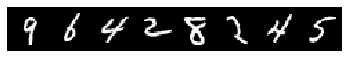

step 957, loss 2.302475929260254
Target:	 tensor([9, 6, 5, 2, 1, 7, 5, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


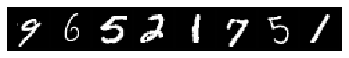

step 990, loss 2.302489757537842
Target:	 tensor([0, 9, 7, 6, 5, 3, 6, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


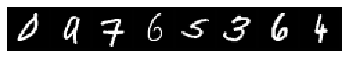

step 1023, loss 2.302492618560791
Target:	 tensor([8, 0, 5, 7, 0, 2, 6, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


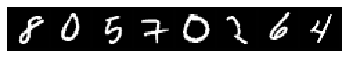

step 1056, loss 2.3024866580963135
Target:	 tensor([5, 5, 4, 7, 4, 6, 5, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


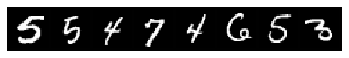

step 1089, loss 2.3024837970733643
Target:	 tensor([9, 0, 6, 9, 3, 7, 1, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


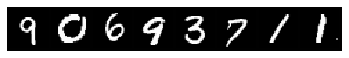

step 1122, loss 2.302452325820923
Target:	 tensor([1, 3, 1, 1, 1, 7, 1, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


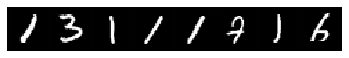

step 1155, loss 2.302494525909424
Target:	 tensor([4, 3, 6, 0, 8, 4, 8, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


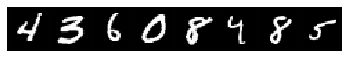

step 1188, loss 2.302497386932373
Target:	 tensor([9, 7, 8, 8, 9, 2, 9, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


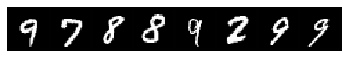

step 1221, loss 2.3025035858154297
Target:	 tensor([7, 3, 8, 5, 6, 0, 6, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


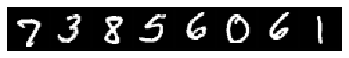

step 1254, loss 2.3024964332580566
Target:	 tensor([8, 6, 6, 1, 6, 2, 2, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


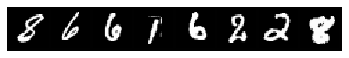

step 1287, loss 2.3024823665618896
Target:	 tensor([1, 3, 7, 2, 8, 7, 9, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


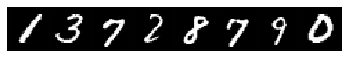

step 1320, loss 2.3025124073028564
Target:	 tensor([1, 6, 8, 6, 3, 7, 6, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


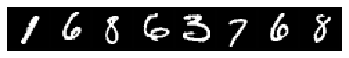

step 1353, loss 2.3024933338165283
Target:	 tensor([9, 1, 6, 6, 4, 6, 0, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


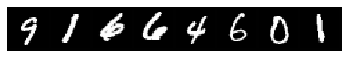

step 1386, loss 2.302489757537842
Target:	 tensor([8, 0, 7, 1, 6, 0, 7, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


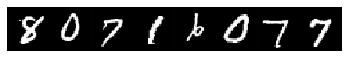

step 1419, loss 2.302506446838379
Target:	 tensor([7, 6, 3, 4, 6, 4, 9, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


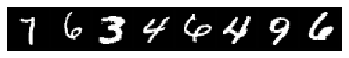

step 1452, loss 2.3024890422821045
Target:	 tensor([0, 6, 9, 8, 4, 5, 2, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


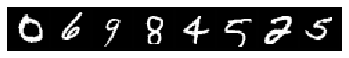

step 1485, loss 2.302490711212158
Target:	 tensor([6, 3, 7, 7, 9, 9, 0, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


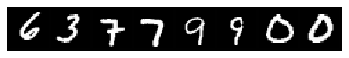

step 1518, loss 2.302483081817627
Target:	 tensor([2, 7, 8, 0, 7, 9, 4, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


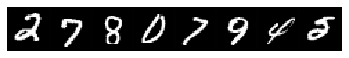

step 1551, loss 2.3024866580963135
Target:	 tensor([6, 2, 7, 0, 5, 6, 2, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


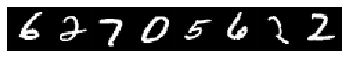

step 1584, loss 2.302480459213257
Target:	 tensor([2, 5, 0, 2, 7, 3, 6, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


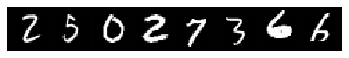

step 1617, loss 2.3024747371673584
Target:	 tensor([1, 7, 7, 5, 2, 0, 6, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


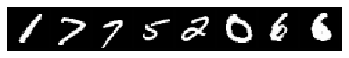

step 1650, loss 2.302464008331299
Target:	 tensor([7, 6, 7, 3, 7, 4, 4, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


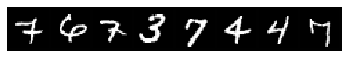

step 1683, loss 2.302497148513794
Target:	 tensor([6, 3, 4, 1, 4, 8, 9, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


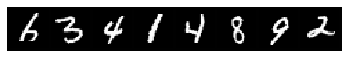

step 1716, loss 2.302483081817627
Target:	 tensor([3, 4, 8, 5, 2, 0, 3, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


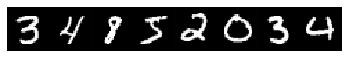

step 1749, loss 2.302459716796875
Target:	 tensor([8, 1, 1, 3, 7, 7, 3, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


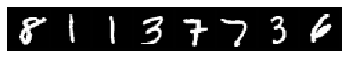

step 1782, loss 2.3024802207946777
Target:	 tensor([4, 3, 4, 8, 3, 8, 5, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


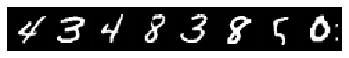

step 1815, loss 2.3024823665618896
Target:	 tensor([1, 4, 4, 7, 8, 7, 3, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


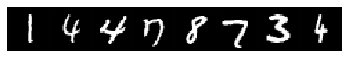

step 1848, loss 2.302482843399048
Target:	 tensor([0, 7, 6, 7, 6, 4, 8, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


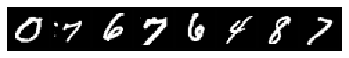

step 1881, loss 2.3024816513061523
Target:	 tensor([4, 8, 1, 3, 7, 9, 4, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


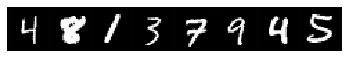

step 1914, loss 2.302480459213257
Target:	 tensor([1, 3, 4, 2, 0, 5, 6, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


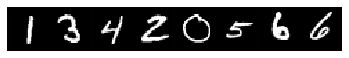

step 1947, loss 2.302495241165161
Target:	 tensor([8, 6, 4, 7, 2, 1, 9, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


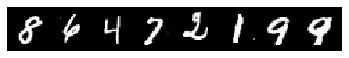

step 1980, loss 2.302497625350952
Target:	 tensor([9, 2, 0, 5, 6, 4, 0, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


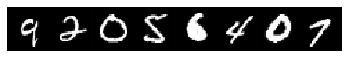

step 2013, loss 2.3025012016296387
Target:	 tensor([5, 6, 1, 6, 2, 8, 3, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


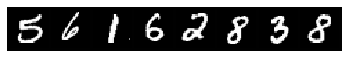

step 2046, loss 2.302485466003418
Target:	 tensor([3, 1, 3, 3, 0, 0, 0, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


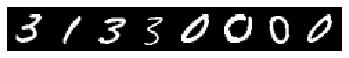

step 2079, loss 2.302511692047119
Target:	 tensor([4, 1, 4, 0, 5, 5, 5, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


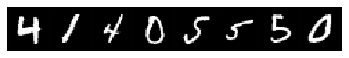

step 2112, loss 2.302471876144409
Target:	 tensor([1, 4, 5, 0, 9, 5, 3, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


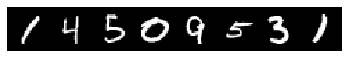

step 2145, loss 2.302478790283203
Target:	 tensor([6, 9, 9, 2, 2, 9, 9, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


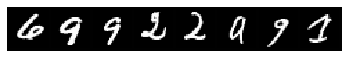

step 2178, loss 2.3024959564208984
Target:	 tensor([2, 8, 7, 6, 4, 5, 7, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


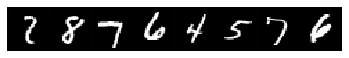

step 2211, loss 2.3024871349334717
Target:	 tensor([0, 0, 2, 7, 0, 4, 7, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


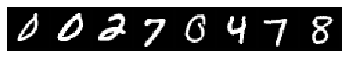

step 2244, loss 2.302490234375
Target:	 tensor([1, 0, 0, 1, 9, 8, 3, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


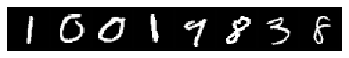

step 2277, loss 2.302480459213257
Target:	 tensor([3, 3, 2, 2, 2, 8, 4, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


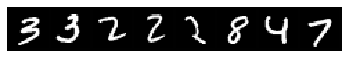

step 2310, loss 2.3024892807006836
Target:	 tensor([3, 0, 8, 7, 2, 5, 9, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


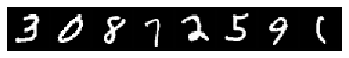

step 2343, loss 2.302483320236206
Target:	 tensor([4, 3, 4, 0, 8, 2, 4, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


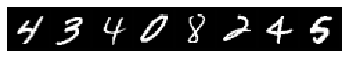

step 2376, loss 2.302461862564087
Target:	 tensor([5, 7, 4, 0, 0, 9, 5, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


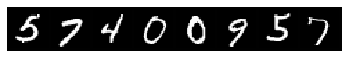

step 2409, loss 2.3024911880493164
Target:	 tensor([6, 0, 4, 4, 8, 0, 8, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


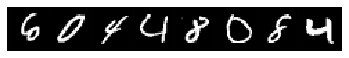

step 2442, loss 2.3025004863739014
Target:	 tensor([0, 4, 2, 7, 5, 1, 0, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


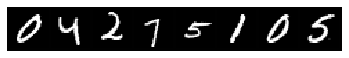

step 2475, loss 2.3025081157684326
Target:	 tensor([5, 0, 1, 0, 2, 4, 5, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


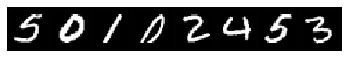

step 2508, loss 2.302473783493042
Target:	 tensor([1, 1, 5, 1, 7, 3, 9, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


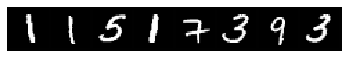

step 2541, loss 2.302488327026367
Target:	 tensor([8, 7, 3, 0, 1, 5, 3, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


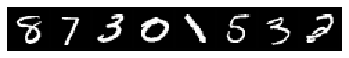

step 2574, loss 2.302473545074463
Target:	 tensor([1, 2, 4, 9, 5, 8, 0, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


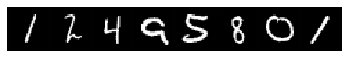

step 2607, loss 2.302478313446045
Target:	 tensor([1, 2, 9, 2, 7, 4, 5, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


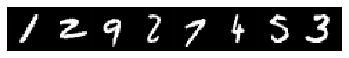

step 2640, loss 2.3024702072143555
Target:	 tensor([6, 2, 3, 5, 1, 2, 7, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


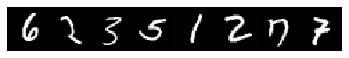

step 2673, loss 2.3024542331695557
Target:	 tensor([3, 7, 1, 5, 7, 7, 0, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


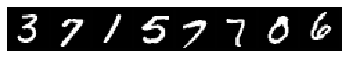

step 2706, loss 2.3025100231170654
Target:	 tensor([2, 9, 0, 5, 2, 6, 6, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


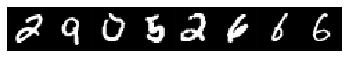

step 2739, loss 2.3024847507476807
Target:	 tensor([1, 9, 9, 2, 6, 0, 7, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


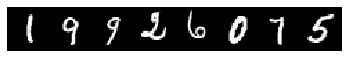

step 2772, loss 2.3024911880493164
Target:	 tensor([9, 9, 4, 7, 1, 7, 5, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


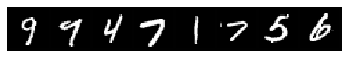

step 2805, loss 2.302483081817627
Target:	 tensor([4, 4, 5, 6, 3, 8, 9, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


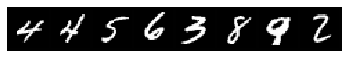

step 2838, loss 2.3024814128875732
Target:	 tensor([2, 5, 7, 3, 8, 7, 4, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


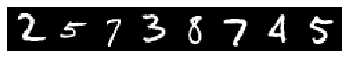

step 2871, loss 2.302492618560791
Target:	 tensor([7, 4, 8, 3, 5, 4, 7, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


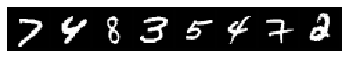

step 2904, loss 2.3024938106536865
Target:	 tensor([7, 6, 4, 2, 6, 4, 6, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


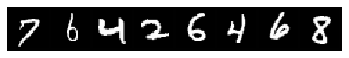

step 2937, loss 2.302478790283203
Target:	 tensor([4, 1, 7, 6, 9, 3, 5, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


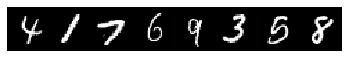

step 2970, loss 2.3024919033050537
Target:	 tensor([5, 9, 9, 9, 9, 9, 8, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


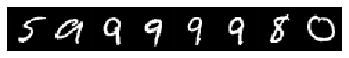

step 3003, loss 2.302485466003418
Target:	 tensor([2, 7, 3, 3, 8, 2, 5, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


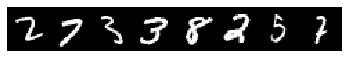

step 3036, loss 2.302471399307251
Target:	 tensor([2, 8, 1, 8, 2, 1, 1, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


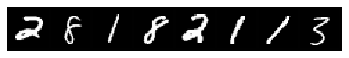

step 3069, loss 2.302497386932373
Target:	 tensor([4, 8, 8, 8, 7, 4, 8, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


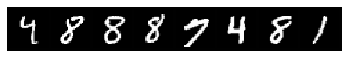

step 3102, loss 2.3024754524230957
Target:	 tensor([0, 3, 1, 3, 7, 3, 3, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


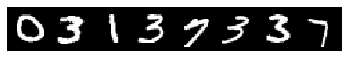

step 3135, loss 2.302500009536743
Target:	 tensor([8, 6, 2, 8, 4, 7, 8, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


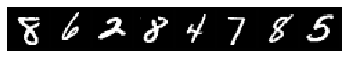

step 3168, loss 2.302485466003418
Target:	 tensor([5, 1, 6, 9, 4, 4, 1, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


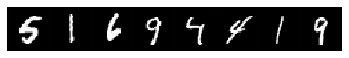

step 3201, loss 2.3024942874908447
Target:	 tensor([3, 7, 5, 5, 4, 5, 5, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


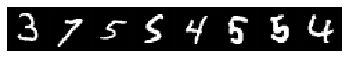

step 3234, loss 2.3024816513061523
Target:	 tensor([0, 2, 6, 3, 7, 5, 8, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


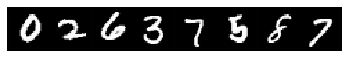

step 3267, loss 2.302457809448242
Target:	 tensor([3, 1, 5, 0, 4, 5, 7, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


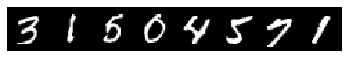

step 0, loss 19278.9765625
Target:	 tensor([9, 0, 9, 3, 8, 2, 1, 3], device='cuda:0')
Pred:	 tensor([5, 5, 5, 5, 5, 5, 5, 5], device='cuda:0')


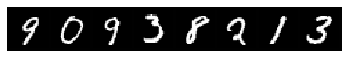

step 33, loss 1304.289794921875
Target:	 tensor([7, 8, 2, 6, 6, 1, 1, 7], device='cuda:0')
Pred:	 tensor([4, 4, 8, 0, 0, 4, 4, 4], device='cuda:0')


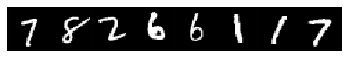

step 66, loss 90.30775451660156
Target:	 tensor([4, 3, 4, 4, 9, 2, 9, 3], device='cuda:0')
Pred:	 tensor([0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')


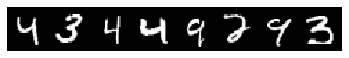

step 99, loss 8.251230239868164
Target:	 tensor([3, 5, 3, 0, 1, 5, 1, 6], device='cuda:0')
Pred:	 tensor([0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')


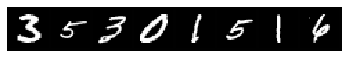

step 132, loss 2.7046146392822266
Target:	 tensor([8, 6, 3, 6, 9, 6, 2, 9], device='cuda:0')
Pred:	 tensor([0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')


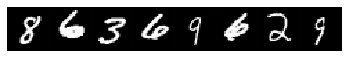

step 165, loss 2.3296523094177246
Target:	 tensor([0, 1, 7, 1, 4, 8, 5, 0], device='cuda:0')
Pred:	 tensor([4, 4, 4, 4, 4, 4, 4, 4], device='cuda:0')


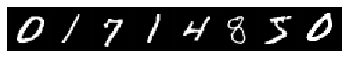

step 198, loss 2.3043291568756104
Target:	 tensor([9, 5, 5, 5, 7, 4, 9, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


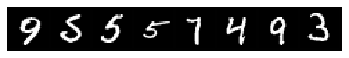

step 231, loss 2.302596092224121
Target:	 tensor([2, 5, 1, 6, 4, 2, 5, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


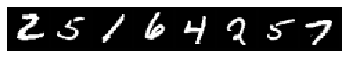

step 264, loss 2.302493095397949
Target:	 tensor([2, 3, 9, 5, 0, 3, 2, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


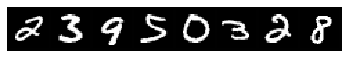

step 297, loss 2.3024866580963135
Target:	 tensor([5, 7, 9, 4, 3, 4, 5, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


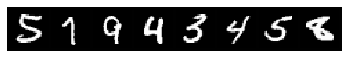

step 330, loss 2.3024845123291016
Target:	 tensor([1, 0, 8, 9, 7, 9, 2, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


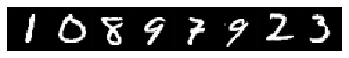

step 363, loss 2.3024871349334717
Target:	 tensor([6, 4, 6, 0, 5, 0, 8, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


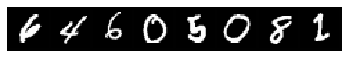

step 396, loss 2.302476167678833
Target:	 tensor([7, 5, 0, 2, 1, 3, 4, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


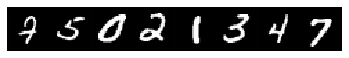

step 429, loss 2.302483558654785
Target:	 tensor([3, 0, 1, 4, 8, 3, 2, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


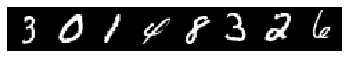

step 462, loss 2.302492141723633
Target:	 tensor([4, 7, 4, 6, 8, 5, 8, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


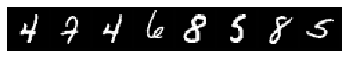

step 495, loss 2.3024790287017822
Target:	 tensor([2, 6, 4, 7, 0, 7, 8, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


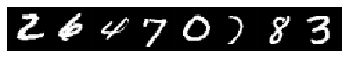

step 528, loss 2.3024914264678955
Target:	 tensor([6, 0, 3, 0, 9, 4, 4, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


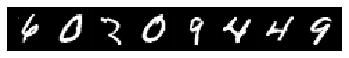

step 561, loss 2.3024682998657227
Target:	 tensor([2, 7, 4, 3, 3, 7, 4, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


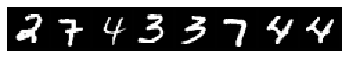

step 594, loss 2.3024888038635254
Target:	 tensor([3, 0, 1, 2, 8, 7, 8, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


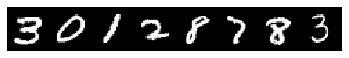

step 627, loss 2.3024845123291016
Target:	 tensor([6, 5, 0, 4, 3, 1, 1, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


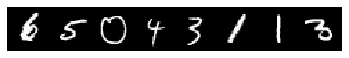

step 660, loss 2.302485466003418
Target:	 tensor([2, 8, 9, 3, 2, 1, 9, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


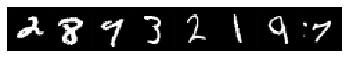

step 693, loss 2.3024821281433105
Target:	 tensor([5, 7, 2, 8, 3, 9, 9, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


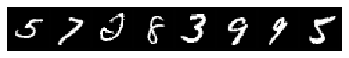

step 726, loss 2.302492618560791
Target:	 tensor([3, 8, 3, 5, 2, 2, 5, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


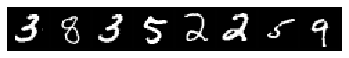

step 759, loss 2.3024864196777344
Target:	 tensor([8, 5, 2, 2, 4, 5, 0, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


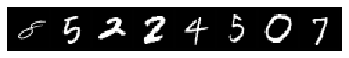

step 792, loss 2.3024909496307373
Target:	 tensor([1, 3, 2, 8, 5, 6, 0, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


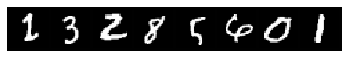

step 825, loss 2.3024837970733643
Target:	 tensor([1, 9, 2, 7, 7, 8, 6, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


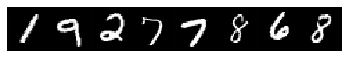

step 858, loss 2.3024840354919434
Target:	 tensor([2, 0, 2, 5, 4, 0, 1, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


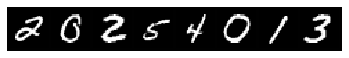

step 891, loss 2.3024845123291016
Target:	 tensor([0, 8, 8, 4, 1, 6, 5, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


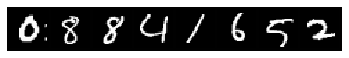

step 924, loss 2.302485704421997
Target:	 tensor([7, 9, 1, 2, 6, 0, 9, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


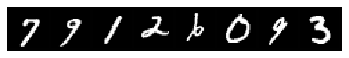

step 957, loss 2.302466869354248
Target:	 tensor([6, 2, 5, 7, 7, 9, 2, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


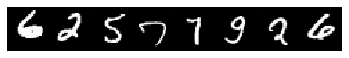

step 990, loss 2.302478313446045
Target:	 tensor([9, 9, 2, 0, 0, 5, 6, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


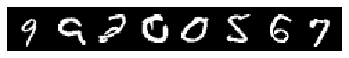

step 1023, loss 2.3024795055389404
Target:	 tensor([1, 4, 4, 0, 8, 6, 2, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


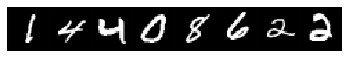

step 1056, loss 2.3024847507476807
Target:	 tensor([1, 5, 5, 5, 1, 7, 4, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


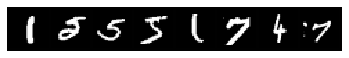

step 1089, loss 2.3024916648864746
Target:	 tensor([5, 6, 3, 4, 8, 7, 0, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


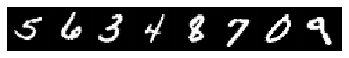

step 1122, loss 2.302483320236206
Target:	 tensor([4, 8, 1, 1, 7, 7, 3, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


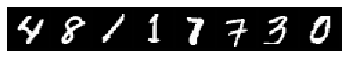

step 1155, loss 2.3024942874908447
Target:	 tensor([7, 3, 0, 9, 2, 3, 9, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


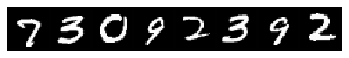

step 1188, loss 2.3024868965148926
Target:	 tensor([3, 7, 3, 7, 9, 5, 1, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


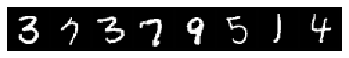

step 1221, loss 2.3024792671203613
Target:	 tensor([6, 8, 7, 4, 1, 3, 2, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


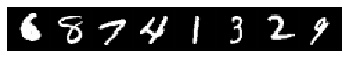

step 1254, loss 2.3024914264678955
Target:	 tensor([6, 8, 9, 5, 3, 6, 3, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


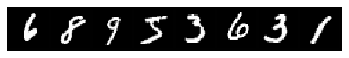

step 1287, loss 2.3024818897247314
Target:	 tensor([1, 0, 5, 9, 4, 7, 1, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


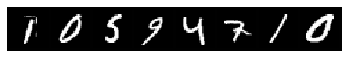

step 1320, loss 2.302487850189209
Target:	 tensor([7, 3, 9, 8, 9, 8, 0, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


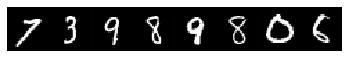

step 1353, loss 2.3024790287017822
Target:	 tensor([9, 5, 7, 7, 6, 6, 0, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


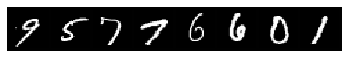

step 1386, loss 2.3024771213531494
Target:	 tensor([7, 7, 5, 5, 7, 4, 5, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


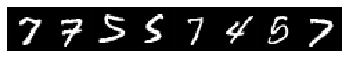

step 1419, loss 2.302478075027466
Target:	 tensor([5, 3, 7, 5, 4, 1, 1, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


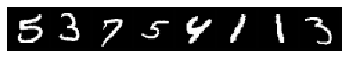

step 1452, loss 2.3024768829345703
Target:	 tensor([6, 5, 7, 3, 2, 3, 8, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


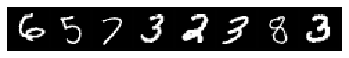

step 1485, loss 2.3024849891662598
Target:	 tensor([7, 1, 5, 6, 7, 5, 2, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


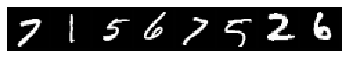

step 1518, loss 2.302483081817627
Target:	 tensor([5, 5, 7, 8, 7, 4, 6, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


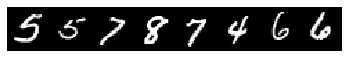

step 1551, loss 2.3024892807006836
Target:	 tensor([3, 0, 9, 2, 7, 3, 8, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


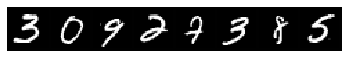

step 1584, loss 2.3024790287017822
Target:	 tensor([3, 5, 1, 0, 4, 3, 7, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


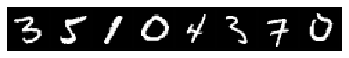

step 1617, loss 2.3024959564208984
Target:	 tensor([6, 2, 0, 8, 0, 5, 1, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


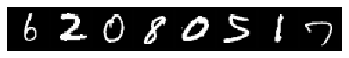

step 1650, loss 2.3024840354919434
Target:	 tensor([9, 7, 5, 0, 3, 3, 3, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


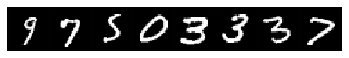

step 1683, loss 2.302490234375
Target:	 tensor([6, 0, 7, 6, 8, 8, 5, 2], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


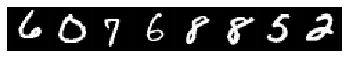

step 1716, loss 2.3024935722351074
Target:	 tensor([8, 6, 2, 1, 1, 1, 5, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


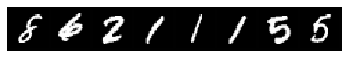

step 1749, loss 2.3024861812591553
Target:	 tensor([3, 4, 6, 2, 5, 9, 6, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


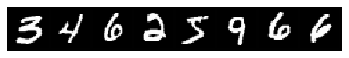

step 1782, loss 2.302478790283203
Target:	 tensor([7, 2, 8, 3, 2, 6, 6, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


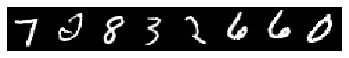

step 1815, loss 2.302480459213257
Target:	 tensor([9, 7, 3, 6, 3, 6, 1, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


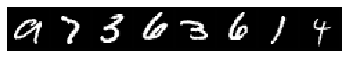

step 1848, loss 2.3024795055389404
Target:	 tensor([0, 7, 8, 4, 9, 7, 7, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


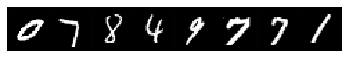

step 1881, loss 2.3024871349334717
Target:	 tensor([4, 1, 8, 7, 9, 9, 5, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


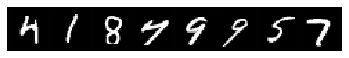

step 1914, loss 2.302494764328003
Target:	 tensor([7, 5, 8, 6, 4, 9, 6, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


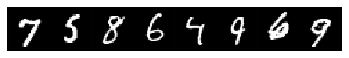

step 1947, loss 2.3024816513061523
Target:	 tensor([2, 3, 2, 2, 4, 7, 9, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


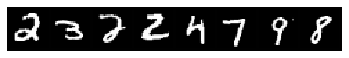

step 1980, loss 2.3024864196777344
Target:	 tensor([6, 6, 7, 8, 3, 9, 3, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


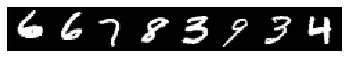

step 2013, loss 2.302482843399048
Target:	 tensor([3, 5, 8, 8, 5, 2, 3, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


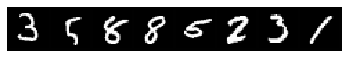

step 2046, loss 2.302494525909424
Target:	 tensor([1, 5, 5, 6, 9, 8, 4, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


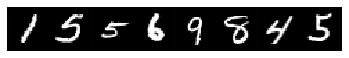

step 2079, loss 2.302485466003418
Target:	 tensor([0, 0, 2, 7, 4, 1, 0, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


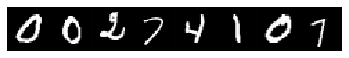

step 2112, loss 2.302478313446045
Target:	 tensor([3, 7, 1, 1, 6, 7, 0, 9], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


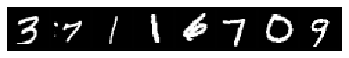

step 2145, loss 2.3024861812591553
Target:	 tensor([1, 2, 0, 9, 3, 6, 3, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


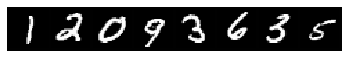

step 2178, loss 2.302485227584839
Target:	 tensor([5, 0, 3, 2, 4, 3, 2, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


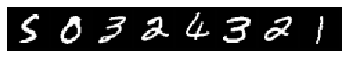

step 2211, loss 2.302485942840576
Target:	 tensor([3, 4, 8, 3, 8, 6, 0, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


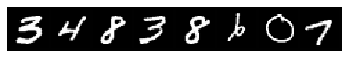

step 2244, loss 2.3024821281433105
Target:	 tensor([7, 9, 1, 9, 3, 7, 5, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


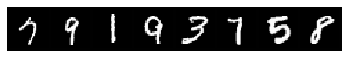

step 2277, loss 2.3024895191192627
Target:	 tensor([7, 5, 5, 5, 2, 9, 1, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


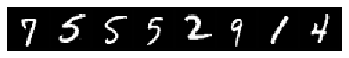

step 2310, loss 2.302483558654785
Target:	 tensor([1, 0, 3, 2, 6, 1, 3, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


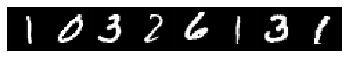

step 2343, loss 2.302488088607788
Target:	 tensor([4, 5, 3, 8, 3, 1, 1, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


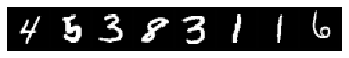

step 2376, loss 2.3024821281433105
Target:	 tensor([0, 0, 5, 1, 7, 6, 3, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


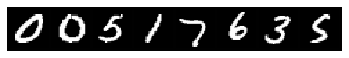

step 2409, loss 2.30249285697937
Target:	 tensor([2, 8, 2, 5, 1, 7, 6, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


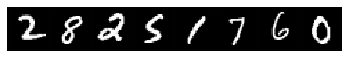

step 2442, loss 2.3024747371673584
Target:	 tensor([5, 3, 5, 7, 2, 0, 1, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


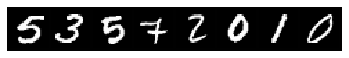

step 2475, loss 2.3024802207946777
Target:	 tensor([2, 1, 2, 6, 1, 1, 9, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


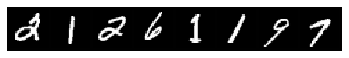

step 2508, loss 2.3024847507476807
Target:	 tensor([9, 8, 3, 3, 0, 1, 7, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


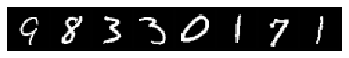

step 2541, loss 2.3025004863739014
Target:	 tensor([3, 0, 8, 5, 5, 3, 1, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


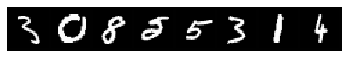

step 2574, loss 2.302480936050415
Target:	 tensor([0, 7, 2, 2, 0, 2, 1, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


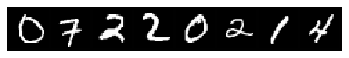

step 2607, loss 2.3024797439575195
Target:	 tensor([6, 1, 1, 1, 2, 0, 2, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


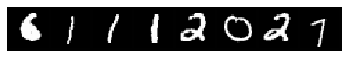

step 2640, loss 2.3024847507476807
Target:	 tensor([5, 2, 0, 3, 4, 9, 6, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


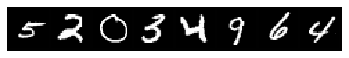

step 2673, loss 2.302489995956421
Target:	 tensor([6, 6, 4, 4, 4, 6, 0, 7], device='cuda:0')
Pred:	 tensor([1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


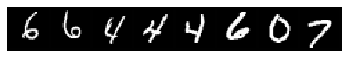

step 2706, loss 2.3024790287017822
Target:	 tensor([8, 6, 8, 7, 7, 3, 0, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


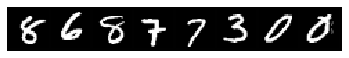

step 2739, loss 2.3024821281433105
Target:	 tensor([4, 1, 1, 6, 0, 0, 0, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


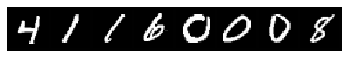

step 2772, loss 2.3024837970733643
Target:	 tensor([7, 2, 6, 3, 7, 6, 0, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


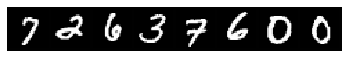

step 2805, loss 2.3024868965148926
Target:	 tensor([6, 5, 3, 3, 4, 9, 9, 8], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


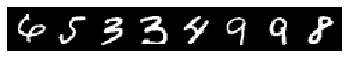

step 2838, loss 2.302496910095215
Target:	 tensor([2, 1, 9, 1, 3, 3, 0, 6], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


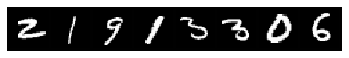

step 2871, loss 2.302473783493042
Target:	 tensor([4, 9, 6, 0, 7, 0, 8, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


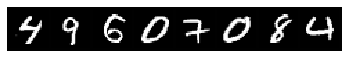

step 2904, loss 2.302488088607788
Target:	 tensor([8, 6, 2, 8, 1, 2, 4, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


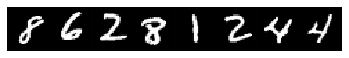

step 2937, loss 2.302490711212158
Target:	 tensor([1, 3, 0, 9, 5, 8, 0, 3], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


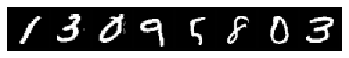

step 2970, loss 2.3024847507476807
Target:	 tensor([7, 3, 0, 0, 4, 2, 2, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


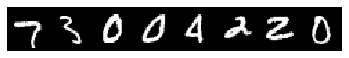

step 3003, loss 2.3024823665618896
Target:	 tensor([3, 0, 9, 9, 9, 8, 2, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


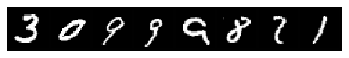

step 3036, loss 2.302485466003418
Target:	 tensor([7, 0, 1, 8, 4, 8, 8, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


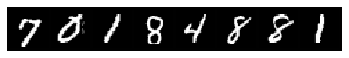

step 3069, loss 2.3024797439575195
Target:	 tensor([2, 5, 7, 3, 3, 1, 2, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


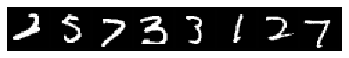

step 3102, loss 2.302485227584839
Target:	 tensor([5, 2, 9, 3, 1, 8, 3, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


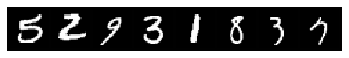

step 3135, loss 2.302478075027466
Target:	 tensor([4, 1, 1, 4, 5, 0, 7, 7], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


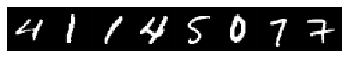

step 3168, loss 2.302488088607788
Target:	 tensor([5, 3, 1, 5, 5, 0, 5, 1], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


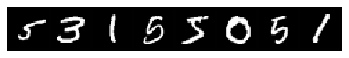

step 3201, loss 2.3024775981903076
Target:	 tensor([0, 4, 5, 1, 7, 0, 1, 0], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


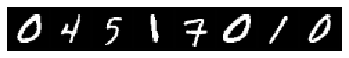

step 3234, loss 2.3024866580963135
Target:	 tensor([7, 6, 2, 1, 7, 7, 0, 5], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


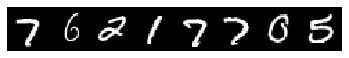

step 3267, loss 2.3024866580963135
Target:	 tensor([1, 4, 7, 6, 3, 9, 7, 4], device='cuda:0')
Pred:	 tensor([7, 7, 7, 7, 7, 7, 7, 7], device='cuda:0')


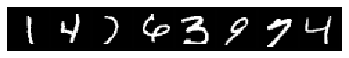

Best value of C is : 0.0005


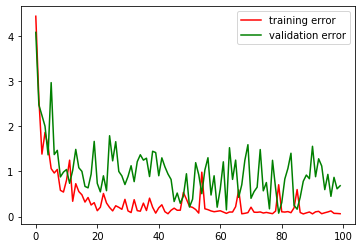

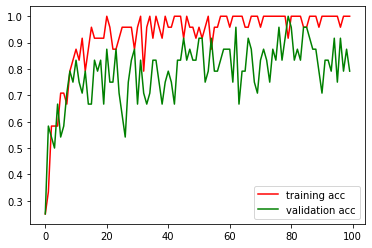

In [18]:
# learning rate, hyper-parameter
lr = 1e-4
max1 = 0
val_acc = []
train_acc = []
val_loss = []
train_loss = []

max_val_acc = []

c_vals = [0.0001,0.0005,0.001,0.01,0.1,1,10,50,100,200]
for C in c_vals:
  accuracies = []

  # using GPU if it's availble
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

  net = LeNet(img_channel, device)
  # keep a list of moel parameters
  params = [p for (n, p) in net.named_parameters()]

  for i,(n,p) in enumerate(net.named_parameters()):
    if n=='c1.bias' or n=='c3.bias':
        fan_in, _ = init._calculate_fan_in_and_fan_out(params[i-1].data)
        bound = 1 / math.sqrt(fan_in)
        init.uniform_(p.data, -bound, bound)
    if 'weights' in n:
        stdv = 1. / math.sqrt(p.size(1))
        p.data.uniform_(-stdv, stdv)
    if 'f' in n and 'bias' in n:
        stdv = 1. / math.sqrt(params[i-1].size(1))
        p.data.uniform_(-stdv, stdv)

  # training epochs, hyper-parameter
  epochs = 100

  # keep tracking of the changing of loss and accuracy of predictions
  train_loss_list = []
  val_loss_list = []
  train_acc_list = []
  val_acc_list = []

  # the printing frequency, feel free to change this
  print_interval = 50
  for e in range(epochs):
    net.train()
    for i, (imgs, lbs) in enumerate(train_dl):
      imgs = imgs.to(device)
      lbs = lbs.to(device)
      loss, prob = net(imgs, lbs)
      
      ### adding the squared norm of the weights to the loss function 
      norm=0
      for j in net.named_parameters():
        if 'kernel' or 'weights' in j[0]:
          norm += torch.pow(torch.norm(j[1]),2)
      loss+=C*norm


      net.zero_grad()
      grad = torch.autograd.grad(loss, params)
      
      # update weights
      step(params, grad, lr)
      
      # obtain the predictions
      pred = prob.argmax(dim=-1).view(batch_size)
      acc = (pred == lbs).float().mean()
      
      if i % print_interval == 0:
        print("step {}, loss {}".format(i + e*len(train_dl), loss))
        print("Target:\t {}\nPred:\t {}".format(lbs[:8], pred[:8]))
        # visualize some samples
        imgs_to_vis = vutils.make_grid(imgs[:8].cpu()+125., nrow=8, pad_value=1)
        plt.imshow(imgs_to_vis.permute(1,2,0).numpy().astype(np.uint8))
        plt.axis("off")
        plt.show()
        
    train_loss_list.append(loss.detach().mean())
    train_acc_list.append(acc.detach().mean())
    
    net.eval()
    for i, (imgs, lbs) in enumerate(val_dl):
      imgs = imgs.to(device)
      lbs = lbs.to(device)
      loss, prob = net(imgs, lbs)
      
      pred = prob.argmax(dim=-1).view(batch_size)
      acc = (pred == lbs).float().mean()
      
    val_loss_list.append(loss.detach().mean())
    val_acc_list.append(acc.detach().mean())

  val_loss.append(val_loss_list)
  val_acc.append(val_acc_list)
  train_loss.append(train_loss_list)
  train_acc.append(train_acc_list)
    
  max_acc = max(val_acc_list)
  max_val_acc.append(max_acc)
  if max_acc > max1:
    max1 = max_acc
    C_final = C

print("Best value of C is :",C_final)

ind = c_vals.index(C_final)
train_loss_list = train_loss[ind]
val_loss_list = val_loss[ind]
train_acc_list = train_acc[ind]
val_acc_list = val_acc[ind]

# ploting logs
plt.plot(np.arange(epochs), train_loss_list, '-r',
         np.arange(epochs), val_loss_list, '-g')
plt.legend(('training error', 'validation error'))
plt.show()
plt.plot(np.arange(epochs), train_acc_list, '-r',
         np.arange(epochs), val_acc_list, '-g')
plt.legend(('training acc', 'validation acc'))
plt.show()

## Task 6: Dropout

[Dropout](https://www.cs.toronto.edu/~hinton/absps/JMLRdropout.pdf) can also help with generalization. It randomly drops units from the neural network during training. Thus, training a neural network with dropout can be seen as training a collection of many sub-networks.

**To-dos**:
    - (5 points)Complete the **dropout_forward()** function for class Dropout.
    - (5 points)Modify the class LeNet with dropout layer and build a new class named LeNetDrop: add a dropout layer after layer c1, layer c3, and layer c5.
    - Write the dataset loading script, training script.
    - Train LeNetDrop on the 1k dataset.
    - (10 points)Plot out the training loss curve, validation loss curve, training accuracy curve and validation accuracy curve.

In [14]:
# dataset loading, training script and other codes starts here:
dataset_size = 1000
validation_size = int(0.2 * 1000)

ds = MNISTDataset(ds_size=dataset_size)

# split the dataset into training set and validation set
train_ds, val_ds = torch.utils.data.random_split(ds, [dataset_size - validation_size, validation_size])

# training batch size, hyper-parameter
batch_size = 24

# dataset loader
train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True, drop_last=True)
val_dl = DataLoader(val_ds, batch_size=batch_size, shuffle=True, drop_last=True)
img_channel = 1

In [15]:
class Dropout(nn.Module):
  def __init__(self, p, device):
    super(Dropout, self).__init__()
    """
    inputs:
     p: scalar, the probability of an element to be zeroed.
    """
    self.p = p
    self.device = device
    
    
  
  def dropout_forward(self, X, training=True):
    """
    inputs:
      X: (N, *), input of dropout layer
      training: boolean, apply dropout if true. Note: We do not apply dropout during testing.
    outputs:
      Y: (N, *)
    """
    ### Start the code here  ###
    # if in training then returns Y (i.e. X after inverted dropout) else returns X
    if training==True:
        binomial = torch.distributions.binomial.Binomial(probs=1-self.p)
        Y = X * (binomial.sample(X.size()).to(self.device)) * (1.0/(1-self.p))
        return Y
    else:
        return X
    ###  End of the code ###
    
  
  def forward(self, X):
    return self.dropout_forward(X)

In [16]:
# LeNet sketch code
class LeNetDrop(nn.Module):
  def __init__(self, img_c, device):
    super(LeNetDrop, self).__init__()
    self.c1 = Conv2D(img_c, 6, [5,5], [1,1], [2,2,2,2], device)
    
    #adding the first dropout layer after c1 with p=0.2 and device='cuda'
    self.d1 = Dropout(0.2,'cuda')
    
    #self.c1 = torch.nn.Conv2d(in_channels=img_c, out_channels=6, kernel_size=[5,5], stride=[1,1], padding=2)
    self.p2 = nn.MaxPool2d(2, stride=2)
    self.c3 = Conv2D(6, 16, [5,5], [1,1], [0,0,0,0], device)
    
    #adding the first dropout layer after c1 with p=0.2 and device='cuda'
    self.d2 = Dropout(0.2,'cuda')
    
    #self.c3 = torch.nn.Conv2d(in_channels=6, out_channels=16, kernel_size=[5,5], stride=[1,1], padding=0)
    self.p4 = nn.MaxPool2d(2, stride=2)
    self.f5 = Linear(400, 120, device)
    
    #adding the first dropout layer after c1 with p=0.2 and device='cuda'
    self.d3 = Dropout(0.2,'cuda')
    
    self.f6 = Linear(120, 84, device)
    self.f7 = Linear(84, 10, device)
    self.device = device
    
  #adding the parameter training because of the dropout layer
  def forward(self, imgs, labels,training):
    """
    inputs:
      imgs: (N, C, H, W), training samples from the MNIST training set, where N is the number of samples (batch_size),
          C is the image color channle number, H and W are the spatial size of the input images.
      labels: (N, L), ground truth for the input images, where N is the number of samples (batch_size) and L is the 
          number of classes.
    outputs:
      loss: (1,), mean loss value over this batch of inputs.
    
    """
    N = imgs.shape[0]
    
    o_c1 = F.relu(self.c1(imgs))
    o_d1 = self.d1.dropout_forward(o_c1,training)
    #o_c1 = F.relu(self.c1(imgs.cpu()))
    o_p2 = self.p2(o_d1)
    o_c3 = F.relu(self.c3(o_p2))
    o_d2 = self.d2.dropout_forward(o_c3,training)
    #o_c3 = F.relu(self.c3(o_p2.cpu()))
    o_p4 = self.p4(o_d2)
    o_p4 = torch.reshape(o_p4,(o_p4.shape[0],-1)).to(self.device)
    #o_p4 = torch.tensor(o_p4,device='cuda')

    
    
    ### Start the code here  ###
    # 1. Please complete the rest of LeNet to get the scores predicted by LeNet for each input images #
    
    o_f5 = self.f5(o_p4)
    o_d3 = self.d3.dropout_forward(o_f5,training)
    o_f6  = self.f6(o_d3)
    o_f7 = self.f7(o_f6)

    
    # 2. Please use the implemented objective function to obtain the losses of each input. #
    
    
    p = softmax1d(o_f7)
    loss = cross_entropy_loss(p,labels)

    # print(loss)

  
    # 3. We will return the mean value of the losses. #
    
  
    ###  End of the code ###
    return loss.mean(), p

------------------
0
------------------
step 32, loss 9.082818984985352
Target:	 tensor([7, 9, 7, 1, 4, 9, 7, 2], device='cuda:0')
Pred:	 tensor([0, 0, 7, 0, 7, 4, 7, 0], device='cuda:0')


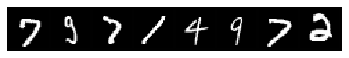

------------------
1
------------------
step 65, loss 8.80836009979248
Target:	 tensor([8, 7, 8, 5, 0, 9, 1, 7], device='cuda:0')
Pred:	 tensor([2, 7, 7, 2, 0, 7, 7, 2], device='cuda:0')


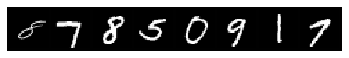

------------------
2
------------------
step 98, loss 7.411157131195068
Target:	 tensor([4, 3, 1, 8, 2, 9, 3, 7], device='cuda:0')
Pred:	 tensor([4, 3, 3, 3, 3, 3, 3, 7], device='cuda:0')


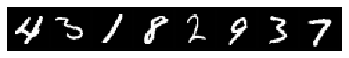

------------------
3
------------------
step 131, loss 10.207202911376953
Target:	 tensor([5, 6, 4, 1, 9, 2, 4, 8], device='cuda:0')
Pred:	 tensor([0, 3, 0, 9, 7, 0, 0, 0], device='cuda:0')


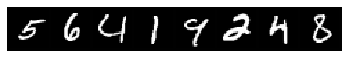

------------------
4
------------------
step 164, loss 6.225471496582031
Target:	 tensor([1, 7, 4, 7, 7, 3, 0, 4], device='cuda:0')
Pred:	 tensor([7, 4, 3, 7, 7, 3, 7, 6], device='cuda:0')


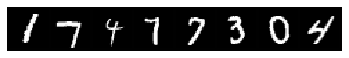

------------------
5
------------------
step 197, loss 3.676725387573242
Target:	 tensor([7, 2, 3, 2, 1, 0, 0, 7], device='cuda:0')
Pred:	 tensor([7, 2, 3, 2, 9, 0, 0, 4], device='cuda:0')


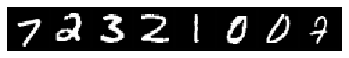

------------------
6
------------------
step 230, loss 6.658716201782227
Target:	 tensor([0, 9, 1, 3, 0, 6, 7, 6], device='cuda:0')
Pred:	 tensor([0, 4, 7, 4, 9, 6, 9, 9], device='cuda:0')


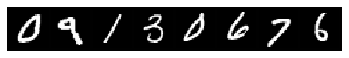

------------------
7
------------------
step 263, loss 5.501856803894043
Target:	 tensor([7, 0, 1, 5, 5, 7, 1, 0], device='cuda:0')
Pred:	 tensor([7, 0, 5, 9, 3, 7, 6, 0], device='cuda:0')


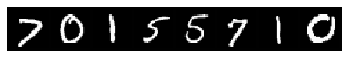

------------------
8
------------------
step 296, loss 4.84573221206665
Target:	 tensor([7, 3, 4, 1, 4, 3, 2, 9], device='cuda:0')
Pred:	 tensor([7, 3, 4, 9, 4, 5, 3, 9], device='cuda:0')


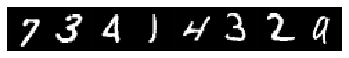

------------------
9
------------------
step 329, loss 5.052775859832764
Target:	 tensor([1, 7, 8, 6, 3, 5, 1, 1], device='cuda:0')
Pred:	 tensor([1, 7, 2, 0, 3, 3, 2, 1], device='cuda:0')


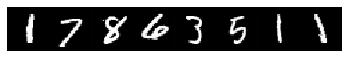

------------------
10
------------------
step 362, loss 3.104120969772339
Target:	 tensor([4, 5, 7, 2, 3, 6, 0, 2], device='cuda:0')
Pred:	 tensor([4, 9, 5, 2, 3, 6, 0, 2], device='cuda:0')


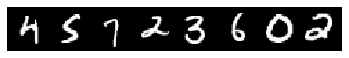

------------------
11
------------------
step 395, loss 4.130170822143555
Target:	 tensor([7, 9, 8, 3, 8, 8, 5, 6], device='cuda:0')
Pred:	 tensor([7, 9, 9, 2, 7, 7, 0, 6], device='cuda:0')


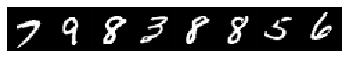

------------------
12
------------------
step 428, loss 3.1164865493774414
Target:	 tensor([9, 3, 6, 2, 0, 7, 9, 8], device='cuda:0')
Pred:	 tensor([9, 3, 6, 2, 0, 7, 5, 9], device='cuda:0')


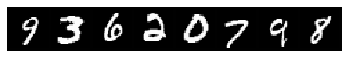

------------------
13
------------------
step 461, loss 4.725376129150391
Target:	 tensor([0, 6, 5, 9, 5, 5, 5, 7], device='cuda:0')
Pred:	 tensor([0, 8, 5, 7, 5, 3, 0, 7], device='cuda:0')


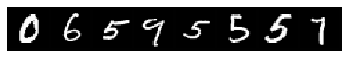

------------------
14
------------------
step 494, loss 2.09775710105896
Target:	 tensor([2, 4, 3, 9, 7, 6, 3, 1], device='cuda:0')
Pred:	 tensor([2, 4, 5, 0, 7, 6, 3, 3], device='cuda:0')


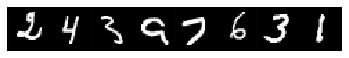

------------------
15
------------------
step 527, loss 3.551939010620117
Target:	 tensor([6, 6, 0, 1, 4, 1, 9, 5], device='cuda:0')
Pred:	 tensor([0, 9, 0, 1, 6, 1, 7, 3], device='cuda:0')


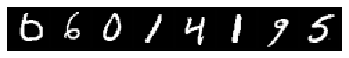

------------------
16
------------------
step 560, loss 1.7443898916244507
Target:	 tensor([0, 1, 7, 6, 5, 5, 2, 0], device='cuda:0')
Pred:	 tensor([0, 1, 9, 6, 1, 6, 2, 0], device='cuda:0')


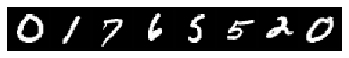

------------------
17
------------------
step 593, loss 1.6607770919799805
Target:	 tensor([4, 3, 3, 1, 7, 0, 8, 5], device='cuda:0')
Pred:	 tensor([9, 3, 3, 1, 7, 0, 1, 0], device='cuda:0')


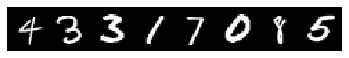

------------------
18
------------------
step 626, loss 0.8189010620117188
Target:	 tensor([2, 4, 2, 3, 7, 6, 2, 4], device='cuda:0')
Pred:	 tensor([2, 4, 0, 3, 7, 6, 2, 4], device='cuda:0')


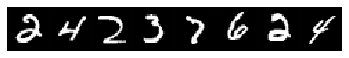

------------------
19
------------------
step 659, loss 1.7342967987060547
Target:	 tensor([1, 2, 3, 9, 9, 3, 7, 7], device='cuda:0')
Pred:	 tensor([1, 2, 3, 9, 7, 3, 4, 7], device='cuda:0')


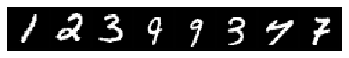

------------------
20
------------------
step 692, loss 0.8745425939559937
Target:	 tensor([8, 3, 3, 0, 7, 9, 7, 4], device='cuda:0')
Pred:	 tensor([6, 3, 3, 0, 7, 9, 7, 4], device='cuda:0')


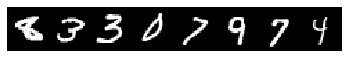

------------------
21
------------------
step 725, loss 0.6185473203659058
Target:	 tensor([2, 7, 1, 1, 6, 9, 0, 5], device='cuda:0')
Pred:	 tensor([2, 7, 1, 1, 6, 9, 0, 3], device='cuda:0')


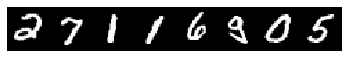

------------------
22
------------------
step 758, loss 0.21658194065093994
Target:	 tensor([7, 3, 8, 0, 8, 1, 4, 1], device='cuda:0')
Pred:	 tensor([7, 3, 8, 0, 8, 1, 4, 1], device='cuda:0')


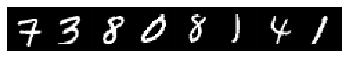

------------------
23
------------------
step 791, loss 0.8868499994277954
Target:	 tensor([2, 4, 5, 0, 4, 4, 9, 5], device='cuda:0')
Pred:	 tensor([5, 4, 2, 0, 4, 4, 3, 5], device='cuda:0')


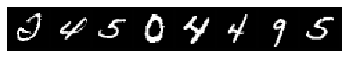

------------------
24
------------------
step 824, loss 0.3526223301887512
Target:	 tensor([4, 2, 3, 8, 1, 1, 8, 6], device='cuda:0')
Pred:	 tensor([4, 2, 3, 8, 1, 3, 8, 6], device='cuda:0')


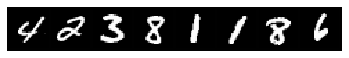

------------------
25
------------------
step 857, loss 0.5623925924301147
Target:	 tensor([5, 9, 1, 0, 4, 4, 4, 1], device='cuda:0')
Pred:	 tensor([8, 9, 1, 0, 4, 9, 4, 5], device='cuda:0')


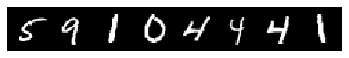

------------------
26
------------------
step 890, loss 0.8693913221359253
Target:	 tensor([7, 0, 1, 5, 2, 0, 4, 4], device='cuda:0')
Pred:	 tensor([7, 0, 1, 5, 2, 0, 4, 5], device='cuda:0')


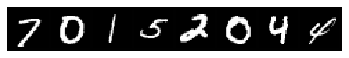

------------------
27
------------------
step 923, loss 2.2958102226257324
Target:	 tensor([1, 4, 4, 9, 9, 7, 2, 3], device='cuda:0')
Pred:	 tensor([1, 4, 9, 9, 9, 7, 2, 3], device='cuda:0')


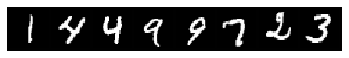

------------------
28
------------------
step 956, loss 1.0855001211166382
Target:	 tensor([6, 9, 4, 4, 2, 8, 6, 7], device='cuda:0')
Pred:	 tensor([4, 9, 4, 4, 2, 9, 6, 7], device='cuda:0')


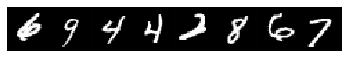

------------------
29
------------------
step 989, loss 0.5003795623779297
Target:	 tensor([8, 9, 9, 7, 1, 4, 4, 0], device='cuda:0')
Pred:	 tensor([8, 9, 9, 7, 1, 4, 4, 0], device='cuda:0')


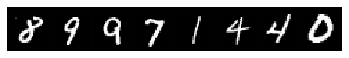

------------------
30
------------------
step 1022, loss 0.963261067867279
Target:	 tensor([3, 8, 6, 5, 1, 5, 9, 6], device='cuda:0')
Pred:	 tensor([3, 8, 6, 5, 1, 3, 9, 6], device='cuda:0')


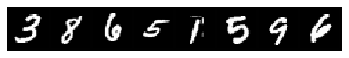

------------------
31
------------------
step 1055, loss 0.8478517532348633
Target:	 tensor([5, 0, 3, 2, 5, 6, 9, 0], device='cuda:0')
Pred:	 tensor([5, 0, 3, 7, 7, 6, 4, 0], device='cuda:0')


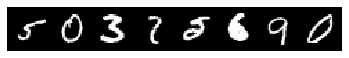

------------------
32
------------------
step 1088, loss 0.6439718008041382
Target:	 tensor([0, 8, 9, 6, 2, 9, 7, 5], device='cuda:0')
Pred:	 tensor([0, 8, 9, 6, 0, 5, 7, 5], device='cuda:0')


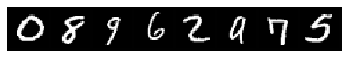

------------------
33
------------------
step 1121, loss 0.7089557647705078
Target:	 tensor([3, 0, 5, 8, 5, 7, 8, 8], device='cuda:0')
Pred:	 tensor([2, 0, 5, 2, 5, 7, 8, 8], device='cuda:0')


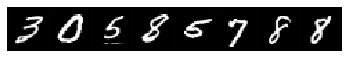

------------------
34
------------------
step 1154, loss 0.7978419661521912
Target:	 tensor([0, 5, 1, 7, 6, 4, 1, 2], device='cuda:0')
Pred:	 tensor([0, 5, 1, 7, 6, 6, 1, 2], device='cuda:0')


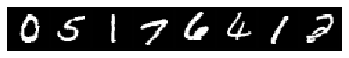

------------------
35
------------------
step 1187, loss 0.24486780166625977
Target:	 tensor([6, 5, 8, 0, 7, 8, 7, 8], device='cuda:0')
Pred:	 tensor([6, 5, 8, 0, 7, 8, 4, 8], device='cuda:0')


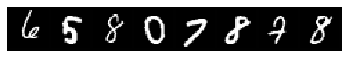

------------------
36
------------------
step 1220, loss 1.2978005409240723
Target:	 tensor([0, 4, 2, 0, 6, 8, 5, 6], device='cuda:0')
Pred:	 tensor([2, 4, 7, 0, 6, 8, 5, 4], device='cuda:0')


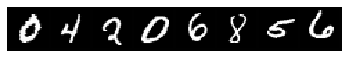

------------------
37
------------------
step 1253, loss 0.8906232714653015
Target:	 tensor([8, 7, 9, 7, 9, 8, 3, 2], device='cuda:0')
Pred:	 tensor([2, 7, 7, 7, 4, 8, 3, 6], device='cuda:0')


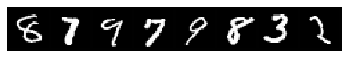

------------------
38
------------------
step 1286, loss 1.1079041957855225
Target:	 tensor([4, 4, 2, 7, 6, 6, 4, 5], device='cuda:0')
Pred:	 tensor([4, 9, 2, 4, 4, 6, 4, 5], device='cuda:0')


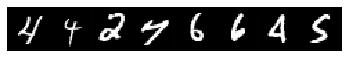

------------------
39
------------------
step 1319, loss 0.6563743948936462
Target:	 tensor([4, 8, 8, 2, 6, 7, 5, 6], device='cuda:0')
Pred:	 tensor([4, 8, 8, 2, 6, 7, 5, 8], device='cuda:0')


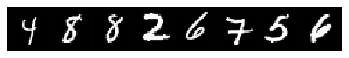

------------------
40
------------------
step 1352, loss 0.7517040967941284
Target:	 tensor([5, 0, 3, 6, 6, 2, 1, 6], device='cuda:0')
Pred:	 tensor([9, 0, 3, 5, 6, 2, 1, 2], device='cuda:0')


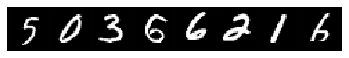

------------------
41
------------------
step 1385, loss 0.12446095049381256
Target:	 tensor([9, 9, 7, 6, 3, 4, 4, 7], device='cuda:0')
Pred:	 tensor([9, 9, 7, 6, 3, 4, 4, 7], device='cuda:0')


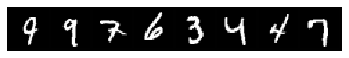

------------------
42
------------------
step 1418, loss 0.04249129816889763
Target:	 tensor([0, 1, 9, 7, 4, 0, 1, 4], device='cuda:0')
Pred:	 tensor([0, 1, 9, 7, 4, 0, 1, 4], device='cuda:0')


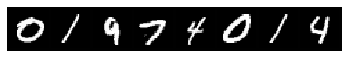

------------------
43
------------------
step 1451, loss 0.2894436717033386
Target:	 tensor([5, 4, 6, 7, 4, 5, 2, 3], device='cuda:0')
Pred:	 tensor([5, 4, 6, 7, 4, 3, 2, 3], device='cuda:0')


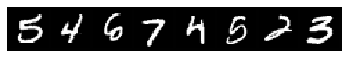

------------------
44
------------------
step 1484, loss 1.2469239234924316
Target:	 tensor([7, 5, 3, 7, 0, 2, 3, 2], device='cuda:0')
Pred:	 tensor([4, 5, 6, 7, 0, 2, 7, 2], device='cuda:0')


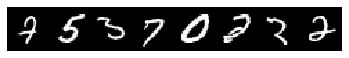

------------------
45
------------------
step 1517, loss 0.44433993101119995
Target:	 tensor([2, 2, 0, 3, 8, 9, 1, 1], device='cuda:0')
Pred:	 tensor([2, 2, 0, 3, 8, 9, 1, 1], device='cuda:0')


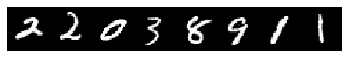

------------------
46
------------------
step 1550, loss 0.5175886154174805
Target:	 tensor([6, 9, 6, 7, 7, 8, 5, 8], device='cuda:0')
Pred:	 tensor([6, 9, 6, 7, 7, 8, 5, 8], device='cuda:0')


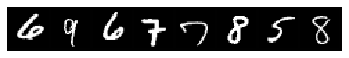

------------------
47
------------------
step 1583, loss 0.5570726990699768
Target:	 tensor([9, 7, 0, 1, 8, 6, 8, 7], device='cuda:0')
Pred:	 tensor([9, 7, 0, 1, 8, 6, 8, 7], device='cuda:0')


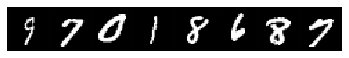

------------------
48
------------------
step 1616, loss 0.5554641485214233
Target:	 tensor([7, 7, 4, 0, 9, 0, 8, 3], device='cuda:0')
Pred:	 tensor([7, 7, 4, 0, 9, 0, 4, 3], device='cuda:0')


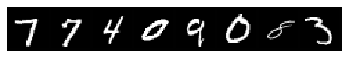

------------------
49
------------------
step 1649, loss 0.5146410465240479
Target:	 tensor([7, 0, 5, 3, 6, 3, 6, 7], device='cuda:0')
Pred:	 tensor([7, 0, 5, 3, 6, 3, 6, 7], device='cuda:0')


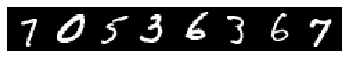

------------------
50
------------------
step 1682, loss 0.24375027418136597
Target:	 tensor([4, 8, 7, 8, 2, 7, 5, 6], device='cuda:0')
Pred:	 tensor([4, 8, 7, 8, 7, 7, 5, 6], device='cuda:0')


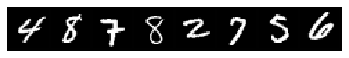

------------------
51
------------------
step 1715, loss 0.4110794961452484
Target:	 tensor([9, 5, 3, 3, 7, 5, 1, 3], device='cuda:0')
Pred:	 tensor([9, 5, 3, 3, 7, 5, 1, 3], device='cuda:0')


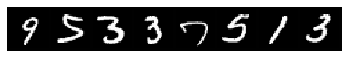

------------------
52
------------------
step 1748, loss 0.5174548625946045
Target:	 tensor([4, 2, 6, 7, 1, 8, 2, 2], device='cuda:0')
Pred:	 tensor([4, 7, 6, 7, 1, 8, 2, 2], device='cuda:0')


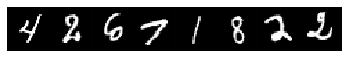

------------------
53
------------------
step 1781, loss 0.18630385398864746
Target:	 tensor([2, 7, 5, 3, 8, 0, 2, 1], device='cuda:0')
Pred:	 tensor([2, 7, 5, 3, 8, 0, 1, 1], device='cuda:0')


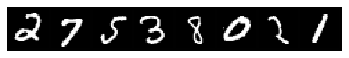

------------------
54
------------------
step 1814, loss 0.24298417568206787
Target:	 tensor([4, 6, 2, 3, 8, 0, 3, 7], device='cuda:0')
Pred:	 tensor([4, 6, 2, 3, 8, 0, 3, 7], device='cuda:0')


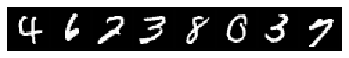

------------------
55
------------------
step 1847, loss 0.7597410082817078
Target:	 tensor([1, 1, 3, 3, 1, 2, 4, 9], device='cuda:0')
Pred:	 tensor([1, 1, 0, 3, 1, 2, 4, 9], device='cuda:0')


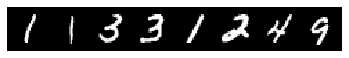

------------------
56
------------------
step 1880, loss 0.40683040022850037
Target:	 tensor([3, 1, 3, 2, 8, 9, 0, 6], device='cuda:0')
Pred:	 tensor([3, 1, 3, 2, 8, 9, 2, 6], device='cuda:0')


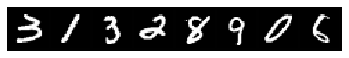

------------------
57
------------------
step 1913, loss 0.23233643174171448
Target:	 tensor([6, 0, 7, 1, 6, 9, 6, 5], device='cuda:0')
Pred:	 tensor([6, 0, 7, 1, 6, 9, 6, 5], device='cuda:0')


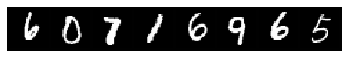

------------------
58
------------------
step 1946, loss 0.5633649826049805
Target:	 tensor([4, 3, 8, 0, 4, 7, 2, 1], device='cuda:0')
Pred:	 tensor([4, 3, 8, 0, 4, 7, 2, 1], device='cuda:0')


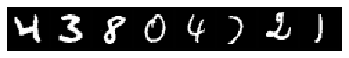

------------------
59
------------------
step 1979, loss 0.5885292887687683
Target:	 tensor([2, 3, 5, 0, 3, 0, 3, 1], device='cuda:0')
Pred:	 tensor([2, 2, 0, 0, 3, 0, 3, 1], device='cuda:0')


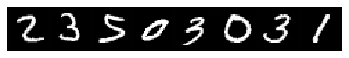

------------------
60
------------------
step 2012, loss 1.007646083831787
Target:	 tensor([7, 5, 7, 9, 1, 9, 8, 1], device='cuda:0')
Pred:	 tensor([7, 5, 7, 7, 1, 9, 8, 1], device='cuda:0')


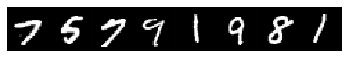

------------------
61
------------------
step 2045, loss 0.2558843493461609
Target:	 tensor([7, 9, 2, 2, 6, 1, 9, 3], device='cuda:0')
Pred:	 tensor([7, 9, 2, 2, 6, 1, 9, 5], device='cuda:0')


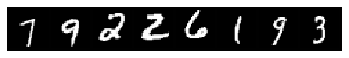

------------------
62
------------------
step 2078, loss 0.25789153575897217
Target:	 tensor([3, 0, 8, 2, 7, 2, 2, 0], device='cuda:0')
Pred:	 tensor([3, 0, 8, 2, 9, 2, 2, 0], device='cuda:0')


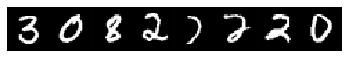

------------------
63
------------------
step 2111, loss 0.31944575905799866
Target:	 tensor([7, 0, 8, 8, 4, 6, 0, 2], device='cuda:0')
Pred:	 tensor([7, 0, 5, 8, 4, 6, 0, 2], device='cuda:0')


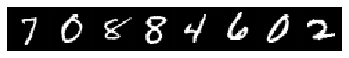

------------------
64
------------------
step 2144, loss 0.4066023826599121
Target:	 tensor([9, 3, 5, 3, 0, 8, 7, 3], device='cuda:0')
Pred:	 tensor([9, 3, 5, 5, 0, 8, 7, 3], device='cuda:0')


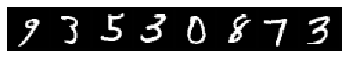

------------------
65
------------------
step 2177, loss 0.3288484811782837
Target:	 tensor([0, 5, 5, 8, 7, 1, 3, 8], device='cuda:0')
Pred:	 tensor([0, 5, 5, 8, 7, 1, 3, 8], device='cuda:0')


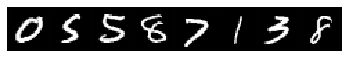

------------------
66
------------------
step 2210, loss 0.35180413722991943
Target:	 tensor([3, 2, 0, 9, 7, 3, 5, 9], device='cuda:0')
Pred:	 tensor([3, 8, 0, 9, 7, 3, 5, 9], device='cuda:0')


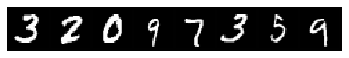

------------------
67
------------------
step 2243, loss 0.12001518905162811
Target:	 tensor([0, 4, 9, 0, 2, 1, 2, 1], device='cuda:0')
Pred:	 tensor([0, 4, 9, 0, 2, 1, 2, 1], device='cuda:0')


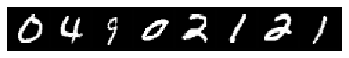

------------------
68
------------------
step 2276, loss 1.0713911056518555
Target:	 tensor([9, 5, 5, 0, 3, 5, 5, 4], device='cuda:0')
Pred:	 tensor([9, 5, 3, 2, 3, 6, 5, 4], device='cuda:0')


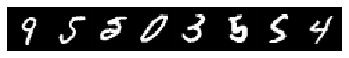

------------------
69
------------------
step 2309, loss 0.6448947191238403
Target:	 tensor([3, 4, 8, 6, 1, 0, 4, 8], device='cuda:0')
Pred:	 tensor([3, 4, 5, 6, 2, 0, 4, 8], device='cuda:0')


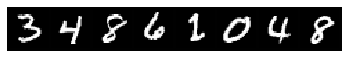

------------------
70
------------------
step 2342, loss 0.05491548031568527
Target:	 tensor([7, 3, 6, 8, 9, 0, 0, 8], device='cuda:0')
Pred:	 tensor([7, 3, 6, 8, 9, 0, 0, 8], device='cuda:0')


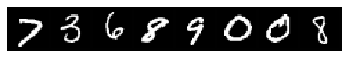

------------------
71
------------------
step 2375, loss 0.3374137282371521
Target:	 tensor([4, 3, 4, 6, 7, 4, 7, 4], device='cuda:0')
Pred:	 tensor([4, 3, 4, 6, 7, 4, 7, 4], device='cuda:0')


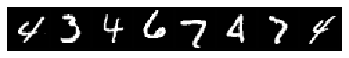

------------------
72
------------------
step 2408, loss 0.4970848262310028
Target:	 tensor([4, 2, 3, 1, 9, 4, 5, 2], device='cuda:0')
Pred:	 tensor([4, 2, 3, 1, 8, 4, 5, 2], device='cuda:0')


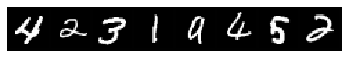

------------------
73
------------------
step 2441, loss 0.07731276005506516
Target:	 tensor([8, 5, 9, 6, 5, 0, 3, 6], device='cuda:0')
Pred:	 tensor([8, 5, 9, 6, 5, 0, 3, 6], device='cuda:0')


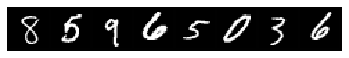

------------------
74
------------------
step 2474, loss 0.28464651107788086
Target:	 tensor([9, 1, 7, 8, 9, 9, 2, 7], device='cuda:0')
Pred:	 tensor([9, 1, 7, 8, 9, 9, 2, 7], device='cuda:0')


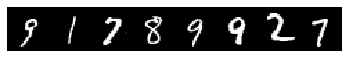

------------------
75
------------------
step 2507, loss 0.30945292115211487
Target:	 tensor([8, 6, 9, 6, 0, 3, 2, 1], device='cuda:0')
Pred:	 tensor([8, 6, 9, 4, 0, 3, 2, 1], device='cuda:0')


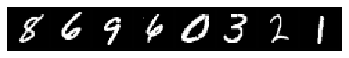

------------------
76
------------------
step 2540, loss 0.2598041892051697
Target:	 tensor([1, 7, 6, 0, 3, 8, 3, 5], device='cuda:0')
Pred:	 tensor([1, 9, 6, 0, 3, 8, 3, 5], device='cuda:0')


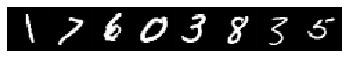

------------------
77
------------------
step 2573, loss 0.3030344843864441
Target:	 tensor([7, 5, 8, 7, 2, 7, 1, 5], device='cuda:0')
Pred:	 tensor([7, 5, 8, 7, 2, 7, 1, 3], device='cuda:0')


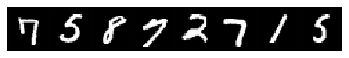

------------------
78
------------------
step 2606, loss 1.7668838500976562
Target:	 tensor([0, 7, 6, 4, 1, 9, 9, 8], device='cuda:0')
Pred:	 tensor([0, 7, 6, 4, 1, 7, 9, 6], device='cuda:0')


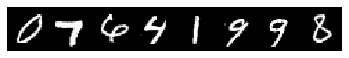

------------------
79
------------------
step 2639, loss 0.565818190574646
Target:	 tensor([6, 7, 3, 1, 6, 7, 4, 7], device='cuda:0')
Pred:	 tensor([6, 7, 3, 1, 6, 7, 4, 7], device='cuda:0')


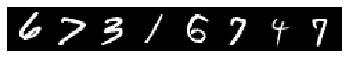

------------------
80
------------------
step 2672, loss 0.20286481082439423
Target:	 tensor([9, 7, 1, 1, 8, 3, 4, 5], device='cuda:0')
Pred:	 tensor([9, 7, 1, 1, 8, 3, 4, 5], device='cuda:0')


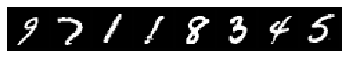

------------------
81
------------------
step 2705, loss 0.3054021894931793
Target:	 tensor([2, 4, 7, 2, 7, 3, 0, 0], device='cuda:0')
Pred:	 tensor([2, 4, 7, 2, 7, 3, 5, 0], device='cuda:0')


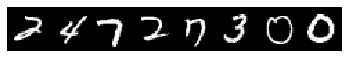

------------------
82
------------------
step 2738, loss 0.5502052307128906
Target:	 tensor([6, 4, 3, 4, 7, 5, 0, 9], device='cuda:0')
Pred:	 tensor([6, 4, 3, 4, 7, 5, 0, 9], device='cuda:0')


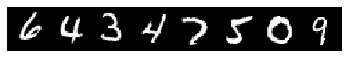

------------------
83
------------------
step 2771, loss 0.17116570472717285
Target:	 tensor([7, 4, 4, 6, 4, 7, 3, 3], device='cuda:0')
Pred:	 tensor([7, 4, 4, 6, 4, 7, 3, 3], device='cuda:0')


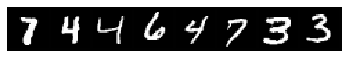

------------------
84
------------------
step 2804, loss 0.03259836137294769
Target:	 tensor([7, 2, 7, 5, 7, 1, 3, 4], device='cuda:0')
Pred:	 tensor([7, 2, 7, 5, 7, 1, 3, 4], device='cuda:0')


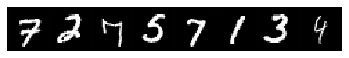

------------------
85
------------------
step 2837, loss 0.45456135272979736
Target:	 tensor([0, 3, 8, 2, 8, 8, 0, 1], device='cuda:0')
Pred:	 tensor([0, 3, 8, 2, 6, 5, 0, 8], device='cuda:0')


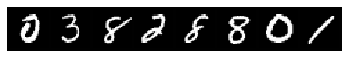

------------------
86
------------------
step 2870, loss 0.07439903914928436
Target:	 tensor([3, 3, 3, 2, 8, 3, 4, 2], device='cuda:0')
Pred:	 tensor([3, 3, 3, 2, 8, 3, 4, 2], device='cuda:0')


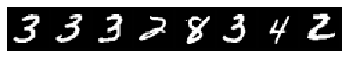

------------------
87
------------------
step 2903, loss 0.462449312210083
Target:	 tensor([5, 5, 7, 7, 4, 2, 8, 1], device='cuda:0')
Pred:	 tensor([5, 2, 7, 7, 4, 8, 8, 1], device='cuda:0')


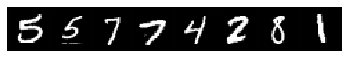

------------------
88
------------------
step 2936, loss 0.6287389993667603
Target:	 tensor([5, 5, 3, 1, 9, 5, 0, 7], device='cuda:0')
Pred:	 tensor([5, 5, 3, 1, 9, 5, 5, 7], device='cuda:0')


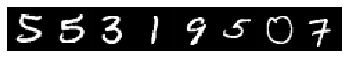

------------------
89
------------------
step 2969, loss 0.021443210542201996
Target:	 tensor([1, 8, 9, 9, 5, 2, 5, 6], device='cuda:0')
Pred:	 tensor([1, 8, 9, 9, 5, 2, 5, 6], device='cuda:0')


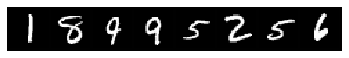

------------------
90
------------------
step 3002, loss 0.4733627438545227
Target:	 tensor([3, 3, 4, 4, 4, 0, 1, 9], device='cuda:0')
Pred:	 tensor([3, 9, 7, 4, 4, 9, 1, 9], device='cuda:0')


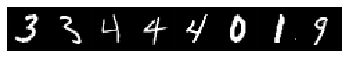

------------------
91
------------------
step 3035, loss 1.1931484937667847
Target:	 tensor([0, 1, 7, 2, 2, 9, 0, 1], device='cuda:0')
Pred:	 tensor([0, 1, 7, 3, 7, 9, 0, 1], device='cuda:0')


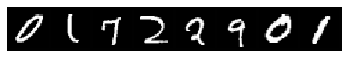

------------------
92
------------------
step 3068, loss 0.5692736506462097
Target:	 tensor([9, 2, 9, 1, 2, 7, 5, 8], device='cuda:0')
Pred:	 tensor([7, 2, 0, 1, 2, 7, 5, 8], device='cuda:0')


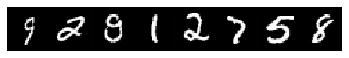

------------------
93
------------------
step 3101, loss 0.03525468707084656
Target:	 tensor([2, 7, 2, 3, 1, 7, 5, 8], device='cuda:0')
Pred:	 tensor([2, 7, 2, 3, 1, 7, 5, 8], device='cuda:0')


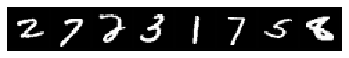

------------------
94
------------------
step 3134, loss 0.053356096148490906
Target:	 tensor([9, 1, 0, 4, 7, 8, 1, 7], device='cuda:0')
Pred:	 tensor([9, 1, 0, 4, 7, 8, 1, 7], device='cuda:0')


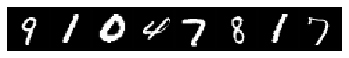

------------------
95
------------------
step 3167, loss 0.01132904551923275
Target:	 tensor([2, 5, 6, 4, 9, 8, 2, 3], device='cuda:0')
Pred:	 tensor([2, 5, 6, 4, 9, 8, 2, 3], device='cuda:0')


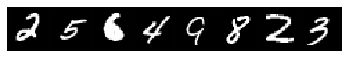

------------------
96
------------------
step 3200, loss 0.8795837759971619
Target:	 tensor([8, 0, 9, 8, 7, 0, 2, 2], device='cuda:0')
Pred:	 tensor([8, 0, 9, 8, 7, 0, 5, 2], device='cuda:0')


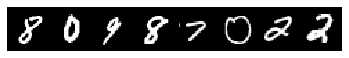

------------------
97
------------------
step 3233, loss 0.3083192706108093
Target:	 tensor([2, 2, 5, 2, 3, 1, 2, 1], device='cuda:0')
Pred:	 tensor([2, 2, 5, 2, 3, 1, 2, 1], device='cuda:0')


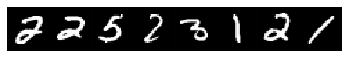

------------------
98
------------------
step 3266, loss 0.2648249864578247
Target:	 tensor([8, 0, 6, 8, 4, 1, 0, 6], device='cuda:0')
Pred:	 tensor([8, 0, 6, 8, 4, 1, 0, 6], device='cuda:0')


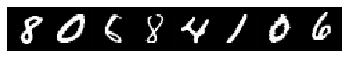

------------------
99
------------------
step 3299, loss 0.7119520902633667
Target:	 tensor([6, 2, 7, 9, 5, 7, 7, 2], device='cuda:0')
Pred:	 tensor([6, 2, 7, 9, 5, 4, 7, 2], device='cuda:0')


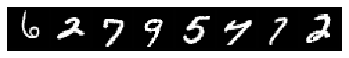

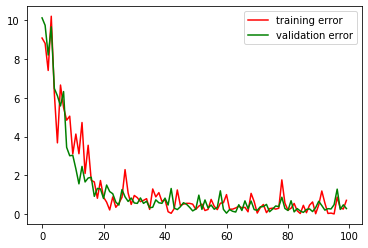

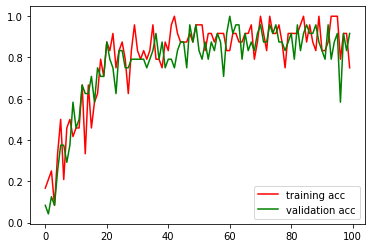

In [24]:
# learning rate, hyper-parameter
lr = 1e-4

# using GPU if it's availble
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#device = torch.device('cpu')

net = LeNetDrop(img_channel, device)
# keep a list of moel parameters
from torch.nn import init
params=[p for p in net.parameters()]
for i,(n,p) in enumerate(net.named_parameters()):
    #print(n)
    if n=='c1.bias' or n=='c3.bias':
        fan_in, _ = init._calculate_fan_in_and_fan_out(params[i-1].data)
        bound = 1 / math.sqrt(fan_in)
        init.uniform_(p.data, -bound, bound)
    if 'weights' in n:
        stdv = 1. / math.sqrt(p.size(1))
        p.data.uniform_(-stdv, stdv)
    if 'f' in n and 'bias' in n:
        stdv = 1. / math.sqrt(params[i-1].size(1))
        p.data.uniform_(-stdv, stdv)
#print(net.c1.kernel)
# training epochs, hyper-parameter
epochs = 100

# keep tracking of the changing of loss and accuracy of predictions
train_loss_list = []
val_loss_list = []
train_acc_list = []
val_acc_list = []

# the printing frequency, feel free to change this
print_interval = 50
for e in range(epochs):
  net.train()
  print('------------------')
  print(e)
  print('------------------')
        
  for i, (imgs, lbs) in enumerate(train_dl):
    imgs = imgs.to(device)
    lbs = lbs.to(device)
    # print('labels')
    # print(lbs)
    loss, prob = net.forward(imgs, lbs,training=True)

    # print('loss')
    # print(loss)
    # print('prob')
    # print(prob)

    net.zero_grad()
    grad = torch.autograd.grad(loss, [p for p in net.parameters()])
    
    
    # update weights
    step([p for p in net.parameters()], grad, lr)
    
    # obtain the predictions
    pred = prob.argmax(dim=-1).view(batch_size)
    acc = (pred == lbs).float().mean()
    
    
    
    
      
  train_loss_list.append(loss.detach().mean())
  train_acc_list.append(acc.detach().mean())
  
  print("step {}, loss {}".format(i + e*len(train_dl), loss))
  print("Target:\t {}\nPred:\t {}".format(lbs[:8], pred[:8]))
  # visualize some samples
  imgs_to_vis = vutils.make_grid(imgs[:8].cpu()+125., nrow=8, pad_value=1)
  plt.imshow(imgs_to_vis.permute(1,2,0).numpy().astype(np.uint8))
  plt.axis("off")
  plt.show()

  net.eval()
  for i, (imgs, lbs) in enumerate(val_dl):
    imgs = imgs.to(device)
    lbs = lbs.to(device)
    loss, prob = net(imgs, lbs,training=False)
    
    pred = prob.argmax(dim=-1).view(batch_size)
    acc = (pred == lbs).float().mean()
    
  val_loss_list.append(loss.detach().mean())
  val_acc_list.append(acc.detach().mean())
  

# ploting logs
plt.plot(np.arange(epochs), train_loss_list, '-r',
         np.arange(epochs), val_loss_list, '-g')
plt.legend(('training error', 'validation error'))
plt.show()
plt.plot(np.arange(epochs), train_acc_list, '-r',
         np.arange(epochs), val_acc_list, '-g')
plt.legend(('training acc', 'validation acc'))
plt.show()

## Task 7: Train on full dataset

Now, train the LeNetDrop on the full MNIST dataset. 

**To-do**:
    - Write the dataset loading script, training script for LeNetDrop.
    - Train LeNetDrop on the full MNIST dataset below.
    - (10 points)Plot out the training loss curve, validation loss curve, training accuracy curve and validation accuracy curve.

In [17]:
# dataset loading, training script and other codes starts here:
# loading the full dataset(i.e. 60000 images)
dataset_size = 60000
validation_size = int(0.2 * 60000)

ds = MNISTDataset(ds_size=dataset_size)

# split the dataset into training set and validation set
train_ds, val_ds = torch.utils.data.random_split(ds, [dataset_size - validation_size, validation_size])

# training batch size, hyper-parameter
batch_size = 24

# dataset loader
train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True, drop_last=True)
val_dl = DataLoader(val_ds, batch_size=batch_size, shuffle=True, drop_last=True)
img_channel = 1

------------------
0
------------------
step 1999, loss 0.7670602798461914
Target:	 tensor([4, 0, 5, 7, 3, 3, 3, 0], device='cuda:0')
Pred:	 tensor([4, 0, 5, 7, 3, 3, 3, 0], device='cuda:0')


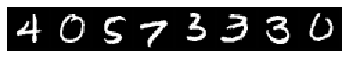

------------------
1
------------------
step 3999, loss 0.7987960577011108
Target:	 tensor([5, 1, 4, 1, 7, 7, 9, 4], device='cuda:0')
Pred:	 tensor([5, 1, 2, 1, 7, 7, 0, 9], device='cuda:0')


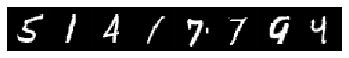

------------------
2
------------------
step 5999, loss 0.6401039958000183
Target:	 tensor([8, 8, 9, 2, 2, 7, 2, 4], device='cuda:0')
Pred:	 tensor([8, 8, 9, 1, 7, 7, 2, 4], device='cuda:0')


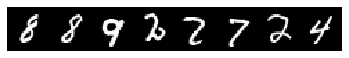

------------------
3
------------------
step 7999, loss 0.07866382598876953
Target:	 tensor([1, 5, 3, 7, 4, 2, 1, 8], device='cuda:0')
Pred:	 tensor([1, 5, 3, 7, 4, 2, 1, 8], device='cuda:0')


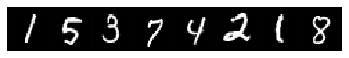

------------------
4
------------------
step 9999, loss 0.11598628759384155
Target:	 tensor([1, 9, 4, 4, 7, 5, 9, 1], device='cuda:0')
Pred:	 tensor([1, 9, 4, 4, 7, 5, 9, 1], device='cuda:0')


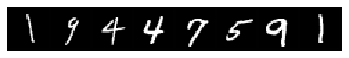

------------------
5
------------------
step 11999, loss 0.14767149090766907
Target:	 tensor([4, 1, 0, 7, 6, 2, 3, 9], device='cuda:0')
Pred:	 tensor([4, 1, 0, 7, 6, 2, 3, 9], device='cuda:0')


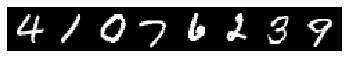

------------------
6
------------------
step 13999, loss 0.3659530580043793
Target:	 tensor([3, 3, 3, 0, 8, 2, 8, 7], device='cuda:0')
Pred:	 tensor([3, 3, 3, 0, 4, 2, 1, 7], device='cuda:0')


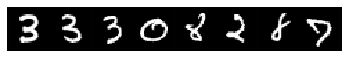

------------------
7
------------------
step 15999, loss 0.09629808366298676
Target:	 tensor([5, 2, 5, 5, 4, 4, 7, 0], device='cuda:0')
Pred:	 tensor([5, 2, 5, 8, 4, 4, 7, 0], device='cuda:0')


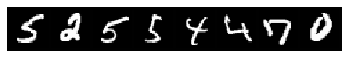

------------------
8
------------------
step 17999, loss 0.056487634778022766
Target:	 tensor([8, 4, 7, 7, 8, 6, 5, 7], device='cuda:0')
Pred:	 tensor([8, 4, 7, 7, 8, 6, 5, 7], device='cuda:0')


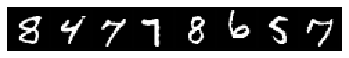

------------------
9
------------------
step 19999, loss 0.29429203271865845
Target:	 tensor([2, 2, 7, 1, 1, 8, 5, 1], device='cuda:0')
Pred:	 tensor([2, 2, 7, 1, 1, 8, 5, 1], device='cuda:0')


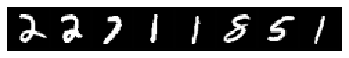

------------------
10
------------------
step 21999, loss 0.0341627411544323
Target:	 tensor([5, 9, 7, 4, 2, 6, 1, 7], device='cuda:0')
Pred:	 tensor([5, 9, 7, 4, 2, 6, 1, 7], device='cuda:0')


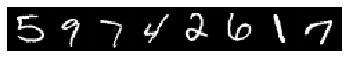

------------------
11
------------------
step 23999, loss 0.06681018322706223
Target:	 tensor([9, 4, 1, 5, 1, 4, 5, 3], device='cuda:0')
Pred:	 tensor([9, 4, 1, 5, 1, 4, 5, 3], device='cuda:0')


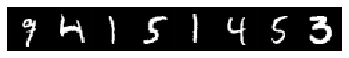

------------------
12
------------------
step 25999, loss 0.03051086887717247
Target:	 tensor([1, 7, 9, 7, 3, 4, 3, 9], device='cuda:0')
Pred:	 tensor([1, 7, 9, 7, 3, 4, 3, 9], device='cuda:0')


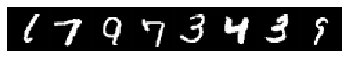

------------------
13
------------------
step 27999, loss 0.10771457850933075
Target:	 tensor([6, 9, 5, 4, 7, 6, 7, 1], device='cuda:0')
Pred:	 tensor([6, 9, 5, 4, 7, 6, 7, 1], device='cuda:0')


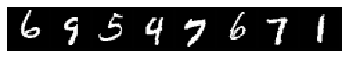

------------------
14
------------------
step 29999, loss 0.06785699725151062
Target:	 tensor([2, 9, 3, 2, 2, 6, 0, 0], device='cuda:0')
Pred:	 tensor([2, 9, 3, 2, 2, 6, 0, 0], device='cuda:0')


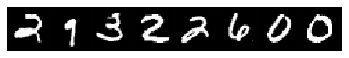

------------------
15
------------------
step 31999, loss 0.012898512184619904
Target:	 tensor([0, 9, 9, 6, 3, 1, 3, 3], device='cuda:0')
Pred:	 tensor([0, 9, 9, 6, 3, 1, 3, 3], device='cuda:0')


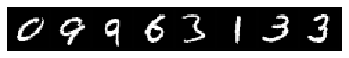

------------------
16
------------------
step 33999, loss 0.13369819521903992
Target:	 tensor([7, 1, 8, 6, 9, 6, 7, 7], device='cuda:0')
Pred:	 tensor([7, 1, 8, 6, 9, 6, 7, 7], device='cuda:0')


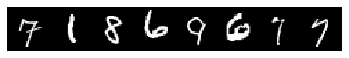

------------------
17
------------------
step 35999, loss 0.01520225778222084
Target:	 tensor([7, 2, 7, 3, 9, 5, 5, 4], device='cuda:0')
Pred:	 tensor([7, 2, 7, 3, 9, 5, 5, 4], device='cuda:0')


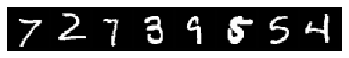

------------------
18
------------------
step 37999, loss 0.006662664003670216
Target:	 tensor([9, 5, 1, 8, 4, 2, 4, 0], device='cuda:0')
Pred:	 tensor([9, 5, 1, 8, 4, 2, 4, 0], device='cuda:0')


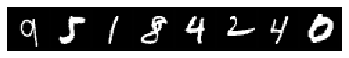

------------------
19
------------------
step 39999, loss 0.05047159641981125
Target:	 tensor([6, 2, 4, 1, 4, 0, 6, 9], device='cuda:0')
Pred:	 tensor([6, 2, 4, 1, 4, 0, 6, 9], device='cuda:0')


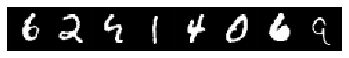

------------------
20
------------------
step 41999, loss 0.026059791445732117
Target:	 tensor([7, 9, 6, 8, 7, 1, 7, 2], device='cuda:0')
Pred:	 tensor([7, 9, 6, 8, 7, 1, 7, 2], device='cuda:0')


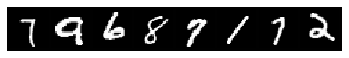

------------------
21
------------------
step 43999, loss 0.47815990447998047
Target:	 tensor([7, 7, 7, 6, 5, 7, 7, 3], device='cuda:0')
Pred:	 tensor([7, 7, 4, 6, 5, 7, 7, 3], device='cuda:0')


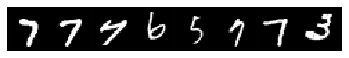

------------------
22
------------------
step 45999, loss 0.009581086225807667
Target:	 tensor([4, 1, 8, 7, 1, 3, 6, 7], device='cuda:0')
Pred:	 tensor([4, 1, 8, 7, 1, 3, 6, 7], device='cuda:0')


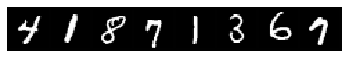

------------------
23
------------------
step 47999, loss 0.11506077647209167
Target:	 tensor([0, 6, 3, 1, 2, 8, 5, 3], device='cuda:0')
Pred:	 tensor([0, 6, 3, 1, 2, 8, 5, 3], device='cuda:0')


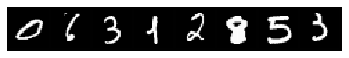

------------------
24
------------------
step 49999, loss 0.2430855631828308
Target:	 tensor([1, 9, 5, 0, 2, 7, 4, 6], device='cuda:0')
Pred:	 tensor([1, 9, 5, 0, 7, 7, 4, 6], device='cuda:0')


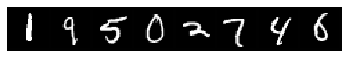

------------------
25
------------------
step 51999, loss 0.2510879933834076
Target:	 tensor([3, 3, 2, 2, 9, 0, 5, 8], device='cuda:0')
Pred:	 tensor([3, 3, 2, 2, 4, 0, 5, 8], device='cuda:0')


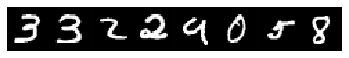

------------------
26
------------------
step 53999, loss 0.4425325095653534
Target:	 tensor([6, 8, 0, 6, 0, 5, 3, 7], device='cuda:0')
Pred:	 tensor([6, 3, 0, 6, 9, 5, 3, 7], device='cuda:0')


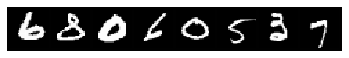

------------------
27
------------------
step 55999, loss 0.1327309012413025
Target:	 tensor([4, 2, 8, 7, 6, 8, 4, 0], device='cuda:0')
Pred:	 tensor([4, 2, 8, 7, 6, 8, 4, 0], device='cuda:0')


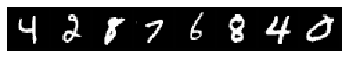

------------------
28
------------------
step 57999, loss 0.163262739777565
Target:	 tensor([6, 1, 2, 0, 4, 7, 2, 6], device='cuda:0')
Pred:	 tensor([6, 1, 2, 0, 4, 7, 2, 6], device='cuda:0')


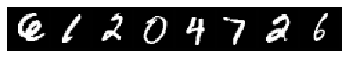

------------------
29
------------------
step 59999, loss 0.06114304065704346
Target:	 tensor([7, 6, 6, 4, 3, 4, 1, 6], device='cuda:0')
Pred:	 tensor([7, 6, 6, 4, 3, 4, 1, 6], device='cuda:0')


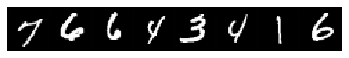

------------------
30
------------------
step 61999, loss 0.030552640557289124
Target:	 tensor([6, 1, 8, 2, 5, 6, 4, 6], device='cuda:0')
Pred:	 tensor([6, 1, 8, 2, 5, 6, 4, 6], device='cuda:0')


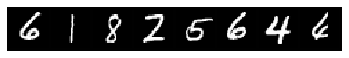

------------------
31
------------------
step 63999, loss 0.18678170442581177
Target:	 tensor([4, 0, 9, 6, 2, 7, 7, 0], device='cuda:0')
Pred:	 tensor([4, 0, 8, 5, 2, 7, 7, 0], device='cuda:0')


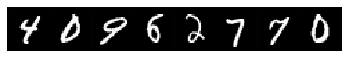

------------------
32
------------------
step 65999, loss 0.25730016827583313
Target:	 tensor([4, 3, 3, 4, 0, 3, 2, 9], device='cuda:0')
Pred:	 tensor([4, 3, 3, 4, 0, 3, 2, 9], device='cuda:0')


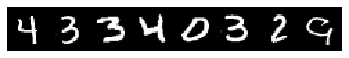

------------------
33
------------------
step 67999, loss 0.2481624186038971
Target:	 tensor([1, 8, 9, 2, 0, 8, 2, 3], device='cuda:0')
Pred:	 tensor([1, 8, 9, 2, 0, 8, 2, 3], device='cuda:0')


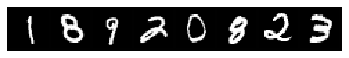

------------------
34
------------------
step 69999, loss 0.045215945690870285
Target:	 tensor([6, 0, 4, 4, 6, 4, 1, 4], device='cuda:0')
Pred:	 tensor([6, 0, 4, 4, 6, 4, 1, 4], device='cuda:0')


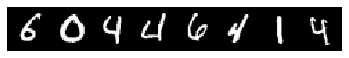

------------------
35
------------------
step 71999, loss 0.033233411610126495
Target:	 tensor([2, 4, 3, 3, 3, 2, 9, 7], device='cuda:0')
Pred:	 tensor([2, 4, 3, 3, 3, 2, 9, 7], device='cuda:0')


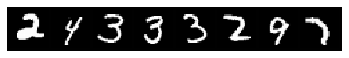

------------------
36
------------------
step 73999, loss 0.08596055209636688
Target:	 tensor([2, 8, 5, 7, 9, 8, 5, 5], device='cuda:0')
Pred:	 tensor([2, 3, 5, 7, 9, 8, 5, 5], device='cuda:0')


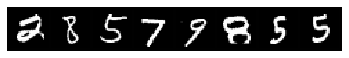

------------------
37
------------------
step 75999, loss 0.04230165109038353
Target:	 tensor([8, 5, 5, 9, 1, 3, 5, 1], device='cuda:0')
Pred:	 tensor([8, 5, 5, 9, 1, 3, 5, 1], device='cuda:0')


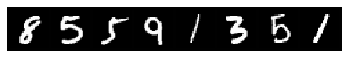

------------------
38
------------------
step 77999, loss 0.022817343473434448
Target:	 tensor([0, 1, 3, 3, 0, 6, 0, 0], device='cuda:0')
Pred:	 tensor([0, 1, 3, 3, 0, 6, 0, 0], device='cuda:0')


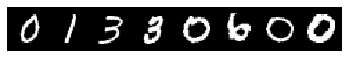

------------------
39
------------------
step 79999, loss 0.011436842381954193
Target:	 tensor([9, 0, 5, 3, 7, 5, 8, 1], device='cuda:0')
Pred:	 tensor([9, 0, 5, 3, 7, 5, 8, 1], device='cuda:0')


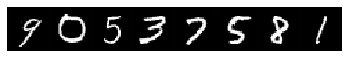

------------------
40
------------------
step 81999, loss 0.007599472999572754
Target:	 tensor([6, 0, 2, 3, 3, 0, 1, 3], device='cuda:0')
Pred:	 tensor([6, 0, 2, 3, 3, 0, 1, 3], device='cuda:0')


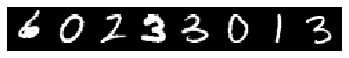

------------------
41
------------------
step 83999, loss 0.07517316192388535
Target:	 tensor([2, 3, 2, 9, 7, 4, 5, 6], device='cuda:0')
Pred:	 tensor([2, 3, 2, 9, 7, 4, 5, 6], device='cuda:0')


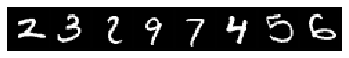

------------------
42
------------------
step 85999, loss 0.0882713794708252
Target:	 tensor([3, 9, 8, 7, 9, 0, 1, 1], device='cuda:0')
Pred:	 tensor([3, 9, 8, 7, 8, 0, 1, 1], device='cuda:0')


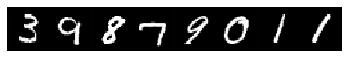

------------------
43
------------------
step 87999, loss 0.025131169706583023
Target:	 tensor([4, 5, 8, 6, 5, 1, 8, 9], device='cuda:0')
Pred:	 tensor([4, 5, 8, 6, 5, 1, 8, 9], device='cuda:0')


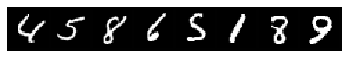

------------------
44
------------------
step 89999, loss 0.007466423790901899
Target:	 tensor([1, 6, 7, 4, 3, 8, 5, 2], device='cuda:0')
Pred:	 tensor([1, 6, 7, 4, 3, 8, 5, 2], device='cuda:0')


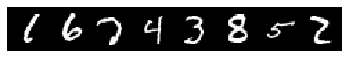

------------------
45
------------------
step 91999, loss 0.07030187547206879
Target:	 tensor([5, 3, 8, 8, 6, 5, 9, 2], device='cuda:0')
Pred:	 tensor([5, 3, 8, 8, 6, 5, 9, 2], device='cuda:0')


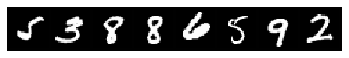

------------------
46
------------------
step 93999, loss 0.23286044597625732
Target:	 tensor([8, 1, 4, 5, 1, 7, 2, 6], device='cuda:0')
Pred:	 tensor([8, 1, 4, 5, 1, 7, 2, 6], device='cuda:0')


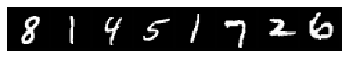

------------------
47
------------------
step 95999, loss 0.011827848851680756
Target:	 tensor([7, 7, 3, 1, 3, 6, 0, 4], device='cuda:0')
Pred:	 tensor([7, 7, 3, 1, 3, 6, 0, 4], device='cuda:0')


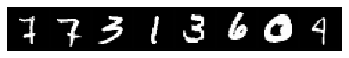

------------------
48
------------------
step 97999, loss 0.07540962100028992
Target:	 tensor([8, 9, 0, 9, 6, 7, 3, 8], device='cuda:0')
Pred:	 tensor([8, 9, 0, 9, 5, 7, 3, 8], device='cuda:0')


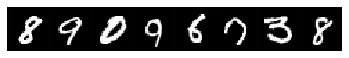

------------------
49
------------------
step 99999, loss 0.0029992512427270412
Target:	 tensor([0, 9, 6, 4, 7, 7, 1, 8], device='cuda:0')
Pred:	 tensor([0, 9, 6, 4, 7, 7, 1, 8], device='cuda:0')


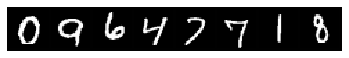

------------------
50
------------------
step 101999, loss 0.01301698386669159
Target:	 tensor([1, 6, 4, 0, 8, 8, 6, 0], device='cuda:0')
Pred:	 tensor([1, 6, 4, 0, 8, 8, 6, 0], device='cuda:0')


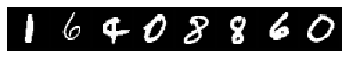

------------------
51
------------------
step 103999, loss 0.0156601183116436
Target:	 tensor([1, 3, 5, 6, 3, 3, 2, 8], device='cuda:0')
Pred:	 tensor([1, 3, 5, 6, 3, 3, 2, 8], device='cuda:0')


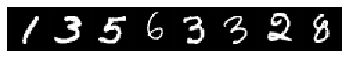

------------------
52
------------------
step 105999, loss 0.023317649960517883
Target:	 tensor([9, 3, 4, 8, 8, 4, 6, 5], device='cuda:0')
Pred:	 tensor([9, 3, 4, 8, 8, 4, 6, 5], device='cuda:0')


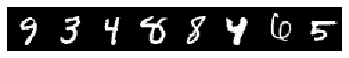

------------------
53
------------------
step 107999, loss 0.16324986517429352
Target:	 tensor([7, 9, 5, 7, 6, 8, 8, 2], device='cuda:0')
Pred:	 tensor([7, 9, 5, 7, 6, 8, 8, 2], device='cuda:0')


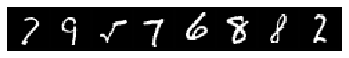

------------------
54
------------------
step 109999, loss 0.024501707404851913
Target:	 tensor([2, 0, 2, 7, 7, 3, 7, 1], device='cuda:0')
Pred:	 tensor([2, 0, 2, 7, 7, 3, 7, 1], device='cuda:0')


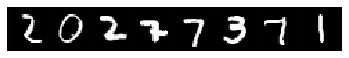

------------------
55
------------------
step 111999, loss 0.032421473413705826
Target:	 tensor([6, 2, 0, 0, 2, 3, 4, 1], device='cuda:0')
Pred:	 tensor([6, 2, 0, 0, 2, 3, 4, 1], device='cuda:0')


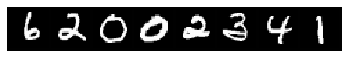

------------------
56
------------------
step 113999, loss 0.17559097707271576
Target:	 tensor([3, 6, 0, 4, 0, 4, 0, 3], device='cuda:0')
Pred:	 tensor([3, 6, 0, 4, 0, 4, 0, 3], device='cuda:0')


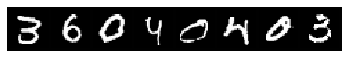

------------------
57
------------------
step 115999, loss 0.02421453408896923
Target:	 tensor([9, 9, 4, 9, 5, 2, 0, 5], device='cuda:0')
Pred:	 tensor([9, 9, 4, 9, 5, 2, 0, 5], device='cuda:0')


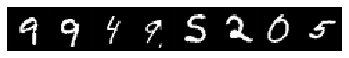

------------------
58
------------------
step 117999, loss 0.007076082285493612
Target:	 tensor([7, 5, 9, 5, 4, 1, 2, 7], device='cuda:0')
Pred:	 tensor([7, 5, 9, 5, 4, 1, 2, 7], device='cuda:0')


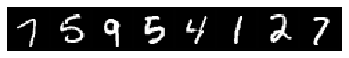

------------------
59
------------------
step 119999, loss 0.21916478872299194
Target:	 tensor([5, 9, 4, 9, 6, 5, 7, 6], device='cuda:0')
Pred:	 tensor([5, 9, 9, 9, 6, 5, 7, 6], device='cuda:0')


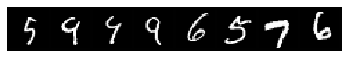

------------------
60
------------------
step 121999, loss 0.0923738107085228
Target:	 tensor([2, 8, 4, 1, 6, 6, 9, 1], device='cuda:0')
Pred:	 tensor([2, 8, 4, 1, 6, 6, 9, 1], device='cuda:0')


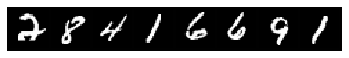

------------------
61
------------------
step 123999, loss 0.009611669927835464
Target:	 tensor([0, 2, 2, 4, 6, 7, 4, 4], device='cuda:0')
Pred:	 tensor([0, 2, 2, 4, 6, 7, 4, 4], device='cuda:0')


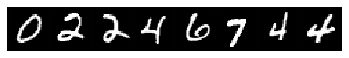

------------------
62
------------------
step 125999, loss 0.01711791567504406
Target:	 tensor([8, 6, 0, 6, 8, 9, 3, 0], device='cuda:0')
Pred:	 tensor([8, 6, 0, 6, 8, 9, 3, 0], device='cuda:0')


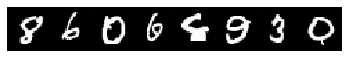

------------------
63
------------------
step 127999, loss 0.00261031836271286
Target:	 tensor([5, 8, 6, 3, 0, 4, 9, 4], device='cuda:0')
Pred:	 tensor([5, 8, 6, 3, 0, 4, 9, 4], device='cuda:0')


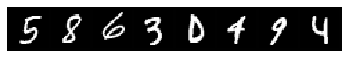

------------------
64
------------------
step 129999, loss 0.04230090603232384
Target:	 tensor([4, 2, 2, 0, 1, 9, 4, 7], device='cuda:0')
Pred:	 tensor([4, 2, 2, 0, 1, 9, 4, 7], device='cuda:0')


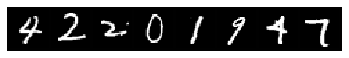

------------------
65
------------------
step 131999, loss 0.15054717659950256
Target:	 tensor([9, 4, 0, 7, 8, 3, 0, 1], device='cuda:0')
Pred:	 tensor([9, 4, 0, 7, 8, 3, 0, 7], device='cuda:0')


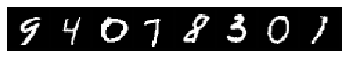

------------------
66
------------------
step 133999, loss 0.007879969663918018
Target:	 tensor([1, 6, 7, 3, 4, 0, 2, 7], device='cuda:0')
Pred:	 tensor([1, 6, 7, 3, 4, 0, 2, 7], device='cuda:0')


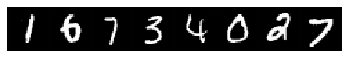

------------------
67
------------------
step 135999, loss 0.003954922780394554
Target:	 tensor([0, 0, 7, 6, 7, 6, 5, 9], device='cuda:0')
Pred:	 tensor([0, 0, 7, 6, 7, 6, 5, 9], device='cuda:0')


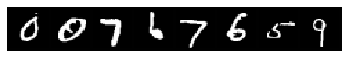

------------------
68
------------------
step 137999, loss 0.03341510891914368
Target:	 tensor([8, 9, 6, 8, 0, 9, 0, 6], device='cuda:0')
Pred:	 tensor([8, 9, 6, 8, 0, 9, 0, 6], device='cuda:0')


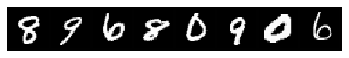

------------------
69
------------------
step 139999, loss 0.018602734431624413
Target:	 tensor([6, 6, 8, 0, 0, 0, 5, 1], device='cuda:0')
Pred:	 tensor([6, 6, 8, 0, 0, 0, 5, 1], device='cuda:0')


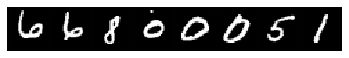

------------------
70
------------------
step 141999, loss 0.004374634474515915
Target:	 tensor([1, 0, 6, 7, 5, 0, 9, 3], device='cuda:0')
Pred:	 tensor([1, 0, 6, 7, 5, 0, 9, 3], device='cuda:0')


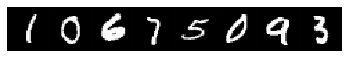

------------------
71
------------------
step 143999, loss 0.04533252865076065
Target:	 tensor([5, 2, 7, 2, 4, 2, 0, 2], device='cuda:0')
Pred:	 tensor([5, 2, 7, 2, 4, 2, 0, 2], device='cuda:0')


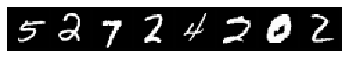

------------------
72
------------------
step 145999, loss 0.007291124202311039
Target:	 tensor([8, 8, 1, 0, 3, 4, 8, 9], device='cuda:0')
Pred:	 tensor([8, 8, 1, 0, 3, 4, 8, 9], device='cuda:0')


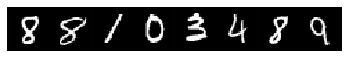

------------------
73
------------------
step 147999, loss 0.023380717262625694
Target:	 tensor([3, 1, 4, 1, 8, 6, 7, 3], device='cuda:0')
Pred:	 tensor([3, 1, 4, 1, 8, 6, 7, 3], device='cuda:0')


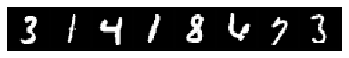

------------------
74
------------------
step 149999, loss 0.009643740952014923
Target:	 tensor([8, 5, 4, 1, 3, 4, 2, 4], device='cuda:0')
Pred:	 tensor([8, 5, 4, 1, 3, 4, 2, 4], device='cuda:0')


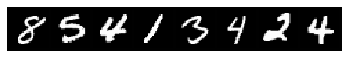

------------------
75
------------------
step 151999, loss 0.1486954540014267
Target:	 tensor([9, 3, 9, 8, 3, 5, 0, 7], device='cuda:0')
Pred:	 tensor([9, 3, 9, 8, 5, 5, 0, 7], device='cuda:0')


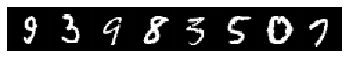

------------------
76
------------------
step 153999, loss 0.03248468413949013
Target:	 tensor([1, 1, 6, 8, 6, 9, 4, 0], device='cuda:0')
Pred:	 tensor([1, 1, 6, 8, 6, 9, 4, 0], device='cuda:0')


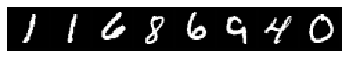

------------------
77
------------------
step 155999, loss 0.013884974643588066
Target:	 tensor([0, 4, 2, 1, 6, 6, 6, 5], device='cuda:0')
Pred:	 tensor([0, 4, 2, 1, 6, 6, 6, 5], device='cuda:0')


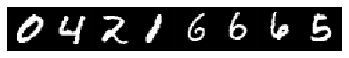

------------------
78
------------------
step 157999, loss 0.01561742927879095
Target:	 tensor([5, 7, 7, 1, 1, 5, 1, 8], device='cuda:0')
Pred:	 tensor([5, 7, 7, 1, 1, 5, 1, 8], device='cuda:0')


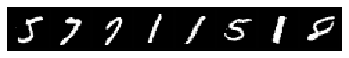

------------------
79
------------------
step 159999, loss 0.03541354835033417
Target:	 tensor([8, 1, 6, 9, 0, 8, 4, 9], device='cuda:0')
Pred:	 tensor([8, 1, 6, 9, 0, 8, 4, 9], device='cuda:0')


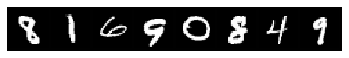

------------------
80
------------------
step 161999, loss 0.00454538781195879
Target:	 tensor([2, 0, 1, 5, 8, 4, 8, 0], device='cuda:0')
Pred:	 tensor([2, 0, 1, 5, 8, 4, 8, 0], device='cuda:0')


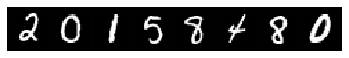

------------------
81
------------------
step 163999, loss 0.1921088993549347
Target:	 tensor([7, 0, 9, 0, 8, 5, 9, 5], device='cuda:0')
Pred:	 tensor([7, 0, 9, 0, 2, 5, 9, 5], device='cuda:0')


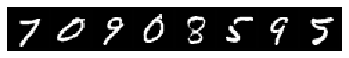

------------------
82
------------------
step 165999, loss 0.5422490239143372
Target:	 tensor([1, 7, 8, 9, 3, 5, 5, 2], device='cuda:0')
Pred:	 tensor([1, 2, 8, 7, 3, 5, 5, 2], device='cuda:0')


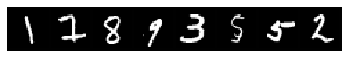

------------------
83
------------------
step 167999, loss 0.023518260568380356
Target:	 tensor([0, 4, 6, 7, 7, 8, 5, 6], device='cuda:0')
Pred:	 tensor([0, 4, 6, 7, 7, 8, 5, 6], device='cuda:0')


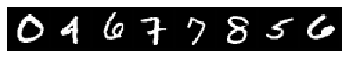

------------------
84
------------------
step 169999, loss 0.026799660176038742
Target:	 tensor([7, 0, 0, 1, 7, 8, 9, 3], device='cuda:0')
Pred:	 tensor([7, 0, 0, 1, 7, 8, 9, 3], device='cuda:0')


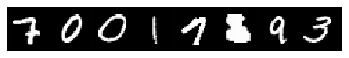

------------------
85
------------------
step 171999, loss 0.005902813747525215
Target:	 tensor([6, 3, 7, 2, 9, 3, 4, 4], device='cuda:0')
Pred:	 tensor([6, 3, 7, 2, 9, 3, 4, 4], device='cuda:0')


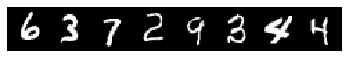

------------------
86
------------------
step 173999, loss 0.043742746114730835
Target:	 tensor([3, 3, 4, 1, 8, 5, 9, 3], device='cuda:0')
Pred:	 tensor([3, 3, 4, 1, 8, 5, 9, 3], device='cuda:0')


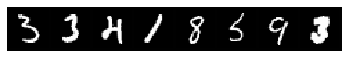

------------------
87
------------------
step 175999, loss 0.006372296251356602
Target:	 tensor([8, 1, 4, 4, 2, 6, 9, 3], device='cuda:0')
Pred:	 tensor([8, 1, 4, 4, 2, 6, 9, 3], device='cuda:0')


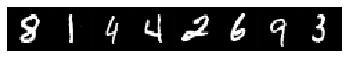

------------------
88
------------------
step 177999, loss 0.008768985979259014
Target:	 tensor([8, 9, 2, 5, 3, 0, 7, 8], device='cuda:0')
Pred:	 tensor([8, 9, 2, 5, 3, 0, 7, 8], device='cuda:0')


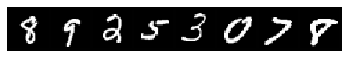

------------------
89
------------------
step 179999, loss 0.011925090104341507
Target:	 tensor([1, 8, 4, 3, 7, 8, 2, 9], device='cuda:0')
Pred:	 tensor([1, 8, 4, 3, 7, 8, 2, 9], device='cuda:0')


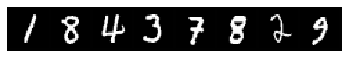

------------------
90
------------------
step 181999, loss 0.036328017711639404
Target:	 tensor([4, 6, 4, 4, 9, 5, 4, 3], device='cuda:0')
Pred:	 tensor([4, 6, 4, 4, 9, 5, 4, 3], device='cuda:0')


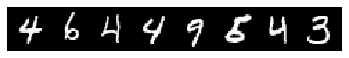

------------------
91
------------------
step 183999, loss 0.0012080710148438811
Target:	 tensor([2, 1, 9, 6, 2, 6, 6, 8], device='cuda:0')
Pred:	 tensor([2, 1, 9, 6, 2, 6, 6, 8], device='cuda:0')


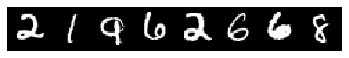

------------------
92
------------------
step 185999, loss 0.2301066815853119
Target:	 tensor([9, 7, 2, 5, 3, 6, 8, 0], device='cuda:0')
Pred:	 tensor([9, 7, 2, 5, 3, 0, 8, 0], device='cuda:0')


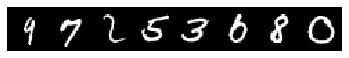

------------------
93
------------------
step 187999, loss 0.021048277616500854
Target:	 tensor([2, 8, 1, 0, 6, 9, 9, 3], device='cuda:0')
Pred:	 tensor([2, 8, 1, 0, 6, 9, 9, 3], device='cuda:0')


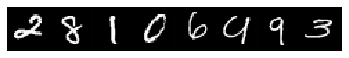

------------------
94
------------------
step 189999, loss 0.12422888725996017
Target:	 tensor([6, 0, 5, 1, 1, 9, 3, 0], device='cuda:0')
Pred:	 tensor([6, 0, 5, 1, 1, 9, 3, 0], device='cuda:0')


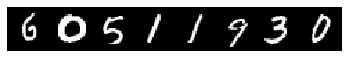

------------------
95
------------------
step 191999, loss 0.013506315648555756
Target:	 tensor([7, 1, 3, 9, 6, 3, 7, 7], device='cuda:0')
Pred:	 tensor([7, 1, 3, 9, 6, 3, 7, 7], device='cuda:0')


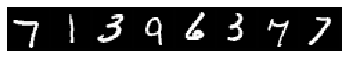

------------------
96
------------------
step 193999, loss 0.017556937411427498
Target:	 tensor([9, 1, 5, 7, 0, 9, 9, 0], device='cuda:0')
Pred:	 tensor([9, 1, 5, 7, 0, 9, 9, 0], device='cuda:0')


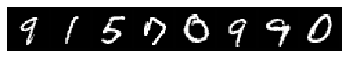

------------------
97
------------------
step 195999, loss 0.0032490685116499662
Target:	 tensor([9, 9, 1, 4, 4, 2, 5, 9], device='cuda:0')
Pred:	 tensor([9, 9, 1, 4, 4, 2, 5, 9], device='cuda:0')


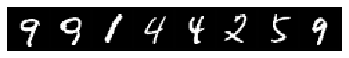

------------------
98
------------------
step 197999, loss 0.009578578174114227
Target:	 tensor([5, 7, 1, 1, 7, 5, 9, 9], device='cuda:0')
Pred:	 tensor([5, 7, 1, 1, 7, 5, 9, 9], device='cuda:0')


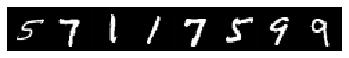

------------------
99
------------------
step 199999, loss 0.10546943545341492
Target:	 tensor([8, 9, 4, 1, 8, 0, 2, 4], device='cuda:0')
Pred:	 tensor([8, 9, 4, 1, 8, 0, 2, 4], device='cuda:0')


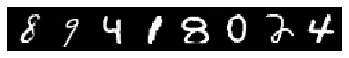

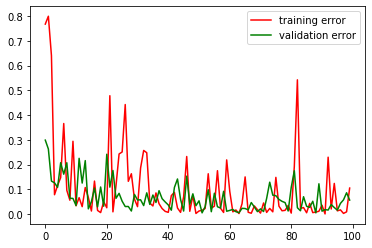

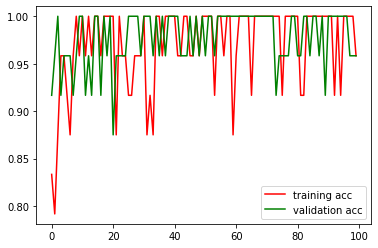

In [25]:
# learning rate, hyper-parameter
lr = 1e-4

# using GPU if it's availble
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#device = torch.device('cpu')

net = LeNetDrop(img_channel, device)
# keep a list of moel parameters
from torch.nn import init
params=[p for p in net.parameters()]
for i,(n,p) in enumerate(net.named_parameters()):
    #print(n)
    if n=='c1.bias' or n=='c3.bias':
        fan_in, _ = init._calculate_fan_in_and_fan_out(params[i-1].data)
        bound = 1 / math.sqrt(fan_in)
        init.uniform_(p.data, -bound, bound)
    if 'weights' in n:
        stdv = 1. / math.sqrt(p.size(1))
        p.data.uniform_(-stdv, stdv)
    if 'f' in n and 'bias' in n:
        stdv = 1. / math.sqrt(params[i-1].size(1))
        p.data.uniform_(-stdv, stdv)
#print(net.c1.kernel)
# training epochs, hyper-parameter
epochs = 100

# keep tracking of the changing of loss and accuracy of predictions
train_loss_list = []
val_loss_list = []
train_acc_list = []
val_acc_list = []

# the printing frequency, feel free to change this
print_interval = 50
for e in range(epochs):
  net.train()
  print('------------------')
  print(e)
  print('------------------')
        
  for i, (imgs, lbs) in enumerate(train_dl):
    imgs = imgs.to(device)
    lbs = lbs.to(device)
    # print('labels')
    # print(lbs)
    loss, prob = net.forward(imgs, lbs,training=True)

    # print('loss')
    # print(loss)
    # print('prob')
    # print(prob)

    net.zero_grad()
    grad = torch.autograd.grad(loss, [p for p in net.parameters()])
    
    
    # update weights
    step([p for p in net.parameters()], grad, lr)
    
    # obtain the predictions
    pred = prob.argmax(dim=-1).view(batch_size)
    acc = (pred == lbs).float().mean()
    
    
    
    
      
  train_loss_list.append(loss.detach().mean())
  train_acc_list.append(acc.detach().mean())
  
  print("step {}, loss {}".format(i + e*len(train_dl), loss))
  print("Target:\t {}\nPred:\t {}".format(lbs[:8], pred[:8]))
  # visualize some samples
  imgs_to_vis = vutils.make_grid(imgs[:8].cpu()+125., nrow=8, pad_value=1)
  plt.imshow(imgs_to_vis.permute(1,2,0).numpy().astype(np.uint8))
  plt.axis("off")
  plt.show()

  net.eval()
  for i, (imgs, lbs) in enumerate(val_dl):
    imgs = imgs.to(device)
    lbs = lbs.to(device)
    loss, prob = net(imgs, lbs,training=False)
    
    pred = prob.argmax(dim=-1).view(batch_size)
    acc = (pred == lbs).float().mean()
    
  val_loss_list.append(loss.detach().mean())
  val_acc_list.append(acc.detach().mean())
  

# ploting logs
plt.plot(np.arange(epochs), train_loss_list, '-r',
         np.arange(epochs), val_loss_list, '-g')
plt.legend(('training error', 'validation error'))
plt.show()
plt.plot(np.arange(epochs), train_acc_list, '-r',
         np.arange(epochs), val_acc_list, '-g')
plt.legend(('training acc', 'validation acc'))
plt.show()

## Batch Normalization

[Batch Normalization](https://arxiv.org/pdf/1502.03167.pdf) can accelerate the training procedure by shifting and scaling the input for each layer. 

**To-do**:
    - (10 points)Complete the **batch_norm_forward()** function for class BatchNorm.
    - (5 points)Modify the class LeNetDrop to class LeNetDropNorm: add a batch normalization layer after layer each dropout layer for LeNetDrop. 
    - Write the dataset loading script, training script for LeNetDropNorm.
    - Train LeNetDropNorm on the full MNIST dataset.
    - (10 points)Plot out the training loss curve, validation loss curve, training accuracy curve and validation accuracy curve.

In [18]:
# dataset loading, training script and other codes starts here:
# loading the full dataset(i.e. 60000 images)
dataset_size = 60000
validation_size = int(0.2 * 60000)

ds = MNISTDataset(ds_size=dataset_size)

# split the dataset into training set and validation set
train_ds, val_ds = torch.utils.data.random_split(ds, [dataset_size - validation_size, validation_size])

# training batch size, hyper-parameter
batch_size = 24

# dataset loader
train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True, drop_last=True)
val_dl = DataLoader(val_ds, batch_size=batch_size, shuffle=True, drop_last=True)
img_channel = 1

In [19]:
class BatchNorm(nn.Module):
  def __init__(self, num_features, device, eps=1e-5):
    super(BatchNorm, self).__init__()
    self.gamma = nn.Parameter(torch.ones(num_features, dtype=torch.float32, device=device), requires_grad=True)
    self.beta = nn.Parameter(torch.zeros(num_features, dtype=torch.float32, device=device), requires_grad=True)
    self.moving_mean_gamma = 0.
    self.moving_mean_beta = 0.
    self.eps = eps
    self.num_features = num_features
    self.device = device
    self.running_mean=torch.zeros(num_features, dtype=torch.float32, device=device)
    self.running_var=torch.ones(num_features, dtype=torch.float32, device=device)
    
  def batch_norm_forward(self, x,training):
    """
    input:
      X: (N, *), input of dropout layer, where N is the batch size
    output:
      Y: (N, *), where N is the batch size
    """
    ### Start the code here  ###
    
    exponential_average_factor=0.1
    
    # for convolutional layers
    if len(x.size())>3:
        if training:
            mean = x.mean([0, 2, 3])
            # use biased var in train
            var = x.var([0, 2, 3], unbiased=False)
            n = x.numel() / x.size(1)
            with torch.no_grad():
                self.running_mean = exponential_average_factor * mean\
                    + (1 - exponential_average_factor) * self.running_mean
                # update running_var with unbiased var
                self.running_var = exponential_average_factor * var * n / (n - 1)\
                    + (1 - exponential_average_factor) * self.running_var
        else:
            mean = self.running_mean
            var = self.running_var

        x = (x - mean[None, :, None, None]) / (torch.sqrt(var[None, :, None, None] + self.eps))

        x = (x * self.gamma.reshape([-1,1,1])) + self.beta.reshape([-1,1,1])
        
    # for linear layers
    else:
        if training:
            mean = x.mean([0])
            # use biased var in train
            var = x.var([0], unbiased=False)
            n = x.numel() / x.size(1)
            with torch.no_grad():
                self.running_mean = exponential_average_factor * mean\
                    + (1 - exponential_average_factor) * self.running_mean
                # update running_var with unbiased var
                self.running_var = exponential_average_factor * var * n / (n - 1)\
                    + (1 - exponential_average_factor) * self.running_var
        else:
            mean = self.running_mean
            var = self.running_var

        x = (x - mean) / (torch.sqrt(var + self.eps))

        x = (x * self.gamma) + self.beta
    
    ###  End of the code ###
    
    return x
    
  def forward(self, inputs,training):
    return self.batch_norm_forward(inputs,training)

In [20]:
# LeNet sketch code
class LeNetDropNorm(nn.Module):
  def __init__(self, img_c, device):
    super(LeNetDropNorm, self).__init__()
    self.c1 = Conv2D(img_c, 6, [5,5], [1,1], [2,2,2,2], device)
    self.d1 = Dropout(0.2,'cuda')
    self.bn1 = BatchNorm(6,device)
    #self.c1 = torch.nn.Conv2d(in_channels=img_c, out_channels=6, kernel_size=[5,5], stride=[1,1], padding=2)
    self.p2 = nn.MaxPool2d(2, stride=2)
    self.c3 = Conv2D(6, 16, [5,5], [1,1], [0,0,0,0], device)
    self.d2 = Dropout(0.2,'cuda')
    self.bn2 = BatchNorm(16,device)
    #self.c3 = torch.nn.Conv2d(in_channels=6, out_channels=16, kernel_size=[5,5], stride=[1,1], padding=0)
    self.p4 = nn.MaxPool2d(2, stride=2)
    self.f5 = Linear(400, 120, device)
    self.d3 = Dropout(0.2,'cuda')
    self.bn3 = BatchNorm(120,device)
    self.f6 = Linear(120, 84, device)
    self.f7 = Linear(84, 10, device)
    self.device = device
    
    
  def forward(self, imgs, labels,training):
    """
    inputs:
      imgs: (N, C, H, W), training samples from the MNIST training set, where N is the number of samples (batch_size),
          C is the image color channle number, H and W are the spatial size of the input images.
      labels: (N, L), ground truth for the input images, where N is the number of samples (batch_size) and L is the 
          number of classes.
    outputs:
      loss: (1,), mean loss value over this batch of inputs.
    
    """
    N = imgs.shape[0]
    
    o_c1 = F.relu(self.c1(imgs))
    o_d1 = self.d1.dropout_forward(o_c1,training)
#     print(training)
    o_bn1 = self.bn1.forward(o_d1,training)
#     print(o_bn1.size())
    #o_c1 = F.relu(self.c1(imgs.cpu()))
    o_p2 = self.p2(o_bn1)
    o_c3 = F.relu(self.c3(o_p2))
    o_d2 = self.d2.dropout_forward(o_c3,training)
    o_bn2 = self.bn2.forward(o_d2,training)
#     print(o_bn2.size())
    #o_c3 = F.relu(self.c3(o_p2.cpu()))
    o_p4 = self.p4(o_bn2)
    o_p4 = torch.reshape(o_p4,(o_p4.shape[0],-1)).to(self.device)
    #o_p4 = torch.tensor(o_p4,device='cuda')

    
    
    ### Start the code here  ###
    # 1. Please complete the rest of LeNet to get the scores predicted by LeNet for each input images #
    
    o_f5 = self.f5(o_p4)
    o_d3 = self.d3.dropout_forward(o_f5,training)
    o_bn3 = self.bn3.forward(o_d3,training)
#     print(o_d3.size())
#     print(o_f5.size())
#     print(o_bn3.size())
    o_f6  = self.f6(o_bn3)
    o_f7 = self.f7(o_f6)

    
    # 2. Please use the implemented objective function to obtain the losses of each input. #
    
    
    p = softmax1d(o_f7)
    loss = cross_entropy_loss(p,labels)

    # print(loss)

  
    # 3. We will return the mean value of the losses. #
    
  
    ###  End of the code ###
    return loss.mean(), p

------------------
0
------------------
step 1999, loss 1.8075501918792725
Target:	 tensor([6, 2, 0, 0, 8, 4, 6, 9], device='cuda:0')
Pred:	 tensor([9, 2, 0, 5, 8, 4, 1, 9], device='cuda:0')


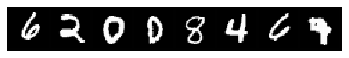

------------------
1
------------------
step 3999, loss 1.6382631063461304
Target:	 tensor([4, 5, 7, 6, 6, 7, 6, 8], device='cuda:0')
Pred:	 tensor([5, 0, 7, 8, 6, 7, 1, 8], device='cuda:0')


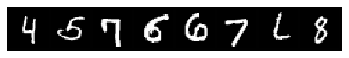

------------------
2
------------------
step 5999, loss 1.4053590297698975
Target:	 tensor([0, 0, 3, 9, 8, 3, 9, 9], device='cuda:0')
Pred:	 tensor([0, 0, 7, 9, 5, 3, 9, 9], device='cuda:0')


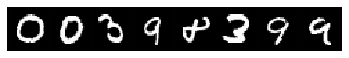

------------------
3
------------------
step 7999, loss 1.2453205585479736
Target:	 tensor([2, 6, 6, 0, 6, 0, 6, 2], device='cuda:0')
Pred:	 tensor([2, 6, 6, 0, 4, 4, 6, 3], device='cuda:0')


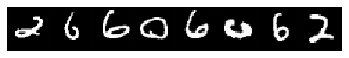

------------------
4
------------------
step 9999, loss 0.9650852084159851
Target:	 tensor([7, 8, 3, 5, 8, 3, 1, 8], device='cuda:0')
Pred:	 tensor([7, 5, 3, 5, 8, 3, 1, 0], device='cuda:0')


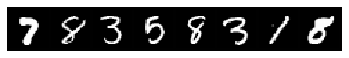

------------------
5
------------------
step 11999, loss 0.8419339060783386
Target:	 tensor([7, 7, 1, 9, 8, 1, 7, 1], device='cuda:0')
Pred:	 tensor([7, 7, 1, 9, 8, 1, 7, 1], device='cuda:0')


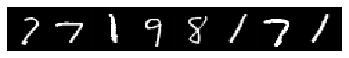

------------------
6
------------------
step 13999, loss 0.8283824324607849
Target:	 tensor([8, 6, 5, 6, 7, 1, 9, 9], device='cuda:0')
Pred:	 tensor([3, 6, 3, 6, 4, 1, 9, 9], device='cuda:0')


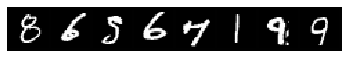

------------------
7
------------------
step 15999, loss 0.8559572100639343
Target:	 tensor([0, 8, 4, 0, 8, 1, 9, 6], device='cuda:0')
Pred:	 tensor([0, 8, 4, 0, 8, 1, 9, 6], device='cuda:0')


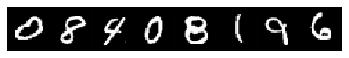

------------------
8
------------------
step 17999, loss 0.6203853487968445
Target:	 tensor([7, 7, 8, 3, 6, 0, 9, 5], device='cuda:0')
Pred:	 tensor([7, 7, 4, 3, 6, 0, 9, 5], device='cuda:0')


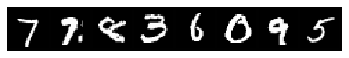

------------------
9
------------------
step 19999, loss 0.48413658142089844
Target:	 tensor([7, 7, 7, 5, 2, 0, 1, 1], device='cuda:0')
Pred:	 tensor([9, 7, 4, 5, 2, 0, 1, 1], device='cuda:0')


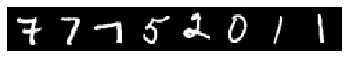

------------------
10
------------------
step 21999, loss 0.339885950088501
Target:	 tensor([0, 2, 7, 1, 6, 1, 4, 3], device='cuda:0')
Pred:	 tensor([0, 2, 7, 1, 6, 1, 4, 3], device='cuda:0')


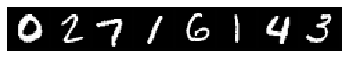

------------------
11
------------------
step 23999, loss 0.7644484043121338
Target:	 tensor([1, 7, 4, 8, 3, 2, 4, 7], device='cuda:0')
Pred:	 tensor([1, 7, 4, 8, 3, 2, 4, 7], device='cuda:0')


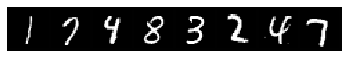

------------------
12
------------------
step 25999, loss 0.5580803155899048
Target:	 tensor([3, 3, 9, 9, 9, 0, 7, 8], device='cuda:0')
Pred:	 tensor([3, 3, 9, 1, 7, 0, 7, 8], device='cuda:0')


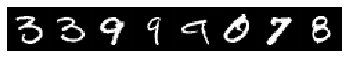

------------------
13
------------------
step 27999, loss 0.435683012008667
Target:	 tensor([6, 0, 1, 9, 6, 7, 9, 1], device='cuda:0')
Pred:	 tensor([6, 0, 1, 9, 6, 7, 3, 1], device='cuda:0')


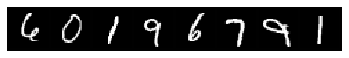

------------------
14
------------------
step 29999, loss 0.30705422163009644
Target:	 tensor([7, 2, 7, 6, 7, 3, 8, 4], device='cuda:0')
Pred:	 tensor([7, 2, 7, 6, 7, 3, 8, 4], device='cuda:0')


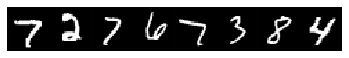

------------------
15
------------------
step 31999, loss 0.4640315771102905
Target:	 tensor([1, 4, 6, 2, 7, 4, 6, 1], device='cuda:0')
Pred:	 tensor([1, 4, 6, 2, 7, 4, 6, 1], device='cuda:0')


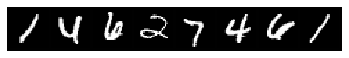

------------------
16
------------------
step 33999, loss 0.46474891901016235
Target:	 tensor([8, 2, 4, 6, 6, 7, 1, 6], device='cuda:0')
Pred:	 tensor([8, 2, 4, 0, 6, 0, 1, 6], device='cuda:0')


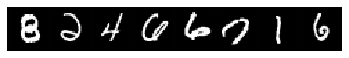

------------------
17
------------------
step 35999, loss 0.4294092655181885
Target:	 tensor([4, 9, 7, 3, 3, 3, 4, 7], device='cuda:0')
Pred:	 tensor([4, 9, 7, 3, 3, 3, 4, 7], device='cuda:0')


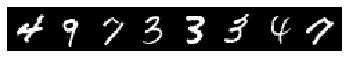

------------------
18
------------------
step 37999, loss 0.21822667121887207
Target:	 tensor([8, 4, 1, 6, 1, 7, 0, 1], device='cuda:0')
Pred:	 tensor([8, 4, 1, 6, 1, 7, 0, 1], device='cuda:0')


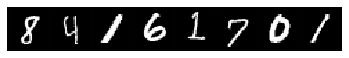

------------------
19
------------------
step 39999, loss 0.4434651732444763
Target:	 tensor([3, 9, 2, 6, 3, 2, 0, 1], device='cuda:0')
Pred:	 tensor([3, 1, 2, 6, 3, 2, 0, 1], device='cuda:0')


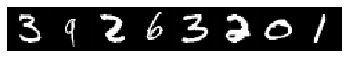

------------------
20
------------------
step 41999, loss 0.31227636337280273
Target:	 tensor([0, 4, 2, 1, 0, 8, 6, 9], device='cuda:0')
Pred:	 tensor([0, 4, 2, 1, 0, 8, 6, 9], device='cuda:0')


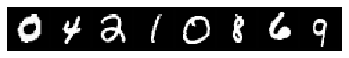

------------------
21
------------------
step 43999, loss 0.27131667733192444
Target:	 tensor([9, 6, 9, 8, 4, 5, 2, 5], device='cuda:0')
Pred:	 tensor([9, 6, 1, 8, 4, 5, 2, 5], device='cuda:0')


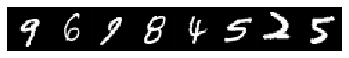

------------------
22
------------------
step 45999, loss 0.1953849047422409
Target:	 tensor([2, 3, 1, 9, 0, 4, 9, 9], device='cuda:0')
Pred:	 tensor([2, 3, 1, 4, 0, 4, 9, 9], device='cuda:0')


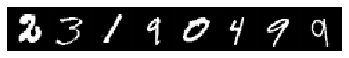

------------------
23
------------------
step 47999, loss 0.3442409038543701
Target:	 tensor([0, 9, 8, 3, 7, 5, 7, 1], device='cuda:0')
Pred:	 tensor([0, 9, 8, 3, 7, 5, 7, 1], device='cuda:0')


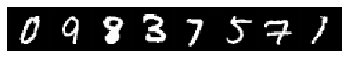

------------------
24
------------------
step 49999, loss 0.2199508398771286
Target:	 tensor([1, 9, 7, 5, 0, 7, 9, 9], device='cuda:0')
Pred:	 tensor([1, 3, 7, 5, 0, 7, 9, 9], device='cuda:0')


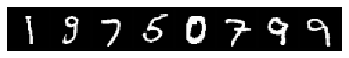

------------------
25
------------------
step 51999, loss 0.24868957698345184
Target:	 tensor([3, 0, 6, 1, 0, 9, 3, 2], device='cuda:0')
Pred:	 tensor([3, 0, 6, 1, 6, 9, 3, 2], device='cuda:0')


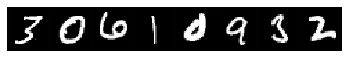

------------------
26
------------------
step 53999, loss 0.1392313838005066
Target:	 tensor([0, 1, 9, 9, 6, 2, 1, 6], device='cuda:0')
Pred:	 tensor([0, 1, 9, 9, 6, 2, 1, 6], device='cuda:0')


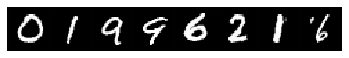

------------------
27
------------------
step 55999, loss 0.1804492473602295
Target:	 tensor([0, 1, 8, 1, 2, 2, 9, 1], device='cuda:0')
Pred:	 tensor([0, 1, 4, 1, 2, 2, 9, 1], device='cuda:0')


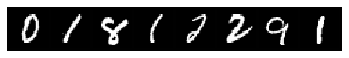

------------------
28
------------------
step 57999, loss 0.1313776671886444
Target:	 tensor([0, 5, 6, 9, 6, 1, 5, 3], device='cuda:0')
Pred:	 tensor([0, 5, 6, 9, 6, 1, 5, 3], device='cuda:0')


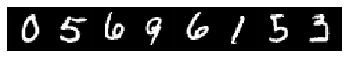

------------------
29
------------------
step 59999, loss 0.27490323781967163
Target:	 tensor([1, 5, 5, 7, 2, 4, 2, 4], device='cuda:0')
Pred:	 tensor([1, 5, 5, 2, 2, 4, 2, 4], device='cuda:0')


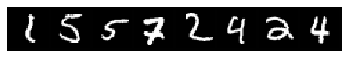

------------------
30
------------------
step 61999, loss 0.43481120467185974
Target:	 tensor([0, 5, 4, 9, 6, 8, 3, 5], device='cuda:0')
Pred:	 tensor([0, 5, 6, 7, 6, 8, 3, 3], device='cuda:0')


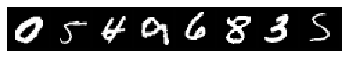

------------------
31
------------------
step 63999, loss 0.6295551657676697
Target:	 tensor([3, 6, 1, 2, 3, 2, 2, 9], device='cuda:0')
Pred:	 tensor([2, 6, 1, 2, 3, 2, 2, 9], device='cuda:0')


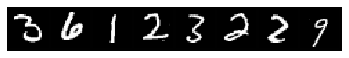

------------------
32
------------------
step 65999, loss 0.28196626901626587
Target:	 tensor([1, 7, 8, 9, 6, 3, 7, 7], device='cuda:0')
Pred:	 tensor([1, 7, 8, 9, 6, 3, 7, 7], device='cuda:0')


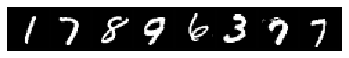

------------------
33
------------------
step 67999, loss 0.2243276685476303
Target:	 tensor([5, 4, 2, 3, 9, 2, 5, 3], device='cuda:0')
Pred:	 tensor([5, 4, 2, 3, 9, 2, 5, 3], device='cuda:0')


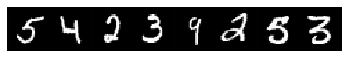

------------------
34
------------------
step 69999, loss 0.20751208066940308
Target:	 tensor([0, 1, 2, 2, 7, 0, 0, 5], device='cuda:0')
Pred:	 tensor([0, 7, 2, 2, 7, 0, 0, 5], device='cuda:0')


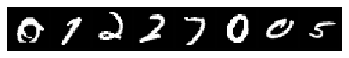

------------------
35
------------------
step 71999, loss 0.30306148529052734
Target:	 tensor([5, 9, 5, 7, 3, 5, 2, 6], device='cuda:0')
Pred:	 tensor([5, 9, 5, 7, 3, 5, 2, 6], device='cuda:0')


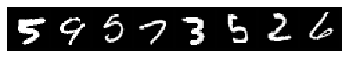

------------------
36
------------------
step 73999, loss 0.3964802622795105
Target:	 tensor([1, 2, 2, 0, 2, 5, 5, 9], device='cuda:0')
Pred:	 tensor([1, 2, 2, 0, 0, 5, 5, 9], device='cuda:0')


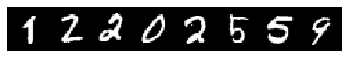

------------------
37
------------------
step 75999, loss 0.09494732320308685
Target:	 tensor([8, 6, 7, 1, 0, 9, 4, 8], device='cuda:0')
Pred:	 tensor([8, 6, 7, 1, 0, 9, 4, 8], device='cuda:0')


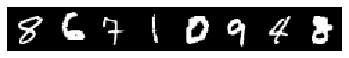

------------------
38
------------------
step 77999, loss 0.25398239493370056
Target:	 tensor([4, 1, 4, 6, 6, 6, 0, 7], device='cuda:0')
Pred:	 tensor([4, 1, 4, 6, 6, 0, 0, 7], device='cuda:0')


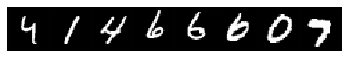

------------------
39
------------------
step 79999, loss 0.1694936454296112
Target:	 tensor([6, 1, 5, 8, 8, 7, 8, 5], device='cuda:0')
Pred:	 tensor([6, 1, 5, 8, 8, 7, 8, 5], device='cuda:0')


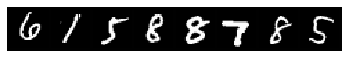

------------------
40
------------------
step 81999, loss 0.21768879890441895
Target:	 tensor([4, 2, 5, 7, 4, 1, 9, 6], device='cuda:0')
Pred:	 tensor([4, 2, 5, 7, 4, 1, 9, 6], device='cuda:0')


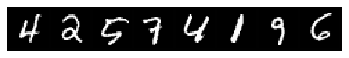

------------------
41
------------------
step 83999, loss 0.2553499639034271
Target:	 tensor([6, 6, 0, 5, 7, 5, 5, 1], device='cuda:0')
Pred:	 tensor([6, 6, 0, 5, 7, 5, 5, 1], device='cuda:0')


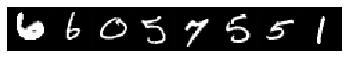

------------------
42
------------------
step 85999, loss 0.34266191720962524
Target:	 tensor([2, 1, 4, 2, 6, 1, 2, 6], device='cuda:0')
Pred:	 tensor([2, 1, 4, 2, 6, 1, 8, 1], device='cuda:0')


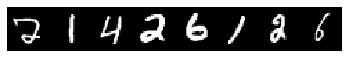

------------------
43
------------------
step 87999, loss 0.24888989329338074
Target:	 tensor([5, 0, 7, 0, 9, 8, 9, 0], device='cuda:0')
Pred:	 tensor([5, 0, 7, 0, 9, 8, 9, 0], device='cuda:0')


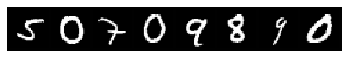

------------------
44
------------------
step 89999, loss 0.3032134771347046
Target:	 tensor([5, 9, 7, 6, 2, 7, 5, 1], device='cuda:0')
Pred:	 tensor([5, 9, 7, 6, 2, 7, 5, 1], device='cuda:0')


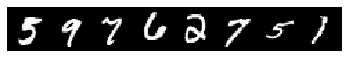

------------------
45
------------------
step 91999, loss 0.3065846562385559
Target:	 tensor([5, 9, 8, 8, 0, 5, 8, 1], device='cuda:0')
Pred:	 tensor([5, 9, 5, 8, 0, 5, 8, 1], device='cuda:0')


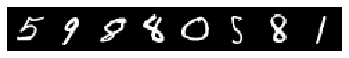

------------------
46
------------------
step 93999, loss 0.2171432077884674
Target:	 tensor([9, 3, 0, 3, 3, 5, 6, 9], device='cuda:0')
Pred:	 tensor([9, 3, 0, 0, 3, 5, 6, 9], device='cuda:0')


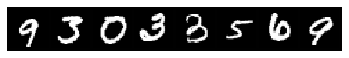

------------------
47
------------------
step 95999, loss 0.059096988290548325
Target:	 tensor([0, 8, 8, 7, 6, 5, 5, 0], device='cuda:0')
Pred:	 tensor([0, 8, 8, 7, 6, 5, 5, 0], device='cuda:0')


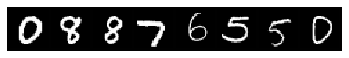

------------------
48
------------------
step 97999, loss 0.09368720650672913
Target:	 tensor([2, 6, 3, 6, 6, 7, 9, 9], device='cuda:0')
Pred:	 tensor([2, 6, 3, 6, 6, 7, 9, 9], device='cuda:0')


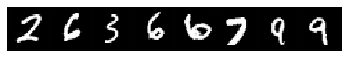

------------------
49
------------------
step 99999, loss 0.11780815571546555
Target:	 tensor([9, 4, 9, 8, 1, 1, 2, 5], device='cuda:0')
Pred:	 tensor([9, 4, 9, 8, 1, 1, 2, 5], device='cuda:0')


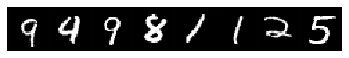

------------------
50
------------------
step 101999, loss 0.10110115259885788
Target:	 tensor([9, 6, 1, 1, 5, 3, 0, 2], device='cuda:0')
Pred:	 tensor([9, 6, 1, 1, 5, 3, 0, 2], device='cuda:0')


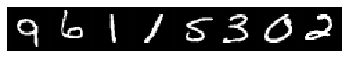

------------------
51
------------------
step 103999, loss 0.09198734164237976
Target:	 tensor([1, 2, 7, 8, 6, 7, 4, 6], device='cuda:0')
Pred:	 tensor([1, 2, 7, 8, 6, 7, 4, 6], device='cuda:0')


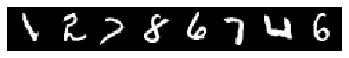

------------------
52
------------------
step 105999, loss 0.09612192958593369
Target:	 tensor([7, 3, 8, 9, 4, 0, 6, 6], device='cuda:0')
Pred:	 tensor([7, 3, 8, 9, 4, 0, 6, 6], device='cuda:0')


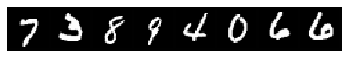

------------------
53
------------------
step 107999, loss 0.05798908323049545
Target:	 tensor([6, 7, 4, 1, 7, 5, 8, 2], device='cuda:0')
Pred:	 tensor([6, 7, 4, 1, 7, 5, 8, 2], device='cuda:0')


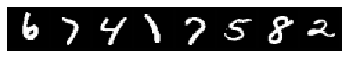

------------------
54
------------------
step 109999, loss 0.2473132312297821
Target:	 tensor([8, 0, 4, 0, 6, 4, 8, 5], device='cuda:0')
Pred:	 tensor([8, 0, 4, 0, 6, 4, 8, 5], device='cuda:0')


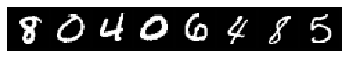

------------------
55
------------------
step 111999, loss 0.3366320729255676
Target:	 tensor([7, 5, 7, 7, 3, 1, 1, 2], device='cuda:0')
Pred:	 tensor([7, 5, 7, 2, 3, 1, 1, 8], device='cuda:0')


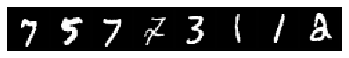

------------------
56
------------------
step 113999, loss 0.3365119695663452
Target:	 tensor([3, 1, 0, 9, 4, 8, 1, 3], device='cuda:0')
Pred:	 tensor([3, 1, 0, 9, 4, 8, 1, 9], device='cuda:0')


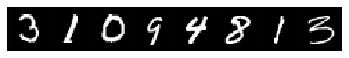

------------------
57
------------------
step 115999, loss 0.13216093182563782
Target:	 tensor([1, 9, 3, 1, 5, 2, 8, 1], device='cuda:0')
Pred:	 tensor([1, 9, 3, 1, 5, 2, 8, 1], device='cuda:0')


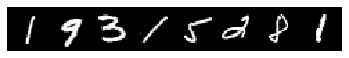

------------------
58
------------------
step 117999, loss 0.2897348999977112
Target:	 tensor([3, 1, 8, 0, 2, 1, 0, 4], device='cuda:0')
Pred:	 tensor([3, 1, 8, 0, 2, 1, 0, 4], device='cuda:0')


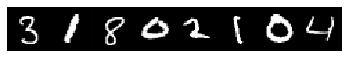

------------------
59
------------------
step 119999, loss 0.27578723430633545
Target:	 tensor([8, 3, 1, 0, 3, 2, 4, 7], device='cuda:0')
Pred:	 tensor([8, 3, 1, 0, 3, 7, 4, 7], device='cuda:0')


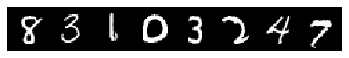

------------------
60
------------------
step 121999, loss 0.05585663765668869
Target:	 tensor([3, 7, 9, 8, 6, 6, 9, 4], device='cuda:0')
Pred:	 tensor([3, 7, 9, 8, 6, 6, 9, 4], device='cuda:0')


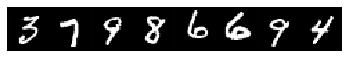

------------------
61
------------------
step 123999, loss 0.15147127211093903
Target:	 tensor([1, 1, 4, 7, 9, 2, 7, 5], device='cuda:0')
Pred:	 tensor([1, 1, 4, 7, 9, 2, 2, 5], device='cuda:0')


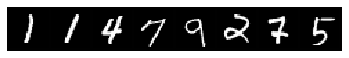

------------------
62
------------------
step 125999, loss 0.3893502950668335
Target:	 tensor([1, 4, 5, 1, 7, 5, 1, 0], device='cuda:0')
Pred:	 tensor([1, 4, 5, 1, 2, 5, 1, 0], device='cuda:0')


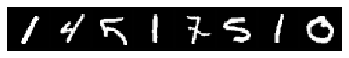

------------------
63
------------------
step 127999, loss 0.19163885712623596
Target:	 tensor([3, 1, 8, 1, 6, 3, 3, 8], device='cuda:0')
Pred:	 tensor([3, 1, 8, 1, 6, 3, 3, 8], device='cuda:0')


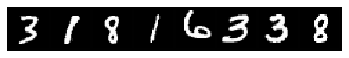

------------------
64
------------------
step 129999, loss 0.3605042099952698
Target:	 tensor([9, 2, 2, 0, 2, 5, 7, 0], device='cuda:0')
Pred:	 tensor([9, 2, 2, 0, 2, 5, 7, 0], device='cuda:0')


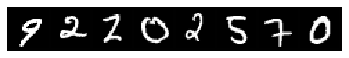

------------------
65
------------------
step 131999, loss 0.1612943410873413
Target:	 tensor([6, 9, 8, 6, 9, 6, 6, 4], device='cuda:0')
Pred:	 tensor([0, 9, 8, 6, 9, 6, 6, 4], device='cuda:0')


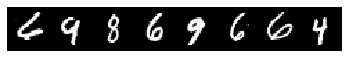

------------------
66
------------------
step 133999, loss 0.09004195034503937
Target:	 tensor([7, 5, 4, 6, 1, 6, 3, 1], device='cuda:0')
Pred:	 tensor([7, 5, 4, 0, 1, 6, 3, 1], device='cuda:0')


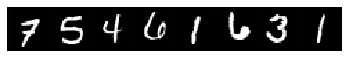

------------------
67
------------------
step 135999, loss 0.14387354254722595
Target:	 tensor([3, 4, 3, 9, 9, 5, 5, 0], device='cuda:0')
Pred:	 tensor([3, 4, 3, 9, 9, 5, 5, 0], device='cuda:0')


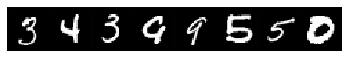

------------------
68
------------------
step 137999, loss 0.07000656425952911
Target:	 tensor([2, 7, 1, 8, 2, 7, 9, 6], device='cuda:0')
Pred:	 tensor([2, 7, 1, 8, 2, 7, 9, 6], device='cuda:0')


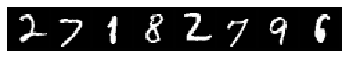

------------------
69
------------------
step 139999, loss 0.12495540827512741
Target:	 tensor([0, 2, 3, 3, 1, 6, 3, 5], device='cuda:0')
Pred:	 tensor([0, 2, 3, 3, 1, 6, 8, 5], device='cuda:0')


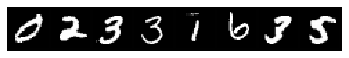

------------------
70
------------------
step 141999, loss 0.11935558170080185
Target:	 tensor([7, 7, 9, 0, 4, 2, 7, 9], device='cuda:0')
Pred:	 tensor([7, 7, 9, 0, 4, 2, 7, 9], device='cuda:0')


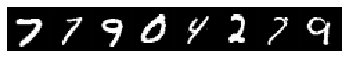

------------------
71
------------------
step 143999, loss 0.15279464423656464
Target:	 tensor([6, 1, 6, 2, 9, 3, 0, 3], device='cuda:0')
Pred:	 tensor([6, 1, 6, 2, 5, 3, 0, 3], device='cuda:0')


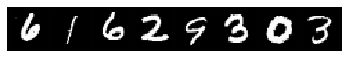

------------------
72
------------------
step 145999, loss 0.1601184904575348
Target:	 tensor([5, 8, 2, 2, 9, 7, 6, 1], device='cuda:0')
Pred:	 tensor([5, 8, 2, 2, 9, 7, 6, 1], device='cuda:0')


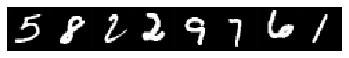

------------------
73
------------------
step 147999, loss 0.03664498031139374
Target:	 tensor([1, 1, 8, 4, 6, 6, 0, 1], device='cuda:0')
Pred:	 tensor([1, 1, 8, 4, 6, 6, 0, 1], device='cuda:0')


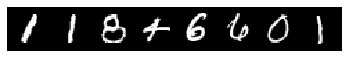

------------------
74
------------------
step 149999, loss 0.0921388566493988
Target:	 tensor([6, 9, 8, 9, 9, 0, 3, 2], device='cuda:0')
Pred:	 tensor([6, 9, 8, 9, 9, 0, 3, 2], device='cuda:0')


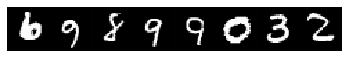

------------------
75
------------------
step 151999, loss 0.0280157383531332
Target:	 tensor([0, 7, 3, 7, 7, 2, 1, 1], device='cuda:0')
Pred:	 tensor([0, 7, 3, 7, 7, 2, 1, 1], device='cuda:0')


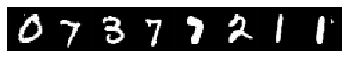

------------------
76
------------------
step 153999, loss 0.10737285017967224
Target:	 tensor([5, 9, 8, 0, 3, 5, 5, 6], device='cuda:0')
Pred:	 tensor([5, 9, 8, 0, 3, 5, 5, 6], device='cuda:0')


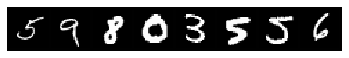

------------------
77
------------------
step 155999, loss 0.17705142498016357
Target:	 tensor([6, 9, 8, 6, 2, 1, 6, 2], device='cuda:0')
Pred:	 tensor([6, 9, 8, 6, 2, 1, 6, 2], device='cuda:0')


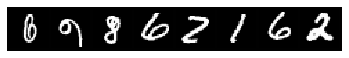

------------------
78
------------------
step 157999, loss 0.12265762686729431
Target:	 tensor([1, 1, 0, 3, 7, 8, 1, 5], device='cuda:0')
Pred:	 tensor([1, 1, 0, 3, 7, 8, 1, 5], device='cuda:0')


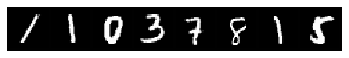

------------------
79
------------------
step 159999, loss 0.10020829737186432
Target:	 tensor([3, 3, 4, 9, 2, 9, 6, 2], device='cuda:0')
Pred:	 tensor([3, 3, 4, 9, 2, 9, 6, 2], device='cuda:0')


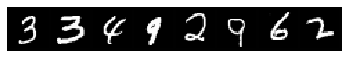

------------------
80
------------------
step 161999, loss 0.027911461889743805
Target:	 tensor([4, 1, 4, 0, 4, 5, 1, 4], device='cuda:0')
Pred:	 tensor([4, 1, 4, 0, 4, 5, 1, 4], device='cuda:0')


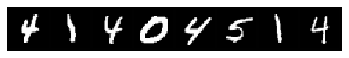

------------------
81
------------------
step 163999, loss 0.17092156410217285
Target:	 tensor([6, 6, 4, 2, 1, 9, 4, 6], device='cuda:0')
Pred:	 tensor([6, 6, 8, 2, 1, 9, 4, 6], device='cuda:0')


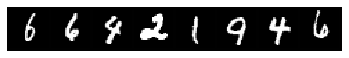

------------------
82
------------------
step 165999, loss 0.13728345930576324
Target:	 tensor([8, 9, 2, 9, 0, 8, 3, 0], device='cuda:0')
Pred:	 tensor([8, 9, 8, 9, 0, 8, 3, 0], device='cuda:0')


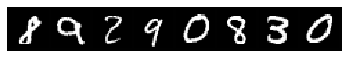

------------------
83
------------------
step 167999, loss 0.14997564256191254
Target:	 tensor([6, 4, 3, 5, 0, 8, 2, 3], device='cuda:0')
Pred:	 tensor([6, 4, 8, 5, 0, 8, 2, 3], device='cuda:0')


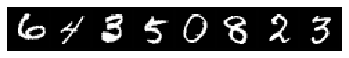

------------------
84
------------------
step 169999, loss 0.027778204530477524
Target:	 tensor([2, 2, 9, 7, 5, 3, 7, 9], device='cuda:0')
Pred:	 tensor([2, 2, 9, 7, 5, 3, 7, 9], device='cuda:0')


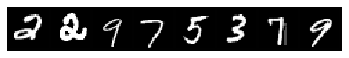

------------------
85
------------------
step 171999, loss 0.3166656196117401
Target:	 tensor([4, 9, 5, 2, 1, 7, 7, 9], device='cuda:0')
Pred:	 tensor([4, 9, 5, 2, 1, 3, 7, 9], device='cuda:0')


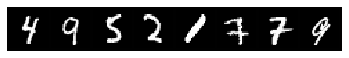

------------------
86
------------------
step 173999, loss 0.06733128428459167
Target:	 tensor([6, 6, 1, 0, 6, 8, 3, 3], device='cuda:0')
Pred:	 tensor([6, 6, 1, 0, 6, 8, 3, 3], device='cuda:0')


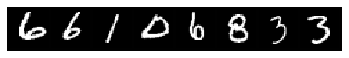

------------------
87
------------------
step 175999, loss 0.05946383625268936
Target:	 tensor([7, 2, 3, 9, 1, 6, 4, 6], device='cuda:0')
Pred:	 tensor([7, 2, 8, 9, 1, 6, 4, 6], device='cuda:0')


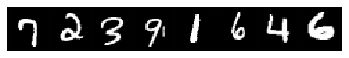

------------------
88
------------------
step 177999, loss 0.20921443402767181
Target:	 tensor([4, 4, 8, 1, 7, 1, 4, 3], device='cuda:0')
Pred:	 tensor([4, 4, 8, 1, 7, 1, 4, 3], device='cuda:0')


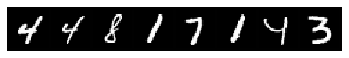

------------------
89
------------------
step 179999, loss 0.07985693216323853
Target:	 tensor([4, 8, 0, 3, 9, 5, 3, 0], device='cuda:0')
Pred:	 tensor([4, 8, 0, 3, 9, 5, 3, 0], device='cuda:0')


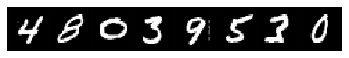

------------------
90
------------------
step 181999, loss 0.08488159626722336
Target:	 tensor([6, 3, 6, 7, 8, 1, 7, 6], device='cuda:0')
Pred:	 tensor([6, 3, 6, 7, 8, 1, 7, 6], device='cuda:0')


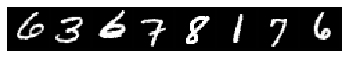

------------------
91
------------------
step 183999, loss 0.07043059170246124
Target:	 tensor([7, 8, 7, 6, 5, 9, 3, 4], device='cuda:0')
Pred:	 tensor([7, 8, 7, 6, 5, 9, 3, 4], device='cuda:0')


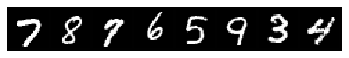

------------------
92
------------------
step 185999, loss 0.1825963705778122
Target:	 tensor([2, 1, 1, 8, 5, 4, 9, 9], device='cuda:0')
Pred:	 tensor([2, 1, 1, 8, 5, 4, 9, 9], device='cuda:0')


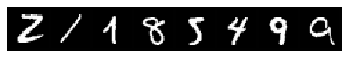

------------------
93
------------------
step 187999, loss 0.050571467727422714
Target:	 tensor([4, 2, 6, 1, 5, 3, 2, 3], device='cuda:0')
Pred:	 tensor([4, 2, 6, 1, 5, 3, 2, 3], device='cuda:0')


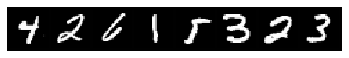

------------------
94
------------------
step 189999, loss 0.21832621097564697
Target:	 tensor([4, 1, 4, 3, 9, 7, 6, 9], device='cuda:0')
Pred:	 tensor([4, 1, 1, 3, 9, 7, 6, 9], device='cuda:0')


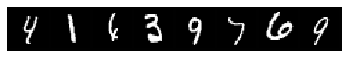

------------------
95
------------------
step 191999, loss 0.15387102961540222
Target:	 tensor([7, 3, 7, 7, 6, 6, 7, 0], device='cuda:0')
Pred:	 tensor([7, 3, 7, 7, 6, 6, 9, 0], device='cuda:0')


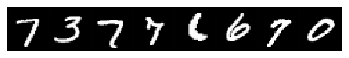

------------------
96
------------------
step 193999, loss 0.040337540209293365
Target:	 tensor([9, 0, 1, 9, 1, 2, 0, 7], device='cuda:0')
Pred:	 tensor([9, 0, 1, 9, 1, 2, 0, 7], device='cuda:0')


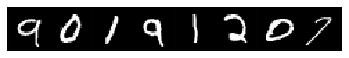

------------------
97
------------------
step 195999, loss 0.033323004841804504
Target:	 tensor([9, 4, 6, 7, 2, 2, 0, 5], device='cuda:0')
Pred:	 tensor([9, 4, 6, 7, 2, 2, 0, 5], device='cuda:0')


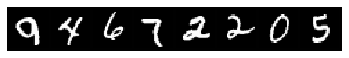

------------------
98
------------------
step 197999, loss 0.04868781566619873
Target:	 tensor([0, 3, 3, 0, 3, 7, 3, 4], device='cuda:0')
Pred:	 tensor([0, 3, 3, 0, 3, 7, 3, 4], device='cuda:0')


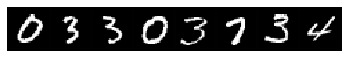

------------------
99
------------------
step 199999, loss 0.07024570554494858
Target:	 tensor([8, 5, 7, 1, 4, 5, 8, 1], device='cuda:0')
Pred:	 tensor([8, 5, 7, 1, 4, 5, 8, 1], device='cuda:0')


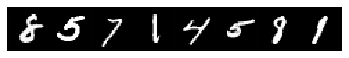

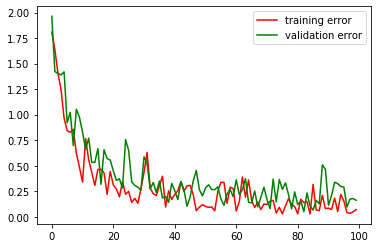

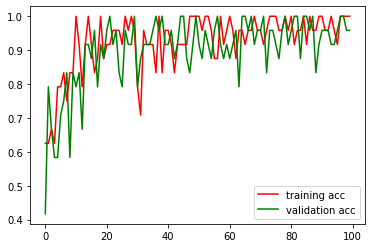

In [21]:
# learning rate, hyper-parameter
lr = 1e-4

# using GPU if it's availble
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#device = torch.device('cuda')

net = LeNetDropNorm(img_channel, device)

params=[p for p in net.parameters()]
for i,(n,p) in enumerate(net.named_parameters()):
    #print(n)
    if n=='c1.bias' or n=='c3.bias':
        fan_in, _ = init._calculate_fan_in_and_fan_out(params[i-1].data)
        bound = 1 / math.sqrt(fan_in)
        init.uniform_(p.data, -bound, bound)
    if 'weights' in n:
        stdv = 1. / math.sqrt(p.size(1))
        p.data.uniform_(-stdv, stdv)
    if 'f' in n and 'bias' in n:
        stdv = 1. / math.sqrt(params[i-1].size(1))
        p.data.uniform_(-stdv, stdv)

#print(net.c1.kernel)
# training epochs, hyper-parameter
epochs = 100

# keep tracking of the changing of loss and accuracy of predictions
train_loss_list = []
val_loss_list = []
train_acc_list = []
val_acc_list = []

# the printing frequency, feel free to change this
print_interval = 50
for e in range(epochs):
  net.train()
  print('------------------')
  print(e)
  print('------------------')
        
  for i, (imgs, lbs) in enumerate(train_dl):
    imgs = imgs.to(device)
    lbs = lbs.to(device)
    # print('labels')
    # print(lbs)
    loss, prob = net.forward(imgs, lbs,training=True)

    # print('loss')
    # print(loss)
    # print('prob')
    # print(prob)

    net.zero_grad()
    grad = torch.autograd.grad(loss, [p for p in net.parameters()])
    
    
    # update weights
    step([p for p in net.parameters()], grad, lr)
    
    # obtain the predictions
    pred = prob.argmax(dim=-1).view(batch_size)
    acc = (pred == lbs).float().mean()
    
    
    
    
      
  train_loss_list.append(loss.detach().mean())
  train_acc_list.append(acc.detach().mean())
  
  print("step {}, loss {}".format(i + e*len(train_dl), loss))
  print("Target:\t {}\nPred:\t {}".format(lbs[:8], pred[:8]))
  # visualize some samples
  imgs_to_vis = vutils.make_grid(imgs[:8].cpu()+125., nrow=8, pad_value=1)
  plt.imshow(imgs_to_vis.permute(1,2,0).numpy().astype(np.uint8))
  plt.axis("off")
  plt.show()

  net.eval()
  for i, (imgs, lbs) in enumerate(val_dl):
    imgs = imgs.to(device)
    lbs = lbs.to(device)
    loss, prob = net(imgs, lbs,training=False)
    
    pred = prob.argmax(dim=-1).view(batch_size)
    acc = (pred == lbs).float().mean()
    
  val_loss_list.append(loss.detach().mean())
  val_acc_list.append(acc.detach().mean())
  

# ploting logs
plt.plot(np.arange(epochs), train_loss_list, '-r',
         np.arange(epochs), val_loss_list, '-g')
plt.legend(('training error', 'validation error'))
plt.show()
plt.plot(np.arange(epochs), train_acc_list, '-r',
         np.arange(epochs), val_acc_list, '-g')
plt.legend(('training acc', 'validation acc'))
plt.show()

## Submission

- Make sure you have finished all the required implementation tasks.
- Check your codes and make sure the result in each section could be reproducible.
- Upload the Jupyter file with all required figures plotted.
- Upload a pdf version of this Jupyter note. You can first download a html file by clicking on the Jupyter menu bar: File --> Download as --> HTML (.html). Then open the html file and convert it into a pdf file with your browser.